In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F 
import torch.autograd
from torch.autograd import Variable
import torch.optim as optim
import numpy as np
import gym
from collections import deque
import random
import sys
import pandas as pd
import matplotlib.pyplot as plt
from numpy import cos, sin
from gym import spaces
from gym.error import DependencyNotInstalled
from typing import Optional
from control.matlab import ss, lsim, linspace, c2d
from functools import partial
from state_estimation import Estimator
import math
import gym
from stable_baselines3 import PPO, SAC, TD3, DDPG, DQN, A2C
from stable_baselines3.common.env_checker import check_env
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

In [10]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [11]:
# define CSTR model
def ac(x,t,u, params={}):
    xdot =np.zeros(6)
    w_1 = x[0]
    w_2 = x[1]
    w_3 = x[2]
    psi_1 = x[3]
    psi_2 = x[4]
    psi_3 = x[5]
    xdot[0] = 0.25*(u[0]+w_2*w_3)
    xdot[1] = 0.5*(u[1]-3*w_1*w_3)
    xdot[2] = u[2]+2*w_1*w_2
    xdot[3] = 0.5*(w_2*(psi_1**2+psi_2**2+psi_3**2-psi_3)+w_3*(psi_1**2+psi_2**2+psi_3**2+psi_2)+w_1*(psi_1**2+psi_2**2+psi_3**2+1))
    xdot[4] = 0.5*(w_1*(psi_1**2+psi_2**2+psi_3**2+psi_3)+w_3*(psi_1**2+psi_2**2+psi_3**2-psi_1)+w_2*(psi_1**2+psi_2**2+psi_3**2+1))
    xdot[5] = 0.5*(w_1*(psi_1**2+psi_2**2+psi_3**2-psi_2)+w_2*(psi_1**2+psi_2**2+psi_3**2+psi_1)+w_3*(psi_1**2+psi_2**2+psi_3**2+1))
    return xdot

In [12]:
def controller(x):
    u = np.ones(3)
    w_1 = x[0]
    w_2 = x[1]
    w_3 = x[2]
    psi_1 = x[3]
    psi_2 = x[4]
    psi_3 = x[5]
    u[0] = -0.49*psi_1**3-0.86*w_1**3-1.2*w_1*psi_1**2-1.5*w_1*psi_2**2-1.1*w_1*psi_3**2+0.37*w_1**2*psi_1-2.6*w_1-0.77*psi_1+0.035*w_2*psi_1*psi_2
    u[1] = -0.28*psi_2**3-0.29*w_2**3-0.27*w_2*psi_1**2+0.17*w_2**2*psi_2-0.37*psi_1**2*psi_2-0.69*w_2*psi_2**2-1.1*w_2*psi_3**2-0.45*psi_2*psi_3**2-1.1*w_1**2*w_2-0.44*w_1*psi_1*psi_2-0.46*psi_2-1.1*w_2+0.24*w_1*w_2*psi_1
    u[2] = -0.14*psi_3**3-0.18*w_3**3-0.44*w_1**2*w_3-0.34*w_2**2*w_3-0.55*w_3*psi_2**2+0.11*w_1**2*psi_3+0.052*w_3**2*psi_3-0.18*psi_1**2*psi_3-0.039*psi_2**2*psi_3-0.2*w_2**2*psi_3-0.38*w_3*psi_3**2+0.4*w_2*w_3*psi_2+0.37*w_1*w_3*psi_1+0.43*w_2*psi_2*psi_3-0.69*w_3-0.35*psi_3

    return u

In [13]:
class acEnv(gym.Env):
    """Custom Environment that follows gym interface."""

    metadata = {"render.modes": ["human"]}

    def __init__(self, render_mode: Optional[str] = None, g=10.0):
        super(acEnv).__init__()
        # Define action and observation space
        # They must be gym.spaces objects
        # Example when using discrete actions:
        ob_high = np.ones(6)
        action_high = np.ones(3)*3
        self.action_space = spaces.Box(low=-action_high, high=action_high, dtype=np.float32)
        self.observation_space = spaces.Box(low=-ob_high, high=ob_high, dtype=np.float32)
        self.step_const = 20
        self.freq = 0.1
        self.steps = 0
        self.center = [0,0,0,0,0,0]
        self.obstacle = [0,0,0.2,0,0,0]
        self.reward_cache = [] # cache distances to target norm ball center
        self.final_reward_cache = [] # cache final reward
        self.state = np.random.rand(6)*2-1
        self.horizon = np.arange(0, self.step_const+2, 1)*0.1
        self.target_norm_radius = 0.8
        self.safe_norm_radius = 0.3
        self.max_reward_list = []
        self.quality_list = []
        self.total_steps = 0
        self.step_history = []
        self.k = 20
    def step(self, action):
        terminated = False
        ts = [self.horizon[self.steps], self.horizon[self.steps+1] ]
        self.state = odeint(ac, self.state, ts, args=(action,))[-1]
        dist = np.linalg.norm(self.state - self.center)
        obs_dist = np.linalg.norm(self.state - self.obstacle)
        reward = self.target_norm_radius - dist
        self.reward_cache.append(reward)
        self.steps += 1
        self.total_steps +=1 
        # quantitative semantics
        # reach reward, encourage reaching target
        if self.steps < 10:
            reach_reward = max(self.reward_cache)
        else:
            reach_reward = max(self.reward_cache[-10:])
        final_reward = reach_reward

#         if dist <= self.target_norm_radius:
#             final_reward = 10
        self.final_reward_cache.append(final_reward)
        if self.steps == self.step_const or max(np.absolute(self.state))>5 or obs_dist<=self.safe_norm_radius:
            self.max_reward_list.append(max(self.final_reward_cache)) # use max final reward to measure episodes
            self.step_history.append(self.total_steps)
            self.quality_list.append(sum(self.final_reward_cache))
            terminated = True
            self.reset()

        # Return next state, reward, done, info
        return self.state, final_reward, terminated, {}

    def reset(self):
        self.steps = 0
        self.state = np.random.rand(6)*2-1
        self.reward_cache = []
        self.step_const = self.k
        self.horizon = np.arange(0, self.step_const+2, 1)*0.1
        self.final_reward_cache = []
        return self.state  # reward, done, info can't be included

    def render(self, mode="human"):
        return

    def close(self):
        if self.screen is not None:
            import pygame
            pygame.display.quit()
            pygame.quit()
            self.isopen = False

In [16]:
reached = []
for k in [20,40,80,160]:
    env = acEnv()
    env.k = k
    print('Start training with PPO ...')
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    vec_env = model.get_env()
    obs = vec_env.reset()
    env = acEnv()
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    dims3 = []
    dims4 = []
    dims5 = []
    euclids = []
    center = [0,0,0,0,0,0]
    obstacle = [0,0,0.2,0,0,0]
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        dim3 = []
        dim4 = []
        dim5 = []
        euclid = []
        state = env.reset()
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dim3.append(state[3])
            dim4.append(state[4])
            dim5.append(state[5])
            dist = np.linalg.norm(new_state-center)
            obs_dist = np.linalg.norm(new_state-obstacle)   
            euclid.append(dist)
            state = new_state
            if obs_dist <= 0.3:
                break
            if dist <= 0.8: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        dims3.append(dim3)
        dims4.append(dim4)
        dims5.append(dim5)
        euclids.append(euclid)
    reached.append(num_reached)

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.5     |
|    ep_rew_mean     | -11.9    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 745      |
|    time_elapsed    | 0        |
|    total_timesteps | 58       |
---------------------------------


C:\Users\Mengyu\AppData\Roaming\Python\Python39\site-packages\gym\spaces\box.py:73: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(
D:\2022_conda\lib\site-packages\scipy\integrate\odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15       |
|    ep_rew_mean     | -9.9     |
| time/              |          |
|    episodes        | 8        |
|    fps             | 322      |
|    time_elapsed    | 0        |
|    total_timesteps | 120      |
| train/             |          |
|    actor_loss      | -2.99    |
|    critic_loss     | 0.626    |
|    ent_coef        | 0.995    |
|    ent_coef_loss   | -0.0272  |
|    learning_rate   | 0.0003   |
|    n_updates       | 19       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -9.16    |
| time/              |          |
|    episodes        | 12       |
|    fps             | 149      |
|    time_elapsed    | 1        |
|    total_timesteps | 193      |
| train/             |          |
|    actor_loss      | -3.44    |
|    critic_loss     | 0.311    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -9.83    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 84       |
|    time_elapsed    | 13       |
|    total_timesteps | 1124     |
| train/             |          |
|    actor_loss      | -5.6     |
|    critic_loss     | 0.287    |
|    ent_coef        | 0.736    |
|    ent_coef_loss   | -1.53    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1023     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -9.84    |
| time/              |          |
|    episodes        | 72       |
|    fps             | 84       |
|    time_elapsed    | 14       |
|    total_timesteps | 1201     |
| train/             |          |
|    actor_loss      | -5.65    |
|    critic_loss     | 0.319    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -9.1     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 80       |
|    time_elapsed    | 27       |
|    total_timesteps | 2186     |
| train/             |          |
|    actor_loss      | -5.95    |
|    critic_loss     | 0.347    |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | -2.97    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2085     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -9.1     |
| time/              |          |
|    episodes        | 132      |
|    fps             | 79       |
|    time_elapsed    | 28       |
|    total_timesteps | 2266     |
| train/             |          |
|    actor_loss      | -5.98    |
|    critic_loss     | 1.33     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.3     |
|    ep_rew_mean     | -7.82    |
| time/              |          |
|    episodes        | 188      |
|    fps             | 78       |
|    time_elapsed    | 42       |
|    total_timesteps | 3347     |
| train/             |          |
|    actor_loss      | -5.48    |
|    critic_loss     | 1.02     |
|    ent_coef        | 0.384    |
|    ent_coef_loss   | -4.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3246     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.6     |
|    ep_rew_mean     | -8.2     |
| time/              |          |
|    episodes        | 192      |
|    fps             | 78       |
|    time_elapsed    | 43       |
|    total_timesteps | 3427     |
| train/             |          |
|    actor_loss      | -5.3     |
|    critic_loss     | 2        |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.4     |
|    ep_rew_mean     | -7.5     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 77       |
|    time_elapsed    | 57       |
|    total_timesteps | 4502     |
| train/             |          |
|    actor_loss      | -5.1     |
|    critic_loss     | 1.6      |
|    ent_coef        | 0.277    |
|    ent_coef_loss   | -5.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4401     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.4     |
|    ep_rew_mean     | -7.56    |
| time/              |          |
|    episodes        | 252      |
|    fps             | 77       |
|    time_elapsed    | 58       |
|    total_timesteps | 4582     |
| train/             |          |
|    actor_loss      | -4.58    |
|    critic_loss     | 1.94     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | -4.9     |
| time/              |          |
|    episodes        | 308      |
|    fps             | 77       |
|    time_elapsed    | 73       |
|    total_timesteps | 5693     |
| train/             |          |
|    actor_loss      | -3.39    |
|    critic_loss     | 2.25     |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -5.77    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5592     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | -4.74    |
| time/              |          |
|    episodes        | 312      |
|    fps             | 77       |
|    time_elapsed    | 74       |
|    total_timesteps | 5773     |
| train/             |          |
|    actor_loss      | -3.94    |
|    critic_loss     | 1.94     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.1     |
|    ep_rew_mean     | -3.75    |
| time/              |          |
|    episodes        | 368      |
|    fps             | 77       |
|    time_elapsed    | 88       |
|    total_timesteps | 6812     |
| train/             |          |
|    actor_loss      | -3.64    |
|    critic_loss     | 1.98     |
|    ent_coef        | 0.149    |
|    ent_coef_loss   | -6.54    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6711     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.1     |
|    ep_rew_mean     | -3.89    |
| time/              |          |
|    episodes        | 372      |
|    fps             | 77       |
|    time_elapsed    | 89       |
|    total_timesteps | 6890     |
| train/             |          |
|    actor_loss      | -3.43    |
|    critic_loss     | 1.77     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.9     |
|    ep_rew_mean     | -3.83    |
| time/              |          |
|    episodes        | 428      |
|    fps             | 77       |
|    time_elapsed    | 103      |
|    total_timesteps | 7944     |
| train/             |          |
|    actor_loss      | -2.61    |
|    critic_loss     | 0.633    |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | -6.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7843     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.9     |
|    ep_rew_mean     | -3.93    |
| time/              |          |
|    episodes        | 432      |
|    fps             | 77       |
|    time_elapsed    | 104      |
|    total_timesteps | 8015     |
| train/             |          |
|    actor_loss      | -2.58    |
|    critic_loss     | 0.554    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.9     |
|    ep_rew_mean     | -4.04    |
| time/              |          |
|    episodes        | 488      |
|    fps             | 74       |
|    time_elapsed    | 121      |
|    total_timesteps | 9090     |
| train/             |          |
|    actor_loss      | -1.63    |
|    critic_loss     | 0.808    |
|    ent_coef        | 0.0799   |
|    ent_coef_loss   | -6.56    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8989     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.1     |
|    ep_rew_mean     | -3.76    |
| time/              |          |
|    episodes        | 492      |
|    fps             | 74       |
|    time_elapsed    | 122      |
|    total_timesteps | 9170     |
| train/             |          |
|    actor_loss      | -1.4     |
|    critic_loss     | 0.541    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19       |
|    ep_rew_mean     | -3.83    |
| time/              |          |
|    episodes        | 548      |
|    fps             | 73       |
|    time_elapsed    | 139      |
|    total_timesteps | 10219    |
| train/             |          |
|    actor_loss      | -0.814   |
|    critic_loss     | 0.615    |
|    ent_coef        | 0.0588   |
|    ent_coef_loss   | -6.93    |
|    learning_rate   | 0.0003   |
|    n_updates       | 10118    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.9     |
|    ep_rew_mean     | -3.86    |
| time/              |          |
|    episodes        | 552      |
|    fps             | 73       |
|    time_elapsed    | 140      |
|    total_timesteps | 10274    |
| train/             |          |
|    actor_loss      | -0.824   |
|    critic_loss     | 0.884    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.1     |
|    ep_rew_mean     | -3.13    |
| time/              |          |
|    episodes        | 608      |
|    fps             | 72       |
|    time_elapsed    | 157      |
|    total_timesteps | 11372    |
| train/             |          |
|    actor_loss      | -0.522   |
|    critic_loss     | 0.595    |
|    ent_coef        | 0.0436   |
|    ent_coef_loss   | -5.95    |
|    learning_rate   | 0.0003   |
|    n_updates       | 11271    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.1     |
|    ep_rew_mean     | -3.07    |
| time/              |          |
|    episodes        | 612      |
|    fps             | 72       |
|    time_elapsed    | 158      |
|    total_timesteps | 11452    |
| train/             |          |
|    actor_loss      | -0.79    |
|    critic_loss     | 0.46     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.4     |
|    ep_rew_mean     | -3.37    |
| time/              |          |
|    episodes        | 668      |
|    fps             | 72       |
|    time_elapsed    | 172      |
|    total_timesteps | 12433    |
| train/             |          |
|    actor_loss      | 0.0818   |
|    critic_loss     | 0.406    |
|    ent_coef        | 0.0336   |
|    ent_coef_loss   | -5.23    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12332    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.3     |
|    ep_rew_mean     | -3.2     |
| time/              |          |
|    episodes        | 672      |
|    fps             | 72       |
|    time_elapsed    | 173      |
|    total_timesteps | 12502    |
| train/             |          |
|    actor_loss      | -0.485   |
|    critic_loss     | 0.36     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.3     |
|    ep_rew_mean     | -3.41    |
| time/              |          |
|    episodes        | 728      |
|    fps             | 71       |
|    time_elapsed    | 188      |
|    total_timesteps | 13546    |
| train/             |          |
|    actor_loss      | -0.225   |
|    critic_loss     | 0.27     |
|    ent_coef        | 0.0257   |
|    ent_coef_loss   | -4.24    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13445    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.2     |
|    ep_rew_mean     | -3.5     |
| time/              |          |
|    episodes        | 732      |
|    fps             | 71       |
|    time_elapsed    | 189      |
|    total_timesteps | 13617    |
| train/             |          |
|    actor_loss      | -0.0249  |
|    critic_loss     | 0.378    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.2     |
|    ep_rew_mean     | -3.26    |
| time/              |          |
|    episodes        | 788      |
|    fps             | 71       |
|    time_elapsed    | 203      |
|    total_timesteps | 14632    |
| train/             |          |
|    actor_loss      | -0.216   |
|    critic_loss     | 0.53     |
|    ent_coef        | 0.0203   |
|    ent_coef_loss   | -3.67    |
|    learning_rate   | 0.0003   |
|    n_updates       | 14531    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -3.07    |
| time/              |          |
|    episodes        | 792      |
|    fps             | 71       |
|    time_elapsed    | 204      |
|    total_timesteps | 14687    |
| train/             |          |
|    actor_loss      | 0.126    |
|    critic_loss     | 0.385    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -3.3     |
| time/              |          |
|    episodes        | 848      |
|    fps             | 71       |
|    time_elapsed    | 218      |
|    total_timesteps | 15666    |
| train/             |          |
|    actor_loss      | -0.0102  |
|    critic_loss     | 0.426    |
|    ent_coef        | 0.0168   |
|    ent_coef_loss   | -2.2     |
|    learning_rate   | 0.0003   |
|    n_updates       | 15565    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -3.3     |
| time/              |          |
|    episodes        | 852      |
|    fps             | 71       |
|    time_elapsed    | 219      |
|    total_timesteps | 15732    |
| train/             |          |
|    actor_loss      | -0.474   |
|    critic_loss     | 0.656    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.3     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 908      |
|    fps             | 71       |
|    time_elapsed    | 234      |
|    total_timesteps | 16772    |
| train/             |          |
|    actor_loss      | -0.263   |
|    critic_loss     | 0.478    |
|    ent_coef        | 0.0144   |
|    ent_coef_loss   | -0.797   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16671    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 912      |
|    fps             | 71       |
|    time_elapsed    | 235      |
|    total_timesteps | 16822    |
| train/             |          |
|    actor_loss      | 0.279    |
|    critic_loss     | 0.22     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 968      |
|    fps             | 71       |
|    time_elapsed    | 249      |
|    total_timesteps | 17807    |
| train/             |          |
|    actor_loss      | -0.223   |
|    critic_loss     | 0.31     |
|    ent_coef        | 0.0133   |
|    ent_coef_loss   | 0.0445   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17706    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 972      |
|    fps             | 71       |
|    time_elapsed    | 250      |
|    total_timesteps | 17864    |
| train/             |          |
|    actor_loss      | 0.0472   |
|    critic_loss     | 0.278    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 71       |
|    time_elapsed    | 264      |
|    total_timesteps | 18912    |
| train/             |          |
|    actor_loss      | 0.241    |
|    critic_loss     | 0.311    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | -0.096   |
|    learning_rate   | 0.0003   |
|    n_updates       | 18811    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 1032     |
|    fps             | 71       |
|    time_elapsed    | 265      |
|    total_timesteps | 18986    |
| train/             |          |
|    actor_loss      | -0.0879  |
|    critic_loss     | 0.328    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 71       |
|    time_elapsed    | 279      |
|    total_timesteps | 19937    |
| train/             |          |
|    actor_loss      | 0.221    |
|    critic_loss     | 0.364    |
|    ent_coef        | 0.0128   |
|    ent_coef_loss   | -0.844   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19836    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 1092     |
|    fps             | 71       |
|    time_elapsed    | 280      |
|    total_timesteps | 19991    |
| train/             |          |
|    actor_loss      | 0.45     |
|    critic_loss     | 0.427    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.85    |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 70       |
|    time_elapsed    | 295      |
|    total_timesteps | 20913    |
| train/             |          |
|    actor_loss      | 0.0767   |
|    critic_loss     | 0.53     |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | -1.57    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20812    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.76    |
| time/              |          |
|    episodes        | 1152     |
|    fps             | 70       |
|    time_elapsed    | 296      |
|    total_timesteps | 20986    |
| train/             |          |
|    actor_loss      | -0.17    |
|    critic_loss     | 0.319    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 70       |
|    time_elapsed    | 311      |
|    total_timesteps | 22034    |
| train/             |          |
|    actor_loss      | 0.215    |
|    critic_loss     | 0.322    |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | 0.625    |
|    learning_rate   | 0.0003   |
|    n_updates       | 21933    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 1212     |
|    fps             | 70       |
|    time_elapsed    | 312      |
|    total_timesteps | 22114    |
| train/             |          |
|    actor_loss      | 0.125    |
|    critic_loss     | 0.287    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.5     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 70       |
|    time_elapsed    | 327      |
|    total_timesteps | 23130    |
| train/             |          |
|    actor_loss      | -0.579   |
|    critic_loss     | 0.496    |
|    ent_coef        | 0.013    |
|    ent_coef_loss   | 1.34     |
|    learning_rate   | 0.0003   |
|    n_updates       | 23029    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.4     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 1272     |
|    fps             | 70       |
|    time_elapsed    | 328      |
|    total_timesteps | 23201    |
| train/             |          |
|    actor_loss      | 0.0173   |
|    critic_loss     | 0.549    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.6     |
|    ep_rew_mean     | -1.64    |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 70       |
|    time_elapsed    | 343      |
|    total_timesteps | 24225    |
| train/             |          |
|    actor_loss      | -0.232   |
|    critic_loss     | 0.368    |
|    ent_coef        | 0.013    |
|    ent_coef_loss   | 0.216    |
|    learning_rate   | 0.0003   |
|    n_updates       | 24124    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.5     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 1332     |
|    fps             | 70       |
|    time_elapsed    | 344      |
|    total_timesteps | 24294    |
| train/             |          |
|    actor_loss      | -0.0828  |
|    critic_loss     | 0.428    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 70       |
|    time_elapsed    | 358      |
|    total_timesteps | 25261    |
| train/             |          |
|    actor_loss      | -0.102   |
|    critic_loss     | 0.358    |
|    ent_coef        | 0.0132   |
|    ent_coef_loss   | 1.53     |
|    learning_rate   | 0.0003   |
|    n_updates       | 25160    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 1392     |
|    fps             | 70       |
|    time_elapsed    | 359      |
|    total_timesteps | 25320    |
| train/             |          |
|    actor_loss      | 0.00933  |
|    critic_loss     | 0.279    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -3.39    |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 70       |
|    time_elapsed    | 373      |
|    total_timesteps | 26290    |
| train/             |          |
|    actor_loss      | -0.438   |
|    critic_loss     | 0.457    |
|    ent_coef        | 0.0129   |
|    ent_coef_loss   | 0.0681   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26189    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -3.21    |
| time/              |          |
|    episodes        | 1452     |
|    fps             | 70       |
|    time_elapsed    | 374      |
|    total_timesteps | 26324    |
| train/             |          |
|    actor_loss      | -0.201   |
|    critic_loss     | 0.303    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 70       |
|    time_elapsed    | 389      |
|    total_timesteps | 27348    |
| train/             |          |
|    actor_loss      | -0.0887  |
|    critic_loss     | 0.246    |
|    ent_coef        | 0.0125   |
|    ent_coef_loss   | -0.362   |
|    learning_rate   | 0.0003   |
|    n_updates       | 27247    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 1512     |
|    fps             | 70       |
|    time_elapsed    | 390      |
|    total_timesteps | 27423    |
| train/             |          |
|    actor_loss      | -0.509   |
|    critic_loss     | 0.383    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.2     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 70       |
|    time_elapsed    | 405      |
|    total_timesteps | 28441    |
| train/             |          |
|    actor_loss      | 0.352    |
|    critic_loss     | 0.292    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | 0.817    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28340    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.3     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 1572     |
|    fps             | 70       |
|    time_elapsed    | 406      |
|    total_timesteps | 28517    |
| train/             |          |
|    actor_loss      | -0.174   |
|    critic_loss     | 0.273    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 70       |
|    time_elapsed    | 421      |
|    total_timesteps | 29512    |
| train/             |          |
|    actor_loss      | -0.0635  |
|    critic_loss     | 0.339    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | -0.581   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29411    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.2     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 1632     |
|    fps             | 70       |
|    time_elapsed    | 422      |
|    total_timesteps | 29592    |
| train/             |          |
|    actor_loss      | -0.188   |
|    critic_loss     | 0.331    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 70       |
|    time_elapsed    | 434      |
|    total_timesteps | 30455    |
| train/             |          |
|    actor_loss      | -0.139   |
|    critic_loss     | 0.342    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -0.244   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30354    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 1692     |
|    fps             | 70       |
|    time_elapsed    | 435      |
|    total_timesteps | 30519    |
| train/             |          |
|    actor_loss      | 0.103    |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.83    |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 69       |
|    time_elapsed    | 449      |
|    total_timesteps | 31477    |
| train/             |          |
|    actor_loss      | -0.0695  |
|    critic_loss     | 0.391    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | -0.0381  |
|    learning_rate   | 0.0003   |
|    n_updates       | 31376    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 1752     |
|    fps             | 69       |
|    time_elapsed    | 450      |
|    total_timesteps | 31545    |
| train/             |          |
|    actor_loss      | -0.0673  |
|    critic_loss     | 0.304    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.64    |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 69       |
|    time_elapsed    | 466      |
|    total_timesteps | 32594    |
| train/             |          |
|    actor_loss      | 0.552    |
|    critic_loss     | 0.237    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.499    |
|    learning_rate   | 0.0003   |
|    n_updates       | 32493    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 1812     |
|    fps             | 69       |
|    time_elapsed    | 467      |
|    total_timesteps | 32644    |
| train/             |          |
|    actor_loss      | -0.226   |
|    critic_loss     | 0.227    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 69       |
|    time_elapsed    | 480      |
|    total_timesteps | 33528    |
| train/             |          |
|    actor_loss      | 0.284    |
|    critic_loss     | 0.211    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.379   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33427    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 1872     |
|    fps             | 69       |
|    time_elapsed    | 481      |
|    total_timesteps | 33605    |
| train/             |          |
|    actor_loss      | 0.0635   |
|    critic_loss     | 0.33     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 69       |
|    time_elapsed    | 495      |
|    total_timesteps | 34554    |
| train/             |          |
|    actor_loss      | 0.0623   |
|    critic_loss     | 0.336    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 1.67     |
|    learning_rate   | 0.0003   |
|    n_updates       | 34453    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 1932     |
|    fps             | 69       |
|    time_elapsed    | 496      |
|    total_timesteps | 34614    |
| train/             |          |
|    actor_loss      | 0.0438   |
|    critic_loss     | 0.392    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 69       |
|    time_elapsed    | 510      |
|    total_timesteps | 35560    |
| train/             |          |
|    actor_loss      | 0.2      |
|    critic_loss     | 0.24     |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.574   |
|    learning_rate   | 0.0003   |
|    n_updates       | 35459    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 1992     |
|    fps             | 69       |
|    time_elapsed    | 511      |
|    total_timesteps | 35629    |
| train/             |          |
|    actor_loss      | 0.156    |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 69       |
|    time_elapsed    | 525      |
|    total_timesteps | 36575    |
| train/             |          |
|    actor_loss      | 0.182    |
|    critic_loss     | 0.282    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | -1.41    |
|    learning_rate   | 0.0003   |
|    n_updates       | 36474    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 2052     |
|    fps             | 69       |
|    time_elapsed    | 526      |
|    total_timesteps | 36655    |
| train/             |          |
|    actor_loss      | 0.0454   |
|    critic_loss     | 0.299    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.64    |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 69       |
|    time_elapsed    | 543      |
|    total_timesteps | 37639    |
| train/             |          |
|    actor_loss      | -0.108   |
|    critic_loss     | 0.301    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 0.158    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37538    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 2112     |
|    fps             | 69       |
|    time_elapsed    | 544      |
|    total_timesteps | 37712    |
| train/             |          |
|    actor_loss      | 0.101    |
|    critic_loss     | 0.215    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 69       |
|    time_elapsed    | 559      |
|    total_timesteps | 38695    |
| train/             |          |
|    actor_loss      | -0.184   |
|    critic_loss     | 0.231    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 0.886    |
|    learning_rate   | 0.0003   |
|    n_updates       | 38594    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.98    |
| time/              |          |
|    episodes        | 2172     |
|    fps             | 69       |
|    time_elapsed    | 560      |
|    total_timesteps | 38775    |
| train/             |          |
|    actor_loss      | 0.196    |
|    critic_loss     | 0.243    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 69       |
|    time_elapsed    | 574      |
|    total_timesteps | 39732    |
| train/             |          |
|    actor_loss      | 0.247    |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 1.02     |
|    learning_rate   | 0.0003   |
|    n_updates       | 39631    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.9     |
| time/              |          |
|    episodes        | 2232     |
|    fps             | 69       |
|    time_elapsed    | 575      |
|    total_timesteps | 39799    |
| train/             |          |
|    actor_loss      | -0.0591  |
|    critic_loss     | 0.345    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 69       |
|    time_elapsed    | 589      |
|    total_timesteps | 40717    |
| train/             |          |
|    actor_loss      | -0.364   |
|    critic_loss     | 0.327    |
|    ent_coef        | 0.0115   |
|    ent_coef_loss   | -1.6     |
|    learning_rate   | 0.0003   |
|    n_updates       | 40616    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 2292     |
|    fps             | 69       |
|    time_elapsed    | 589      |
|    total_timesteps | 40783    |
| train/             |          |
|    actor_loss      | -0.255   |
|    critic_loss     | 0.296    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 69       |
|    time_elapsed    | 604      |
|    total_timesteps | 41750    |
| train/             |          |
|    actor_loss      | 0.187    |
|    critic_loss     | 0.312    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | 0.395    |
|    learning_rate   | 0.0003   |
|    n_updates       | 41649    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 2352     |
|    fps             | 69       |
|    time_elapsed    | 605      |
|    total_timesteps | 41800    |
| train/             |          |
|    actor_loss      | -0.0125  |
|    critic_loss     | 0.221    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 68       |
|    time_elapsed    | 619      |
|    total_timesteps | 42718    |
| train/             |          |
|    actor_loss      | 0.386    |
|    critic_loss     | 0.22     |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | -1.09    |
|    learning_rate   | 0.0003   |
|    n_updates       | 42617    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.92    |
| time/              |          |
|    episodes        | 2412     |
|    fps             | 68       |
|    time_elapsed    | 620      |
|    total_timesteps | 42798    |
| train/             |          |
|    actor_loss      | 0.0484   |
|    critic_loss     | 0.35     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.55    |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 68       |
|    time_elapsed    | 635      |
|    total_timesteps | 43770    |
| train/             |          |
|    actor_loss      | 0.252    |
|    critic_loss     | 0.261    |
|    ent_coef        | 0.0115   |
|    ent_coef_loss   | -1.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 43669    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.62    |
| time/              |          |
|    episodes        | 2472     |
|    fps             | 68       |
|    time_elapsed    | 636      |
|    total_timesteps | 43808    |
| train/             |          |
|    actor_loss      | -0.0994  |
|    critic_loss     | 0.206    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 68       |
|    time_elapsed    | 651      |
|    total_timesteps | 44823    |
| train/             |          |
|    actor_loss      | 0.0363   |
|    critic_loss     | 0.343    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.53    |
|    learning_rate   | 0.0003   |
|    n_updates       | 44722    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.82    |
| time/              |          |
|    episodes        | 2532     |
|    fps             | 68       |
|    time_elapsed    | 652      |
|    total_timesteps | 44887    |
| train/             |          |
|    actor_loss      | 0.296    |
|    critic_loss     | 0.258    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.91    |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 68       |
|    time_elapsed    | 666      |
|    total_timesteps | 45849    |
| train/             |          |
|    actor_loss      | -0.13    |
|    critic_loss     | 0.24     |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.354   |
|    learning_rate   | 0.0003   |
|    n_updates       | 45748    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 2592     |
|    fps             | 68       |
|    time_elapsed    | 667      |
|    total_timesteps | 45917    |
| train/             |          |
|    actor_loss      | -0.119   |
|    critic_loss     | 0.344    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 68       |
|    time_elapsed    | 681      |
|    total_timesteps | 46841    |
| train/             |          |
|    actor_loss      | -0.178   |
|    critic_loss     | 0.231    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.108   |
|    learning_rate   | 0.0003   |
|    n_updates       | 46740    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 2652     |
|    fps             | 68       |
|    time_elapsed    | 682      |
|    total_timesteps | 46921    |
| train/             |          |
|    actor_loss      | -0.0673  |
|    critic_loss     | 0.306    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.92    |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 68       |
|    time_elapsed    | 696      |
|    total_timesteps | 47874    |
| train/             |          |
|    actor_loss      | -0.0945  |
|    critic_loss     | 0.261    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.996    |
|    learning_rate   | 0.0003   |
|    n_updates       | 47773    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 2712     |
|    fps             | 68       |
|    time_elapsed    | 697      |
|    total_timesteps | 47939    |
| train/             |          |
|    actor_loss      | -0.214   |
|    critic_loss     | 0.315    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 68       |
|    time_elapsed    | 711      |
|    total_timesteps | 48869    |
| train/             |          |
|    actor_loss      | -0.231   |
|    critic_loss     | 0.277    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.506    |
|    learning_rate   | 0.0003   |
|    n_updates       | 48768    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 2772     |
|    fps             | 68       |
|    time_elapsed    | 712      |
|    total_timesteps | 48921    |
| train/             |          |
|    actor_loss      | 0.0352   |
|    critic_loss     | 0.279    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 68       |
|    time_elapsed    | 726      |
|    total_timesteps | 49886    |
| train/             |          |
|    actor_loss      | -0.338   |
|    critic_loss     | 0.284    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.454   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49785    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 2832     |
|    fps             | 68       |
|    time_elapsed    | 727      |
|    total_timesteps | 49927    |
| train/             |          |
|    actor_loss      | 0.266    |
|    critic_loss     | 0.299    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 68       |
|    time_elapsed    | 742      |
|    total_timesteps | 50902    |
| train/             |          |
|    actor_loss      | 0.153    |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -1.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50801    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.81    |
| time/              |          |
|    episodes        | 2892     |
|    fps             | 68       |
|    time_elapsed    | 742      |
|    total_timesteps | 50943    |
| train/             |          |
|    actor_loss      | -0.492   |
|    critic_loss     | 0.245    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 68       |
|    time_elapsed    | 756      |
|    total_timesteps | 51860    |
| train/             |          |
|    actor_loss      | -0.0855  |
|    critic_loss     | 0.233    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.494    |
|    learning_rate   | 0.0003   |
|    n_updates       | 51759    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 2952     |
|    fps             | 68       |
|    time_elapsed    | 757      |
|    total_timesteps | 51928    |
| train/             |          |
|    actor_loss      | -0.283   |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 68       |
|    time_elapsed    | 771      |
|    total_timesteps | 52894    |
| train/             |          |
|    actor_loss      | -0.153   |
|    critic_loss     | 0.258    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.732    |
|    learning_rate   | 0.0003   |
|    n_updates       | 52793    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -2.75    |
| time/              |          |
|    episodes        | 3012     |
|    fps             | 68       |
|    time_elapsed    | 773      |
|    total_timesteps | 52974    |
| train/             |          |
|    actor_loss      | 0.0677   |
|    critic_loss     | 0.233    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 68       |
|    time_elapsed    | 786      |
|    total_timesteps | 53875    |
| train/             |          |
|    actor_loss      | -0.436   |
|    critic_loss     | 0.292    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 0.451    |
|    learning_rate   | 0.0003   |
|    n_updates       | 53774    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 3072     |
|    fps             | 68       |
|    time_elapsed    | 787      |
|    total_timesteps | 53951    |
| train/             |          |
|    actor_loss      | -0.0813  |
|    critic_loss     | 0.291    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -3.45    |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 68       |
|    time_elapsed    | 801      |
|    total_timesteps | 54854    |
| train/             |          |
|    actor_loss      | -0.239   |
|    critic_loss     | 0.358    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 54753    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -3.39    |
| time/              |          |
|    episodes        | 3132     |
|    fps             | 68       |
|    time_elapsed    | 802      |
|    total_timesteps | 54924    |
| train/             |          |
|    actor_loss      | -0.0761  |
|    critic_loss     | 0.247    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 68       |
|    time_elapsed    | 817      |
|    total_timesteps | 55916    |
| train/             |          |
|    actor_loss      | -0.169   |
|    critic_loss     | 0.225    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 55815    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 3192     |
|    fps             | 68       |
|    time_elapsed    | 818      |
|    total_timesteps | 55982    |
| train/             |          |
|    actor_loss      | -0.136   |
|    critic_loss     | 0.288    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 68       |
|    time_elapsed    | 832      |
|    total_timesteps | 56938    |
| train/             |          |
|    actor_loss      | 0.35     |
|    critic_loss     | 0.196    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.0802  |
|    learning_rate   | 0.0003   |
|    n_updates       | 56837    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 3252     |
|    fps             | 68       |
|    time_elapsed    | 832      |
|    total_timesteps | 56990    |
| train/             |          |
|    actor_loss      | -0.252   |
|    critic_loss     | 0.195    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 68       |
|    time_elapsed    | 846      |
|    total_timesteps | 57912    |
| train/             |          |
|    actor_loss      | -0.198   |
|    critic_loss     | 0.286    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.433    |
|    learning_rate   | 0.0003   |
|    n_updates       | 57811    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 3312     |
|    fps             | 68       |
|    time_elapsed    | 847      |
|    total_timesteps | 57976    |
| train/             |          |
|    actor_loss      | -0.303   |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -3.22    |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 68       |
|    time_elapsed    | 862      |
|    total_timesteps | 58922    |
| train/             |          |
|    actor_loss      | 0.0795   |
|    critic_loss     | 0.223    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 1.54     |
|    learning_rate   | 0.0003   |
|    n_updates       | 58821    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -3.19    |
| time/              |          |
|    episodes        | 3372     |
|    fps             | 68       |
|    time_elapsed    | 863      |
|    total_timesteps | 58973    |
| train/             |          |
|    actor_loss      | 0.108    |
|    critic_loss     | 0.257    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 68       |
|    time_elapsed    | 878      |
|    total_timesteps | 59979    |
| train/             |          |
|    actor_loss      | 0.00875  |
|    critic_loss     | 0.266    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.681    |
|    learning_rate   | 0.0003   |
|    n_updates       | 59878    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 3432     |
|    fps             | 68       |
|    time_elapsed    | 879      |
|    total_timesteps | 60051    |
| train/             |          |
|    actor_loss      | 0.194    |
|    critic_loss     | 0.213    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 68       |
|    time_elapsed    | 893      |
|    total_timesteps | 60971    |
| train/             |          |
|    actor_loss      | -0.2     |
|    critic_loss     | 0.251    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.394    |
|    learning_rate   | 0.0003   |
|    n_updates       | 60870    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 3492     |
|    fps             | 68       |
|    time_elapsed    | 894      |
|    total_timesteps | 61051    |
| train/             |          |
|    actor_loss      | 0.078    |
|    critic_loss     | 0.252    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 68       |
|    time_elapsed    | 907      |
|    total_timesteps | 61930    |
| train/             |          |
|    actor_loss      | -0.11    |
|    critic_loss     | 0.205    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.116    |
|    learning_rate   | 0.0003   |
|    n_updates       | 61829    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 3552     |
|    fps             | 68       |
|    time_elapsed    | 908      |
|    total_timesteps | 62010    |
| train/             |          |
|    actor_loss      | 0.112    |
|    critic_loss     | 0.194    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 68       |
|    time_elapsed    | 922      |
|    total_timesteps | 62953    |
| train/             |          |
|    actor_loss      | -0.325   |
|    critic_loss     | 0.311    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.584   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62852    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 3612     |
|    fps             | 68       |
|    time_elapsed    | 923      |
|    total_timesteps | 63029    |
| train/             |          |
|    actor_loss      | 0.155    |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.87    |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 68       |
|    time_elapsed    | 937      |
|    total_timesteps | 63944    |
| train/             |          |
|    actor_loss      | -0.234   |
|    critic_loss     | 0.242    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.57    |
|    learning_rate   | 0.0003   |
|    n_updates       | 63843    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.97    |
| time/              |          |
|    episodes        | 3672     |
|    fps             | 68       |
|    time_elapsed    | 938      |
|    total_timesteps | 64024    |
| train/             |          |
|    actor_loss      | -0.0756  |
|    critic_loss     | 0.308    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.95    |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 68       |
|    time_elapsed    | 953      |
|    total_timesteps | 64989    |
| train/             |          |
|    actor_loss      | 0.0906   |
|    critic_loss     | 0.315    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.237    |
|    learning_rate   | 0.0003   |
|    n_updates       | 64888    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -2.76    |
| time/              |          |
|    episodes        | 3732     |
|    fps             | 68       |
|    time_elapsed    | 954      |
|    total_timesteps | 65069    |
| train/             |          |
|    actor_loss      | -0.0573  |
|    critic_loss     | 0.218    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 68       |
|    time_elapsed    | 968      |
|    total_timesteps | 65977    |
| train/             |          |
|    actor_loss      | 0.124    |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.878   |
|    learning_rate   | 0.0003   |
|    n_updates       | 65876    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 3792     |
|    fps             | 68       |
|    time_elapsed    | 969      |
|    total_timesteps | 66042    |
| train/             |          |
|    actor_loss      | -0.0505  |
|    critic_loss     | 0.277    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.8     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 68       |
|    time_elapsed    | 983      |
|    total_timesteps | 67006    |
| train/             |          |
|    actor_loss      | -0.25    |
|    critic_loss     | 0.311    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.453   |
|    learning_rate   | 0.0003   |
|    n_updates       | 66905    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 3852     |
|    fps             | 68       |
|    time_elapsed    | 984      |
|    total_timesteps | 67086    |
| train/             |          |
|    actor_loss      | -0.16    |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.1     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 68       |
|    time_elapsed    | 999      |
|    total_timesteps | 68091    |
| train/             |          |
|    actor_loss      | -0.0578  |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.552    |
|    learning_rate   | 0.0003   |
|    n_updates       | 67990    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.08    |
| time/              |          |
|    episodes        | 3912     |
|    fps             | 68       |
|    time_elapsed    | 1000     |
|    total_timesteps | 68162    |
| train/             |          |
|    actor_loss      | 0.0214   |
|    critic_loss     | 0.298    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.96    |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 68       |
|    time_elapsed    | 1014     |
|    total_timesteps | 69054    |
| train/             |          |
|    actor_loss      | -0.07    |
|    critic_loss     | 0.291    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.0641   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68953    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.97    |
| time/              |          |
|    episodes        | 3972     |
|    fps             | 68       |
|    time_elapsed    | 1015     |
|    total_timesteps | 69123    |
| train/             |          |
|    actor_loss      | -0.225   |
|    critic_loss     | 0.211    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.48    |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 68       |
|    time_elapsed    | 1029     |
|    total_timesteps | 70023    |
| train/             |          |
|    actor_loss      | 0.00484  |
|    critic_loss     | 0.204    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69922    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -1.47    |
| time/              |          |
|    episodes        | 4032     |
|    fps             | 68       |
|    time_elapsed    | 1030     |
|    total_timesteps | 70103    |
| train/             |          |
|    actor_loss      | -0.324   |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 67       |
|    time_elapsed    | 1045     |
|    total_timesteps | 71064    |
| train/             |          |
|    actor_loss      | 0.229    |
|    critic_loss     | 0.239    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 1.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 70963    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 4092     |
|    fps             | 67       |
|    time_elapsed    | 1046     |
|    total_timesteps | 71118    |
| train/             |          |
|    actor_loss      | -0.0534  |
|    critic_loss     | 0.286    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.97    |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 67       |
|    time_elapsed    | 1061     |
|    total_timesteps | 72115    |
| train/             |          |
|    actor_loss      | -0.142   |
|    critic_loss     | 0.303    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -1.23    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72014    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 4152     |
|    fps             | 67       |
|    time_elapsed    | 1062     |
|    total_timesteps | 72183    |
| train/             |          |
|    actor_loss      | 0.149    |
|    critic_loss     | 0.246    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 67       |
|    time_elapsed    | 1076     |
|    total_timesteps | 73114    |
| train/             |          |
|    actor_loss      | -0.106   |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.22     |
|    learning_rate   | 0.0003   |
|    n_updates       | 73013    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 4212     |
|    fps             | 67       |
|    time_elapsed    | 1078     |
|    total_timesteps | 73194    |
| train/             |          |
|    actor_loss      | -0.24    |
|    critic_loss     | 0.232    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 67       |
|    time_elapsed    | 1093     |
|    total_timesteps | 74206    |
| train/             |          |
|    actor_loss      | -0.703   |
|    critic_loss     | 0.25     |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.664    |
|    learning_rate   | 0.0003   |
|    n_updates       | 74105    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 4272     |
|    fps             | 67       |
|    time_elapsed    | 1094     |
|    total_timesteps | 74286    |
| train/             |          |
|    actor_loss      | -0.256   |
|    critic_loss     | 0.264    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.63    |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 67       |
|    time_elapsed    | 1108     |
|    total_timesteps | 75223    |
| train/             |          |
|    actor_loss      | 0.0716   |
|    critic_loss     | 0.169    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.0453   |
|    learning_rate   | 0.0003   |
|    n_updates       | 75122    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.78    |
| time/              |          |
|    episodes        | 4332     |
|    fps             | 67       |
|    time_elapsed    | 1110     |
|    total_timesteps | 75303    |
| train/             |          |
|    actor_loss      | -0.278   |
|    critic_loss     | 0.293    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 67       |
|    time_elapsed    | 1125     |
|    total_timesteps | 76334    |
| train/             |          |
|    actor_loss      | 0.0051   |
|    critic_loss     | 0.176    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -1.07    |
|    learning_rate   | 0.0003   |
|    n_updates       | 76233    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | -1.64    |
| time/              |          |
|    episodes        | 4392     |
|    fps             | 67       |
|    time_elapsed    | 1126     |
|    total_timesteps | 76414    |
| train/             |          |
|    actor_loss      | -0.127   |
|    critic_loss     | 0.277    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.82    |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 67       |
|    time_elapsed    | 1142     |
|    total_timesteps | 77399    |
| train/             |          |
|    actor_loss      | -0.325   |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.183    |
|    learning_rate   | 0.0003   |
|    n_updates       | 77298    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.78    |
| time/              |          |
|    episodes        | 4452     |
|    fps             | 67       |
|    time_elapsed    | 1142     |
|    total_timesteps | 77463    |
| train/             |          |
|    actor_loss      | -0.198   |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.15    |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 67       |
|    time_elapsed    | 1157     |
|    total_timesteps | 78413    |
| train/             |          |
|    actor_loss      | -0.146   |
|    critic_loss     | 0.243    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.495   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78312    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -0.971   |
| time/              |          |
|    episodes        | 4512     |
|    fps             | 67       |
|    time_elapsed    | 1158     |
|    total_timesteps | 78480    |
| train/             |          |
|    actor_loss      | -0.455   |
|    critic_loss     | 0.254    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.47    |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 67       |
|    time_elapsed    | 1174     |
|    total_timesteps | 79522    |
| train/             |          |
|    actor_loss      | -0.108   |
|    critic_loss     | 0.308    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.411    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79421    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.32    |
| time/              |          |
|    episodes        | 4572     |
|    fps             | 67       |
|    time_elapsed    | 1175     |
|    total_timesteps | 79601    |
| train/             |          |
|    actor_loss      | -0.102   |
|    critic_loss     | 0.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 67       |
|    time_elapsed    | 1188     |
|    total_timesteps | 80480    |
| train/             |          |
|    actor_loss      | -0.292   |
|    critic_loss     | 0.22     |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.44     |
|    learning_rate   | 0.0003   |
|    n_updates       | 80379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.39    |
| time/              |          |
|    episodes        | 4632     |
|    fps             | 67       |
|    time_elapsed    | 1190     |
|    total_timesteps | 80560    |
| train/             |          |
|    actor_loss      | 0.0478   |
|    critic_loss     | 0.347    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 67       |
|    time_elapsed    | 1204     |
|    total_timesteps | 81483    |
| train/             |          |
|    actor_loss      | -0.0799  |
|    critic_loss     | 0.223    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.462   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 4692     |
|    fps             | 67       |
|    time_elapsed    | 1205     |
|    total_timesteps | 81563    |
| train/             |          |
|    actor_loss      | -0.00235 |
|    critic_loss     | 0.205    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 67       |
|    time_elapsed    | 1219     |
|    total_timesteps | 82465    |
| train/             |          |
|    actor_loss      | -0.205   |
|    critic_loss     | 0.318    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 1.83     |
|    learning_rate   | 0.0003   |
|    n_updates       | 82364    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 4752     |
|    fps             | 67       |
|    time_elapsed    | 1220     |
|    total_timesteps | 82516    |
| train/             |          |
|    actor_loss      | -0.277   |
|    critic_loss     | 0.199    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 67       |
|    time_elapsed    | 1235     |
|    total_timesteps | 83499    |
| train/             |          |
|    actor_loss      | -0.338   |
|    critic_loss     | 0.251    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.571    |
|    learning_rate   | 0.0003   |
|    n_updates       | 83398    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.59    |
| time/              |          |
|    episodes        | 4812     |
|    fps             | 67       |
|    time_elapsed    | 1236     |
|    total_timesteps | 83579    |
| train/             |          |
|    actor_loss      | -0.338   |
|    critic_loss     | 0.278    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.11    |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 67       |
|    time_elapsed    | 1251     |
|    total_timesteps | 84586    |
| train/             |          |
|    actor_loss      | -0.31    |
|    critic_loss     | 0.218    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.288   |
|    learning_rate   | 0.0003   |
|    n_updates       | 84485    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.23    |
| time/              |          |
|    episodes        | 4872     |
|    fps             | 67       |
|    time_elapsed    | 1252     |
|    total_timesteps | 84655    |
| train/             |          |
|    actor_loss      | -0.124   |
|    critic_loss     | 0.206    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.35    |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 67       |
|    time_elapsed    | 1267     |
|    total_timesteps | 85604    |
| train/             |          |
|    actor_loss      | -0.301   |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.947   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85503    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.38    |
| time/              |          |
|    episodes        | 4932     |
|    fps             | 67       |
|    time_elapsed    | 1267     |
|    total_timesteps | 85644    |
| train/             |          |
|    actor_loss      | -0.114   |
|    critic_loss     | 0.284    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 67       |
|    time_elapsed    | 1282     |
|    total_timesteps | 86613    |
| train/             |          |
|    actor_loss      | -0.392   |
|    critic_loss     | 0.23     |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.899   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86512    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 4992     |
|    fps             | 67       |
|    time_elapsed    | 1283     |
|    total_timesteps | 86676    |
| train/             |          |
|    actor_loss      | -0.265   |
|    critic_loss     | 0.335    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.56    |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 67       |
|    time_elapsed    | 1297     |
|    total_timesteps | 87595    |
| train/             |          |
|    actor_loss      | -0.77    |
|    critic_loss     | 0.197    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.078    |
|    learning_rate   | 0.0003   |
|    n_updates       | 87494    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.47    |
| time/              |          |
|    episodes        | 5052     |
|    fps             | 67       |
|    time_elapsed    | 1298     |
|    total_timesteps | 87675    |
| train/             |          |
|    actor_loss      | -0.289   |
|    critic_loss     | 0.322    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 67       |
|    time_elapsed    | 1312     |
|    total_timesteps | 88556    |
| train/             |          |
|    actor_loss      | -0.0991  |
|    critic_loss     | 0.213    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.313    |
|    learning_rate   | 0.0003   |
|    n_updates       | 88455    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 5112     |
|    fps             | 67       |
|    time_elapsed    | 1313     |
|    total_timesteps | 88615    |
| train/             |          |
|    actor_loss      | -0.494   |
|    critic_loss     | 0.266    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.94    |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 67       |
|    time_elapsed    | 1327     |
|    total_timesteps | 89514    |
| train/             |          |
|    actor_loss      | -0.346   |
|    critic_loss     | 0.26     |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.486   |
|    learning_rate   | 0.0003   |
|    n_updates       | 89413    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 5172     |
|    fps             | 67       |
|    time_elapsed    | 1328     |
|    total_timesteps | 89594    |
| train/             |          |
|    actor_loss      | -0.39    |
|    critic_loss     | 0.283    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.71    |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 67       |
|    time_elapsed    | 1343     |
|    total_timesteps | 90547    |
| train/             |          |
|    actor_loss      | -0.314   |
|    critic_loss     | 0.301    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.0284  |
|    learning_rate   | 0.0003   |
|    n_updates       | 90446    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.74    |
| time/              |          |
|    episodes        | 5232     |
|    fps             | 67       |
|    time_elapsed    | 1344     |
|    total_timesteps | 90627    |
| train/             |          |
|    actor_loss      | 0.233    |
|    critic_loss     | 0.261    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.34    |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 67       |
|    time_elapsed    | 1358     |
|    total_timesteps | 91567    |
| train/             |          |
|    actor_loss      | -0.398   |
|    critic_loss     | 0.245    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.564   |
|    learning_rate   | 0.0003   |
|    n_updates       | 91466    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.31    |
| time/              |          |
|    episodes        | 5292     |
|    fps             | 67       |
|    time_elapsed    | 1360     |
|    total_timesteps | 91647    |
| train/             |          |
|    actor_loss      | -0.663   |
|    critic_loss     | 0.318    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.13    |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 67       |
|    time_elapsed    | 1375     |
|    total_timesteps | 92651    |
| train/             |          |
|    actor_loss      | -0.134   |
|    critic_loss     | 0.207    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | -0.691   |
|    learning_rate   | 0.0003   |
|    n_updates       | 92550    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.1     |
| time/              |          |
|    episodes        | 5352     |
|    fps             | 67       |
|    time_elapsed    | 1376     |
|    total_timesteps | 92717    |
| train/             |          |
|    actor_loss      | -0.284   |
|    critic_loss     | 0.245    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 67       |
|    time_elapsed    | 1390     |
|    total_timesteps | 93669    |
| train/             |          |
|    actor_loss      | -0.223   |
|    critic_loss     | 0.336    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | -1.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 93568    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 5412     |
|    fps             | 67       |
|    time_elapsed    | 1391     |
|    total_timesteps | 93734    |
| train/             |          |
|    actor_loss      | -0.222   |
|    critic_loss     | 0.332    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.55    |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 67       |
|    time_elapsed    | 1406     |
|    total_timesteps | 94724    |
| train/             |          |
|    actor_loss      | -0.189   |
|    critic_loss     | 0.26     |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.00626 |
|    learning_rate   | 0.0003   |
|    n_updates       | 94623    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.51    |
| time/              |          |
|    episodes        | 5472     |
|    fps             | 67       |
|    time_elapsed    | 1408     |
|    total_timesteps | 94802    |
| train/             |          |
|    actor_loss      | -0.302   |
|    critic_loss     | 0.223    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 67       |
|    time_elapsed    | 1421     |
|    total_timesteps | 95675    |
| train/             |          |
|    actor_loss      | -0.2     |
|    critic_loss     | 0.307    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 1.02     |
|    learning_rate   | 0.0003   |
|    n_updates       | 95574    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 5532     |
|    fps             | 67       |
|    time_elapsed    | 1422     |
|    total_timesteps | 95741    |
| train/             |          |
|    actor_loss      | -0.109   |
|    critic_loss     | 0.228    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 67       |
|    time_elapsed    | 1438     |
|    total_timesteps | 96660    |
| train/             |          |
|    actor_loss      | -0.529   |
|    critic_loss     | 0.338    |
|    ent_coef        | 0.00978  |
|    ent_coef_loss   | -0.906   |
|    learning_rate   | 0.0003   |
|    n_updates       | 96559    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 5592     |
|    fps             | 67       |
|    time_elapsed    | 1439     |
|    total_timesteps | 96728    |
| train/             |          |
|    actor_loss      | -0.199   |
|    critic_loss     | 0.275    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.42    |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 67       |
|    time_elapsed    | 1454     |
|    total_timesteps | 97716    |
| train/             |          |
|    actor_loss      | -0.288   |
|    critic_loss     | 0.238    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | -1.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 97615    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.52    |
| time/              |          |
|    episodes        | 5652     |
|    fps             | 67       |
|    time_elapsed    | 1455     |
|    total_timesteps | 97774    |
| train/             |          |
|    actor_loss      | -0.473   |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.5     |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 67       |
|    time_elapsed    | 1470     |
|    total_timesteps | 98762    |
| train/             |          |
|    actor_loss      | -0.244   |
|    critic_loss     | 0.246    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.651   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98661    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.58    |
| time/              |          |
|    episodes        | 5712     |
|    fps             | 67       |
|    time_elapsed    | 1471     |
|    total_timesteps | 98814    |
| train/             |          |
|    actor_loss      | -0.171   |
|    critic_loss     | 0.197    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.08    |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 67       |
|    time_elapsed    | 1486     |
|    total_timesteps | 99787    |
| train/             |          |
|    actor_loss      | -0.00597 |
|    critic_loss     | 0.257    |
|    ent_coef        | 0.00993  |
|    ent_coef_loss   | 0.389    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99686    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -0.979   |
| time/              |          |
|    episodes        | 5772     |
|    fps             | 67       |
|    time_elapsed    | 1487     |
|    total_timesteps | 99867    |
| train/             |          |
|    actor_loss      | -0.404   |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -0.964   |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 67       |
|    time_elapsed    | 1502     |
|    total_timesteps | 100858   |
| train/             |          |
|    actor_loss      | -0.609   |
|    critic_loss     | 0.0902   |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -1.21    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100757   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -0.976   |
| time/              |          |
|    episodes        | 5832     |
|    fps             | 67       |
|    time_elapsed    | 1503     |
|    total_timesteps | 100922   |
| train/             |          |
|    actor_loss      | -0.477   |
|    critic_loss     | 0.323    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 67       |
|    time_elapsed    | 1517     |
|    total_timesteps | 101867   |
| train/             |          |
|    actor_loss      | -0.309   |
|    critic_loss     | 0.258    |
|    ent_coef        | 0.00981  |
|    ent_coef_loss   | 0.769    |
|    learning_rate   | 0.0003   |
|    n_updates       | 101766   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.57    |
| time/              |          |
|    episodes        | 5892     |
|    fps             | 67       |
|    time_elapsed    | 1518     |
|    total_timesteps | 101947   |
| train/             |          |
|    actor_loss      | -0.307   |
|    critic_loss     | 0.311    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 67       |
|    time_elapsed    | 1533     |
|    total_timesteps | 102944   |
| train/             |          |
|    actor_loss      | -0.478   |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.00975  |
|    ent_coef_loss   | 0.629    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102843   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.92    |
| time/              |          |
|    episodes        | 5952     |
|    fps             | 67       |
|    time_elapsed    | 1534     |
|    total_timesteps | 103010   |
| train/             |          |
|    actor_loss      | -0.342   |
|    critic_loss     | 0.191    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 67       |
|    time_elapsed    | 1549     |
|    total_timesteps | 103948   |
| train/             |          |
|    actor_loss      | -0.288   |
|    critic_loss     | 0.179    |
|    ent_coef        | 0.00954  |
|    ent_coef_loss   | 0.844    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103847   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 6012     |
|    fps             | 67       |
|    time_elapsed    | 1550     |
|    total_timesteps | 104018   |
| train/             |          |
|    actor_loss      | -0.172   |
|    critic_loss     | 0.241    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 67       |
|    time_elapsed    | 1565     |
|    total_timesteps | 105020   |
| train/             |          |
|    actor_loss      | -0.352   |
|    critic_loss     | 0.176    |
|    ent_coef        | 0.00968  |
|    ent_coef_loss   | -0.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 104919   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 6072     |
|    fps             | 67       |
|    time_elapsed    | 1566     |
|    total_timesteps | 105085   |
| train/             |          |
|    actor_loss      | -0.265   |
|    critic_loss     | 0.292    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 67       |
|    time_elapsed    | 1581     |
|    total_timesteps | 106016   |
| train/             |          |
|    actor_loss      | -0.194   |
|    critic_loss     | 0.223    |
|    ent_coef        | 0.00971  |
|    ent_coef_loss   | -0.532   |
|    learning_rate   | 0.0003   |
|    n_updates       | 105915   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.78    |
| time/              |          |
|    episodes        | 6132     |
|    fps             | 67       |
|    time_elapsed    | 1582     |
|    total_timesteps | 106080   |
| train/             |          |
|    actor_loss      | -0.334   |
|    critic_loss     | 0.178    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.5     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 67       |
|    time_elapsed    | 1594     |
|    total_timesteps | 106880   |
| train/             |          |
|    actor_loss      | -0.544   |
|    critic_loss     | 0.264    |
|    ent_coef        | 0.00935  |
|    ent_coef_loss   | -0.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 106779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 6192     |
|    fps             | 67       |
|    time_elapsed    | 1596     |
|    total_timesteps | 106960   |
| train/             |          |
|    actor_loss      | -0.166   |
|    critic_loss     | 0.255    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.8     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 67       |
|    time_elapsed    | 1609     |
|    total_timesteps | 107838   |
| train/             |          |
|    actor_loss      | -0.376   |
|    critic_loss     | 0.278    |
|    ent_coef        | 0.00961  |
|    ent_coef_loss   | -0.0604  |
|    learning_rate   | 0.0003   |
|    n_updates       | 107737   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 14.9     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 6252     |
|    fps             | 67       |
|    time_elapsed    | 1610     |
|    total_timesteps | 107909   |
| train/             |          |
|    actor_loss      | -0.52    |
|    critic_loss     | 0.263    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 66       |
|    time_elapsed    | 1624     |
|    total_timesteps | 108836   |
| train/             |          |
|    actor_loss      | -0.545   |
|    critic_loss     | 0.219    |
|    ent_coef        | 0.00958  |
|    ent_coef_loss   | -0.145   |
|    learning_rate   | 0.0003   |
|    n_updates       | 108735   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 6312     |
|    fps             | 66       |
|    time_elapsed    | 1625     |
|    total_timesteps | 108903   |
| train/             |          |
|    actor_loss      | -0.184   |
|    critic_loss     | 0.27     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 66       |
|    time_elapsed    | 1639     |
|    total_timesteps | 109817   |
| train/             |          |
|    actor_loss      | -0.258   |
|    critic_loss     | 0.259    |
|    ent_coef        | 0.00943  |
|    ent_coef_loss   | -0.323   |
|    learning_rate   | 0.0003   |
|    n_updates       | 109716   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.91    |
| time/              |          |
|    episodes        | 6372     |
|    fps             | 66       |
|    time_elapsed    | 1641     |
|    total_timesteps | 109897   |
| train/             |          |
|    actor_loss      | -0.423   |
|    critic_loss     | 0.214    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 66       |
|    time_elapsed    | 1654     |
|    total_timesteps | 110789   |
| train/             |          |
|    actor_loss      | -0.0302  |
|    critic_loss     | 0.31     |
|    ent_coef        | 0.00932  |
|    ent_coef_loss   | 1.1      |
|    learning_rate   | 0.0003   |
|    n_updates       | 110688   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 6432     |
|    fps             | 66       |
|    time_elapsed    | 1655     |
|    total_timesteps | 110856   |
| train/             |          |
|    actor_loss      | -0.46    |
|    critic_loss     | 0.216    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 66       |
|    time_elapsed    | 1670     |
|    total_timesteps | 111825   |
| train/             |          |
|    actor_loss      | -0.248   |
|    critic_loss     | 0.282    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | -0.849   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111724   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 6492     |
|    fps             | 66       |
|    time_elapsed    | 1671     |
|    total_timesteps | 111891   |
| train/             |          |
|    actor_loss      | -0.525   |
|    critic_loss     | 0.174    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.58    |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 66       |
|    time_elapsed    | 1685     |
|    total_timesteps | 112842   |
| train/             |          |
|    actor_loss      | -0.474   |
|    critic_loss     | 0.272    |
|    ent_coef        | 0.00904  |
|    ent_coef_loss   | 1.71     |
|    learning_rate   | 0.0003   |
|    n_updates       | 112741   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.7     |
| time/              |          |
|    episodes        | 6552     |
|    fps             | 66       |
|    time_elapsed    | 1687     |
|    total_timesteps | 112912   |
| train/             |          |
|    actor_loss      | -0.617   |
|    critic_loss     | 0.31     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.57    |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 66       |
|    time_elapsed    | 1700     |
|    total_timesteps | 113809   |
| train/             |          |
|    actor_loss      | -0.503   |
|    critic_loss     | 0.284    |
|    ent_coef        | 0.00942  |
|    ent_coef_loss   | 1.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 113708   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.64    |
| time/              |          |
|    episodes        | 6612     |
|    fps             | 66       |
|    time_elapsed    | 1701     |
|    total_timesteps | 113864   |
| train/             |          |
|    actor_loss      | -0.0681  |
|    critic_loss     | 0.275    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 66       |
|    time_elapsed    | 1714     |
|    total_timesteps | 114736   |
| train/             |          |
|    actor_loss      | -0.462   |
|    critic_loss     | 0.264    |
|    ent_coef        | 0.00976  |
|    ent_coef_loss   | -0.0577  |
|    learning_rate   | 0.0003   |
|    n_updates       | 114635   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.82    |
| time/              |          |
|    episodes        | 6672     |
|    fps             | 66       |
|    time_elapsed    | 1715     |
|    total_timesteps | 114808   |
| train/             |          |
|    actor_loss      | -0.408   |
|    critic_loss     | 0.318    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.58    |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 66       |
|    time_elapsed    | 1731     |
|    total_timesteps | 115808   |
| train/             |          |
|    actor_loss      | -0.844   |
|    critic_loss     | 0.225    |
|    ent_coef        | 0.00965  |
|    ent_coef_loss   | -0.648   |
|    learning_rate   | 0.0003   |
|    n_updates       | 115707   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 6732     |
|    fps             | 66       |
|    time_elapsed    | 1732     |
|    total_timesteps | 115879   |
| train/             |          |
|    actor_loss      | -0.364   |
|    critic_loss     | 0.273    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.76    |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 66       |
|    time_elapsed    | 1746     |
|    total_timesteps | 116831   |
| train/             |          |
|    actor_loss      | -0.542   |
|    critic_loss     | 0.215    |
|    ent_coef        | 0.00969  |
|    ent_coef_loss   | 0.747    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116730   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.85    |
| time/              |          |
|    episodes        | 6792     |
|    fps             | 66       |
|    time_elapsed    | 1747     |
|    total_timesteps | 116881   |
| train/             |          |
|    actor_loss      | -0.464   |
|    critic_loss     | 0.208    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 66       |
|    time_elapsed    | 1761     |
|    total_timesteps | 117814   |
| train/             |          |
|    actor_loss      | -0.432   |
|    critic_loss     | 0.222    |
|    ent_coef        | 0.00949  |
|    ent_coef_loss   | 2.21     |
|    learning_rate   | 0.0003   |
|    n_updates       | 117713   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 6852     |
|    fps             | 66       |
|    time_elapsed    | 1762     |
|    total_timesteps | 117894   |
| train/             |          |
|    actor_loss      | -0.398   |
|    critic_loss     | 0.142    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.45    |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 66       |
|    time_elapsed    | 1777     |
|    total_timesteps | 118833   |
| train/             |          |
|    actor_loss      | -0.299   |
|    critic_loss     | 0.198    |
|    ent_coef        | 0.00943  |
|    ent_coef_loss   | 1.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 118732   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 6912     |
|    fps             | 66       |
|    time_elapsed    | 1778     |
|    total_timesteps | 118902   |
| train/             |          |
|    actor_loss      | -0.158   |
|    critic_loss     | 0.281    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.26    |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 66       |
|    time_elapsed    | 1792     |
|    total_timesteps | 119821   |
| train/             |          |
|    actor_loss      | -0.374   |
|    critic_loss     | 0.235    |
|    ent_coef        | 0.00946  |
|    ent_coef_loss   | -0.513   |
|    learning_rate   | 0.0003   |
|    n_updates       | 119720   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.32    |
| time/              |          |
|    episodes        | 6972     |
|    fps             | 66       |
|    time_elapsed    | 1793     |
|    total_timesteps | 119901   |
| train/             |          |
|    actor_loss      | -0.335   |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 66       |
|    time_elapsed    | 1808     |
|    total_timesteps | 120840   |
| train/             |          |
|    actor_loss      | -0.601   |
|    critic_loss     | 0.255    |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | -1.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 120739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.62    |
| time/              |          |
|    episodes        | 7032     |
|    fps             | 66       |
|    time_elapsed    | 1809     |
|    total_timesteps | 120920   |
| train/             |          |
|    actor_loss      | -0.476   |
|    critic_loss     | 0.379    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 66       |
|    time_elapsed    | 1824     |
|    total_timesteps | 121910   |
| train/             |          |
|    actor_loss      | -0.157   |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.00935  |
|    ent_coef_loss   | 0.755    |
|    learning_rate   | 0.0003   |
|    n_updates       | 121809   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.59    |
| time/              |          |
|    episodes        | 7092     |
|    fps             | 66       |
|    time_elapsed    | 1825     |
|    total_timesteps | 121990   |
| train/             |          |
|    actor_loss      | -0.504   |
|    critic_loss     | 0.221    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 66       |
|    time_elapsed    | 1840     |
|    total_timesteps | 122995   |
| train/             |          |
|    actor_loss      | -0.485   |
|    critic_loss     | 0.197    |
|    ent_coef        | 0.00923  |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 122894   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 7152     |
|    fps             | 66       |
|    time_elapsed    | 1841     |
|    total_timesteps | 123060   |
| train/             |          |
|    actor_loss      | -0.48    |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -2.09    |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 66       |
|    time_elapsed    | 1855     |
|    total_timesteps | 123988   |
| train/             |          |
|    actor_loss      | -0.191   |
|    critic_loss     | 0.187    |
|    ent_coef        | 0.00922  |
|    ent_coef_loss   | 0.558    |
|    learning_rate   | 0.0003   |
|    n_updates       | 123887   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 7212     |
|    fps             | 66       |
|    time_elapsed    | 1857     |
|    total_timesteps | 124068   |
| train/             |          |
|    actor_loss      | -0.257   |
|    critic_loss     | 0.185    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.87    |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 66       |
|    time_elapsed    | 1870     |
|    total_timesteps | 124965   |
| train/             |          |
|    actor_loss      | -0.308   |
|    critic_loss     | 0.253    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | -0.154   |
|    learning_rate   | 0.0003   |
|    n_updates       | 124864   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.99    |
| time/              |          |
|    episodes        | 7272     |
|    fps             | 66       |
|    time_elapsed    | 1871     |
|    total_timesteps | 125020   |
| train/             |          |
|    actor_loss      | -0.469   |
|    critic_loss     | 0.268    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 66       |
|    time_elapsed    | 1886     |
|    total_timesteps | 125970   |
| train/             |          |
|    actor_loss      | -0.58    |
|    critic_loss     | 0.237    |
|    ent_coef        | 0.0093   |
|    ent_coef_loss   | -1.26    |
|    learning_rate   | 0.0003   |
|    n_updates       | 125869   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 7332     |
|    fps             | 66       |
|    time_elapsed    | 1887     |
|    total_timesteps | 126050   |
| train/             |          |
|    actor_loss      | -0.762   |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.4     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 66       |
|    time_elapsed    | 1902     |
|    total_timesteps | 127033   |
| train/             |          |
|    actor_loss      | -0.15    |
|    critic_loss     | 0.212    |
|    ent_coef        | 0.00916  |
|    ent_coef_loss   | -0.358   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126932   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.24    |
| time/              |          |
|    episodes        | 7392     |
|    fps             | 66       |
|    time_elapsed    | 1903     |
|    total_timesteps | 127113   |
| train/             |          |
|    actor_loss      | -0.361   |
|    critic_loss     | 0.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.45    |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 66       |
|    time_elapsed    | 1918     |
|    total_timesteps | 128021   |
| train/             |          |
|    actor_loss      | -0.545   |
|    critic_loss     | 0.103    |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | -1.48    |
|    learning_rate   | 0.0003   |
|    n_updates       | 127920   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.56    |
| time/              |          |
|    episodes        | 7452     |
|    fps             | 66       |
|    time_elapsed    | 1919     |
|    total_timesteps | 128101   |
| train/             |          |
|    actor_loss      | -0.283   |
|    critic_loss     | 0.247    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 66       |
|    time_elapsed    | 1935     |
|    total_timesteps | 129029   |
| train/             |          |
|    actor_loss      | -0.5     |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.00946  |
|    ent_coef_loss   | 0.0734   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128928   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 7512     |
|    fps             | 66       |
|    time_elapsed    | 1936     |
|    total_timesteps | 129094   |
| train/             |          |
|    actor_loss      | -0.454   |
|    critic_loss     | 0.176    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.39    |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 66       |
|    time_elapsed    | 1950     |
|    total_timesteps | 130053   |
| train/             |          |
|    actor_loss      | -0.248   |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.00926  |
|    ent_coef_loss   | 0.735    |
|    learning_rate   | 0.0003   |
|    n_updates       | 129952   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.45    |
| time/              |          |
|    episodes        | 7572     |
|    fps             | 66       |
|    time_elapsed    | 1951     |
|    total_timesteps | 130092   |
| train/             |          |
|    actor_loss      | -0.665   |
|    critic_loss     | 0.283    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 66       |
|    time_elapsed    | 1965     |
|    total_timesteps | 130979   |
| train/             |          |
|    actor_loss      | -0.277   |
|    critic_loss     | 0.328    |
|    ent_coef        | 0.00942  |
|    ent_coef_loss   | -0.0431  |
|    learning_rate   | 0.0003   |
|    n_updates       | 130878   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 7632     |
|    fps             | 66       |
|    time_elapsed    | 1966     |
|    total_timesteps | 131045   |
| train/             |          |
|    actor_loss      | -0.12    |
|    critic_loss     | 0.239    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.52    |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 66       |
|    time_elapsed    | 1981     |
|    total_timesteps | 132020   |
| train/             |          |
|    actor_loss      | -0.539   |
|    critic_loss     | 0.24     |
|    ent_coef        | 0.00909  |
|    ent_coef_loss   | -0.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 131919   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.61    |
| time/              |          |
|    episodes        | 7692     |
|    fps             | 66       |
|    time_elapsed    | 1982     |
|    total_timesteps | 132078   |
| train/             |          |
|    actor_loss      | -0.272   |
|    critic_loss     | 0.197    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.46    |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 66       |
|    time_elapsed    | 1996     |
|    total_timesteps | 133004   |
| train/             |          |
|    actor_loss      | -0.506   |
|    critic_loss     | 0.279    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | 0.667    |
|    learning_rate   | 0.0003   |
|    n_updates       | 132903   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.3     |
| time/              |          |
|    episodes        | 7752     |
|    fps             | 66       |
|    time_elapsed    | 1997     |
|    total_timesteps | 133071   |
| train/             |          |
|    actor_loss      | -0.37    |
|    critic_loss     | 0.218    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.47    |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 66       |
|    time_elapsed    | 2012     |
|    total_timesteps | 134087   |
| train/             |          |
|    actor_loss      | -0.393   |
|    critic_loss     | 0.238    |
|    ent_coef        | 0.00924  |
|    ent_coef_loss   | 0.414    |
|    learning_rate   | 0.0003   |
|    n_updates       | 133986   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 7812     |
|    fps             | 66       |
|    time_elapsed    | 2013     |
|    total_timesteps | 134154   |
| train/             |          |
|    actor_loss      | -0.548   |
|    critic_loss     | 0.259    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 66       |
|    time_elapsed    | 2027     |
|    total_timesteps | 135066   |
| train/             |          |
|    actor_loss      | -0.0849  |
|    critic_loss     | 0.235    |
|    ent_coef        | 0.00937  |
|    ent_coef_loss   | 0.407    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134965   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 7872     |
|    fps             | 66       |
|    time_elapsed    | 2028     |
|    total_timesteps | 135146   |
| train/             |          |
|    actor_loss      | -0.364   |
|    critic_loss     | 0.189    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 66       |
|    time_elapsed    | 2043     |
|    total_timesteps | 136059   |
| train/             |          |
|    actor_loss      | -0.214   |
|    critic_loss     | 0.179    |
|    ent_coef        | 0.00944  |
|    ent_coef_loss   | -0.354   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135958   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 7932     |
|    fps             | 66       |
|    time_elapsed    | 2044     |
|    total_timesteps | 136139   |
| train/             |          |
|    actor_loss      | -0.181   |
|    critic_loss     | 0.326    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 66       |
|    time_elapsed    | 2058     |
|    total_timesteps | 137055   |
| train/             |          |
|    actor_loss      | -0.44    |
|    critic_loss     | 0.265    |
|    ent_coef        | 0.00917  |
|    ent_coef_loss   | 0.513    |
|    learning_rate   | 0.0003   |
|    n_updates       | 136954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.72    |
| time/              |          |
|    episodes        | 7992     |
|    fps             | 66       |
|    time_elapsed    | 2059     |
|    total_timesteps | 137135   |
| train/             |          |
|    actor_loss      | -0.483   |
|    critic_loss     | 0.273    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 66       |
|    time_elapsed    | 2074     |
|    total_timesteps | 138058   |
| train/             |          |
|    actor_loss      | -0.309   |
|    critic_loss     | 0.364    |
|    ent_coef        | 0.0094   |
|    ent_coef_loss   | 0.0488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137957   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.62    |
| time/              |          |
|    episodes        | 8052     |
|    fps             | 66       |
|    time_elapsed    | 2075     |
|    total_timesteps | 138138   |
| train/             |          |
|    actor_loss      | -0.336   |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.45    |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 66       |
|    time_elapsed    | 2089     |
|    total_timesteps | 139035   |
| train/             |          |
|    actor_loss      | -0.19    |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.00909  |
|    ent_coef_loss   | -0.649   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138934   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.56    |
| time/              |          |
|    episodes        | 8112     |
|    fps             | 66       |
|    time_elapsed    | 2089     |
|    total_timesteps | 139090   |
| train/             |          |
|    actor_loss      | -0.74    |
|    critic_loss     | 0.202    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.37    |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 66       |
|    time_elapsed    | 2105     |
|    total_timesteps | 140099   |
| train/             |          |
|    actor_loss      | -0.549   |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.00952  |
|    ent_coef_loss   | -0.647   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139998   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.36    |
| time/              |          |
|    episodes        | 8172     |
|    fps             | 66       |
|    time_elapsed    | 2107     |
|    total_timesteps | 140179   |
| train/             |          |
|    actor_loss      | -0.629   |
|    critic_loss     | 0.222    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.54    |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 66       |
|    time_elapsed    | 2121     |
|    total_timesteps | 141106   |
| train/             |          |
|    actor_loss      | -0.653   |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.00909  |
|    ent_coef_loss   | -0.072   |
|    learning_rate   | 0.0003   |
|    n_updates       | 141005   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 8232     |
|    fps             | 66       |
|    time_elapsed    | 2122     |
|    total_timesteps | 141163   |
| train/             |          |
|    actor_loss      | -0.182   |
|    critic_loss     | 0.349    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 66       |
|    time_elapsed    | 2136     |
|    total_timesteps | 142112   |
| train/             |          |
|    actor_loss      | -0.302   |
|    critic_loss     | 0.203    |
|    ent_coef        | 0.00921  |
|    ent_coef_loss   | -1.08    |
|    learning_rate   | 0.0003   |
|    n_updates       | 142011   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 8292     |
|    fps             | 66       |
|    time_elapsed    | 2137     |
|    total_timesteps | 142168   |
| train/             |          |
|    actor_loss      | -0.617   |
|    critic_loss     | 0.243    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 66       |
|    time_elapsed    | 2151     |
|    total_timesteps | 143095   |
| train/             |          |
|    actor_loss      | -0.301   |
|    critic_loss     | 0.22     |
|    ent_coef        | 0.00914  |
|    ent_coef_loss   | -0.304   |
|    learning_rate   | 0.0003   |
|    n_updates       | 142994   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 8352     |
|    fps             | 66       |
|    time_elapsed    | 2152     |
|    total_timesteps | 143159   |
| train/             |          |
|    actor_loss      | -0.322   |
|    critic_loss     | 0.15     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.7     |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 66       |
|    time_elapsed    | 2166     |
|    total_timesteps | 144010   |
| train/             |          |
|    actor_loss      | -0.538   |
|    critic_loss     | 0.326    |
|    ent_coef        | 0.00887  |
|    ent_coef_loss   | 1.7      |
|    learning_rate   | 0.0003   |
|    n_updates       | 143909   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 8412     |
|    fps             | 66       |
|    time_elapsed    | 2167     |
|    total_timesteps | 144090   |
| train/             |          |
|    actor_loss      | -0.363   |
|    critic_loss     | 0.202    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 66       |
|    time_elapsed    | 2183     |
|    total_timesteps | 145097   |
| train/             |          |
|    actor_loss      | -0.302   |
|    critic_loss     | 0.168    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | 0.0592   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144996   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.72    |
| time/              |          |
|    episodes        | 8472     |
|    fps             | 66       |
|    time_elapsed    | 2184     |
|    total_timesteps | 145168   |
| train/             |          |
|    actor_loss      | -0.445   |
|    critic_loss     | 0.314    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.42    |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 66       |
|    time_elapsed    | 2199     |
|    total_timesteps | 146159   |
| train/             |          |
|    actor_loss      | -0.264   |
|    critic_loss     | 0.173    |
|    ent_coef        | 0.00897  |
|    ent_coef_loss   | 0.641    |
|    learning_rate   | 0.0003   |
|    n_updates       | 146058   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.63    |
| time/              |          |
|    episodes        | 8532     |
|    fps             | 66       |
|    time_elapsed    | 2200     |
|    total_timesteps | 146199   |
| train/             |          |
|    actor_loss      | -0.285   |
|    critic_loss     | 0.267    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.59    |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 66       |
|    time_elapsed    | 2215     |
|    total_timesteps | 147196   |
| train/             |          |
|    actor_loss      | -0.344   |
|    critic_loss     | 0.191    |
|    ent_coef        | 0.0089   |
|    ent_coef_loss   | -1.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147095   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.43    |
| time/              |          |
|    episodes        | 8592     |
|    fps             | 66       |
|    time_elapsed    | 2217     |
|    total_timesteps | 147276   |
| train/             |          |
|    actor_loss      | -0.57    |
|    critic_loss     | 0.207    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.51    |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 66       |
|    time_elapsed    | 2232     |
|    total_timesteps | 148239   |
| train/             |          |
|    actor_loss      | -0.569   |
|    critic_loss     | 0.206    |
|    ent_coef        | 0.00908  |
|    ent_coef_loss   | 0.109    |
|    learning_rate   | 0.0003   |
|    n_updates       | 148138   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.49    |
| time/              |          |
|    episodes        | 8652     |
|    fps             | 66       |
|    time_elapsed    | 2233     |
|    total_timesteps | 148319   |
| train/             |          |
|    actor_loss      | -0.404   |
|    critic_loss     | 0.309    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.65    |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 66       |
|    time_elapsed    | 2247     |
|    total_timesteps | 149208   |
| train/             |          |
|    actor_loss      | -0.447   |
|    critic_loss     | 0.193    |
|    ent_coef        | 0.00869  |
|    ent_coef_loss   | 0.551    |
|    learning_rate   | 0.0003   |
|    n_updates       | 149107   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.7     |
| time/              |          |
|    episodes        | 8712     |
|    fps             | 66       |
|    time_elapsed    | 2248     |
|    total_timesteps | 149259   |
| train/             |          |
|    actor_loss      | -0.202   |
|    critic_loss     | 0.295    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -1.44    |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 66       |
|    time_elapsed    | 2263     |
|    total_timesteps | 150170   |
| train/             |          |
|    actor_loss      | -0.521   |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.00891  |
|    ent_coef_loss   | -0.577   |
|    learning_rate   | 0.0003   |
|    n_updates       | 150069   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.7     |
|    ep_rew_mean     | -1.56    |
| time/              |          |
|    episodes        | 8772     |
|    fps             | 66       |
|    time_elapsed    | 2263     |
|    total_timesteps | 150219   |
| train/             |          |
|    actor_loss      | -0.338   |
|    critic_loss     | 0.247    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -1.59    |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 66       |
|    time_elapsed    | 2277     |
|    total_timesteps | 151157   |
| train/             |          |
|    actor_loss      | -0.362   |
|    critic_loss     | 0.196    |
|    ent_coef        | 0.00884  |
|    ent_coef_loss   | 0.644    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151056   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -1.76    |
| time/              |          |
|    episodes        | 8832     |
|    fps             | 66       |
|    time_elapsed    | 2278     |
|    total_timesteps | 151222   |
| train/             |          |
|    actor_loss      | -0.383   |
|    critic_loss     | 0.31     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.49    |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 66       |
|    time_elapsed    | 2292     |
|    total_timesteps | 152210   |
| train/             |          |
|    actor_loss      | -0.371   |
|    critic_loss     | 0.222    |
|    ent_coef        | 0.00859  |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 152109   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.57    |
| time/              |          |
|    episodes        | 8892     |
|    fps             | 66       |
|    time_elapsed    | 2293     |
|    total_timesteps | 152261   |
| train/             |          |
|    actor_loss      | -0.639   |
|    critic_loss     | 0.227    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 66       |
|    time_elapsed    | 2307     |
|    total_timesteps | 153271   |
| train/             |          |
|    actor_loss      | -0.412   |
|    critic_loss     | 0.211    |
|    ent_coef        | 0.00862  |
|    ent_coef_loss   | 1.08     |
|    learning_rate   | 0.0003   |
|    n_updates       | 153170   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 8952     |
|    fps             | 66       |
|    time_elapsed    | 2308     |
|    total_timesteps | 153328   |
| train/             |          |
|    actor_loss      | -0.51    |
|    critic_loss     | 0.143    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 66       |
|    time_elapsed    | 2322     |
|    total_timesteps | 154269   |
| train/             |          |
|    actor_loss      | -0.271   |
|    critic_loss     | 0.18     |
|    ent_coef        | 0.00863  |
|    ent_coef_loss   | -0.682   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154168   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 9012     |
|    fps             | 66       |
|    time_elapsed    | 2323     |
|    total_timesteps | 154349   |
| train/             |          |
|    actor_loss      | -0.43    |
|    critic_loss     | 0.246    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.47    |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 66       |
|    time_elapsed    | 2337     |
|    total_timesteps | 155276   |
| train/             |          |
|    actor_loss      | -0.376   |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.00847  |
|    ent_coef_loss   | 1.29     |
|    learning_rate   | 0.0003   |
|    n_updates       | 155175   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.61    |
| time/              |          |
|    episodes        | 9072     |
|    fps             | 66       |
|    time_elapsed    | 2338     |
|    total_timesteps | 155331   |
| train/             |          |
|    actor_loss      | -0.492   |
|    critic_loss     | 0.325    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -0.917   |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 66       |
|    time_elapsed    | 2352     |
|    total_timesteps | 156320   |
| train/             |          |
|    actor_loss      | -0.379   |
|    critic_loss     | 0.273    |
|    ent_coef        | 0.00863  |
|    ent_coef_loss   | -0.286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -0.813   |
| time/              |          |
|    episodes        | 9132     |
|    fps             | 66       |
|    time_elapsed    | 2354     |
|    total_timesteps | 156400   |
| train/             |          |
|    actor_loss      | -0.495   |
|    critic_loss     | 0.188    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -0.749   |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 66       |
|    time_elapsed    | 2367     |
|    total_timesteps | 157363   |
| train/             |          |
|    actor_loss      | -0.234   |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.00855  |
|    ent_coef_loss   | 2.03     |
|    learning_rate   | 0.0003   |
|    n_updates       | 157262   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -0.643   |
| time/              |          |
|    episodes        | 9192     |
|    fps             | 66       |
|    time_elapsed    | 2369     |
|    total_timesteps | 157443   |
| train/             |          |
|    actor_loss      | -0.522   |
|    critic_loss     | 0.202    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.91    |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 66       |
|    time_elapsed    | 2381     |
|    total_timesteps | 158296   |
| train/             |          |
|    actor_loss      | -0.441   |
|    critic_loss     | 0.281    |
|    ent_coef        | 0.00847  |
|    ent_coef_loss   | -0.999   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158195   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 9252     |
|    fps             | 66       |
|    time_elapsed    | 2382     |
|    total_timesteps | 158352   |
| train/             |          |
|    actor_loss      | -0.563   |
|    critic_loss     | 0.218    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.5     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 66       |
|    time_elapsed    | 2394     |
|    total_timesteps | 159217   |
| train/             |          |
|    actor_loss      | -0.187   |
|    critic_loss     | 0.145    |
|    ent_coef        | 0.0085   |
|    ent_coef_loss   | -0.0403  |
|    learning_rate   | 0.0003   |
|    n_updates       | 159116   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.4     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 9312     |
|    fps             | 66       |
|    time_elapsed    | 2395     |
|    total_timesteps | 159283   |
| train/             |          |
|    actor_loss      | 0.0669   |
|    critic_loss     | 0.245    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.87    |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 66       |
|    time_elapsed    | 2408     |
|    total_timesteps | 160174   |
| train/             |          |
|    actor_loss      | -0.283   |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00829  |
|    ent_coef_loss   | 0.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 160073   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.5     |
|    ep_rew_mean     | -1.85    |
| time/              |          |
|    episodes        | 9372     |
|    fps             | 66       |
|    time_elapsed    | 2409     |
|    total_timesteps | 160240   |
| train/             |          |
|    actor_loss      | -0.298   |
|    critic_loss     | 0.194    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 66       |
|    time_elapsed    | 2422     |
|    total_timesteps | 161124   |
| train/             |          |
|    actor_loss      | -0.324   |
|    critic_loss     | 0.274    |
|    ent_coef        | 0.00842  |
|    ent_coef_loss   | -0.17    |
|    learning_rate   | 0.0003   |
|    n_updates       | 161023   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 9432     |
|    fps             | 66       |
|    time_elapsed    | 2422     |
|    total_timesteps | 161175   |
| train/             |          |
|    actor_loss      | -0.358   |
|    critic_loss     | 0.189    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.5     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 66       |
|    time_elapsed    | 2435     |
|    total_timesteps | 162062   |
| train/             |          |
|    actor_loss      | -0.646   |
|    critic_loss     | 0.203    |
|    ent_coef        | 0.00866  |
|    ent_coef_loss   | -0.502   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161961   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.7     |
|    ep_rew_mean     | -1.51    |
| time/              |          |
|    episodes        | 9492     |
|    fps             | 66       |
|    time_elapsed    | 2436     |
|    total_timesteps | 162128   |
| train/             |          |
|    actor_loss      | -0.484   |
|    critic_loss     | 0.182    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.18    |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 66       |
|    time_elapsed    | 2449     |
|    total_timesteps | 163043   |
| train/             |          |
|    actor_loss      | -0.458   |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.00868  |
|    ent_coef_loss   | -0.736   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162942   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.24    |
| time/              |          |
|    episodes        | 9552     |
|    fps             | 66       |
|    time_elapsed    | 2450     |
|    total_timesteps | 163123   |
| train/             |          |
|    actor_loss      | -0.141   |
|    critic_loss     | 0.101    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.59    |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 66       |
|    time_elapsed    | 2464     |
|    total_timesteps | 164072   |
| train/             |          |
|    actor_loss      | -0.582   |
|    critic_loss     | 0.31     |
|    ent_coef        | 0.00874  |
|    ent_coef_loss   | 0.215    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 9612     |
|    fps             | 66       |
|    time_elapsed    | 2465     |
|    total_timesteps | 164152   |
| train/             |          |
|    actor_loss      | -0.561   |
|    critic_loss     | 0.217    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 66       |
|    time_elapsed    | 2479     |
|    total_timesteps | 165119   |
| train/             |          |
|    actor_loss      | -0.638   |
|    critic_loss     | 0.357    |
|    ent_coef        | 0.00874  |
|    ent_coef_loss   | -0.568   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165018   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.71    |
| time/              |          |
|    episodes        | 9672     |
|    fps             | 66       |
|    time_elapsed    | 2480     |
|    total_timesteps | 165199   |
| train/             |          |
|    actor_loss      | -0.576   |
|    critic_loss     | 0.218    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.2     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 66       |
|    time_elapsed    | 2493     |
|    total_timesteps | 166157   |
| train/             |          |
|    actor_loss      | -0.171   |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.00865  |
|    ent_coef_loss   | -0.972   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166056   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.3     |
| time/              |          |
|    episodes        | 9732     |
|    fps             | 66       |
|    time_elapsed    | 2494     |
|    total_timesteps | 166179   |
| train/             |          |
|    actor_loss      | -0.228   |
|    critic_loss     | 0.278    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.2     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 66       |
|    time_elapsed    | 2508     |
|    total_timesteps | 167175   |
| train/             |          |
|    actor_loss      | -0.608   |
|    critic_loss     | 0.242    |
|    ent_coef        | 0.00864  |
|    ent_coef_loss   | 1.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 167074   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.2     |
| time/              |          |
|    episodes        | 9792     |
|    fps             | 66       |
|    time_elapsed    | 2509     |
|    total_timesteps | 167214   |
| train/             |          |
|    actor_loss      | -0.524   |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.23    |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 66       |
|    time_elapsed    | 2523     |
|    total_timesteps | 168159   |
| train/             |          |
|    actor_loss      | -0.36    |
|    critic_loss     | 0.187    |
|    ent_coef        | 0.00867  |
|    ent_coef_loss   | -0.288   |
|    learning_rate   | 0.0003   |
|    n_updates       | 168058   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.18    |
| time/              |          |
|    episodes        | 9852     |
|    fps             | 66       |
|    time_elapsed    | 2524     |
|    total_timesteps | 168239   |
| train/             |          |
|    actor_loss      | -0.718   |
|    critic_loss     | 0.236    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.83    |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 66       |
|    time_elapsed    | 2537     |
|    total_timesteps | 169100   |
| train/             |          |
|    actor_loss      | -0.493   |
|    critic_loss     | 0.224    |
|    ent_coef        | 0.00889  |
|    ent_coef_loss   | 0.47     |
|    learning_rate   | 0.0003   |
|    n_updates       | 168999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 9912     |
|    fps             | 66       |
|    time_elapsed    | 2538     |
|    total_timesteps | 169155   |
| train/             |          |
|    actor_loss      | -0.4     |
|    critic_loss     | 0.189    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.15    |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 66       |
|    time_elapsed    | 2552     |
|    total_timesteps | 170113   |
| train/             |          |
|    actor_loss      | -0.505   |
|    critic_loss     | 0.169    |
|    ent_coef        | 0.00886  |
|    ent_coef_loss   | -1.39    |
|    learning_rate   | 0.0003   |
|    n_updates       | 170012   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.07    |
| time/              |          |
|    episodes        | 9972     |
|    fps             | 66       |
|    time_elapsed    | 2553     |
|    total_timesteps | 170193   |
| train/             |          |
|    actor_loss      | -0.721   |
|    critic_loss     | 0.268    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.39    |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 66       |
|    time_elapsed    | 2565     |
|    total_timesteps | 171026   |
| train/             |          |
|    actor_loss      | -0.513   |
|    critic_loss     | 0.223    |
|    ent_coef        | 0.00873  |
|    ent_coef_loss   | 0.631    |
|    learning_rate   | 0.0003   |
|    n_updates       | 170925   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.19    |
| time/              |          |
|    episodes        | 10032    |
|    fps             | 66       |
|    time_elapsed    | 2566     |
|    total_timesteps | 171106   |
| train/             |          |
|    actor_loss      | -0.187   |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.21    |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 66       |
|    time_elapsed    | 2581     |
|    total_timesteps | 172116   |
| train/             |          |
|    actor_loss      | -0.66    |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.00878  |
|    ent_coef_loss   | 0.0833   |
|    learning_rate   | 0.0003   |
|    n_updates       | 172015   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.08    |
| time/              |          |
|    episodes        | 10092    |
|    fps             | 66       |
|    time_elapsed    | 2582     |
|    total_timesteps | 172196   |
| train/             |          |
|    actor_loss      | -0.297   |
|    critic_loss     | 0.139    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -0.585   |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 66       |
|    time_elapsed    | 2596     |
|    total_timesteps | 173170   |
| train/             |          |
|    actor_loss      | -0.565   |
|    critic_loss     | 0.0965   |
|    ent_coef        | 0.00886  |
|    ent_coef_loss   | -0.0548  |
|    learning_rate   | 0.0003   |
|    n_updates       | 173069   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -0.867   |
| time/              |          |
|    episodes        | 10152    |
|    fps             | 66       |
|    time_elapsed    | 2597     |
|    total_timesteps | 173223   |
| train/             |          |
|    actor_loss      | -0.569   |
|    critic_loss     | 0.326    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 66       |
|    time_elapsed    | 2610     |
|    total_timesteps | 174165   |
| train/             |          |
|    actor_loss      | -0.399   |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00874  |
|    ent_coef_loss   | -0.965   |
|    learning_rate   | 0.0003   |
|    n_updates       | 174064   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 10212    |
|    fps             | 66       |
|    time_elapsed    | 2611     |
|    total_timesteps | 174245   |
| train/             |          |
|    actor_loss      | -0.656   |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 66       |
|    time_elapsed    | 2625     |
|    total_timesteps | 175204   |
| train/             |          |
|    actor_loss      | -0.623   |
|    critic_loss     | 0.35     |
|    ent_coef        | 0.00883  |
|    ent_coef_loss   | -0.719   |
|    learning_rate   | 0.0003   |
|    n_updates       | 175103   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.76    |
| time/              |          |
|    episodes        | 10272    |
|    fps             | 66       |
|    time_elapsed    | 2626     |
|    total_timesteps | 175254   |
| train/             |          |
|    actor_loss      | -0.517   |
|    critic_loss     | 0.195    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -0.859   |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 66       |
|    time_elapsed    | 2639     |
|    total_timesteps | 176177   |
| train/             |          |
|    actor_loss      | -0.282   |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.00896  |
|    ent_coef_loss   | 0.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 176076   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -0.957   |
| time/              |          |
|    episodes        | 10332    |
|    fps             | 66       |
|    time_elapsed    | 2640     |
|    total_timesteps | 176243   |
| train/             |          |
|    actor_loss      | -0.22    |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.83    |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 66       |
|    time_elapsed    | 2654     |
|    total_timesteps | 177153   |
| train/             |          |
|    actor_loss      | -0.591   |
|    critic_loss     | 0.226    |
|    ent_coef        | 0.00911  |
|    ent_coef_loss   | 1.04     |
|    learning_rate   | 0.0003   |
|    n_updates       | 177052   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.89    |
| time/              |          |
|    episodes        | 10392    |
|    fps             | 66       |
|    time_elapsed    | 2655     |
|    total_timesteps | 177222   |
| train/             |          |
|    actor_loss      | -0.15    |
|    critic_loss     | 0.212    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.74    |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 66       |
|    time_elapsed    | 2670     |
|    total_timesteps | 178227   |
| train/             |          |
|    actor_loss      | -0.613   |
|    critic_loss     | 0.291    |
|    ent_coef        | 0.00921  |
|    ent_coef_loss   | 0.5      |
|    learning_rate   | 0.0003   |
|    n_updates       | 178126   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.76    |
| time/              |          |
|    episodes        | 10452    |
|    fps             | 66       |
|    time_elapsed    | 2671     |
|    total_timesteps | 178294   |
| train/             |          |
|    actor_loss      | -0.624   |
|    critic_loss     | 0.242    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.56    |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 66       |
|    time_elapsed    | 2684     |
|    total_timesteps | 179218   |
| train/             |          |
|    actor_loss      | -0.654   |
|    critic_loss     | 0.234    |
|    ent_coef        | 0.0091   |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 179117   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 10512    |
|    fps             | 66       |
|    time_elapsed    | 2685     |
|    total_timesteps | 179289   |
| train/             |          |
|    actor_loss      | -0.747   |
|    critic_loss     | 0.136    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.52    |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 66       |
|    time_elapsed    | 2700     |
|    total_timesteps | 180263   |
| train/             |          |
|    actor_loss      | -0.444   |
|    critic_loss     | 0.286    |
|    ent_coef        | 0.00883  |
|    ent_coef_loss   | -0.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 180162   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.36    |
| time/              |          |
|    episodes        | 10572    |
|    fps             | 66       |
|    time_elapsed    | 2701     |
|    total_timesteps | 180343   |
| train/             |          |
|    actor_loss      | -0.514   |
|    critic_loss     | 0.199    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 66       |
|    time_elapsed    | 2715     |
|    total_timesteps | 181305   |
| train/             |          |
|    actor_loss      | -0.549   |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.00896  |
|    ent_coef_loss   | -0.655   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181204   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.52    |
| time/              |          |
|    episodes        | 10632    |
|    fps             | 66       |
|    time_elapsed    | 2716     |
|    total_timesteps | 181385   |
| train/             |          |
|    actor_loss      | -0.512   |
|    critic_loss     | 0.263    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.56    |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 66       |
|    time_elapsed    | 2730     |
|    total_timesteps | 182313   |
| train/             |          |
|    actor_loss      | -0.581   |
|    critic_loss     | 0.23     |
|    ent_coef        | 0.00905  |
|    ent_coef_loss   | -1.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 182212   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.4     |
| time/              |          |
|    episodes        | 10692    |
|    fps             | 66       |
|    time_elapsed    | 2731     |
|    total_timesteps | 182393   |
| train/             |          |
|    actor_loss      | -0.382   |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.61    |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 66       |
|    time_elapsed    | 2744     |
|    total_timesteps | 183298   |
| train/             |          |
|    actor_loss      | -0.438   |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.00925  |
|    ent_coef_loss   | 1.55     |
|    learning_rate   | 0.0003   |
|    n_updates       | 183197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.43    |
| time/              |          |
|    episodes        | 10752    |
|    fps             | 66       |
|    time_elapsed    | 2745     |
|    total_timesteps | 183378   |
| train/             |          |
|    actor_loss      | -0.412   |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 66       |
|    time_elapsed    | 2760     |
|    total_timesteps | 184368   |
| train/             |          |
|    actor_loss      | -0.299   |
|    critic_loss     | 0.169    |
|    ent_coef        | 0.00917  |
|    ent_coef_loss   | 0.176    |
|    learning_rate   | 0.0003   |
|    n_updates       | 184267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.46    |
| time/              |          |
|    episodes        | 10812    |
|    fps             | 66       |
|    time_elapsed    | 2761     |
|    total_timesteps | 184448   |
| train/             |          |
|    actor_loss      | -0.717   |
|    critic_loss     | 0.206    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 66       |
|    time_elapsed    | 2775     |
|    total_timesteps | 185425   |
| train/             |          |
|    actor_loss      | -0.4     |
|    critic_loss     | 0.235    |
|    ent_coef        | 0.00907  |
|    ent_coef_loss   | 0.164    |
|    learning_rate   | 0.0003   |
|    n_updates       | 185324   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 10872    |
|    fps             | 66       |
|    time_elapsed    | 2776     |
|    total_timesteps | 185482   |
| train/             |          |
|    actor_loss      | -0.412   |
|    critic_loss     | 0.214    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.29    |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 66       |
|    time_elapsed    | 2791     |
|    total_timesteps | 186488   |
| train/             |          |
|    actor_loss      | -0.522   |
|    critic_loss     | 0.172    |
|    ent_coef        | 0.00918  |
|    ent_coef_loss   | 1        |
|    learning_rate   | 0.0003   |
|    n_updates       | 186387   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.28    |
| time/              |          |
|    episodes        | 10932    |
|    fps             | 66       |
|    time_elapsed    | 2792     |
|    total_timesteps | 186553   |
| train/             |          |
|    actor_loss      | -0.359   |
|    critic_loss     | 0.245    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.13    |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 66       |
|    time_elapsed    | 2805     |
|    total_timesteps | 187475   |
| train/             |          |
|    actor_loss      | -0.2     |
|    critic_loss     | 0.227    |
|    ent_coef        | 0.00879  |
|    ent_coef_loss   | -0.327   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187374   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.12    |
| time/              |          |
|    episodes        | 10992    |
|    fps             | 66       |
|    time_elapsed    | 2806     |
|    total_timesteps | 187555   |
| train/             |          |
|    actor_loss      | -0.519   |
|    critic_loss     | 0.238    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -1.25    |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 66       |
|    time_elapsed    | 2819     |
|    total_timesteps | 188416   |
| train/             |          |
|    actor_loss      | -0.531   |
|    critic_loss     | 0.15     |
|    ent_coef        | 0.00918  |
|    ent_coef_loss   | -0.0694  |
|    learning_rate   | 0.0003   |
|    n_updates       | 188315   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -1.29    |
| time/              |          |
|    episodes        | 11052    |
|    fps             | 66       |
|    time_elapsed    | 2820     |
|    total_timesteps | 188496   |
| train/             |          |
|    actor_loss      | -0.468   |
|    critic_loss     | 0.286    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.23    |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 66       |
|    time_elapsed    | 2834     |
|    total_timesteps | 189447   |
| train/             |          |
|    actor_loss      | -0.37    |
|    critic_loss     | 0.249    |
|    ent_coef        | 0.00908  |
|    ent_coef_loss   | -0.787   |
|    learning_rate   | 0.0003   |
|    n_updates       | 189346   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.19    |
| time/              |          |
|    episodes        | 11112    |
|    fps             | 66       |
|    time_elapsed    | 2835     |
|    total_timesteps | 189527   |
| train/             |          |
|    actor_loss      | -0.678   |
|    critic_loss     | 0.145    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.21    |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 66       |
|    time_elapsed    | 2849     |
|    total_timesteps | 190507   |
| train/             |          |
|    actor_loss      | -0.465   |
|    critic_loss     | 0.189    |
|    ent_coef        | 0.00888  |
|    ent_coef_loss   | -0.316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.19    |
| time/              |          |
|    episodes        | 11172    |
|    fps             | 66       |
|    time_elapsed    | 2850     |
|    total_timesteps | 190573   |
| train/             |          |
|    actor_loss      | -0.509   |
|    critic_loss     | 0.173    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.64    |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 66       |
|    time_elapsed    | 2863     |
|    total_timesteps | 191506   |
| train/             |          |
|    actor_loss      | -0.168   |
|    critic_loss     | 0.101    |
|    ent_coef        | 0.00883  |
|    ent_coef_loss   | -0.721   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191405   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 11232    |
|    fps             | 66       |
|    time_elapsed    | 2864     |
|    total_timesteps | 191573   |
| train/             |          |
|    actor_loss      | -0.652   |
|    critic_loss     | 0.325    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 66       |
|    time_elapsed    | 2878     |
|    total_timesteps | 192488   |
| train/             |          |
|    actor_loss      | -0.621   |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.00878  |
|    ent_coef_loss   | -0.147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 192387   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 11292    |
|    fps             | 66       |
|    time_elapsed    | 2879     |
|    total_timesteps | 192554   |
| train/             |          |
|    actor_loss      | -0.752   |
|    critic_loss     | 0.183    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.45    |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 66       |
|    time_elapsed    | 2892     |
|    total_timesteps | 193466   |
| train/             |          |
|    actor_loss      | -0.35    |
|    critic_loss     | 0.251    |
|    ent_coef        | 0.00893  |
|    ent_coef_loss   | 0.944    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193365   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.42    |
| time/              |          |
|    episodes        | 11352    |
|    fps             | 66       |
|    time_elapsed    | 2893     |
|    total_timesteps | 193510   |
| train/             |          |
|    actor_loss      | -0.449   |
|    critic_loss     | 0.235    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.65    |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 66       |
|    time_elapsed    | 2906     |
|    total_timesteps | 194435   |
| train/             |          |
|    actor_loss      | -0.606   |
|    critic_loss     | 0.321    |
|    ent_coef        | 0.00878  |
|    ent_coef_loss   | 1.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 194334   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.89    |
| time/              |          |
|    episodes        | 11412    |
|    fps             | 66       |
|    time_elapsed    | 2907     |
|    total_timesteps | 194488   |
| train/             |          |
|    actor_loss      | -0.415   |
|    critic_loss     | 0.225    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 66       |
|    time_elapsed    | 2920     |
|    total_timesteps | 195441   |
| train/             |          |
|    actor_loss      | -0.485   |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.00863  |
|    ent_coef_loss   | 1.91     |
|    learning_rate   | 0.0003   |
|    n_updates       | 195340   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 11472    |
|    fps             | 66       |
|    time_elapsed    | 2921     |
|    total_timesteps | 195508   |
| train/             |          |
|    actor_loss      | -0.499   |
|    critic_loss     | 0.176    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 66       |
|    time_elapsed    | 2935     |
|    total_timesteps | 196447   |
| train/             |          |
|    actor_loss      | -0.428   |
|    critic_loss     | 0.259    |
|    ent_coef        | 0.00868  |
|    ent_coef_loss   | 1.98     |
|    learning_rate   | 0.0003   |
|    n_updates       | 196346   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.71    |
| time/              |          |
|    episodes        | 11532    |
|    fps             | 66       |
|    time_elapsed    | 2935     |
|    total_timesteps | 196499   |
| train/             |          |
|    actor_loss      | -0.61    |
|    critic_loss     | 0.174    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.44    |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 66       |
|    time_elapsed    | 2949     |
|    total_timesteps | 197473   |
| train/             |          |
|    actor_loss      | -0.767   |
|    critic_loss     | 0.267    |
|    ent_coef        | 0.00865  |
|    ent_coef_loss   | -0.408   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197372   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.34    |
| time/              |          |
|    episodes        | 11592    |
|    fps             | 66       |
|    time_elapsed    | 2950     |
|    total_timesteps | 197536   |
| train/             |          |
|    actor_loss      | -0.539   |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.01    |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 66       |
|    time_elapsed    | 2963     |
|    total_timesteps | 198464   |
| train/             |          |
|    actor_loss      | -0.291   |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.00863  |
|    ent_coef_loss   | 0.24     |
|    learning_rate   | 0.0003   |
|    n_updates       | 198363   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.03    |
| time/              |          |
|    episodes        | 11652    |
|    fps             | 66       |
|    time_elapsed    | 2964     |
|    total_timesteps | 198513   |
| train/             |          |
|    actor_loss      | -0.566   |
|    critic_loss     | 0.236    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.39    |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 66       |
|    time_elapsed    | 2977     |
|    total_timesteps | 199374   |
| train/             |          |
|    actor_loss      | -0.502   |
|    critic_loss     | 0.205    |
|    ent_coef        | 0.0089   |
|    ent_coef_loss   | 0.626    |
|    learning_rate   | 0.0003   |
|    n_updates       | 199273   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.26    |
| time/              |          |
|    episodes        | 11712    |
|    fps             | 66       |
|    time_elapsed    | 2978     |
|    total_timesteps | 199443   |
| train/             |          |
|    actor_loss      | -0.67    |
|    critic_loss     | 0.229    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.11    |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 66       |
|    time_elapsed    | 2992     |
|    total_timesteps | 200435   |
| train/             |          |
|    actor_loss      | -0.39    |
|    critic_loss     | 0.255    |
|    ent_coef        | 0.00876  |
|    ent_coef_loss   | 0.472    |
|    learning_rate   | 0.0003   |
|    n_updates       | 200334   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.16    |
| time/              |          |
|    episodes        | 11772    |
|    fps             | 66       |
|    time_elapsed    | 2993     |
|    total_timesteps | 200515   |
| train/             |          |
|    actor_loss      | -0.556   |
|    critic_loss     | 0.194    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.09    |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 66       |
|    time_elapsed    | 3007     |
|    total_timesteps | 201439   |
| train/             |          |
|    actor_loss      | -0.487   |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00884  |
|    ent_coef_loss   | -1.46    |
|    learning_rate   | 0.0003   |
|    n_updates       | 201338   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.07    |
| time/              |          |
|    episodes        | 11832    |
|    fps             | 66       |
|    time_elapsed    | 3007     |
|    total_timesteps | 201495   |
| train/             |          |
|    actor_loss      | -0.629   |
|    critic_loss     | 0.234    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.89    |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 66       |
|    time_elapsed    | 3021     |
|    total_timesteps | 202430   |
| train/             |          |
|    actor_loss      | -0.694   |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00868  |
|    ent_coef_loss   | 1.61     |
|    learning_rate   | 0.0003   |
|    n_updates       | 202329   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 11892    |
|    fps             | 66       |
|    time_elapsed    | 3022     |
|    total_timesteps | 202500   |
| train/             |          |
|    actor_loss      | -0.457   |
|    critic_loss     | 0.288    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 66       |
|    time_elapsed    | 3038     |
|    total_timesteps | 203510   |
| train/             |          |
|    actor_loss      | -0.719   |
|    critic_loss     | 0.278    |
|    ent_coef        | 0.00837  |
|    ent_coef_loss   | 2.19     |
|    learning_rate   | 0.0003   |
|    n_updates       | 203409   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 11952    |
|    fps             | 66       |
|    time_elapsed    | 3039     |
|    total_timesteps | 203590   |
| train/             |          |
|    actor_loss      | -0.719   |
|    critic_loss     | 0.201    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 66       |
|    time_elapsed    | 3051     |
|    total_timesteps | 204398   |
| train/             |          |
|    actor_loss      | -0.554   |
|    critic_loss     | 0.193    |
|    ent_coef        | 0.00882  |
|    ent_coef_loss   | -0.536   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204297   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 12012    |
|    fps             | 66       |
|    time_elapsed    | 3052     |
|    total_timesteps | 204465   |
| train/             |          |
|    actor_loss      | -0.557   |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 66       |
|    time_elapsed    | 3067     |
|    total_timesteps | 205447   |
| train/             |          |
|    actor_loss      | -0.564   |
|    critic_loss     | 0.237    |
|    ent_coef        | 0.00853  |
|    ent_coef_loss   | -0.0712  |
|    learning_rate   | 0.0003   |
|    n_updates       | 205346   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -1.58    |
| time/              |          |
|    episodes        | 12072    |
|    fps             | 66       |
|    time_elapsed    | 3068     |
|    total_timesteps | 205527   |
| train/             |          |
|    actor_loss      | -0.452   |
|    critic_loss     | 0.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -0.936   |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 66       |
|    time_elapsed    | 3082     |
|    total_timesteps | 206474   |
| train/             |          |
|    actor_loss      | -0.522   |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.00836  |
|    ent_coef_loss   | 1.68     |
|    learning_rate   | 0.0003   |
|    n_updates       | 206373   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -0.71    |
| time/              |          |
|    episodes        | 12132    |
|    fps             | 66       |
|    time_elapsed    | 3083     |
|    total_timesteps | 206542   |
| train/             |          |
|    actor_loss      | -0.417   |
|    critic_loss     | 0.231    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -0.477   |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 67       |
|    time_elapsed    | 3096     |
|    total_timesteps | 207496   |
| train/             |          |
|    actor_loss      | -0.623   |
|    critic_loss     | 0.249    |
|    ent_coef        | 0.0088   |
|    ent_coef_loss   | 0.325    |
|    learning_rate   | 0.0003   |
|    n_updates       | 207395   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -0.612   |
| time/              |          |
|    episodes        | 12192    |
|    fps             | 67       |
|    time_elapsed    | 3097     |
|    total_timesteps | 207548   |
| train/             |          |
|    actor_loss      | -0.449   |
|    critic_loss     | 0.276    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 67       |
|    time_elapsed    | 3110     |
|    total_timesteps | 208493   |
| train/             |          |
|    actor_loss      | -0.412   |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.00867  |
|    ent_coef_loss   | -1.38    |
|    learning_rate   | 0.0003   |
|    n_updates       | 208392   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 12252    |
|    fps             | 67       |
|    time_elapsed    | 3111     |
|    total_timesteps | 208551   |
| train/             |          |
|    actor_loss      | -0.4     |
|    critic_loss     | 0.254    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 67       |
|    time_elapsed    | 3126     |
|    total_timesteps | 209565   |
| train/             |          |
|    actor_loss      | -0.642   |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.00857  |
|    ent_coef_loss   | -0.454   |
|    learning_rate   | 0.0003   |
|    n_updates       | 209464   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.65    |
| time/              |          |
|    episodes        | 12312    |
|    fps             | 67       |
|    time_elapsed    | 3127     |
|    total_timesteps | 209645   |
| train/             |          |
|    actor_loss      | -0.243   |
|    critic_loss     | 0.116    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 67       |
|    time_elapsed    | 3141     |
|    total_timesteps | 210525   |
| train/             |          |
|    actor_loss      | -0.4     |
|    critic_loss     | 0.328    |
|    ent_coef        | 0.0086   |
|    ent_coef_loss   | -1.46    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 12372    |
|    fps             | 67       |
|    time_elapsed    | 3142     |
|    total_timesteps | 210605   |
| train/             |          |
|    actor_loss      | -0.463   |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.61    |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 67       |
|    time_elapsed    | 3156     |
|    total_timesteps | 211553   |
| train/             |          |
|    actor_loss      | -0.579   |
|    critic_loss     | 0.193    |
|    ent_coef        | 0.00858  |
|    ent_coef_loss   | -0.737   |
|    learning_rate   | 0.0003   |
|    n_updates       | 211452   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 12432    |
|    fps             | 67       |
|    time_elapsed    | 3157     |
|    total_timesteps | 211608   |
| train/             |          |
|    actor_loss      | -0.489   |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.27    |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 67       |
|    time_elapsed    | 3171     |
|    total_timesteps | 212535   |
| train/             |          |
|    actor_loss      | -0.329   |
|    critic_loss     | 0.236    |
|    ent_coef        | 0.00836  |
|    ent_coef_loss   | 0.397    |
|    learning_rate   | 0.0003   |
|    n_updates       | 212434   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.32    |
| time/              |          |
|    episodes        | 12492    |
|    fps             | 67       |
|    time_elapsed    | 3171     |
|    total_timesteps | 212568   |
| train/             |          |
|    actor_loss      | -0.659   |
|    critic_loss     | 0.232    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 67       |
|    time_elapsed    | 3184     |
|    total_timesteps | 213478   |
| train/             |          |
|    actor_loss      | -0.558   |
|    critic_loss     | 0.217    |
|    ent_coef        | 0.00843  |
|    ent_coef_loss   | -0.137   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213377   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 12552    |
|    fps             | 67       |
|    time_elapsed    | 3185     |
|    total_timesteps | 213558   |
| train/             |          |
|    actor_loss      | -0.487   |
|    critic_loss     | 0.186    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.3     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 67       |
|    time_elapsed    | 3200     |
|    total_timesteps | 214584   |
| train/             |          |
|    actor_loss      | -0.421   |
|    critic_loss     | 0.205    |
|    ent_coef        | 0.00847  |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 214483   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.22    |
| time/              |          |
|    episodes        | 12612    |
|    fps             | 67       |
|    time_elapsed    | 3201     |
|    total_timesteps | 214664   |
| train/             |          |
|    actor_loss      | -0.718   |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.42    |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 67       |
|    time_elapsed    | 3214     |
|    total_timesteps | 215608   |
| train/             |          |
|    actor_loss      | -0.713   |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.0086   |
|    ent_coef_loss   | -0.482   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215507   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.51    |
| time/              |          |
|    episodes        | 12672    |
|    fps             | 67       |
|    time_elapsed    | 3215     |
|    total_timesteps | 215676   |
| train/             |          |
|    actor_loss      | -0.446   |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.45    |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 67       |
|    time_elapsed    | 3229     |
|    total_timesteps | 216637   |
| train/             |          |
|    actor_loss      | -0.615   |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00864  |
|    ent_coef_loss   | 0.507    |
|    learning_rate   | 0.0003   |
|    n_updates       | 216536   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.47    |
| time/              |          |
|    episodes        | 12732    |
|    fps             | 67       |
|    time_elapsed    | 3230     |
|    total_timesteps | 216717   |
| train/             |          |
|    actor_loss      | -0.531   |
|    critic_loss     | 0.139    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.25    |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 67       |
|    time_elapsed    | 3245     |
|    total_timesteps | 217667   |
| train/             |          |
|    actor_loss      | -0.451   |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.00865  |
|    ent_coef_loss   | 0.917    |
|    learning_rate   | 0.0003   |
|    n_updates       | 217566   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.35    |
| time/              |          |
|    episodes        | 12792    |
|    fps             | 67       |
|    time_elapsed    | 3246     |
|    total_timesteps | 217720   |
| train/             |          |
|    actor_loss      | -0.452   |
|    critic_loss     | 0.277    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 67       |
|    time_elapsed    | 3259     |
|    total_timesteps | 218635   |
| train/             |          |
|    actor_loss      | -0.438   |
|    critic_loss     | 0.232    |
|    ent_coef        | 0.00855  |
|    ent_coef_loss   | 1.36     |
|    learning_rate   | 0.0003   |
|    n_updates       | 218534   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.63    |
| time/              |          |
|    episodes        | 12852    |
|    fps             | 67       |
|    time_elapsed    | 3260     |
|    total_timesteps | 218678   |
| train/             |          |
|    actor_loss      | -0.414   |
|    critic_loss     | 0.275    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.51    |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 67       |
|    time_elapsed    | 3273     |
|    total_timesteps | 219600   |
| train/             |          |
|    actor_loss      | -0.605   |
|    critic_loss     | 0.172    |
|    ent_coef        | 0.00833  |
|    ent_coef_loss   | -0.619   |
|    learning_rate   | 0.0003   |
|    n_updates       | 219499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 12912    |
|    fps             | 67       |
|    time_elapsed    | 3274     |
|    total_timesteps | 219657   |
| train/             |          |
|    actor_loss      | -0.749   |
|    critic_loss     | 0.15     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 67       |
|    time_elapsed    | 3287     |
|    total_timesteps | 220601   |
| train/             |          |
|    actor_loss      | -0.378   |
|    critic_loss     | 0.241    |
|    ent_coef        | 0.00847  |
|    ent_coef_loss   | 0.327    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220500   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 12972    |
|    fps             | 67       |
|    time_elapsed    | 3288     |
|    total_timesteps | 220668   |
| train/             |          |
|    actor_loss      | -0.546   |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.29    |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 67       |
|    time_elapsed    | 3301     |
|    total_timesteps | 221574   |
| train/             |          |
|    actor_loss      | -0.676   |
|    critic_loss     | 0.239    |
|    ent_coef        | 0.00852  |
|    ent_coef_loss   | -0.434   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221473   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.37    |
| time/              |          |
|    episodes        | 13032    |
|    fps             | 67       |
|    time_elapsed    | 3302     |
|    total_timesteps | 221642   |
| train/             |          |
|    actor_loss      | -0.31    |
|    critic_loss     | 0.0798   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 67       |
|    time_elapsed    | 3317     |
|    total_timesteps | 222645   |
| train/             |          |
|    actor_loss      | -0.376   |
|    critic_loss     | 0.197    |
|    ent_coef        | 0.00841  |
|    ent_coef_loss   | 0.381    |
|    learning_rate   | 0.0003   |
|    n_updates       | 222544   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 13092    |
|    fps             | 67       |
|    time_elapsed    | 3317     |
|    total_timesteps | 222682   |
| train/             |          |
|    actor_loss      | -0.46    |
|    critic_loss     | 0.275    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.7     |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 67       |
|    time_elapsed    | 3331     |
|    total_timesteps | 223646   |
| train/             |          |
|    actor_loss      | -0.491   |
|    critic_loss     | 0.238    |
|    ent_coef        | 0.0083   |
|    ent_coef_loss   | -0.723   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223545   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 13152    |
|    fps             | 67       |
|    time_elapsed    | 3332     |
|    total_timesteps | 223701   |
| train/             |          |
|    actor_loss      | -0.649   |
|    critic_loss     | 0.303    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -0.978   |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 67       |
|    time_elapsed    | 3345     |
|    total_timesteps | 224635   |
| train/             |          |
|    actor_loss      | -0.752   |
|    critic_loss     | 0.129    |
|    ent_coef        | 0.00826  |
|    ent_coef_loss   | -0.408   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224534   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.17    |
| time/              |          |
|    episodes        | 13212    |
|    fps             | 67       |
|    time_elapsed    | 3346     |
|    total_timesteps | 224686   |
| train/             |          |
|    actor_loss      | -0.573   |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.74    |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 67       |
|    time_elapsed    | 3360     |
|    total_timesteps | 225650   |
| train/             |          |
|    actor_loss      | -0.647   |
|    critic_loss     | 0.293    |
|    ent_coef        | 0.00856  |
|    ent_coef_loss   | 1.27     |
|    learning_rate   | 0.0003   |
|    n_updates       | 225549   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.87    |
| time/              |          |
|    episodes        | 13272    |
|    fps             | 67       |
|    time_elapsed    | 3361     |
|    total_timesteps | 225719   |
| train/             |          |
|    actor_loss      | -0.434   |
|    critic_loss     | 0.313    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.98    |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 67       |
|    time_elapsed    | 3375     |
|    total_timesteps | 226648   |
| train/             |          |
|    actor_loss      | -0.344   |
|    critic_loss     | 0.187    |
|    ent_coef        | 0.00847  |
|    ent_coef_loss   | -0.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 226547   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.89    |
| time/              |          |
|    episodes        | 13332    |
|    fps             | 67       |
|    time_elapsed    | 3376     |
|    total_timesteps | 226716   |
| train/             |          |
|    actor_loss      | -0.671   |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 67       |
|    time_elapsed    | 3389     |
|    total_timesteps | 227636   |
| train/             |          |
|    actor_loss      | -0.566   |
|    critic_loss     | 0.18     |
|    ent_coef        | 0.00846  |
|    ent_coef_loss   | -0.216   |
|    learning_rate   | 0.0003   |
|    n_updates       | 227535   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 13392    |
|    fps             | 67       |
|    time_elapsed    | 3390     |
|    total_timesteps | 227716   |
| train/             |          |
|    actor_loss      | -0.738   |
|    critic_loss     | 0.245    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 67       |
|    time_elapsed    | 3404     |
|    total_timesteps | 228687   |
| train/             |          |
|    actor_loss      | -0.0577  |
|    critic_loss     | 0.257    |
|    ent_coef        | 0.00832  |
|    ent_coef_loss   | 0.53     |
|    learning_rate   | 0.0003   |
|    n_updates       | 228586   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 13452    |
|    fps             | 67       |
|    time_elapsed    | 3405     |
|    total_timesteps | 228737   |
| train/             |          |
|    actor_loss      | -0.4     |
|    critic_loss     | 0.194    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.52    |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 67       |
|    time_elapsed    | 3419     |
|    total_timesteps | 229709   |
| train/             |          |
|    actor_loss      | -0.414   |
|    critic_loss     | 0.15     |
|    ent_coef        | 0.00857  |
|    ent_coef_loss   | 0.203    |
|    learning_rate   | 0.0003   |
|    n_updates       | 229608   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.55    |
| time/              |          |
|    episodes        | 13512    |
|    fps             | 67       |
|    time_elapsed    | 3420     |
|    total_timesteps | 229769   |
| train/             |          |
|    actor_loss      | -0.473   |
|    critic_loss     | 0.249    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.19    |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 67       |
|    time_elapsed    | 3434     |
|    total_timesteps | 230754   |
| train/             |          |
|    actor_loss      | -0.367   |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.00858  |
|    ent_coef_loss   | 0.346    |
|    learning_rate   | 0.0003   |
|    n_updates       | 230653   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.29    |
| time/              |          |
|    episodes        | 13572    |
|    fps             | 67       |
|    time_elapsed    | 3435     |
|    total_timesteps | 230821   |
| train/             |          |
|    actor_loss      | -0.585   |
|    critic_loss     | 0.173    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 67       |
|    time_elapsed    | 3448     |
|    total_timesteps | 231728   |
| train/             |          |
|    actor_loss      | -0.3     |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.00839  |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231627   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 13632    |
|    fps             | 67       |
|    time_elapsed    | 3449     |
|    total_timesteps | 231792   |
| train/             |          |
|    actor_loss      | -0.308   |
|    critic_loss     | 0.169    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 67       |
|    time_elapsed    | 3463     |
|    total_timesteps | 232771   |
| train/             |          |
|    actor_loss      | -0.431   |
|    critic_loss     | 0.235    |
|    ent_coef        | 0.00857  |
|    ent_coef_loss   | -0.958   |
|    learning_rate   | 0.0003   |
|    n_updates       | 232670   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.94    |
| time/              |          |
|    episodes        | 13692    |
|    fps             | 67       |
|    time_elapsed    | 3464     |
|    total_timesteps | 232836   |
| train/             |          |
|    actor_loss      | -0.517   |
|    critic_loss     | 0.115    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.9     |
|    ep_rew_mean     | -1.01    |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 67       |
|    time_elapsed    | 3479     |
|    total_timesteps | 233879   |
| train/             |          |
|    actor_loss      | -0.584   |
|    critic_loss     | 0.24     |
|    ent_coef        | 0.0085   |
|    ent_coef_loss   | 0.394    |
|    learning_rate   | 0.0003   |
|    n_updates       | 233778   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18       |
|    ep_rew_mean     | -1.01    |
| time/              |          |
|    episodes        | 13752    |
|    fps             | 67       |
|    time_elapsed    | 3480     |
|    total_timesteps | 233946   |
| train/             |          |
|    actor_loss      | -0.787   |
|    critic_loss     | 0.283    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.4     |
|    ep_rew_mean     | -0.479   |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 67       |
|    time_elapsed    | 3495     |
|    total_timesteps | 234966   |
| train/             |          |
|    actor_loss      | -0.499   |
|    critic_loss     | 0.0875   |
|    ent_coef        | 0.00839  |
|    ent_coef_loss   | -0.765   |
|    learning_rate   | 0.0003   |
|    n_updates       | 234865   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.2     |
|    ep_rew_mean     | -0.612   |
| time/              |          |
|    episodes        | 13812    |
|    fps             | 67       |
|    time_elapsed    | 3496     |
|    total_timesteps | 235036   |
| train/             |          |
|    actor_loss      | -0.667   |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.03    |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 67       |
|    time_elapsed    | 3509     |
|    total_timesteps | 235924   |
| train/             |          |
|    actor_loss      | -0.553   |
|    critic_loss     | 0.248    |
|    ent_coef        | 0.00849  |
|    ent_coef_loss   | 1.01     |
|    learning_rate   | 0.0003   |
|    n_updates       | 235823   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -0.843   |
| time/              |          |
|    episodes        | 13872    |
|    fps             | 67       |
|    time_elapsed    | 3510     |
|    total_timesteps | 235989   |
| train/             |          |
|    actor_loss      | -0.581   |
|    critic_loss     | 0.28     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 67       |
|    time_elapsed    | 3523     |
|    total_timesteps | 236876   |
| train/             |          |
|    actor_loss      | -0.616   |
|    critic_loss     | 0.266    |
|    ent_coef        | 0.00843  |
|    ent_coef_loss   | -0.867   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236775   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.58    |
| time/              |          |
|    episodes        | 13932    |
|    fps             | 67       |
|    time_elapsed    | 3524     |
|    total_timesteps | 236944   |
| train/             |          |
|    actor_loss      | -0.622   |
|    critic_loss     | 0.226    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -1.89    |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 67       |
|    time_elapsed    | 3538     |
|    total_timesteps | 237866   |
| train/             |          |
|    actor_loss      | -0.505   |
|    critic_loss     | 0.0754   |
|    ent_coef        | 0.00875  |
|    ent_coef_loss   | 0.61     |
|    learning_rate   | 0.0003   |
|    n_updates       | 237765   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.81    |
| time/              |          |
|    episodes        | 13992    |
|    fps             | 67       |
|    time_elapsed    | 3538     |
|    total_timesteps | 237917   |
| train/             |          |
|    actor_loss      | -0.809   |
|    critic_loss     | 0.236    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 67       |
|    time_elapsed    | 3551     |
|    total_timesteps | 238832   |
| train/             |          |
|    actor_loss      | -0.746   |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.00869  |
|    ent_coef_loss   | 0.455    |
|    learning_rate   | 0.0003   |
|    n_updates       | 238731   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 14052    |
|    fps             | 67       |
|    time_elapsed    | 3552     |
|    total_timesteps | 238873   |
| train/             |          |
|    actor_loss      | -0.756   |
|    critic_loss     | 0.294    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.3     |
|    ep_rew_mean     | -1.83    |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 67       |
|    time_elapsed    | 3564     |
|    total_timesteps | 239699   |
| train/             |          |
|    actor_loss      | -0.654   |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.00868  |
|    ent_coef_loss   | 0.333    |
|    learning_rate   | 0.0003   |
|    n_updates       | 239598   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.4     |
|    ep_rew_mean     | -1.71    |
| time/              |          |
|    episodes        | 14112    |
|    fps             | 67       |
|    time_elapsed    | 3565     |
|    total_timesteps | 239779   |
| train/             |          |
|    actor_loss      | -0.602   |
|    critic_loss     | 0.228    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -0.865   |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 67       |
|    time_elapsed    | 3579     |
|    total_timesteps | 240728   |
| train/             |          |
|    actor_loss      | -0.421   |
|    critic_loss     | 0.312    |
|    ent_coef        | 0.00852  |
|    ent_coef_loss   | 0.593    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240627   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -0.948   |
| time/              |          |
|    episodes        | 14172    |
|    fps             | 67       |
|    time_elapsed    | 3580     |
|    total_timesteps | 240792   |
| train/             |          |
|    actor_loss      | -0.507   |
|    critic_loss     | 0.269    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.28    |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 67       |
|    time_elapsed    | 3594     |
|    total_timesteps | 241732   |
| train/             |          |
|    actor_loss      | -0.399   |
|    critic_loss     | 0.169    |
|    ent_coef        | 0.00853  |
|    ent_coef_loss   | -0.172   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241631   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.34    |
| time/              |          |
|    episodes        | 14232    |
|    fps             | 67       |
|    time_elapsed    | 3595     |
|    total_timesteps | 241784   |
| train/             |          |
|    actor_loss      | -0.396   |
|    critic_loss     | 0.205    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.27    |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 67       |
|    time_elapsed    | 3608     |
|    total_timesteps | 242716   |
| train/             |          |
|    actor_loss      | -0.668   |
|    critic_loss     | 0.208    |
|    ent_coef        | 0.00854  |
|    ent_coef_loss   | 0.124    |
|    learning_rate   | 0.0003   |
|    n_updates       | 242615   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.27    |
| time/              |          |
|    episodes        | 14292    |
|    fps             | 67       |
|    time_elapsed    | 3609     |
|    total_timesteps | 242780   |
| train/             |          |
|    actor_loss      | -0.422   |
|    critic_loss     | 0.315    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.8     |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 67       |
|    time_elapsed    | 3622     |
|    total_timesteps | 243641   |
| train/             |          |
|    actor_loss      | -0.526   |
|    critic_loss     | 0.198    |
|    ent_coef        | 0.00845  |
|    ent_coef_loss   | 0.796    |
|    learning_rate   | 0.0003   |
|    n_updates       | 243540   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 14352    |
|    fps             | 67       |
|    time_elapsed    | 3623     |
|    total_timesteps | 243706   |
| train/             |          |
|    actor_loss      | -0.838   |
|    critic_loss     | 0.185    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -0.974   |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 67       |
|    time_elapsed    | 3637     |
|    total_timesteps | 244699   |
| train/             |          |
|    actor_loss      | -0.288   |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.00848  |
|    ent_coef_loss   | 0.419    |
|    learning_rate   | 0.0003   |
|    n_updates       | 244598   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.09    |
| time/              |          |
|    episodes        | 14412    |
|    fps             | 67       |
|    time_elapsed    | 3638     |
|    total_timesteps | 244764   |
| train/             |          |
|    actor_loss      | -0.609   |
|    critic_loss     | 0.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -0.952   |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 67       |
|    time_elapsed    | 3652     |
|    total_timesteps | 245716   |
| train/             |          |
|    actor_loss      | -0.59    |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.00817  |
|    ent_coef_loss   | -0.374   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245615   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -0.99    |
| time/              |          |
|    episodes        | 14472    |
|    fps             | 67       |
|    time_elapsed    | 3653     |
|    total_timesteps | 245785   |
| train/             |          |
|    actor_loss      | -0.725   |
|    critic_loss     | 0.254    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -0.566   |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 67       |
|    time_elapsed    | 3666     |
|    total_timesteps | 246708   |
| train/             |          |
|    actor_loss      | -0.715   |
|    critic_loss     | 0.215    |
|    ent_coef        | 0.00836  |
|    ent_coef_loss   | 1.22     |
|    learning_rate   | 0.0003   |
|    n_updates       | 246607   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -0.505   |
| time/              |          |
|    episodes        | 14532    |
|    fps             | 67       |
|    time_elapsed    | 3667     |
|    total_timesteps | 246774   |
| train/             |          |
|    actor_loss      | -0.751   |
|    critic_loss     | 0.224    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.65    |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 67       |
|    time_elapsed    | 3680     |
|    total_timesteps | 247691   |
| train/             |          |
|    actor_loss      | -0.488   |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.00832  |
|    ent_coef_loss   | -0.819   |
|    learning_rate   | 0.0003   |
|    n_updates       | 247590   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 14592    |
|    fps             | 67       |
|    time_elapsed    | 3681     |
|    total_timesteps | 247771   |
| train/             |          |
|    actor_loss      | -0.648   |
|    critic_loss     | 0.196    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.57    |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 67       |
|    time_elapsed    | 3695     |
|    total_timesteps | 248739   |
| train/             |          |
|    actor_loss      | -0.613   |
|    critic_loss     | 0.205    |
|    ent_coef        | 0.00845  |
|    ent_coef_loss   | -0.29    |
|    learning_rate   | 0.0003   |
|    n_updates       | 248638   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.43    |
| time/              |          |
|    episodes        | 14652    |
|    fps             | 67       |
|    time_elapsed    | 3696     |
|    total_timesteps | 248809   |
| train/             |          |
|    actor_loss      | -0.725   |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 67       |
|    time_elapsed    | 3709     |
|    total_timesteps | 249750   |
| train/             |          |
|    actor_loss      | -0.623   |
|    critic_loss     | 0.225    |
|    ent_coef        | 0.00853  |
|    ent_coef_loss   | -0.823   |
|    learning_rate   | 0.0003   |
|    n_updates       | 249649   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.63    |
| time/              |          |
|    episodes        | 14712    |
|    fps             | 67       |
|    time_elapsed    | 3710     |
|    total_timesteps | 249816   |
| train/             |          |
|    actor_loss      | -0.511   |
|    critic_loss     | 0.4      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 67       |
|    time_elapsed    | 3723     |
|    total_timesteps | 250723   |
| train/             |          |
|    actor_loss      | -0.413   |
|    critic_loss     | 0.196    |
|    ent_coef        | 0.0084   |
|    ent_coef_loss   | 1.1      |
|    learning_rate   | 0.0003   |
|    n_updates       | 250622   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.91    |
| time/              |          |
|    episodes        | 14772    |
|    fps             | 67       |
|    time_elapsed    | 3724     |
|    total_timesteps | 250789   |
| train/             |          |
|    actor_loss      | -0.567   |
|    critic_loss     | 0.303    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 67       |
|    time_elapsed    | 3738     |
|    total_timesteps | 251727   |
| train/             |          |
|    actor_loss      | -0.101   |
|    critic_loss     | 0.244    |
|    ent_coef        | 0.00832  |
|    ent_coef_loss   | -0.672   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251626   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.5     |
|    ep_rew_mean     | -1.79    |
| time/              |          |
|    episodes        | 14832    |
|    fps             | 67       |
|    time_elapsed    | 3739     |
|    total_timesteps | 251792   |
| train/             |          |
|    actor_loss      | -0.71    |
|    critic_loss     | 0.205    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.57    |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 67       |
|    time_elapsed    | 3753     |
|    total_timesteps | 252739   |
| train/             |          |
|    actor_loss      | -0.57    |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.00842  |
|    ent_coef_loss   | 0.801    |
|    learning_rate   | 0.0003   |
|    n_updates       | 252638   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 14892    |
|    fps             | 67       |
|    time_elapsed    | 3754     |
|    total_timesteps | 252805   |
| train/             |          |
|    actor_loss      | -0.505   |
|    critic_loss     | 0.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.78    |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 67       |
|    time_elapsed    | 3769     |
|    total_timesteps | 253760   |
| train/             |          |
|    actor_loss      | -0.699   |
|    critic_loss     | 0.13     |
|    ent_coef        | 0.00833  |
|    ent_coef_loss   | 0.526    |
|    learning_rate   | 0.0003   |
|    n_updates       | 253659   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 14952    |
|    fps             | 67       |
|    time_elapsed    | 3770     |
|    total_timesteps | 253825   |
| train/             |          |
|    actor_loss      | -0.579   |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 67       |
|    time_elapsed    | 3783     |
|    total_timesteps | 254736   |
| train/             |          |
|    actor_loss      | -0.39    |
|    critic_loss     | 0.242    |
|    ent_coef        | 0.00798  |
|    ent_coef_loss   | -0.0789  |
|    learning_rate   | 0.0003   |
|    n_updates       | 254635   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 15012    |
|    fps             | 67       |
|    time_elapsed    | 3784     |
|    total_timesteps | 254801   |
| train/             |          |
|    actor_loss      | -0.566   |
|    critic_loss     | 0.279    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 15068    |
|    fps             | 67       |
|    time_elapsed    | 3797     |
|    total_timesteps | 255726   |
| train/             |          |
|    actor_loss      | -0.713   |
|    critic_loss     | 0.212    |
|    ent_coef        | 0.00831  |
|    ent_coef_loss   | -2.48    |
|    learning_rate   | 0.0003   |
|    n_updates       | 255625   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 15072    |
|    fps             | 67       |
|    time_elapsed    | 3798     |
|    total_timesteps | 255770   |
| train/             |          |
|    actor_loss      | -0.428   |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.74    |
| time/              |          |
|    episodes        | 15128    |
|    fps             | 67       |
|    time_elapsed    | 3812     |
|    total_timesteps | 256787   |
| train/             |          |
|    actor_loss      | -0.631   |
|    critic_loss     | 0.285    |
|    ent_coef        | 0.00821  |
|    ent_coef_loss   | -0.299   |
|    learning_rate   | 0.0003   |
|    n_updates       | 256686   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.77    |
| time/              |          |
|    episodes        | 15132    |
|    fps             | 67       |
|    time_elapsed    | 3813     |
|    total_timesteps | 256853   |
| train/             |          |
|    actor_loss      | -0.721   |
|    critic_loss     | 0.285    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.28    |
| time/              |          |
|    episodes        | 15188    |
|    fps             | 67       |
|    time_elapsed    | 3827     |
|    total_timesteps | 257778   |
| train/             |          |
|    actor_loss      | -0.82    |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0084   |
|    ent_coef_loss   | -1.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 257677   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.31    |
| time/              |          |
|    episodes        | 15192    |
|    fps             | 67       |
|    time_elapsed    | 3828     |
|    total_timesteps | 257858   |
| train/             |          |
|    actor_loss      | -0.403   |
|    critic_loss     | 0.233    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.48    |
| time/              |          |
|    episodes        | 15248    |
|    fps             | 67       |
|    time_elapsed    | 3842     |
|    total_timesteps | 258824   |
| train/             |          |
|    actor_loss      | -0.817   |
|    critic_loss     | 0.168    |
|    ent_coef        | 0.00854  |
|    ent_coef_loss   | -1.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 258723   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 15252    |
|    fps             | 67       |
|    time_elapsed    | 3843     |
|    total_timesteps | 258876   |
| train/             |          |
|    actor_loss      | -0.324   |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.12    |
| time/              |          |
|    episodes        | 15308    |
|    fps             | 67       |
|    time_elapsed    | 3858     |
|    total_timesteps | 259894   |
| train/             |          |
|    actor_loss      | -0.752   |
|    critic_loss     | 0.187    |
|    ent_coef        | 0.00854  |
|    ent_coef_loss   | -1.37    |
|    learning_rate   | 0.0003   |
|    n_updates       | 259793   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.37    |
| time/              |          |
|    episodes        | 15312    |
|    fps             | 67       |
|    time_elapsed    | 3858     |
|    total_timesteps | 259946   |
| train/             |          |
|    actor_loss      | -0.488   |
|    critic_loss     | 0.116    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 15368    |
|    fps             | 67       |
|    time_elapsed    | 3872     |
|    total_timesteps | 260868   |
| train/             |          |
|    actor_loss      | -0.526   |
|    critic_loss     | 0.174    |
|    ent_coef        | 0.00836  |
|    ent_coef_loss   | -0.773   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 15372    |
|    fps             | 67       |
|    time_elapsed    | 3873     |
|    total_timesteps | 260933   |
| train/             |          |
|    actor_loss      | -0.862   |
|    critic_loss     | 0.242    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.54    |
| time/              |          |
|    episodes        | 15428    |
|    fps             | 67       |
|    time_elapsed    | 3887     |
|    total_timesteps | 261930   |
| train/             |          |
|    actor_loss      | -0.623   |
|    critic_loss     | 0.287    |
|    ent_coef        | 0.00827  |
|    ent_coef_loss   | -0.729   |
|    learning_rate   | 0.0003   |
|    n_updates       | 261829   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.54    |
| time/              |          |
|    episodes        | 15432    |
|    fps             | 67       |
|    time_elapsed    | 3888     |
|    total_timesteps | 261996   |
| train/             |          |
|    actor_loss      | -0.549   |
|    critic_loss     | 0.196    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.12    |
| time/              |          |
|    episodes        | 15488    |
|    fps             | 67       |
|    time_elapsed    | 3901     |
|    total_timesteps | 262940   |
| train/             |          |
|    actor_loss      | -0.627   |
|    critic_loss     | 0.0885   |
|    ent_coef        | 0.00867  |
|    ent_coef_loss   | -0.384   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262839   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.19    |
| time/              |          |
|    episodes        | 15492    |
|    fps             | 67       |
|    time_elapsed    | 3902     |
|    total_timesteps | 263000   |
| train/             |          |
|    actor_loss      | -0.421   |
|    critic_loss     | 0.229    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.43    |
| time/              |          |
|    episodes        | 15548    |
|    fps             | 67       |
|    time_elapsed    | 3916     |
|    total_timesteps | 263946   |
| train/             |          |
|    actor_loss      | -0.988   |
|    critic_loss     | 0.309    |
|    ent_coef        | 0.00852  |
|    ent_coef_loss   | 0.0292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 263845   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.55    |
| time/              |          |
|    episodes        | 15552    |
|    fps             | 67       |
|    time_elapsed    | 3917     |
|    total_timesteps | 264005   |
| train/             |          |
|    actor_loss      | -0.392   |
|    critic_loss     | 0.227    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.65    |
| time/              |          |
|    episodes        | 15608    |
|    fps             | 67       |
|    time_elapsed    | 3930     |
|    total_timesteps | 264960   |
| train/             |          |
|    actor_loss      | -0.598   |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.00807  |
|    ent_coef_loss   | 2.04     |
|    learning_rate   | 0.0003   |
|    n_updates       | 264859   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 15612    |
|    fps             | 67       |
|    time_elapsed    | 3931     |
|    total_timesteps | 265028   |
| train/             |          |
|    actor_loss      | -0.672   |
|    critic_loss     | 0.301    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.23    |
| time/              |          |
|    episodes        | 15668    |
|    fps             | 67       |
|    time_elapsed    | 3944     |
|    total_timesteps | 265951   |
| train/             |          |
|    actor_loss      | -0.628   |
|    critic_loss     | 0.204    |
|    ent_coef        | 0.00815  |
|    ent_coef_loss   | 0.504    |
|    learning_rate   | 0.0003   |
|    n_updates       | 265850   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.2     |
| time/              |          |
|    episodes        | 15672    |
|    fps             | 67       |
|    time_elapsed    | 3945     |
|    total_timesteps | 266031   |
| train/             |          |
|    actor_loss      | -0.473   |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -0.862   |
| time/              |          |
|    episodes        | 15728    |
|    fps             | 67       |
|    time_elapsed    | 3959     |
|    total_timesteps | 267011   |
| train/             |          |
|    actor_loss      | -0.518   |
|    critic_loss     | 0.25     |
|    ent_coef        | 0.00813  |
|    ent_coef_loss   | -0.379   |
|    learning_rate   | 0.0003   |
|    n_updates       | 266910   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -0.846   |
| time/              |          |
|    episodes        | 15732    |
|    fps             | 67       |
|    time_elapsed    | 3960     |
|    total_timesteps | 267076   |
| train/             |          |
|    actor_loss      | -0.808   |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.61    |
| time/              |          |
|    episodes        | 15788    |
|    fps             | 67       |
|    time_elapsed    | 3974     |
|    total_timesteps | 268024   |
| train/             |          |
|    actor_loss      | -0.425   |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.0082   |
|    ent_coef_loss   | 1.71     |
|    learning_rate   | 0.0003   |
|    n_updates       | 267923   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.82    |
| time/              |          |
|    episodes        | 15792    |
|    fps             | 67       |
|    time_elapsed    | 3974     |
|    total_timesteps | 268078   |
| train/             |          |
|    actor_loss      | -0.797   |
|    critic_loss     | 0.252    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.72    |
| time/              |          |
|    episodes        | 15848    |
|    fps             | 67       |
|    time_elapsed    | 3988     |
|    total_timesteps | 269033   |
| train/             |          |
|    actor_loss      | -0.448   |
|    critic_loss     | 0.253    |
|    ent_coef        | 0.00812  |
|    ent_coef_loss   | 0.506    |
|    learning_rate   | 0.0003   |
|    n_updates       | 268932   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.66    |
| time/              |          |
|    episodes        | 15852    |
|    fps             | 67       |
|    time_elapsed    | 3989     |
|    total_timesteps | 269100   |
| train/             |          |
|    actor_loss      | -0.733   |
|    critic_loss     | 0.224    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.6     |
| time/              |          |
|    episodes        | 15908    |
|    fps             | 67       |
|    time_elapsed    | 4001     |
|    total_timesteps | 269981   |
| train/             |          |
|    actor_loss      | -0.621   |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.00838  |
|    ent_coef_loss   | -0.834   |
|    learning_rate   | 0.0003   |
|    n_updates       | 269880   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 15912    |
|    fps             | 67       |
|    time_elapsed    | 4002     |
|    total_timesteps | 270035   |
| train/             |          |
|    actor_loss      | -0.258   |
|    critic_loss     | 0.174    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16       |
|    ep_rew_mean     | -1.94    |
| time/              |          |
|    episodes        | 15968    |
|    fps             | 67       |
|    time_elapsed    | 4015     |
|    total_timesteps | 270948   |
| train/             |          |
|    actor_loss      | -0.429   |
|    critic_loss     | 0.195    |
|    ent_coef        | 0.00787  |
|    ent_coef_loss   | -1.53    |
|    learning_rate   | 0.0003   |
|    n_updates       | 270847   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.7     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 15972    |
|    fps             | 67       |
|    time_elapsed    | 4016     |
|    total_timesteps | 270999   |
| train/             |          |
|    actor_loss      | -0.483   |
|    critic_loss     | 0.255    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 16028    |
|    fps             | 67       |
|    time_elapsed    | 4028     |
|    total_timesteps | 271853   |
| train/             |          |
|    actor_loss      | -0.582   |
|    critic_loss     | 0.255    |
|    ent_coef        | 0.00812  |
|    ent_coef_loss   | -0.189   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271752   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 16032    |
|    fps             | 67       |
|    time_elapsed    | 4029     |
|    total_timesteps | 271905   |
| train/             |          |
|    actor_loss      | -0.654   |
|    critic_loss     | 0.292    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.9     |
|    ep_rew_mean     | -1.91    |
| time/              |          |
|    episodes        | 16088    |
|    fps             | 67       |
|    time_elapsed    | 4042     |
|    total_timesteps | 272844   |
| train/             |          |
|    actor_loss      | -0.591   |
|    critic_loss     | 0.212    |
|    ent_coef        | 0.00782  |
|    ent_coef_loss   | 1.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 272743   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.85    |
| time/              |          |
|    episodes        | 16092    |
|    fps             | 67       |
|    time_elapsed    | 4044     |
|    total_timesteps | 272924   |
| train/             |          |
|    actor_loss      | -0.303   |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 16148    |
|    fps             | 67       |
|    time_elapsed    | 4058     |
|    total_timesteps | 273913   |
| train/             |          |
|    actor_loss      | -0.755   |
|    critic_loss     | 0.273    |
|    ent_coef        | 0.0083   |
|    ent_coef_loss   | -0.658   |
|    learning_rate   | 0.0003   |
|    n_updates       | 273812   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 16152    |
|    fps             | 67       |
|    time_elapsed    | 4059     |
|    total_timesteps | 273979   |
| train/             |          |
|    actor_loss      | -0.703   |
|    critic_loss     | 0.212    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.39    |
| time/              |          |
|    episodes        | 16208    |
|    fps             | 67       |
|    time_elapsed    | 4073     |
|    total_timesteps | 274990   |
| train/             |          |
|    actor_loss      | -0.447   |
|    critic_loss     | 0.276    |
|    ent_coef        | 0.00803  |
|    ent_coef_loss   | 0.894    |
|    learning_rate   | 0.0003   |
|    n_updates       | 274889   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.6     |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 16212    |
|    fps             | 67       |
|    time_elapsed    | 4074     |
|    total_timesteps | 275040   |
| train/             |          |
|    actor_loss      | -0.735   |
|    critic_loss     | 0.282    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.5     |
|    ep_rew_mean     | -1.32    |
| time/              |          |
|    episodes        | 16268    |
|    fps             | 67       |
|    time_elapsed    | 4088     |
|    total_timesteps | 276049   |
| train/             |          |
|    actor_loss      | -0.62    |
|    critic_loss     | 0.286    |
|    ent_coef        | 0.00792  |
|    ent_coef_loss   | -0.168   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275948   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.21    |
| time/              |          |
|    episodes        | 16272    |
|    fps             | 67       |
|    time_elapsed    | 4090     |
|    total_timesteps | 276129   |
| train/             |          |
|    actor_loss      | -0.586   |
|    critic_loss     | 0.245    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.7     |
|    ep_rew_mean     | -1.17    |
| time/              |          |
|    episodes        | 16328    |
|    fps             | 67       |
|    time_elapsed    | 4104     |
|    total_timesteps | 277098   |
| train/             |          |
|    actor_loss      | -0.485   |
|    critic_loss     | 0.166    |
|    ent_coef        | 0.00812  |
|    ent_coef_loss   | -0.911   |
|    learning_rate   | 0.0003   |
|    n_updates       | 276997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.8     |
|    ep_rew_mean     | -1.2     |
| time/              |          |
|    episodes        | 16332    |
|    fps             | 67       |
|    time_elapsed    | 4105     |
|    total_timesteps | 277178   |
| train/             |          |
|    actor_loss      | -0.437   |
|    critic_loss     | 0.243    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.46    |
| time/              |          |
|    episodes        | 16388    |
|    fps             | 67       |
|    time_elapsed    | 4119     |
|    total_timesteps | 278127   |
| train/             |          |
|    actor_loss      | -0.623   |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.00813  |
|    ent_coef_loss   | 0.86     |
|    learning_rate   | 0.0003   |
|    n_updates       | 278026   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.41    |
| time/              |          |
|    episodes        | 16392    |
|    fps             | 67       |
|    time_elapsed    | 4119     |
|    total_timesteps | 278181   |
| train/             |          |
|    actor_loss      | -0.49    |
|    critic_loss     | 0.272    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.98    |
| time/              |          |
|    episodes        | 16448    |
|    fps             | 67       |
|    time_elapsed    | 4133     |
|    total_timesteps | 279125   |
| train/             |          |
|    actor_loss      | -0.456   |
|    critic_loss     | 0.164    |
|    ent_coef        | 0.00803  |
|    ent_coef_loss   | -0.177   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 16452    |
|    fps             | 67       |
|    time_elapsed    | 4134     |
|    total_timesteps | 279191   |
| train/             |          |
|    actor_loss      | -0.574   |
|    critic_loss     | 0.24     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 16508    |
|    fps             | 67       |
|    time_elapsed    | 4150     |
|    total_timesteps | 280112   |
| train/             |          |
|    actor_loss      | -0.567   |
|    critic_loss     | 0.208    |
|    ent_coef        | 0.00797  |
|    ent_coef_loss   | -1.61    |
|    learning_rate   | 0.0003   |
|    n_updates       | 280011   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 16512    |
|    fps             | 67       |
|    time_elapsed    | 4150     |
|    total_timesteps | 280167   |
| train/             |          |
|    actor_loss      | -0.471   |
|    critic_loss     | 0.199    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.4     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 16568    |
|    fps             | 67       |
|    time_elapsed    | 4163     |
|    total_timesteps | 281010   |
| train/             |          |
|    actor_loss      | -0.417   |
|    critic_loss     | 0.188    |
|    ent_coef        | 0.00813  |
|    ent_coef_loss   | -0.578   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280909   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.2     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 16572    |
|    fps             | 67       |
|    time_elapsed    | 4163     |
|    total_timesteps | 281060   |
| train/             |          |
|    actor_loss      | -0.847   |
|    critic_loss     | 0.269    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.4     |
|    ep_rew_mean     | -1.73    |
| time/              |          |
|    episodes        | 16628    |
|    fps             | 67       |
|    time_elapsed    | 4176     |
|    total_timesteps | 281967   |
| train/             |          |
|    actor_loss      | -0.804   |
|    critic_loss     | 0.196    |
|    ent_coef        | 0.00793  |
|    ent_coef_loss   | 0.663    |
|    learning_rate   | 0.0003   |
|    n_updates       | 281866   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 15.6     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 16632    |
|    fps             | 67       |
|    time_elapsed    | 4177     |
|    total_timesteps | 282036   |
| train/             |          |
|    actor_loss      | -0.622   |
|    critic_loss     | 0.232    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.31    |
| time/              |          |
|    episodes        | 16688    |
|    fps             | 67       |
|    time_elapsed    | 4191     |
|    total_timesteps | 282983   |
| train/             |          |
|    actor_loss      | -0.441   |
|    critic_loss     | 0.285    |
|    ent_coef        | 0.00808  |
|    ent_coef_loss   | -0.184   |
|    learning_rate   | 0.0003   |
|    n_updates       | 282882   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.26    |
| time/              |          |
|    episodes        | 16692    |
|    fps             | 67       |
|    time_elapsed    | 4192     |
|    total_timesteps | 283048   |
| train/             |          |
|    actor_loss      | -0.333   |
|    critic_loss     | 0.233    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.26    |
| time/              |          |
|    episodes        | 16748    |
|    fps             | 67       |
|    time_elapsed    | 4206     |
|    total_timesteps | 284049   |
| train/             |          |
|    actor_loss      | -0.795   |
|    critic_loss     | 0.207    |
|    ent_coef        | 0.00802  |
|    ent_coef_loss   | 0.477    |
|    learning_rate   | 0.0003   |
|    n_updates       | 283948   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.4     |
|    ep_rew_mean     | -1.28    |
| time/              |          |
|    episodes        | 16752    |
|    fps             | 67       |
|    time_elapsed    | 4207     |
|    total_timesteps | 284113   |
| train/             |          |
|    actor_loss      | -0.459   |
|    critic_loss     | 0.191    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | -0.867   |
| time/              |          |
|    episodes        | 16808    |
|    fps             | 67       |
|    time_elapsed    | 4221     |
|    total_timesteps | 285134   |
| train/             |          |
|    actor_loss      | -0.532   |
|    critic_loss     | 0.331    |
|    ent_coef        | 0.00784  |
|    ent_coef_loss   | 0.586    |
|    learning_rate   | 0.0003   |
|    n_updates       | 285033   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | -0.902   |
| time/              |          |
|    episodes        | 16812    |
|    fps             | 67       |
|    time_elapsed    | 4222     |
|    total_timesteps | 285214   |
| train/             |          |
|    actor_loss      | -0.592   |
|    critic_loss     | 0.208    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.3     |
|    ep_rew_mean     | -1.09    |
| time/              |          |
|    episodes        | 16868    |
|    fps             | 67       |
|    time_elapsed    | 4235     |
|    total_timesteps | 286126   |
| train/             |          |
|    actor_loss      | -0.351   |
|    critic_loss     | 0.212    |
|    ent_coef        | 0.00775  |
|    ent_coef_loss   | 0.433    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286025   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.16    |
| time/              |          |
|    episodes        | 16872    |
|    fps             | 67       |
|    time_elapsed    | 4236     |
|    total_timesteps | 286191   |
| train/             |          |
|    actor_loss      | -0.55    |
|    critic_loss     | 0.198    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.41    |
| time/              |          |
|    episodes        | 16928    |
|    fps             | 67       |
|    time_elapsed    | 4250     |
|    total_timesteps | 287151   |
| train/             |          |
|    actor_loss      | -0.572   |
|    critic_loss     | 0.229    |
|    ent_coef        | 0.00825  |
|    ent_coef_loss   | -0.959   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287050   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.23    |
| time/              |          |
|    episodes        | 16932    |
|    fps             | 67       |
|    time_elapsed    | 4251     |
|    total_timesteps | 287231   |
| train/             |          |
|    actor_loss      | -0.429   |
|    critic_loss     | 0.166    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.31    |
| time/              |          |
|    episodes        | 16988    |
|    fps             | 67       |
|    time_elapsed    | 4264     |
|    total_timesteps | 288161   |
| train/             |          |
|    actor_loss      | -0.406   |
|    critic_loss     | 0.24     |
|    ent_coef        | 0.00797  |
|    ent_coef_loss   | -0.027   |
|    learning_rate   | 0.0003   |
|    n_updates       | 288060   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.1     |
| time/              |          |
|    episodes        | 16992    |
|    fps             | 67       |
|    time_elapsed    | 4265     |
|    total_timesteps | 288226   |
| train/             |          |
|    actor_loss      | -0.523   |
|    critic_loss     | 0.228    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -0.941   |
| time/              |          |
|    episodes        | 17048    |
|    fps             | 67       |
|    time_elapsed    | 4279     |
|    total_timesteps | 289173   |
| train/             |          |
|    actor_loss      | -0.386   |
|    critic_loss     | 0.127    |
|    ent_coef        | 0.00812  |
|    ent_coef_loss   | -0.305   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289072   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -1.17    |
| time/              |          |
|    episodes        | 17052    |
|    fps             | 67       |
|    time_elapsed    | 4279     |
|    total_timesteps | 289229   |
| train/             |          |
|    actor_loss      | -0.535   |
|    critic_loss     | 0.18     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.7     |
|    ep_rew_mean     | -1.44    |
| time/              |          |
|    episodes        | 17108    |
|    fps             | 67       |
|    time_elapsed    | 4293     |
|    total_timesteps | 290166   |
| train/             |          |
|    actor_loss      | -0.597   |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00783  |
|    ent_coef_loss   | 0.259    |
|    learning_rate   | 0.0003   |
|    n_updates       | 290065   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.44    |
| time/              |          |
|    episodes        | 17112    |
|    fps             | 67       |
|    time_elapsed    | 4294     |
|    total_timesteps | 290246   |
| train/             |          |
|    actor_loss      | -0.662   |
|    critic_loss     | 0.181    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.76    |
| time/              |          |
|    episodes        | 17168    |
|    fps             | 67       |
|    time_elapsed    | 4307     |
|    total_timesteps | 291182   |
| train/             |          |
|    actor_loss      | -0.705   |
|    critic_loss     | 0.194    |
|    ent_coef        | 0.00792  |
|    ent_coef_loss   | 1.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 291081   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.75    |
| time/              |          |
|    episodes        | 17172    |
|    fps             | 67       |
|    time_elapsed    | 4308     |
|    total_timesteps | 291248   |
| train/             |          |
|    actor_loss      | -0.659   |
|    critic_loss     | 0.202    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.53    |
| time/              |          |
|    episodes        | 17228    |
|    fps             | 67       |
|    time_elapsed    | 4321     |
|    total_timesteps | 292185   |
| train/             |          |
|    actor_loss      | -0.589   |
|    critic_loss     | 0.107    |
|    ent_coef        | 0.00797  |
|    ent_coef_loss   | 0.0994   |
|    learning_rate   | 0.0003   |
|    n_updates       | 292084   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.38    |
| time/              |          |
|    episodes        | 17232    |
|    fps             | 67       |
|    time_elapsed    | 4322     |
|    total_timesteps | 292238   |
| train/             |          |
|    actor_loss      | -0.621   |
|    critic_loss     | 0.387    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.1     |
|    ep_rew_mean     | -1.14    |
| time/              |          |
|    episodes        | 17288    |
|    fps             | 67       |
|    time_elapsed    | 4336     |
|    total_timesteps | 293204   |
| train/             |          |
|    actor_loss      | -0.782   |
|    critic_loss     | 0.295    |
|    ent_coef        | 0.00793  |
|    ent_coef_loss   | -0.567   |
|    learning_rate   | 0.0003   |
|    n_updates       | 293103   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -0.915   |
| time/              |          |
|    episodes        | 17292    |
|    fps             | 67       |
|    time_elapsed    | 4338     |
|    total_timesteps | 293284   |
| train/             |          |
|    actor_loss      | -0.557   |
|    critic_loss     | 0.193    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.09    |
| time/              |          |
|    episodes        | 17348    |
|    fps             | 67       |
|    time_elapsed    | 4350     |
|    total_timesteps | 294163   |
| train/             |          |
|    actor_loss      | -0.532   |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00778  |
|    ent_coef_loss   | 0.202    |
|    learning_rate   | 0.0003   |
|    n_updates       | 294062   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.06    |
| time/              |          |
|    episodes        | 17352    |
|    fps             | 67       |
|    time_elapsed    | 4351     |
|    total_timesteps | 294229   |
| train/             |          |
|    actor_loss      | -0.517   |
|    critic_loss     | 0.256    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -1.44    |
| time/              |          |
|    episodes        | 17408    |
|    fps             | 67       |
|    time_elapsed    | 4364     |
|    total_timesteps | 295150   |
| train/             |          |
|    actor_loss      | -0.841   |
|    critic_loss     | 0.162    |
|    ent_coef        | 0.00778  |
|    ent_coef_loss   | 0.562    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295049   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.3     |
|    ep_rew_mean     | -1.29    |
| time/              |          |
|    episodes        | 17412    |
|    fps             | 67       |
|    time_elapsed    | 4365     |
|    total_timesteps | 295217   |
| train/             |          |
|    actor_loss      | -0.421   |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.4     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 17468    |
|    fps             | 67       |
|    time_elapsed    | 4378     |
|    total_timesteps | 296136   |
| train/             |          |
|    actor_loss      | -0.325   |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00815  |
|    ent_coef_loss   | -0.333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296035   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.1     |
|    ep_rew_mean     | -1.87    |
| time/              |          |
|    episodes        | 17472    |
|    fps             | 67       |
|    time_elapsed    | 4379     |
|    total_timesteps | 296188   |
| train/             |          |
|    actor_loss      | -0.603   |
|    critic_loss     | 0.222    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.68    |
| time/              |          |
|    episodes        | 17528    |
|    fps             | 67       |
|    time_elapsed    | 4393     |
|    total_timesteps | 297157   |
| train/             |          |
|    actor_loss      | -0.678   |
|    critic_loss     | 0.252    |
|    ent_coef        | 0.00793  |
|    ent_coef_loss   | -1.66    |
|    learning_rate   | 0.0003   |
|    n_updates       | 297056   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17       |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 17532    |
|    fps             | 67       |
|    time_elapsed    | 4394     |
|    total_timesteps | 297237   |
| train/             |          |
|    actor_loss      | -0.549   |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 17588    |
|    fps             | 67       |
|    time_elapsed    | 4407     |
|    total_timesteps | 298156   |
| train/             |          |
|    actor_loss      | -0.518   |
|    critic_loss     | 0.175    |
|    ent_coef        | 0.00783  |
|    ent_coef_loss   | 1.28     |
|    learning_rate   | 0.0003   |
|    n_updates       | 298055   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 17.2     |
|    ep_rew_mean     | -1.62    |
| time/              |          |
|    episodes        | 17592    |
|    fps             | 67       |
|    time_elapsed    | 4408     |
|    total_timesteps | 298236   |
| train/             |          |
|    actor_loss      | -0.42    |
|    critic_loss     | 0.238    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 17648    |
|    fps             | 67       |
|    time_elapsed    | 4422     |
|    total_timesteps | 299194   |
| train/             |          |
|    actor_loss      | -0.557   |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.00794  |
|    ent_coef_loss   | -0.306   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.9     |
|    ep_rew_mean     | -1.69    |
| time/              |          |
|    episodes        | 17652    |
|    fps             | 67       |
|    time_elapsed    | 4423     |
|    total_timesteps | 299274   |
| train/             |          |
|    actor_loss      | -0.686   |
|    critic_loss     | 0.234    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.8     |
|    ep_rew_mean     | -15.2    |
| time/              |          |
|    episodes        | 12       |
|    fps             | 136      |
|    time_elapsed    | 1        |
|    total_timesteps | 201      |
| train/             |          |
|    actor_loss      | -3.21    |
|    critic_loss     | 0.15     |
|    ent_coef        | 0.971    |
|    ent_coef_loss   | -0.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.8     |
|    ep_rew_mean     | -14.3    |
| time/              |          |
|    episodes        | 16       |
|    fps             | 108      |
|    time_elapsed    | 2        |
|    total_timesteps | 301      |
| train/             |          |
|    actor_loss      | -3.55    |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 23.6     |
|    ep_rew_mean     | -13.8    |
| time/              |          |
|    episodes        | 72       |
|    fps             | 79       |
|    time_elapsed    | 21       |
|    total_timesteps | 1700     |
| train/             |          |
|    actor_loss      | -6.53    |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.62     |
|    ent_coef_loss   | -2.38    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1599     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 24.2     |
|    ep_rew_mean     | -14      |
| time/              |          |
|    episodes        | 76       |
|    fps             | 79       |
|    time_elapsed    | 23       |
|    total_timesteps | 1841     |
| train/             |          |
|    actor_loss      | -6.31    |
|    critic_loss     | 0.326    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 31.7     |
|    ep_rew_mean     | -12.2    |
| time/              |          |
|    episodes        | 132      |
|    fps             | 76       |
|    time_elapsed    | 50       |
|    total_timesteps | 3842     |
| train/             |          |
|    actor_loss      | -6.59    |
|    critic_loss     | 1.16     |
|    ent_coef        | 0.334    |
|    ent_coef_loss   | -4.69    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3741     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 32.8     |
|    ep_rew_mean     | -12.1    |
| time/              |          |
|    episodes        | 136      |
|    fps             | 76       |
|    time_elapsed    | 52       |
|    total_timesteps | 4002     |
| train/             |          |
|    actor_loss      | -7.7     |
|    critic_loss     | 2.22     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | -5.95    |
| time/              |          |
|    episodes        | 192      |
|    fps             | 75       |
|    time_elapsed    | 80       |
|    total_timesteps | 6117     |
| train/             |          |
|    actor_loss      | -9.31    |
|    critic_loss     | 3.36     |
|    ent_coef        | 0.181    |
|    ent_coef_loss   | -5.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6016     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | -4.92    |
| time/              |          |
|    episodes        | 196      |
|    fps             | 75       |
|    time_elapsed    | 82       |
|    total_timesteps | 6277     |
| train/             |          |
|    actor_loss      | -7.97    |
|    critic_loss     | 2.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.6     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 252      |
|    fps             | 75       |
|    time_elapsed    | 111      |
|    total_timesteps | 8441     |
| train/             |          |
|    actor_loss      | -8.11    |
|    critic_loss     | 2.41     |
|    ent_coef        | 0.0993   |
|    ent_coef_loss   | -5.27    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8340     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 256      |
|    fps             | 75       |
|    time_elapsed    | 113      |
|    total_timesteps | 8601     |
| train/             |          |
|    actor_loss      | -8.44    |
|    critic_loss     | 2.53     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | -1.55    |
| time/              |          |
|    episodes        | 312      |
|    fps             | 75       |
|    time_elapsed    | 142      |
|    total_timesteps | 10777    |
| train/             |          |
|    actor_loss      | -8.64    |
|    critic_loss     | 0.959    |
|    ent_coef        | 0.056    |
|    ent_coef_loss   | -4.04    |
|    learning_rate   | 0.0003   |
|    n_updates       | 10676    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.5     |
|    ep_rew_mean     | -1.67    |
| time/              |          |
|    episodes        | 316      |
|    fps             | 75       |
|    time_elapsed    | 144      |
|    total_timesteps | 10915    |
| train/             |          |
|    actor_loss      | -7.77    |
|    critic_loss     | 2.37     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.8     |
|    ep_rew_mean     | -0.324   |
| time/              |          |
|    episodes        | 372      |
|    fps             | 75       |
|    time_elapsed    | 173      |
|    total_timesteps | 13085    |
| train/             |          |
|    actor_loss      | -7.89    |
|    critic_loss     | 0.687    |
|    ent_coef        | 0.034    |
|    ent_coef_loss   | -3.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12984    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.1     |
|    ep_rew_mean     | -0.455   |
| time/              |          |
|    episodes        | 376      |
|    fps             | 75       |
|    time_elapsed    | 175      |
|    total_timesteps | 13245    |
| train/             |          |
|    actor_loss      | -7.44    |
|    critic_loss     | 1.68     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | -0.842   |
| time/              |          |
|    episodes        | 432      |
|    fps             | 75       |
|    time_elapsed    | 203      |
|    total_timesteps | 15306    |
| train/             |          |
|    actor_loss      | -6.96    |
|    critic_loss     | 1.54     |
|    ent_coef        | 0.0263   |
|    ent_coef_loss   | -0.612   |
|    learning_rate   | 0.0003   |
|    n_updates       | 15205    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | -0.899   |
| time/              |          |
|    episodes        | 436      |
|    fps             | 75       |
|    time_elapsed    | 205      |
|    total_timesteps | 15445    |
| train/             |          |
|    actor_loss      | -6.8     |
|    critic_loss     | 1.55     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.6     |
|    ep_rew_mean     | 0.0674   |
| time/              |          |
|    episodes        | 492      |
|    fps             | 75       |
|    time_elapsed    | 232      |
|    total_timesteps | 17516    |
| train/             |          |
|    actor_loss      | -6.34    |
|    critic_loss     | 2.47     |
|    ent_coef        | 0.0254   |
|    ent_coef_loss   | -0.653   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17415    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 0.0568   |
| time/              |          |
|    episodes        | 496      |
|    fps             | 75       |
|    time_elapsed    | 235      |
|    total_timesteps | 17676    |
| train/             |          |
|    actor_loss      | -6.97    |
|    critic_loss     | 1.67     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | -0.506   |
| time/              |          |
|    episodes        | 552      |
|    fps             | 75       |
|    time_elapsed    | 263      |
|    total_timesteps | 19805    |
| train/             |          |
|    actor_loss      | -6.64    |
|    critic_loss     | 1.3      |
|    ent_coef        | 0.0266   |
|    ent_coef_loss   | 0.0684   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19704    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | -0.28    |
| time/              |          |
|    episodes        | 556      |
|    fps             | 75       |
|    time_elapsed    | 265      |
|    total_timesteps | 19965    |
| train/             |          |
|    actor_loss      | -6.92    |
|    critic_loss     | 1.47     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | -0.831   |
| time/              |          |
|    episodes        | 612      |
|    fps             | 75       |
|    time_elapsed    | 293      |
|    total_timesteps | 22088    |
| train/             |          |
|    actor_loss      | -6.8     |
|    critic_loss     | 1.75     |
|    ent_coef        | 0.0231   |
|    ent_coef_loss   | -0.767   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21987    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.3     |
|    ep_rew_mean     | -0.633   |
| time/              |          |
|    episodes        | 616      |
|    fps             | 75       |
|    time_elapsed    | 295      |
|    total_timesteps | 22237    |
| train/             |          |
|    actor_loss      | -6.6     |
|    critic_loss     | 1.41     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | -0.421   |
| time/              |          |
|    episodes        | 672      |
|    fps             | 75       |
|    time_elapsed    | 323      |
|    total_timesteps | 24334    |
| train/             |          |
|    actor_loss      | -6.17    |
|    critic_loss     | 2.15     |
|    ent_coef        | 0.0238   |
|    ent_coef_loss   | -0.438   |
|    learning_rate   | 0.0003   |
|    n_updates       | 24233    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | -0.298   |
| time/              |          |
|    episodes        | 676      |
|    fps             | 75       |
|    time_elapsed    | 325      |
|    total_timesteps | 24494    |
| train/             |          |
|    actor_loss      | -5.86    |
|    critic_loss     | 2.51     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | -0.585   |
| time/              |          |
|    episodes        | 732      |
|    fps             | 75       |
|    time_elapsed    | 353      |
|    total_timesteps | 26604    |
| train/             |          |
|    actor_loss      | -6.02    |
|    critic_loss     | 0.974    |
|    ent_coef        | 0.022    |
|    ent_coef_loss   | -0.0958  |
|    learning_rate   | 0.0003   |
|    n_updates       | 26503    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | -0.736   |
| time/              |          |
|    episodes        | 736      |
|    fps             | 75       |
|    time_elapsed    | 356      |
|    total_timesteps | 26764    |
| train/             |          |
|    actor_loss      | -5.97    |
|    critic_loss     | 1.37     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | -0.632   |
| time/              |          |
|    episodes        | 792      |
|    fps             | 75       |
|    time_elapsed    | 383      |
|    total_timesteps | 28787    |
| train/             |          |
|    actor_loss      | -6.28    |
|    critic_loss     | 1.45     |
|    ent_coef        | 0.0223   |
|    ent_coef_loss   | -0.576   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28686    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.1     |
|    ep_rew_mean     | -0.706   |
| time/              |          |
|    episodes        | 796      |
|    fps             | 75       |
|    time_elapsed    | 385      |
|    total_timesteps | 28947    |
| train/             |          |
|    actor_loss      | -6.41    |
|    critic_loss     | 1.36     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.6     |
|    ep_rew_mean     | -1.28    |
| time/              |          |
|    episodes        | 852      |
|    fps             | 75       |
|    time_elapsed    | 411      |
|    total_timesteps | 30965    |
| train/             |          |
|    actor_loss      | -6.03    |
|    critic_loss     | 1.88     |
|    ent_coef        | 0.0218   |
|    ent_coef_loss   | 0.326    |
|    learning_rate   | 0.0003   |
|    n_updates       | 30864    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.6     |
|    ep_rew_mean     | -1.04    |
| time/              |          |
|    episodes        | 856      |
|    fps             | 75       |
|    time_elapsed    | 414      |
|    total_timesteps | 31125    |
| train/             |          |
|    actor_loss      | -5.42    |
|    critic_loss     | 0.814    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | -1.41    |
| time/              |          |
|    episodes        | 912      |
|    fps             | 75       |
|    time_elapsed    | 442      |
|    total_timesteps | 33237    |
| train/             |          |
|    actor_loss      | -5.49    |
|    critic_loss     | 1.94     |
|    ent_coef        | 0.0213   |
|    ent_coef_loss   | 0.375    |
|    learning_rate   | 0.0003   |
|    n_updates       | 33136    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | -1.18    |
| time/              |          |
|    episodes        | 916      |
|    fps             | 75       |
|    time_elapsed    | 444      |
|    total_timesteps | 33397    |
| train/             |          |
|    actor_loss      | -5.24    |
|    critic_loss     | 0.839    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | -0.139   |
| time/              |          |
|    episodes        | 972      |
|    fps             | 75       |
|    time_elapsed    | 472      |
|    total_timesteps | 35471    |
| train/             |          |
|    actor_loss      | -5.23    |
|    critic_loss     | 1.08     |
|    ent_coef        | 0.0206   |
|    ent_coef_loss   | -0.321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 35370    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | -0.437   |
| time/              |          |
|    episodes        | 976      |
|    fps             | 74       |
|    time_elapsed    | 474      |
|    total_timesteps | 35618    |
| train/             |          |
|    actor_loss      | -5.58    |
|    critic_loss     | 1.11     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 0.646    |
| time/              |          |
|    episodes        | 1032     |
|    fps             | 74       |
|    time_elapsed    | 503      |
|    total_timesteps | 37690    |
| train/             |          |
|    actor_loss      | -5.35    |
|    critic_loss     | 1.36     |
|    ent_coef        | 0.019    |
|    ent_coef_loss   | -0.84    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37589    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 0.544    |
| time/              |          |
|    episodes        | 1036     |
|    fps             | 74       |
|    time_elapsed    | 505      |
|    total_timesteps | 37850    |
| train/             |          |
|    actor_loss      | -5.32    |
|    critic_loss     | 1.3      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | -0.221   |
| time/              |          |
|    episodes        | 1092     |
|    fps             | 74       |
|    time_elapsed    | 533      |
|    total_timesteps | 39839    |
| train/             |          |
|    actor_loss      | -5.01    |
|    critic_loss     | 0.793    |
|    ent_coef        | 0.0179   |
|    ent_coef_loss   | -0.381   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39738    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | -0.553   |
| time/              |          |
|    episodes        | 1096     |
|    fps             | 74       |
|    time_elapsed    | 535      |
|    total_timesteps | 39999    |
| train/             |          |
|    actor_loss      | -5.07    |
|    critic_loss     | 0.641    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | -0.12    |
| time/              |          |
|    episodes        | 1152     |
|    fps             | 74       |
|    time_elapsed    | 563      |
|    total_timesteps | 42073    |
| train/             |          |
|    actor_loss      | -4.82    |
|    critic_loss     | 0.707    |
|    ent_coef        | 0.0175   |
|    ent_coef_loss   | -0.319   |
|    learning_rate   | 0.0003   |
|    n_updates       | 41972    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | -0.218   |
| time/              |          |
|    episodes        | 1156     |
|    fps             | 74       |
|    time_elapsed    | 565      |
|    total_timesteps | 42233    |
| train/             |          |
|    actor_loss      | -4.57    |
|    critic_loss     | 1.48     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 1.19     |
| time/              |          |
|    episodes        | 1212     |
|    fps             | 74       |
|    time_elapsed    | 596      |
|    total_timesteps | 44334    |
| train/             |          |
|    actor_loss      | -4.63    |
|    critic_loss     | 0.516    |
|    ent_coef        | 0.017    |
|    ent_coef_loss   | 0.238    |
|    learning_rate   | 0.0003   |
|    n_updates       | 44233    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 1.24     |
| time/              |          |
|    episodes        | 1216     |
|    fps             | 74       |
|    time_elapsed    | 598      |
|    total_timesteps | 44494    |
| train/             |          |
|    actor_loss      | -4.34    |
|    critic_loss     | 0.876    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 1.63     |
| time/              |          |
|    episodes        | 1272     |
|    fps             | 74       |
|    time_elapsed    | 626      |
|    total_timesteps | 46529    |
| train/             |          |
|    actor_loss      | -4.1     |
|    critic_loss     | 0.939    |
|    ent_coef        | 0.0166   |
|    ent_coef_loss   | 0.594    |
|    learning_rate   | 0.0003   |
|    n_updates       | 46428    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 1.55     |
| time/              |          |
|    episodes        | 1276     |
|    fps             | 74       |
|    time_elapsed    | 628      |
|    total_timesteps | 46689    |
| train/             |          |
|    actor_loss      | -4.35    |
|    critic_loss     | 0.576    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | -0.202   |
| time/              |          |
|    episodes        | 1332     |
|    fps             | 74       |
|    time_elapsed    | 657      |
|    total_timesteps | 48782    |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.392    |
|    ent_coef        | 0.0162   |
|    ent_coef_loss   | 0.3      |
|    learning_rate   | 0.0003   |
|    n_updates       | 48681    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | -0.172   |
| time/              |          |
|    episodes        | 1336     |
|    fps             | 74       |
|    time_elapsed    | 659      |
|    total_timesteps | 48913    |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.908    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 1.18     |
| time/              |          |
|    episodes        | 1392     |
|    fps             | 74       |
|    time_elapsed    | 688      |
|    total_timesteps | 51031    |
| train/             |          |
|    actor_loss      | -4.21    |
|    critic_loss     | 0.659    |
|    ent_coef        | 0.016    |
|    ent_coef_loss   | 0.239    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50930    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.9     |
|    ep_rew_mean     | 1.27     |
| time/              |          |
|    episodes        | 1396     |
|    fps             | 74       |
|    time_elapsed    | 690      |
|    total_timesteps | 51191    |
| train/             |          |
|    actor_loss      | -4.06    |
|    critic_loss     | 0.785    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 2.02     |
| time/              |          |
|    episodes        | 1452     |
|    fps             | 74       |
|    time_elapsed    | 719      |
|    total_timesteps | 53241    |
| train/             |          |
|    actor_loss      | -4.02    |
|    critic_loss     | 0.221    |
|    ent_coef        | 0.016    |
|    ent_coef_loss   | -0.144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 53140    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 1.77     |
| time/              |          |
|    episodes        | 1456     |
|    fps             | 74       |
|    time_elapsed    | 720      |
|    total_timesteps | 53334    |
| train/             |          |
|    actor_loss      | -4.37    |
|    critic_loss     | 0.507    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 1.49     |
| time/              |          |
|    episodes        | 1512     |
|    fps             | 73       |
|    time_elapsed    | 749      |
|    total_timesteps | 55413    |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.419    |
|    ent_coef        | 0.0156   |
|    ent_coef_loss   | 0.18     |
|    learning_rate   | 0.0003   |
|    n_updates       | 55312    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.9     |
|    ep_rew_mean     | 1.35     |
| time/              |          |
|    episodes        | 1516     |
|    fps             | 73       |
|    time_elapsed    | 751      |
|    total_timesteps | 55540    |
| train/             |          |
|    actor_loss      | -4.24    |
|    critic_loss     | 0.862    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 1.45     |
| time/              |          |
|    episodes        | 1572     |
|    fps             | 73       |
|    time_elapsed    | 780      |
|    total_timesteps | 57653    |
| train/             |          |
|    actor_loss      | -4.28    |
|    critic_loss     | 0.819    |
|    ent_coef        | 0.015    |
|    ent_coef_loss   | -0.564   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57552    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.1     |
|    ep_rew_mean     | 1.42     |
| time/              |          |
|    episodes        | 1576     |
|    fps             | 73       |
|    time_elapsed    | 782      |
|    total_timesteps | 57782    |
| train/             |          |
|    actor_loss      | -3.71    |
|    critic_loss     | 0.421    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.3      |
| time/              |          |
|    episodes        | 1632     |
|    fps             | 73       |
|    time_elapsed    | 810      |
|    total_timesteps | 59796    |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.936    |
|    ent_coef        | 0.0145   |
|    ent_coef_loss   | 0.154    |
|    learning_rate   | 0.0003   |
|    n_updates       | 59695    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | 1.43     |
| time/              |          |
|    episodes        | 1636     |
|    fps             | 73       |
|    time_elapsed    | 812      |
|    total_timesteps | 59956    |
| train/             |          |
|    actor_loss      | -3.81    |
|    critic_loss     | 0.363    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.53     |
| time/              |          |
|    episodes        | 1692     |
|    fps             | 73       |
|    time_elapsed    | 842      |
|    total_timesteps | 62098    |
| train/             |          |
|    actor_loss      | -3.82    |
|    critic_loss     | 0.427    |
|    ent_coef        | 0.0149   |
|    ent_coef_loss   | -0.0464  |
|    learning_rate   | 0.0003   |
|    n_updates       | 61997    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.8      |
| time/              |          |
|    episodes        | 1696     |
|    fps             | 73       |
|    time_elapsed    | 844      |
|    total_timesteps | 62258    |
| train/             |          |
|    actor_loss      | -3.82    |
|    critic_loss     | 0.57     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 1.94     |
| time/              |          |
|    episodes        | 1752     |
|    fps             | 73       |
|    time_elapsed    | 873      |
|    total_timesteps | 64305    |
| train/             |          |
|    actor_loss      | -3.99    |
|    critic_loss     | 0.258    |
|    ent_coef        | 0.0143   |
|    ent_coef_loss   | -0.273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 64204    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 1.92     |
| time/              |          |
|    episodes        | 1756     |
|    fps             | 73       |
|    time_elapsed    | 875      |
|    total_timesteps | 64465    |
| train/             |          |
|    actor_loss      | -3.97    |
|    critic_loss     | 0.663    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 1.68     |
| time/              |          |
|    episodes        | 1812     |
|    fps             | 73       |
|    time_elapsed    | 906      |
|    total_timesteps | 66640    |
| train/             |          |
|    actor_loss      | -3.89    |
|    critic_loss     | 0.811    |
|    ent_coef        | 0.0145   |
|    ent_coef_loss   | -0.114   |
|    learning_rate   | 0.0003   |
|    n_updates       | 66539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 1.63     |
| time/              |          |
|    episodes        | 1816     |
|    fps             | 73       |
|    time_elapsed    | 907      |
|    total_timesteps | 66772    |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.698    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.28     |
| time/              |          |
|    episodes        | 1872     |
|    fps             | 73       |
|    time_elapsed    | 938      |
|    total_timesteps | 68917    |
| train/             |          |
|    actor_loss      | -3.92    |
|    critic_loss     | 0.396    |
|    ent_coef        | 0.0153   |
|    ent_coef_loss   | 0.0994   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68816    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.09     |
| time/              |          |
|    episodes        | 1876     |
|    fps             | 73       |
|    time_elapsed    | 940      |
|    total_timesteps | 69077    |
| train/             |          |
|    actor_loss      | -4.31    |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 1.14     |
| time/              |          |
|    episodes        | 1932     |
|    fps             | 73       |
|    time_elapsed    | 970      |
|    total_timesteps | 71096    |
| train/             |          |
|    actor_loss      | -3.63    |
|    critic_loss     | 0.634    |
|    ent_coef        | 0.015    |
|    ent_coef_loss   | -0.478   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70995    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 1.38     |
| time/              |          |
|    episodes        | 1936     |
|    fps             | 73       |
|    time_elapsed    | 972      |
|    total_timesteps | 71256    |
| train/             |          |
|    actor_loss      | -3.72    |
|    critic_loss     | 0.814    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 1.49     |
| time/              |          |
|    episodes        | 1992     |
|    fps             | 73       |
|    time_elapsed    | 1002     |
|    total_timesteps | 73347    |
| train/             |          |
|    actor_loss      | -3.68    |
|    critic_loss     | 0.68     |
|    ent_coef        | 0.0142   |
|    ent_coef_loss   | -0.435   |
|    learning_rate   | 0.0003   |
|    n_updates       | 73246    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 1.2      |
| time/              |          |
|    episodes        | 1996     |
|    fps             | 73       |
|    time_elapsed    | 1004     |
|    total_timesteps | 73474    |
| train/             |          |
|    actor_loss      | -3.88    |
|    critic_loss     | 0.518    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 0.596    |
| time/              |          |
|    episodes        | 2052     |
|    fps             | 72       |
|    time_elapsed    | 1036     |
|    total_timesteps | 75683    |
| train/             |          |
|    actor_loss      | -3.87    |
|    critic_loss     | 0.489    |
|    ent_coef        | 0.0143   |
|    ent_coef_loss   | 0.07     |
|    learning_rate   | 0.0003   |
|    n_updates       | 75582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 0.551    |
| time/              |          |
|    episodes        | 2056     |
|    fps             | 72       |
|    time_elapsed    | 1038     |
|    total_timesteps | 75807    |
| train/             |          |
|    actor_loss      | -3.96    |
|    critic_loss     | 0.417    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 0.875    |
| time/              |          |
|    episodes        | 2112     |
|    fps             | 72       |
|    time_elapsed    | 1067     |
|    total_timesteps | 77814    |
| train/             |          |
|    actor_loss      | -3.5     |
|    critic_loss     | 0.406    |
|    ent_coef        | 0.0146   |
|    ent_coef_loss   | -1.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 77713    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.03     |
| time/              |          |
|    episodes        | 2116     |
|    fps             | 72       |
|    time_elapsed    | 1069     |
|    total_timesteps | 77974    |
| train/             |          |
|    actor_loss      | -3.95    |
|    critic_loss     | 0.675    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 0.783    |
| time/              |          |
|    episodes        | 2172     |
|    fps             | 72       |
|    time_elapsed    | 1099     |
|    total_timesteps | 79960    |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.666    |
|    ent_coef        | 0.0144   |
|    ent_coef_loss   | 0.0377   |
|    learning_rate   | 0.0003   |
|    n_updates       | 79859    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.1     |
|    ep_rew_mean     | 1        |
| time/              |          |
|    episodes        | 2176     |
|    fps             | 72       |
|    time_elapsed    | 1101     |
|    total_timesteps | 80086    |
| train/             |          |
|    actor_loss      | -3.51    |
|    critic_loss     | 0.69     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 2232     |
|    fps             | 72       |
|    time_elapsed    | 1131     |
|    total_timesteps | 82198    |
| train/             |          |
|    actor_loss      | -4.14    |
|    critic_loss     | 0.433    |
|    ent_coef        | 0.0142   |
|    ent_coef_loss   | 0.785    |
|    learning_rate   | 0.0003   |
|    n_updates       | 82097    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.8      |
| time/              |          |
|    episodes        | 2236     |
|    fps             | 72       |
|    time_elapsed    | 1133     |
|    total_timesteps | 82321    |
| train/             |          |
|    actor_loss      | -3.66    |
|    critic_loss     | 0.678    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 0.845    |
| time/              |          |
|    episodes        | 2292     |
|    fps             | 72       |
|    time_elapsed    | 1160     |
|    total_timesteps | 84278    |
| train/             |          |
|    actor_loss      | -3.83    |
|    critic_loss     | 0.288    |
|    ent_coef        | 0.0136   |
|    ent_coef_loss   | -0.271   |
|    learning_rate   | 0.0003   |
|    n_updates       | 84177    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 1.04     |
| time/              |          |
|    episodes        | 2296     |
|    fps             | 72       |
|    time_elapsed    | 1163     |
|    total_timesteps | 84438    |
| train/             |          |
|    actor_loss      | -4.17    |
|    critic_loss     | 0.467    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 1.3      |
| time/              |          |
|    episodes        | 2352     |
|    fps             | 72       |
|    time_elapsed    | 1193     |
|    total_timesteps | 86541    |
| train/             |          |
|    actor_loss      | -3.52    |
|    critic_loss     | 0.374    |
|    ent_coef        | 0.0137   |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86440    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 1.49     |
| time/              |          |
|    episodes        | 2356     |
|    fps             | 72       |
|    time_elapsed    | 1196     |
|    total_timesteps | 86701    |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.747    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.01     |
| time/              |          |
|    episodes        | 2412     |
|    fps             | 72       |
|    time_elapsed    | 1225     |
|    total_timesteps | 88705    |
| train/             |          |
|    actor_loss      | -4.17    |
|    critic_loss     | 0.622    |
|    ent_coef        | 0.0139   |
|    ent_coef_loss   | -0.448   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88604    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 2.27     |
| time/              |          |
|    episodes        | 2416     |
|    fps             | 72       |
|    time_elapsed    | 1227     |
|    total_timesteps | 88865    |
| train/             |          |
|    actor_loss      | -4       |
|    critic_loss     | 0.682    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.6     |
|    ep_rew_mean     | 1.73     |
| time/              |          |
|    episodes        | 2472     |
|    fps             | 72       |
|    time_elapsed    | 1256     |
|    total_timesteps | 90936    |
| train/             |          |
|    actor_loss      | -3.9     |
|    critic_loss     | 0.604    |
|    ent_coef        | 0.0133   |
|    ent_coef_loss   | 0.68     |
|    learning_rate   | 0.0003   |
|    n_updates       | 90835    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 1.94     |
| time/              |          |
|    episodes        | 2476     |
|    fps             | 72       |
|    time_elapsed    | 1258     |
|    total_timesteps | 91064    |
| train/             |          |
|    actor_loss      | -4.12    |
|    critic_loss     | 0.852    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.52     |
| time/              |          |
|    episodes        | 2532     |
|    fps             | 72       |
|    time_elapsed    | 1287     |
|    total_timesteps | 93105    |
| train/             |          |
|    actor_loss      | -4.26    |
|    critic_loss     | 0.301    |
|    ent_coef        | 0.0129   |
|    ent_coef_loss   | 0.333    |
|    learning_rate   | 0.0003   |
|    n_updates       | 93004    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.1     |
|    ep_rew_mean     | 1.32     |
| time/              |          |
|    episodes        | 2536     |
|    fps             | 72       |
|    time_elapsed    | 1289     |
|    total_timesteps | 93236    |
| train/             |          |
|    actor_loss      | -4.02    |
|    critic_loss     | 0.875    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.1     |
|    ep_rew_mean     | 2.18     |
| time/              |          |
|    episodes        | 2592     |
|    fps             | 72       |
|    time_elapsed    | 1320     |
|    total_timesteps | 95376    |
| train/             |          |
|    actor_loss      | -3.94    |
|    critic_loss     | 0.293    |
|    ent_coef        | 0.0131   |
|    ent_coef_loss   | 0.265    |
|    learning_rate   | 0.0003   |
|    n_updates       | 95275    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.38     |
| time/              |          |
|    episodes        | 2596     |
|    fps             | 72       |
|    time_elapsed    | 1322     |
|    total_timesteps | 95505    |
| train/             |          |
|    actor_loss      | -3.66    |
|    critic_loss     | 0.478    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.1     |
|    ep_rew_mean     | 1.96     |
| time/              |          |
|    episodes        | 2652     |
|    fps             | 72       |
|    time_elapsed    | 1350     |
|    total_timesteps | 97485    |
| train/             |          |
|    actor_loss      | -3.62    |
|    critic_loss     | 0.65     |
|    ent_coef        | 0.0127   |
|    ent_coef_loss   | -1.54    |
|    learning_rate   | 0.0003   |
|    n_updates       | 97384    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.1     |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 2656     |
|    fps             | 72       |
|    time_elapsed    | 1352     |
|    total_timesteps | 97645    |
| train/             |          |
|    actor_loss      | -3.65    |
|    critic_loss     | 0.29     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.4     |
|    ep_rew_mean     | 1.78     |
| time/              |          |
|    episodes        | 2712     |
|    fps             | 72       |
|    time_elapsed    | 1379     |
|    total_timesteps | 99621    |
| train/             |          |
|    actor_loss      | -3.87    |
|    critic_loss     | 0.983    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | 0.777    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99520    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.4     |
|    ep_rew_mean     | 1.86     |
| time/              |          |
|    episodes        | 2716     |
|    fps             | 72       |
|    time_elapsed    | 1382     |
|    total_timesteps | 99781    |
| train/             |          |
|    actor_loss      | -3.81    |
|    critic_loss     | 0.536    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.42     |
| time/              |          |
|    episodes        | 2772     |
|    fps             | 72       |
|    time_elapsed    | 1411     |
|    total_timesteps | 101884   |
| train/             |          |
|    actor_loss      | -4.13    |
|    critic_loss     | 0.658    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | 0.412    |
|    learning_rate   | 0.0003   |
|    n_updates       | 101783   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.34     |
| time/              |          |
|    episodes        | 2776     |
|    fps             | 72       |
|    time_elapsed    | 1413     |
|    total_timesteps | 102016   |
| train/             |          |
|    actor_loss      | -3.81    |
|    critic_loss     | 0.427    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 2.45     |
| time/              |          |
|    episodes        | 2832     |
|    fps             | 72       |
|    time_elapsed    | 1442     |
|    total_timesteps | 104072   |
| train/             |          |
|    actor_loss      | -3.87    |
|    critic_loss     | 0.347    |
|    ent_coef        | 0.0127   |
|    ent_coef_loss   | 0.567    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 2.43     |
| time/              |          |
|    episodes        | 2836     |
|    fps             | 72       |
|    time_elapsed    | 1444     |
|    total_timesteps | 104232   |
| train/             |          |
|    actor_loss      | -3.91    |
|    critic_loss     | 0.493    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 2.24     |
| time/              |          |
|    episodes        | 2892     |
|    fps             | 72       |
|    time_elapsed    | 1471     |
|    total_timesteps | 106201   |
| train/             |          |
|    actor_loss      | -3.53    |
|    critic_loss     | 0.485    |
|    ent_coef        | 0.0125   |
|    ent_coef_loss   | 0.441    |
|    learning_rate   | 0.0003   |
|    n_updates       | 106100   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 2.1      |
| time/              |          |
|    episodes        | 2896     |
|    fps             | 72       |
|    time_elapsed    | 1474     |
|    total_timesteps | 106361   |
| train/             |          |
|    actor_loss      | -3.68    |
|    critic_loss     | 0.782    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.61     |
| time/              |          |
|    episodes        | 2952     |
|    fps             | 72       |
|    time_elapsed    | 1505     |
|    total_timesteps | 108505   |
| train/             |          |
|    actor_loss      | -3.81    |
|    critic_loss     | 0.412    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | 0.0762   |
|    learning_rate   | 0.0003   |
|    n_updates       | 108404   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 2.5      |
| time/              |          |
|    episodes        | 2956     |
|    fps             | 72       |
|    time_elapsed    | 1507     |
|    total_timesteps | 108637   |
| train/             |          |
|    actor_loss      | -3.53    |
|    critic_loss     | 0.531    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.18     |
| time/              |          |
|    episodes        | 3012     |
|    fps             | 72       |
|    time_elapsed    | 1535     |
|    total_timesteps | 110633   |
| train/             |          |
|    actor_loss      | -4.12    |
|    critic_loss     | 0.793    |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | -0.133   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110532   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.18     |
| time/              |          |
|    episodes        | 3016     |
|    fps             | 72       |
|    time_elapsed    | 1536     |
|    total_timesteps | 110762   |
| train/             |          |
|    actor_loss      | -3.89    |
|    critic_loss     | 0.641    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.8     |
|    ep_rew_mean     | 2.12     |
| time/              |          |
|    episodes        | 3072     |
|    fps             | 72       |
|    time_elapsed    | 1563     |
|    total_timesteps | 112657   |
| train/             |          |
|    actor_loss      | -3.88    |
|    critic_loss     | 0.861    |
|    ent_coef        | 0.0125   |
|    ent_coef_loss   | 0.289    |
|    learning_rate   | 0.0003   |
|    n_updates       | 112556   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.2     |
|    ep_rew_mean     | 2.12     |
| time/              |          |
|    episodes        | 3076     |
|    fps             | 72       |
|    time_elapsed    | 1565     |
|    total_timesteps | 112817   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.39     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 1.96     |
| time/              |          |
|    episodes        | 3132     |
|    fps             | 72       |
|    time_elapsed    | 1594     |
|    total_timesteps | 114882   |
| train/             |          |
|    actor_loss      | -4.19    |
|    critic_loss     | 0.45     |
|    ent_coef        | 0.0125   |
|    ent_coef_loss   | -0.508   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114781   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 1.65     |
| time/              |          |
|    episodes        | 3136     |
|    fps             | 72       |
|    time_elapsed    | 1597     |
|    total_timesteps | 115042   |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.442    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 2.8      |
| time/              |          |
|    episodes        | 3192     |
|    fps             | 72       |
|    time_elapsed    | 1627     |
|    total_timesteps | 117220   |
| train/             |          |
|    actor_loss      | -3.95    |
|    critic_loss     | 0.243    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -1.29    |
|    learning_rate   | 0.0003   |
|    n_updates       | 117119   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 2.79     |
| time/              |          |
|    episodes        | 3196     |
|    fps             | 72       |
|    time_elapsed    | 1629     |
|    total_timesteps | 117380   |
| train/             |          |
|    actor_loss      | -3.85    |
|    critic_loss     | 0.586    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.3     |
|    ep_rew_mean     | 3.35     |
| time/              |          |
|    episodes        | 3252     |
|    fps             | 72       |
|    time_elapsed    | 1659     |
|    total_timesteps | 119485   |
| train/             |          |
|    actor_loss      | -3.63    |
|    critic_loss     | 0.374    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 1.28     |
|    learning_rate   | 0.0003   |
|    n_updates       | 119384   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.3     |
|    ep_rew_mean     | 2.85     |
| time/              |          |
|    episodes        | 3256     |
|    fps             | 72       |
|    time_elapsed    | 1661     |
|    total_timesteps | 119645   |
| train/             |          |
|    actor_loss      | -3.76    |
|    critic_loss     | 0.79     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 2.77     |
| time/              |          |
|    episodes        | 3312     |
|    fps             | 71       |
|    time_elapsed    | 1691     |
|    total_timesteps | 121686   |
| train/             |          |
|    actor_loss      | -3.69    |
|    critic_loss     | 0.805    |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | 0.36     |
|    learning_rate   | 0.0003   |
|    n_updates       | 121585   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.87     |
| time/              |          |
|    episodes        | 3316     |
|    fps             | 71       |
|    time_elapsed    | 1693     |
|    total_timesteps | 121846   |
| train/             |          |
|    actor_loss      | -3.67    |
|    critic_loss     | 0.5      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 2.67     |
| time/              |          |
|    episodes        | 3372     |
|    fps             | 71       |
|    time_elapsed    | 1724     |
|    total_timesteps | 124061   |
| train/             |          |
|    actor_loss      | -3.85    |
|    critic_loss     | 0.348    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | 1.67     |
|    learning_rate   | 0.0003   |
|    n_updates       | 123960   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.74     |
| time/              |          |
|    episodes        | 3376     |
|    fps             | 71       |
|    time_elapsed    | 1726     |
|    total_timesteps | 124221   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.609    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | 2.62     |
| time/              |          |
|    episodes        | 3432     |
|    fps             | 71       |
|    time_elapsed    | 1756     |
|    total_timesteps | 126334   |
| train/             |          |
|    actor_loss      | -3.99    |
|    critic_loss     | 0.284    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | -0.145   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126233   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.71     |
| time/              |          |
|    episodes        | 3436     |
|    fps             | 71       |
|    time_elapsed    | 1757     |
|    total_timesteps | 126459   |
| train/             |          |
|    actor_loss      | -3.97    |
|    critic_loss     | 0.725    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36       |
|    ep_rew_mean     | 2.83     |
| time/              |          |
|    episodes        | 3492     |
|    fps             | 71       |
|    time_elapsed    | 1785     |
|    total_timesteps | 128407   |
| train/             |          |
|    actor_loss      | -3.87    |
|    critic_loss     | 0.564    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | -0.297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128306   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36       |
|    ep_rew_mean     | 2.69     |
| time/              |          |
|    episodes        | 3496     |
|    fps             | 71       |
|    time_elapsed    | 1787     |
|    total_timesteps | 128567   |
| train/             |          |
|    actor_loss      | -4.39    |
|    critic_loss     | 0.569    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 1.62     |
| time/              |          |
|    episodes        | 3552     |
|    fps             | 71       |
|    time_elapsed    | 1816     |
|    total_timesteps | 130603   |
| train/             |          |
|    actor_loss      | -3.83    |
|    critic_loss     | 0.43     |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | -0.0297  |
|    learning_rate   | 0.0003   |
|    n_updates       | 130502   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.8     |
|    ep_rew_mean     | 1.34     |
| time/              |          |
|    episodes        | 3556     |
|    fps             | 71       |
|    time_elapsed    | 1818     |
|    total_timesteps | 130763   |
| train/             |          |
|    actor_loss      | -4.1     |
|    critic_loss     | 0.62     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.6     |
|    ep_rew_mean     | 1.89     |
| time/              |          |
|    episodes        | 3612     |
|    fps             | 71       |
|    time_elapsed    | 1847     |
|    total_timesteps | 132809   |
| train/             |          |
|    actor_loss      | -3.75    |
|    critic_loss     | 0.101    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.323   |
|    learning_rate   | 0.0003   |
|    n_updates       | 132708   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.71     |
| time/              |          |
|    episodes        | 3616     |
|    fps             | 71       |
|    time_elapsed    | 1849     |
|    total_timesteps | 132969   |
| train/             |          |
|    actor_loss      | -3.89    |
|    critic_loss     | 1.4      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.79     |
| time/              |          |
|    episodes        | 3672     |
|    fps             | 71       |
|    time_elapsed    | 1878     |
|    total_timesteps | 135041   |
| train/             |          |
|    actor_loss      | -3.84    |
|    critic_loss     | 0.5      |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 0.292    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134940   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.04     |
| time/              |          |
|    episodes        | 3676     |
|    fps             | 71       |
|    time_elapsed    | 1880     |
|    total_timesteps | 135201   |
| train/             |          |
|    actor_loss      | -3.76    |
|    critic_loss     | 0.557    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.65     |
| time/              |          |
|    episodes        | 3732     |
|    fps             | 71       |
|    time_elapsed    | 1910     |
|    total_timesteps | 137281   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.435    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.206   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137180   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.4      |
| time/              |          |
|    episodes        | 3736     |
|    fps             | 71       |
|    time_elapsed    | 1912     |
|    total_timesteps | 137441   |
| train/             |          |
|    actor_loss      | -3.88    |
|    critic_loss     | 0.318    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.1     |
|    ep_rew_mean     | 1.79     |
| time/              |          |
|    episodes        | 3792     |
|    fps             | 71       |
|    time_elapsed    | 1940     |
|    total_timesteps | 139450   |
| train/             |          |
|    actor_loss      | -3.91    |
|    critic_loss     | 0.632    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 1.52     |
|    learning_rate   | 0.0003   |
|    n_updates       | 139349   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.1     |
|    ep_rew_mean     | 1.79     |
| time/              |          |
|    episodes        | 3796     |
|    fps             | 71       |
|    time_elapsed    | 1942     |
|    total_timesteps | 139580   |
| train/             |          |
|    actor_loss      | -3.94    |
|    critic_loss     | 0.382    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.8     |
|    ep_rew_mean     | 2.4      |
| time/              |          |
|    episodes        | 3852     |
|    fps             | 71       |
|    time_elapsed    | 1969     |
|    total_timesteps | 141495   |
| train/             |          |
|    actor_loss      | -3.78    |
|    critic_loss     | 0.59     |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | 0.729    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141394   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.5     |
|    ep_rew_mean     | 2.33     |
| time/              |          |
|    episodes        | 3856     |
|    fps             | 71       |
|    time_elapsed    | 1971     |
|    total_timesteps | 141625   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.69     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 2.25     |
| time/              |          |
|    episodes        | 3912     |
|    fps             | 71       |
|    time_elapsed    | 2000     |
|    total_timesteps | 143673   |
| train/             |          |
|    actor_loss      | -3.93    |
|    critic_loss     | 0.522    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 1.08     |
|    learning_rate   | 0.0003   |
|    n_updates       | 143572   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 2.08     |
| time/              |          |
|    episodes        | 3916     |
|    fps             | 71       |
|    time_elapsed    | 2001     |
|    total_timesteps | 143799   |
| train/             |          |
|    actor_loss      | -4.23    |
|    critic_loss     | 0.358    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 2.78     |
| time/              |          |
|    episodes        | 3972     |
|    fps             | 71       |
|    time_elapsed    | 2032     |
|    total_timesteps | 145978   |
| train/             |          |
|    actor_loss      | -3.95    |
|    critic_loss     | 0.4      |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.0813   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145877   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 2.64     |
| time/              |          |
|    episodes        | 3976     |
|    fps             | 71       |
|    time_elapsed    | 2034     |
|    total_timesteps | 146105   |
| train/             |          |
|    actor_loss      | -3.79    |
|    critic_loss     | 0.662    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 2.25     |
| time/              |          |
|    episodes        | 4032     |
|    fps             | 71       |
|    time_elapsed    | 2062     |
|    total_timesteps | 148085   |
| train/             |          |
|    actor_loss      | -4.27    |
|    critic_loss     | 0.666    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.34    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147984   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.5     |
|    ep_rew_mean     | 2.25     |
| time/              |          |
|    episodes        | 4036     |
|    fps             | 71       |
|    time_elapsed    | 2064     |
|    total_timesteps | 148245   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.376    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.33     |
| time/              |          |
|    episodes        | 4092     |
|    fps             | 71       |
|    time_elapsed    | 2095     |
|    total_timesteps | 150449   |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.386    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.298    |
|    learning_rate   | 0.0003   |
|    n_updates       | 150348   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.26     |
| time/              |          |
|    episodes        | 4096     |
|    fps             | 71       |
|    time_elapsed    | 2097     |
|    total_timesteps | 150575   |
| train/             |          |
|    actor_loss      | -4.27    |
|    critic_loss     | 0.561    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39       |
|    ep_rew_mean     | 2.91     |
| time/              |          |
|    episodes        | 4152     |
|    fps             | 71       |
|    time_elapsed    | 2128     |
|    total_timesteps | 152785   |
| train/             |          |
|    actor_loss      | -4.11    |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | -0.707   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152684   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39       |
|    ep_rew_mean     | 3.03     |
| time/              |          |
|    episodes        | 4156     |
|    fps             | 71       |
|    time_elapsed    | 2130     |
|    total_timesteps | 152945   |
| train/             |          |
|    actor_loss      | -4.03    |
|    critic_loss     | 0.384    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | 3.09     |
| time/              |          |
|    episodes        | 4212     |
|    fps             | 71       |
|    time_elapsed    | 2160     |
|    total_timesteps | 155084   |
| train/             |          |
|    actor_loss      | -3.92    |
|    critic_loss     | 0.1      |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -0.908   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154983   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39       |
|    ep_rew_mean     | 3.27     |
| time/              |          |
|    episodes        | 4216     |
|    fps             | 71       |
|    time_elapsed    | 2163     |
|    total_timesteps | 155244   |
| train/             |          |
|    actor_loss      | -4.13    |
|    critic_loss     | 0.477    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.54     |
| time/              |          |
|    episodes        | 4272     |
|    fps             | 71       |
|    time_elapsed    | 2192     |
|    total_timesteps | 157359   |
| train/             |          |
|    actor_loss      | -4.3     |
|    critic_loss     | 0.212    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.0336   |
|    learning_rate   | 0.0003   |
|    n_updates       | 157258   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.64     |
| time/              |          |
|    episodes        | 4276     |
|    fps             | 71       |
|    time_elapsed    | 2195     |
|    total_timesteps | 157519   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.218    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 2.19     |
| time/              |          |
|    episodes        | 4332     |
|    fps             | 71       |
|    time_elapsed    | 2223     |
|    total_timesteps | 159559   |
| train/             |          |
|    actor_loss      | -3.9     |
|    critic_loss     | 0.693    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.0919   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159458   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 2.2      |
| time/              |          |
|    episodes        | 4336     |
|    fps             | 71       |
|    time_elapsed    | 2226     |
|    total_timesteps | 159719   |
| train/             |          |
|    actor_loss      | -3.9     |
|    critic_loss     | 0.312    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.79     |
| time/              |          |
|    episodes        | 4392     |
|    fps             | 71       |
|    time_elapsed    | 2255     |
|    total_timesteps | 161827   |
| train/             |          |
|    actor_loss      | -3.89    |
|    critic_loss     | 0.586    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.127    |
|    learning_rate   | 0.0003   |
|    n_updates       | 161726   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.65     |
| time/              |          |
|    episodes        | 4396     |
|    fps             | 71       |
|    time_elapsed    | 2258     |
|    total_timesteps | 161987   |
| train/             |          |
|    actor_loss      | -4.21    |
|    critic_loss     | 0.373    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 2.13     |
| time/              |          |
|    episodes        | 4452     |
|    fps             | 71       |
|    time_elapsed    | 2287     |
|    total_timesteps | 164054   |
| train/             |          |
|    actor_loss      | -4.26    |
|    critic_loss     | 0.814    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | -0.973   |
|    learning_rate   | 0.0003   |
|    n_updates       | 163953   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 2.05     |
| time/              |          |
|    episodes        | 4456     |
|    fps             | 71       |
|    time_elapsed    | 2290     |
|    total_timesteps | 164214   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.436    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 2.03     |
| time/              |          |
|    episodes        | 4512     |
|    fps             | 71       |
|    time_elapsed    | 2318     |
|    total_timesteps | 166230   |
| train/             |          |
|    actor_loss      | -4.48    |
|    critic_loss     | 0.455    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.126    |
|    learning_rate   | 0.0003   |
|    n_updates       | 166129   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 4516     |
|    fps             | 71       |
|    time_elapsed    | 2321     |
|    total_timesteps | 166390   |
| train/             |          |
|    actor_loss      | -4.28    |
|    critic_loss     | 0.289    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.03     |
| time/              |          |
|    episodes        | 4572     |
|    fps             | 71       |
|    time_elapsed    | 2351     |
|    total_timesteps | 168530   |
| train/             |          |
|    actor_loss      | -4.09    |
|    critic_loss     | 0.346    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 168429   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.28     |
| time/              |          |
|    episodes        | 4576     |
|    fps             | 71       |
|    time_elapsed    | 2353     |
|    total_timesteps | 168690   |
| train/             |          |
|    actor_loss      | -4.29    |
|    critic_loss     | 0.659    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 1.87     |
| time/              |          |
|    episodes        | 4632     |
|    fps             | 71       |
|    time_elapsed    | 2383     |
|    total_timesteps | 170774   |
| train/             |          |
|    actor_loss      | -4.18    |
|    critic_loss     | 0.482    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.276   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170673   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 1.86     |
| time/              |          |
|    episodes        | 4636     |
|    fps             | 71       |
|    time_elapsed    | 2386     |
|    total_timesteps | 170934   |
| train/             |          |
|    actor_loss      | -4.07    |
|    critic_loss     | 0.384    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 2.6      |
| time/              |          |
|    episodes        | 4692     |
|    fps             | 71       |
|    time_elapsed    | 2417     |
|    total_timesteps | 173078   |
| train/             |          |
|    actor_loss      | -3.83    |
|    critic_loss     | 0.281    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.362    |
|    learning_rate   | 0.0003   |
|    n_updates       | 172977   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 2.85     |
| time/              |          |
|    episodes        | 4696     |
|    fps             | 71       |
|    time_elapsed    | 2419     |
|    total_timesteps | 173238   |
| train/             |          |
|    actor_loss      | -3.91    |
|    critic_loss     | 0.301    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.61     |
| time/              |          |
|    episodes        | 4752     |
|    fps             | 71       |
|    time_elapsed    | 2449     |
|    total_timesteps | 175349   |
| train/             |          |
|    actor_loss      | -3.95    |
|    critic_loss     | 0.347    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.151    |
|    learning_rate   | 0.0003   |
|    n_updates       | 175248   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.4     |
|    ep_rew_mean     | 2.55     |
| time/              |          |
|    episodes        | 4756     |
|    fps             | 71       |
|    time_elapsed    | 2451     |
|    total_timesteps | 175509   |
| train/             |          |
|    actor_loss      | -4.09    |
|    critic_loss     | 0.265    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 2.31     |
| time/              |          |
|    episodes        | 4812     |
|    fps             | 71       |
|    time_elapsed    | 2481     |
|    total_timesteps | 177609   |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.781    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.59    |
|    learning_rate   | 0.0003   |
|    n_updates       | 177508   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 1.96     |
| time/              |          |
|    episodes        | 4816     |
|    fps             | 71       |
|    time_elapsed    | 2483     |
|    total_timesteps | 177769   |
| train/             |          |
|    actor_loss      | -3.95    |
|    critic_loss     | 0.292    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39       |
|    ep_rew_mean     | 2.37     |
| time/              |          |
|    episodes        | 4872     |
|    fps             | 71       |
|    time_elapsed    | 2515     |
|    total_timesteps | 179979   |
| train/             |          |
|    actor_loss      | -4.25    |
|    critic_loss     | 0.728    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.0917  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179878   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39       |
|    ep_rew_mean     | 2.4      |
| time/              |          |
|    episodes        | 4876     |
|    fps             | 71       |
|    time_elapsed    | 2517     |
|    total_timesteps | 180139   |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.37     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | 2.5      |
| time/              |          |
|    episodes        | 4932     |
|    fps             | 71       |
|    time_elapsed    | 2547     |
|    total_timesteps | 182277   |
| train/             |          |
|    actor_loss      | -4.09    |
|    critic_loss     | 0.257    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | -0.285   |
|    learning_rate   | 0.0003   |
|    n_updates       | 182176   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | 2.46     |
| time/              |          |
|    episodes        | 4936     |
|    fps             | 71       |
|    time_elapsed    | 2549     |
|    total_timesteps | 182437   |
| train/             |          |
|    actor_loss      | -3.99    |
|    critic_loss     | 0.431    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 4992     |
|    fps             | 71       |
|    time_elapsed    | 2579     |
|    total_timesteps | 184540   |
| train/             |          |
|    actor_loss      | -4.19    |
|    critic_loss     | 0.454    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.221    |
|    learning_rate   | 0.0003   |
|    n_updates       | 184439   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 1.81     |
| time/              |          |
|    episodes        | 4996     |
|    fps             | 71       |
|    time_elapsed    | 2581     |
|    total_timesteps | 184700   |
| train/             |          |
|    actor_loss      | -3.99    |
|    critic_loss     | 0.957    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 1.94     |
| time/              |          |
|    episodes        | 5052     |
|    fps             | 71       |
|    time_elapsed    | 2610     |
|    total_timesteps | 186762   |
| train/             |          |
|    actor_loss      | -4.34    |
|    critic_loss     | 0.516    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | -0.57    |
|    learning_rate   | 0.0003   |
|    n_updates       | 186661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 1.92     |
| time/              |          |
|    episodes        | 5056     |
|    fps             | 71       |
|    time_elapsed    | 2612     |
|    total_timesteps | 186890   |
| train/             |          |
|    actor_loss      | -4.06    |
|    critic_loss     | 0.57     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.2     |
|    ep_rew_mean     | 2.1      |
| time/              |          |
|    episodes        | 5112     |
|    fps             | 71       |
|    time_elapsed    | 2640     |
|    total_timesteps | 188826   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.543    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 1.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 188725   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.2     |
|    ep_rew_mean     | 1.75     |
| time/              |          |
|    episodes        | 5116     |
|    fps             | 71       |
|    time_elapsed    | 2642     |
|    total_timesteps | 188986   |
| train/             |          |
|    actor_loss      | -4.25    |
|    critic_loss     | 1.01     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.06     |
| time/              |          |
|    episodes        | 5172     |
|    fps             | 71       |
|    time_elapsed    | 2672     |
|    total_timesteps | 191091   |
| train/             |          |
|    actor_loss      | -4.45    |
|    critic_loss     | 0.648    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.0474   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190990   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.34     |
| time/              |          |
|    episodes        | 5176     |
|    fps             | 71       |
|    time_elapsed    | 2674     |
|    total_timesteps | 191251   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.759    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 1.89     |
| time/              |          |
|    episodes        | 5232     |
|    fps             | 71       |
|    time_elapsed    | 2703     |
|    total_timesteps | 193332   |
| train/             |          |
|    actor_loss      | -4.54    |
|    critic_loss     | 0.428    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | -0.772   |
|    learning_rate   | 0.0003   |
|    n_updates       | 193231   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 1.72     |
| time/              |          |
|    episodes        | 5236     |
|    fps             | 71       |
|    time_elapsed    | 2706     |
|    total_timesteps | 193492   |
| train/             |          |
|    actor_loss      | -4.35    |
|    critic_loss     | 0.369    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | 1.63     |
| time/              |          |
|    episodes        | 5292     |
|    fps             | 71       |
|    time_elapsed    | 2735     |
|    total_timesteps | 195541   |
| train/             |          |
|    actor_loss      | -4.09    |
|    critic_loss     | 0.488    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.601   |
|    learning_rate   | 0.0003   |
|    n_updates       | 195440   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | 1.77     |
| time/              |          |
|    episodes        | 5296     |
|    fps             | 71       |
|    time_elapsed    | 2737     |
|    total_timesteps | 195701   |
| train/             |          |
|    actor_loss      | -4.09    |
|    critic_loss     | 0.542    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.76     |
| time/              |          |
|    episodes        | 5352     |
|    fps             | 71       |
|    time_elapsed    | 2766     |
|    total_timesteps | 197773   |
| train/             |          |
|    actor_loss      | -4.14    |
|    critic_loss     | 0.473    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.601   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197672   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | 1.94     |
| time/              |          |
|    episodes        | 5356     |
|    fps             | 71       |
|    time_elapsed    | 2768     |
|    total_timesteps | 197933   |
| train/             |          |
|    actor_loss      | -4.15    |
|    critic_loss     | 0.804    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 2.04     |
| time/              |          |
|    episodes        | 5412     |
|    fps             | 71       |
|    time_elapsed    | 2798     |
|    total_timesteps | 200043   |
| train/             |          |
|    actor_loss      | -4.51    |
|    critic_loss     | 0.672    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | -1.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 199942   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 1.9      |
| time/              |          |
|    episodes        | 5416     |
|    fps             | 71       |
|    time_elapsed    | 2800     |
|    total_timesteps | 200135   |
| train/             |          |
|    actor_loss      | -4.23    |
|    critic_loss     | 0.902    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.9     |
|    ep_rew_mean     | 2.21     |
| time/              |          |
|    episodes        | 5472     |
|    fps             | 71       |
|    time_elapsed    | 2827     |
|    total_timesteps | 202066   |
| train/             |          |
|    actor_loss      | -4.28    |
|    critic_loss     | 0.863    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.59     |
|    learning_rate   | 0.0003   |
|    n_updates       | 201965   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.9     |
|    ep_rew_mean     | 2.16     |
| time/              |          |
|    episodes        | 5476     |
|    fps             | 71       |
|    time_elapsed    | 2829     |
|    total_timesteps | 202226   |
| train/             |          |
|    actor_loss      | -3.84    |
|    critic_loss     | 0.653    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.75     |
| time/              |          |
|    episodes        | 5532     |
|    fps             | 71       |
|    time_elapsed    | 2859     |
|    total_timesteps | 204333   |
| train/             |          |
|    actor_loss      | -4.35    |
|    critic_loss     | 0.718    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204232   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 3.03     |
| time/              |          |
|    episodes        | 5536     |
|    fps             | 71       |
|    time_elapsed    | 2861     |
|    total_timesteps | 204493   |
| train/             |          |
|    actor_loss      | -4.23    |
|    critic_loss     | 0.376    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.9     |
|    ep_rew_mean     | 2.73     |
| time/              |          |
|    episodes        | 5592     |
|    fps             | 71       |
|    time_elapsed    | 2892     |
|    total_timesteps | 206626   |
| train/             |          |
|    actor_loss      | -4.19    |
|    critic_loss     | 1.1      |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 206525   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.9     |
|    ep_rew_mean     | 2.8      |
| time/              |          |
|    episodes        | 5596     |
|    fps             | 71       |
|    time_elapsed    | 2894     |
|    total_timesteps | 206756   |
| train/             |          |
|    actor_loss      | -3.84    |
|    critic_loss     | 0.881    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 2.05     |
| time/              |          |
|    episodes        | 5652     |
|    fps             | 71       |
|    time_elapsed    | 2924     |
|    total_timesteps | 208859   |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.818    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 1.01     |
|    learning_rate   | 0.0003   |
|    n_updates       | 208758   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 1.98     |
| time/              |          |
|    episodes        | 5656     |
|    fps             | 71       |
|    time_elapsed    | 2927     |
|    total_timesteps | 209019   |
| train/             |          |
|    actor_loss      | -3.92    |
|    critic_loss     | 0.401    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 1.53     |
| time/              |          |
|    episodes        | 5712     |
|    fps             | 71       |
|    time_elapsed    | 2957     |
|    total_timesteps | 211091   |
| train/             |          |
|    actor_loss      | -4.24    |
|    critic_loss     | 0.803    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.12    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210990   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 1.49     |
| time/              |          |
|    episodes        | 5716     |
|    fps             | 71       |
|    time_elapsed    | 2959     |
|    total_timesteps | 211218   |
| train/             |          |
|    actor_loss      | -3.98    |
|    critic_loss     | 0.483    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.1     |
|    ep_rew_mean     | 2.26     |
| time/              |          |
|    episodes        | 5772     |
|    fps             | 71       |
|    time_elapsed    | 2989     |
|    total_timesteps | 213331   |
| train/             |          |
|    actor_loss      | -4.16    |
|    critic_loss     | 0.779    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -1.29    |
|    learning_rate   | 0.0003   |
|    n_updates       | 213230   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.1     |
|    ep_rew_mean     | 2.15     |
| time/              |          |
|    episodes        | 5776     |
|    fps             | 71       |
|    time_elapsed    | 2991     |
|    total_timesteps | 213460   |
| train/             |          |
|    actor_loss      | -4.25    |
|    critic_loss     | 0.327    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.6     |
|    ep_rew_mean     | 2.66     |
| time/              |          |
|    episodes        | 5832     |
|    fps             | 71       |
|    time_elapsed    | 3019     |
|    total_timesteps | 215458   |
| train/             |          |
|    actor_loss      | -3.89    |
|    critic_loss     | 0.382    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.447    |
|    learning_rate   | 0.0003   |
|    n_updates       | 215357   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.78     |
| time/              |          |
|    episodes        | 5836     |
|    fps             | 71       |
|    time_elapsed    | 3021     |
|    total_timesteps | 215590   |
| train/             |          |
|    actor_loss      | -4.28    |
|    critic_loss     | 0.636    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.28     |
| time/              |          |
|    episodes        | 5892     |
|    fps             | 71       |
|    time_elapsed    | 3050     |
|    total_timesteps | 217621   |
| train/             |          |
|    actor_loss      | -4.12    |
|    critic_loss     | 0.454    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.0606  |
|    learning_rate   | 0.0003   |
|    n_updates       | 217520   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.39     |
| time/              |          |
|    episodes        | 5896     |
|    fps             | 71       |
|    time_elapsed    | 3052     |
|    total_timesteps | 217781   |
| train/             |          |
|    actor_loss      | -4.29    |
|    critic_loss     | 0.259    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 2.37     |
| time/              |          |
|    episodes        | 5952     |
|    fps             | 71       |
|    time_elapsed    | 3083     |
|    total_timesteps | 219923   |
| train/             |          |
|    actor_loss      | -4.38    |
|    critic_loss     | 0.288    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.645    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219822   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 2.24     |
| time/              |          |
|    episodes        | 5956     |
|    fps             | 71       |
|    time_elapsed    | 3085     |
|    total_timesteps | 220083   |
| train/             |          |
|    actor_loss      | -4.12    |
|    critic_loss     | 0.367    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 6012     |
|    fps             | 71       |
|    time_elapsed    | 3115     |
|    total_timesteps | 222189   |
| train/             |          |
|    actor_loss      | -4.29    |
|    critic_loss     | 0.23     |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -1.2     |
|    learning_rate   | 0.0003   |
|    n_updates       | 222088   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 2.11     |
| time/              |          |
|    episodes        | 6016     |
|    fps             | 71       |
|    time_elapsed    | 3117     |
|    total_timesteps | 222349   |
| train/             |          |
|    actor_loss      | -4.27    |
|    critic_loss     | 0.646    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 2        |
| time/              |          |
|    episodes        | 6072     |
|    fps             | 71       |
|    time_elapsed    | 3147     |
|    total_timesteps | 224454   |
| train/             |          |
|    actor_loss      | -4.1     |
|    critic_loss     | 0.218    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.472    |
|    learning_rate   | 0.0003   |
|    n_updates       | 224353   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 2.22     |
| time/              |          |
|    episodes        | 6076     |
|    fps             | 71       |
|    time_elapsed    | 3149     |
|    total_timesteps | 224614   |
| train/             |          |
|    actor_loss      | -4.07    |
|    critic_loss     | 0.826    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.26     |
| time/              |          |
|    episodes        | 6132     |
|    fps             | 71       |
|    time_elapsed    | 3179     |
|    total_timesteps | 226691   |
| train/             |          |
|    actor_loss      | -4.34    |
|    critic_loss     | 0.46     |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 226590   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 2.53     |
| time/              |          |
|    episodes        | 6136     |
|    fps             | 71       |
|    time_elapsed    | 3181     |
|    total_timesteps | 226851   |
| train/             |          |
|    actor_loss      | -3.93    |
|    critic_loss     | 0.6      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 2.93     |
| time/              |          |
|    episodes        | 6192     |
|    fps             | 71       |
|    time_elapsed    | 3211     |
|    total_timesteps | 228955   |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.588    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.967    |
|    learning_rate   | 0.0003   |
|    n_updates       | 228854   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 3.12     |
| time/              |          |
|    episodes        | 6196     |
|    fps             | 71       |
|    time_elapsed    | 3213     |
|    total_timesteps | 229115   |
| train/             |          |
|    actor_loss      | -3.82    |
|    critic_loss     | 0.47     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36       |
|    ep_rew_mean     | 2.74     |
| time/              |          |
|    episodes        | 6252     |
|    fps             | 71       |
|    time_elapsed    | 3242     |
|    total_timesteps | 231096   |
| train/             |          |
|    actor_loss      | -4.52    |
|    critic_loss     | 0.629    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.637   |
|    learning_rate   | 0.0003   |
|    n_updates       | 230995   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36       |
|    ep_rew_mean     | 2.64     |
| time/              |          |
|    episodes        | 6256     |
|    fps             | 71       |
|    time_elapsed    | 3244     |
|    total_timesteps | 231256   |
| train/             |          |
|    actor_loss      | -3.86    |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.04     |
| time/              |          |
|    episodes        | 6312     |
|    fps             | 71       |
|    time_elapsed    | 3273     |
|    total_timesteps | 233325   |
| train/             |          |
|    actor_loss      | -3.95    |
|    critic_loss     | 0.485    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.128   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.18     |
| time/              |          |
|    episodes        | 6316     |
|    fps             | 71       |
|    time_elapsed    | 3276     |
|    total_timesteps | 233485   |
| train/             |          |
|    actor_loss      | -4.15    |
|    critic_loss     | 0.752    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 2.36     |
| time/              |          |
|    episodes        | 6372     |
|    fps             | 71       |
|    time_elapsed    | 3309     |
|    total_timesteps | 235660   |
| train/             |          |
|    actor_loss      | -4.07    |
|    critic_loss     | 0.579    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.542    |
|    learning_rate   | 0.0003   |
|    n_updates       | 235559   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.3     |
|    ep_rew_mean     | 2.49     |
| time/              |          |
|    episodes        | 6376     |
|    fps             | 71       |
|    time_elapsed    | 3311     |
|    total_timesteps | 235820   |
| train/             |          |
|    actor_loss      | -4.07    |
|    critic_loss     | 0.571    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39       |
|    ep_rew_mean     | 3.4      |
| time/              |          |
|    episodes        | 6432     |
|    fps             | 71       |
|    time_elapsed    | 3341     |
|    total_timesteps | 237958   |
| train/             |          |
|    actor_loss      | -4.21    |
|    critic_loss     | 0.416    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | -0.429   |
|    learning_rate   | 0.0003   |
|    n_updates       | 237857   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.3     |
|    ep_rew_mean     | 3.32     |
| time/              |          |
|    episodes        | 6436     |
|    fps             | 71       |
|    time_elapsed    | 3343     |
|    total_timesteps | 238050   |
| train/             |          |
|    actor_loss      | -3.91    |
|    critic_loss     | 0.992    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 1.95     |
| time/              |          |
|    episodes        | 6492     |
|    fps             | 71       |
|    time_elapsed    | 3373     |
|    total_timesteps | 240170   |
| train/             |          |
|    actor_loss      | -4.02    |
|    critic_loss     | 0.366    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 1.27     |
|    learning_rate   | 0.0003   |
|    n_updates       | 240069   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 1.93     |
| time/              |          |
|    episodes        | 6496     |
|    fps             | 71       |
|    time_elapsed    | 3375     |
|    total_timesteps | 240330   |
| train/             |          |
|    actor_loss      | -4.13    |
|    critic_loss     | 0.412    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.48     |
| time/              |          |
|    episodes        | 6552     |
|    fps             | 71       |
|    time_elapsed    | 3403     |
|    total_timesteps | 242308   |
| train/             |          |
|    actor_loss      | -4.22    |
|    critic_loss     | 0.707    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.737   |
|    learning_rate   | 0.0003   |
|    n_updates       | 242207   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.52     |
| time/              |          |
|    episodes        | 6556     |
|    fps             | 71       |
|    time_elapsed    | 3406     |
|    total_timesteps | 242468   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.56     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 2.03     |
| time/              |          |
|    episodes        | 6612     |
|    fps             | 71       |
|    time_elapsed    | 3435     |
|    total_timesteps | 244556   |
| train/             |          |
|    actor_loss      | -3.91    |
|    critic_loss     | 0.452    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.47    |
|    learning_rate   | 0.0003   |
|    n_updates       | 244455   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 1.95     |
| time/              |          |
|    episodes        | 6616     |
|    fps             | 71       |
|    time_elapsed    | 3437     |
|    total_timesteps | 244688   |
| train/             |          |
|    actor_loss      | -4.27    |
|    critic_loss     | 0.349    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 1.76     |
| time/              |          |
|    episodes        | 6672     |
|    fps             | 71       |
|    time_elapsed    | 3468     |
|    total_timesteps | 246796   |
| train/             |          |
|    actor_loss      | -4.02    |
|    critic_loss     | 0.589    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.362    |
|    learning_rate   | 0.0003   |
|    n_updates       | 246695   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 1.7      |
| time/              |          |
|    episodes        | 6676     |
|    fps             | 71       |
|    time_elapsed    | 3469     |
|    total_timesteps | 246894   |
| train/             |          |
|    actor_loss      | -4.33    |
|    critic_loss     | 0.286    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 1.61     |
| time/              |          |
|    episodes        | 6732     |
|    fps             | 71       |
|    time_elapsed    | 3498     |
|    total_timesteps | 248899   |
| train/             |          |
|    actor_loss      | -4       |
|    critic_loss     | 0.34     |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 248798   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 1.48     |
| time/              |          |
|    episodes        | 6736     |
|    fps             | 71       |
|    time_elapsed    | 3500     |
|    total_timesteps | 249059   |
| train/             |          |
|    actor_loss      | -4.13    |
|    critic_loss     | 0.535    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.46     |
| time/              |          |
|    episodes        | 6792     |
|    fps             | 71       |
|    time_elapsed    | 3531     |
|    total_timesteps | 251207   |
| train/             |          |
|    actor_loss      | -3.89    |
|    critic_loss     | 0.603    |
|    ent_coef        | 0.00988  |
|    ent_coef_loss   | 0.214    |
|    learning_rate   | 0.0003   |
|    n_updates       | 251106   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.78     |
| time/              |          |
|    episodes        | 6796     |
|    fps             | 71       |
|    time_elapsed    | 3533     |
|    total_timesteps | 251367   |
| train/             |          |
|    actor_loss      | -4.28    |
|    critic_loss     | 0.431    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 3.07     |
| time/              |          |
|    episodes        | 6852     |
|    fps             | 71       |
|    time_elapsed    | 3562     |
|    total_timesteps | 253400   |
| train/             |          |
|    actor_loss      | -4.11    |
|    critic_loss     | 0.475    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | 0.146    |
|    learning_rate   | 0.0003   |
|    n_updates       | 253299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.3     |
|    ep_rew_mean     | 2.78     |
| time/              |          |
|    episodes        | 6856     |
|    fps             | 71       |
|    time_elapsed    | 3564     |
|    total_timesteps | 253560   |
| train/             |          |
|    actor_loss      | -4.39    |
|    critic_loss     | 0.556    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.11     |
| time/              |          |
|    episodes        | 6912     |
|    fps             | 71       |
|    time_elapsed    | 3594     |
|    total_timesteps | 255638   |
| train/             |          |
|    actor_loss      | -4.07    |
|    critic_loss     | 0.481    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.556    |
|    learning_rate   | 0.0003   |
|    n_updates       | 255537   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.6     |
|    ep_rew_mean     | 2.12     |
| time/              |          |
|    episodes        | 6916     |
|    fps             | 71       |
|    time_elapsed    | 3596     |
|    total_timesteps | 255762   |
| train/             |          |
|    actor_loss      | -3.85    |
|    critic_loss     | 0.361    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.73     |
| time/              |          |
|    episodes        | 6972     |
|    fps             | 71       |
|    time_elapsed    | 3626     |
|    total_timesteps | 257876   |
| train/             |          |
|    actor_loss      | -4.49    |
|    critic_loss     | 0.498    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.213    |
|    learning_rate   | 0.0003   |
|    n_updates       | 257775   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.7      |
| time/              |          |
|    episodes        | 6976     |
|    fps             | 71       |
|    time_elapsed    | 3628     |
|    total_timesteps | 258002   |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.814    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.74     |
| time/              |          |
|    episodes        | 7032     |
|    fps             | 71       |
|    time_elapsed    | 3658     |
|    total_timesteps | 260109   |
| train/             |          |
|    actor_loss      | -4.33    |
|    critic_loss     | 0.355    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.912   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260008   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | 2.73     |
| time/              |          |
|    episodes        | 7036     |
|    fps             | 71       |
|    time_elapsed    | 3660     |
|    total_timesteps | 260236   |
| train/             |          |
|    actor_loss      | -3.91    |
|    critic_loss     | 0.531    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 7092     |
|    fps             | 71       |
|    time_elapsed    | 3689     |
|    total_timesteps | 262314   |
| train/             |          |
|    actor_loss      | -3.98    |
|    critic_loss     | 0.243    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | -0.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 262213   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.21     |
| time/              |          |
|    episodes        | 7096     |
|    fps             | 71       |
|    time_elapsed    | 3691     |
|    total_timesteps | 262474   |
| train/             |          |
|    actor_loss      | -4.33    |
|    critic_loss     | 0.444    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.8     |
|    ep_rew_mean     | 1.5      |
| time/              |          |
|    episodes        | 7152     |
|    fps             | 71       |
|    time_elapsed    | 3722     |
|    total_timesteps | 264623   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.659    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.923   |
|    learning_rate   | 0.0003   |
|    n_updates       | 264522   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 1.97     |
| time/              |          |
|    episodes        | 7156     |
|    fps             | 71       |
|    time_elapsed    | 3724     |
|    total_timesteps | 264783   |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.321    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 0.798    |
| time/              |          |
|    episodes        | 7212     |
|    fps             | 71       |
|    time_elapsed    | 3753     |
|    total_timesteps | 266785   |
| train/             |          |
|    actor_loss      | -4.04    |
|    critic_loss     | 0.455    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.26    |
|    learning_rate   | 0.0003   |
|    n_updates       | 266684   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.8     |
|    ep_rew_mean     | 0.762    |
| time/              |          |
|    episodes        | 7216     |
|    fps             | 71       |
|    time_elapsed    | 3755     |
|    total_timesteps | 266916   |
| train/             |          |
|    actor_loss      | -4.06    |
|    critic_loss     | 0.723    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.17     |
| time/              |          |
|    episodes        | 7272     |
|    fps             | 71       |
|    time_elapsed    | 3785     |
|    total_timesteps | 269022   |
| train/             |          |
|    actor_loss      | -3.93    |
|    critic_loss     | 0.542    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 0.259    |
|    learning_rate   | 0.0003   |
|    n_updates       | 268921   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.41     |
| time/              |          |
|    episodes        | 7276     |
|    fps             | 71       |
|    time_elapsed    | 3787     |
|    total_timesteps | 269182   |
| train/             |          |
|    actor_loss      | -3.87    |
|    critic_loss     | 0.514    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 1.96     |
| time/              |          |
|    episodes        | 7332     |
|    fps             | 71       |
|    time_elapsed    | 3817     |
|    total_timesteps | 271252   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.374    |
|    ent_coef        | 0.00993  |
|    ent_coef_loss   | 0.0746   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271151   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 2.01     |
| time/              |          |
|    episodes        | 7336     |
|    fps             | 71       |
|    time_elapsed    | 3819     |
|    total_timesteps | 271412   |
| train/             |          |
|    actor_loss      | -4.14    |
|    critic_loss     | 0.485    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.33     |
| time/              |          |
|    episodes        | 7392     |
|    fps             | 71       |
|    time_elapsed    | 3848     |
|    total_timesteps | 273427   |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.423    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 1.61     |
|    learning_rate   | 0.0003   |
|    n_updates       | 273326   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.4     |
|    ep_rew_mean     | 1.41     |
| time/              |          |
|    episodes        | 7396     |
|    fps             | 71       |
|    time_elapsed    | 3850     |
|    total_timesteps | 273587   |
| train/             |          |
|    actor_loss      | -4.11    |
|    critic_loss     | 0.421    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.5     |
|    ep_rew_mean     | 1.8      |
| time/              |          |
|    episodes        | 7452     |
|    fps             | 71       |
|    time_elapsed    | 3880     |
|    total_timesteps | 275674   |
| train/             |          |
|    actor_loss      | -4.18    |
|    critic_loss     | 0.459    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.571   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275573   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | 1.81     |
| time/              |          |
|    episodes        | 7456     |
|    fps             | 71       |
|    time_elapsed    | 3882     |
|    total_timesteps | 275804   |
| train/             |          |
|    actor_loss      | -4.26    |
|    critic_loss     | 0.256    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.2     |
|    ep_rew_mean     | 1.94     |
| time/              |          |
|    episodes        | 7512     |
|    fps             | 71       |
|    time_elapsed    | 3913     |
|    total_timesteps | 278010   |
| train/             |          |
|    actor_loss      | -4.08    |
|    critic_loss     | 0.472    |
|    ent_coef        | 0.00957  |
|    ent_coef_loss   | 0.504    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277909   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.5     |
|    ep_rew_mean     | 2.13     |
| time/              |          |
|    episodes        | 7516     |
|    fps             | 71       |
|    time_elapsed    | 3916     |
|    total_timesteps | 278170   |
| train/             |          |
|    actor_loss      | -4.19    |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.9     |
|    ep_rew_mean     | 3.09     |
| time/              |          |
|    episodes        | 7572     |
|    fps             | 71       |
|    time_elapsed    | 3945     |
|    total_timesteps | 280204   |
| train/             |          |
|    actor_loss      | -4.27    |
|    critic_loss     | 0.427    |
|    ent_coef        | 0.00987  |
|    ent_coef_loss   | -0.264   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280103   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.9     |
|    ep_rew_mean     | 3.22     |
| time/              |          |
|    episodes        | 7576     |
|    fps             | 71       |
|    time_elapsed    | 3947     |
|    total_timesteps | 280364   |
| train/             |          |
|    actor_loss      | -4.42    |
|    critic_loss     | 0.51     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.9     |
|    ep_rew_mean     | 2.71     |
| time/              |          |
|    episodes        | 7632     |
|    fps             | 71       |
|    time_elapsed    | 3976     |
|    total_timesteps | 282401   |
| train/             |          |
|    actor_loss      | -3.97    |
|    critic_loss     | 0.474    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 0.393    |
|    learning_rate   | 0.0003   |
|    n_updates       | 282300   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.5     |
|    ep_rew_mean     | 2.43     |
| time/              |          |
|    episodes        | 7636     |
|    fps             | 71       |
|    time_elapsed    | 3978     |
|    total_timesteps | 282525   |
| train/             |          |
|    actor_loss      | -4.44    |
|    critic_loss     | 0.456    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.9     |
|    ep_rew_mean     | 2.82     |
| time/              |          |
|    episodes        | 7692     |
|    fps             | 71       |
|    time_elapsed    | 4008     |
|    total_timesteps | 284598   |
| train/             |          |
|    actor_loss      | -4.2     |
|    critic_loss     | 0.801    |
|    ent_coef        | 0.00999  |
|    ent_coef_loss   | -0.156   |
|    learning_rate   | 0.0003   |
|    n_updates       | 284497   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.9     |
|    ep_rew_mean     | 2.96     |
| time/              |          |
|    episodes        | 7696     |
|    fps             | 71       |
|    time_elapsed    | 4010     |
|    total_timesteps | 284758   |
| train/             |          |
|    actor_loss      | -4.23    |
|    critic_loss     | 0.538    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.6     |
|    ep_rew_mean     | 3.36     |
| time/              |          |
|    episodes        | 7752     |
|    fps             | 70       |
|    time_elapsed    | 4041     |
|    total_timesteps | 286929   |
| train/             |          |
|    actor_loss      | -3.98    |
|    critic_loss     | 0.361    |
|    ent_coef        | 0.00999  |
|    ent_coef_loss   | 0.284    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286828   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38       |
|    ep_rew_mean     | 3.58     |
| time/              |          |
|    episodes        | 7756     |
|    fps             | 70       |
|    time_elapsed    | 4043     |
|    total_timesteps | 287089   |
| train/             |          |
|    actor_loss      | -3.6     |
|    critic_loss     | 0.511    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | 3.21     |
| time/              |          |
|    episodes        | 7812     |
|    fps             | 70       |
|    time_elapsed    | 4074     |
|    total_timesteps | 289235   |
| train/             |          |
|    actor_loss      | -4       |
|    critic_loss     | 0.522    |
|    ent_coef        | 0.00979  |
|    ent_coef_loss   | -0.742   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289134   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.7     |
|    ep_rew_mean     | 3.09     |
| time/              |          |
|    episodes        | 7816     |
|    fps             | 70       |
|    time_elapsed    | 4076     |
|    total_timesteps | 289362   |
| train/             |          |
|    actor_loss      | -4.26    |
|    critic_loss     | 0.342    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 2.26     |
| time/              |          |
|    episodes        | 7872     |
|    fps             | 70       |
|    time_elapsed    | 4107     |
|    total_timesteps | 291505   |
| train/             |          |
|    actor_loss      | -4.16    |
|    critic_loss     | 0.35     |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.574   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291404   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.1     |
|    ep_rew_mean     | 2.29     |
| time/              |          |
|    episodes        | 7876     |
|    fps             | 70       |
|    time_elapsed    | 4109     |
|    total_timesteps | 291665   |
| train/             |          |
|    actor_loss      | -4.01    |
|    critic_loss     | 0.431    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.38     |
| time/              |          |
|    episodes        | 7932     |
|    fps             | 70       |
|    time_elapsed    | 4139     |
|    total_timesteps | 293775   |
| train/             |          |
|    actor_loss      | -4.33    |
|    critic_loss     | 0.953    |
|    ent_coef        | 0.00975  |
|    ent_coef_loss   | -0.581   |
|    learning_rate   | 0.0003   |
|    n_updates       | 293674   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.7     |
|    ep_rew_mean     | 2.54     |
| time/              |          |
|    episodes        | 7936     |
|    fps             | 70       |
|    time_elapsed    | 4141     |
|    total_timesteps | 293935   |
| train/             |          |
|    actor_loss      | -4.03    |
|    critic_loss     | 0.521    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37       |
|    ep_rew_mean     | 2.31     |
| time/              |          |
|    episodes        | 7992     |
|    fps             | 70       |
|    time_elapsed    | 4170     |
|    total_timesteps | 295909   |
| train/             |          |
|    actor_loss      | -4.07    |
|    critic_loss     | 0.485    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.537   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295808   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.7     |
|    ep_rew_mean     | 2.37     |
| time/              |          |
|    episodes        | 7996     |
|    fps             | 70       |
|    time_elapsed    | 4171     |
|    total_timesteps | 296032   |
| train/             |          |
|    actor_loss      | -4.13    |
|    critic_loss     | 0.584    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.28     |
| time/              |          |
|    episodes        | 8052     |
|    fps             | 70       |
|    time_elapsed    | 4203     |
|    total_timesteps | 298072   |
| train/             |          |
|    actor_loss      | -4.02    |
|    critic_loss     | 0.52     |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.445   |
|    learning_rate   | 0.0003   |
|    n_updates       | 297971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.3     |
|    ep_rew_mean     | 2.28     |
| time/              |          |
|    episodes        | 8056     |
|    fps             | 70       |
|    time_elapsed    | 4205     |
|    total_timesteps | 298232   |
| train/             |          |
|    actor_loss      | -4.05    |
|    critic_loss     | 0.385    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 28.2     |
|    ep_rew_mean     | -25.2    |
| time/              |          |
|    episodes        | 12       |
|    fps             | 105      |
|    time_elapsed    | 3        |
|    total_timesteps | 339      |
| train/             |          |
|    actor_loss      | -3.42    |
|    critic_loss     | 0.0985   |
|    ent_coef        | 0.931    |
|    ent_coef_loss   | -0.359   |
|    learning_rate   | 0.0003   |
|    n_updates       | 238      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 26.2     |
|    ep_rew_mean     | -22.7    |
| time/              |          |
|    episodes        | 16       |
|    fps             | 98       |
|    time_elapsed    | 4        |
|    total_timesteps | 420      |
| train/             |          |
|    actor_loss      | -3.72    |
|    critic_loss     | 0.111    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.2     |
|    ep_rew_mean     | -21.4    |
| time/              |          |
|    episodes        | 72       |
|    fps             | 77       |
|    time_elapsed    | 34       |
|    total_timesteps | 2678     |
| train/             |          |
|    actor_loss      | -6.98    |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.466    |
|    ent_coef_loss   | -3.57    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2577     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 37.4     |
|    ep_rew_mean     | -20.9    |
| time/              |          |
|    episodes        | 76       |
|    fps             | 77       |
|    time_elapsed    | 36       |
|    total_timesteps | 2841     |
| train/             |          |
|    actor_loss      | -7.54    |
|    critic_loss     | 0.964    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 62.2     |
|    ep_rew_mean     | -5.44    |
| time/              |          |
|    episodes        | 132      |
|    fps             | 75       |
|    time_elapsed    | 93       |
|    total_timesteps | 7127     |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 1.51     |
|    ent_coef        | 0.137    |
|    ent_coef_loss   | -5.79    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7026     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 63.3     |
|    ep_rew_mean     | -4.87    |
| time/              |          |
|    episodes        | 136      |
|    fps             | 75       |
|    time_elapsed    | 96       |
|    total_timesteps | 7314     |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 1.21     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 72.4     |
|    ep_rew_mean     | 9.04     |
| time/              |          |
|    episodes        | 192      |
|    fps             | 75       |
|    time_elapsed    | 148      |
|    total_timesteps | 11266    |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 4.68     |
|    ent_coef        | 0.051    |
|    ent_coef_loss   | -3.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 11165    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 72.4     |
|    ep_rew_mean     | 9.12     |
| time/              |          |
|    episodes        | 196      |
|    fps             | 75       |
|    time_elapsed    | 153      |
|    total_timesteps | 11586    |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 3.89     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.9     |
|    ep_rew_mean     | 8.14     |
| time/              |          |
|    episodes        | 252      |
|    fps             | 75       |
|    time_elapsed    | 212      |
|    total_timesteps | 16006    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 3.52     |
|    ent_coef        | 0.0319   |
|    ent_coef_loss   | 0.796    |
|    learning_rate   | 0.0003   |
|    n_updates       | 15905    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.5     |
|    ep_rew_mean     | 8.26     |
| time/              |          |
|    episodes        | 256      |
|    fps             | 75       |
|    time_elapsed    | 216      |
|    total_timesteps | 16326    |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 1.74     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 7.87     |
| time/              |          |
|    episodes        | 312      |
|    fps             | 75       |
|    time_elapsed    | 274      |
|    total_timesteps | 20678    |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 5.18     |
|    ent_coef        | 0.0342   |
|    ent_coef_loss   | 0.286    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20577    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.3     |
|    ep_rew_mean     | 7.89     |
| time/              |          |
|    episodes        | 316      |
|    fps             | 75       |
|    time_elapsed    | 278      |
|    total_timesteps | 20992    |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 8.49     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.1     |
|    ep_rew_mean     | 8.28     |
| time/              |          |
|    episodes        | 372      |
|    fps             | 75       |
|    time_elapsed    | 337      |
|    total_timesteps | 25423    |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 5.65     |
|    ent_coef        | 0.0285   |
|    ent_coef_loss   | 0.68     |
|    learning_rate   | 0.0003   |
|    n_updates       | 25322    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.1     |
|    ep_rew_mean     | 7.84     |
| time/              |          |
|    episodes        | 376      |
|    fps             | 75       |
|    time_elapsed    | 341      |
|    total_timesteps | 25743    |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 3.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.9     |
|    ep_rew_mean     | 6.17     |
| time/              |          |
|    episodes        | 432      |
|    fps             | 75       |
|    time_elapsed    | 400      |
|    total_timesteps | 30211    |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 4.3      |
|    ent_coef        | 0.0343   |
|    ent_coef_loss   | 0.628    |
|    learning_rate   | 0.0003   |
|    n_updates       | 30110    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.9     |
|    ep_rew_mean     | 6.01     |
| time/              |          |
|    episodes        | 436      |
|    fps             | 75       |
|    time_elapsed    | 405      |
|    total_timesteps | 30531    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 5.25     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 5.78     |
| time/              |          |
|    episodes        | 492      |
|    fps             | 75       |
|    time_elapsed    | 463      |
|    total_timesteps | 34860    |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 6.67     |
|    ent_coef        | 0.0292   |
|    ent_coef_loss   | -0.0681  |
|    learning_rate   | 0.0003   |
|    n_updates       | 34759    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 5.54     |
| time/              |          |
|    episodes        | 496      |
|    fps             | 75       |
|    time_elapsed    | 467      |
|    total_timesteps | 35180    |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 6.05     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.6     |
|    ep_rew_mean     | 7.22     |
| time/              |          |
|    episodes        | 552      |
|    fps             | 75       |
|    time_elapsed    | 525      |
|    total_timesteps | 39469    |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 7.24     |
|    ent_coef        | 0.0282   |
|    ent_coef_loss   | -0.661   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39368    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.3     |
|    ep_rew_mean     | 7.79     |
| time/              |          |
|    episodes        | 556      |
|    fps             | 75       |
|    time_elapsed    | 528      |
|    total_timesteps | 39759    |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 1.62     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.5     |
|    ep_rew_mean     | 8.64     |
| time/              |          |
|    episodes        | 612      |
|    fps             | 75       |
|    time_elapsed    | 587      |
|    total_timesteps | 44094    |
| train/             |          |
|    actor_loss      | -15.9    |
|    critic_loss     | 3.12     |
|    ent_coef        | 0.028    |
|    ent_coef_loss   | -0.0429  |
|    learning_rate   | 0.0003   |
|    n_updates       | 43993    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.9     |
|    ep_rew_mean     | 8.78     |
| time/              |          |
|    episodes        | 616      |
|    fps             | 75       |
|    time_elapsed    | 591      |
|    total_timesteps | 44414    |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 2.24     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.9     |
|    ep_rew_mean     | 9.95     |
| time/              |          |
|    episodes        | 672      |
|    fps             | 75       |
|    time_elapsed    | 649      |
|    total_timesteps | 48807    |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 5.13     |
|    ent_coef        | 0.0269   |
|    ent_coef_loss   | 0.496    |
|    learning_rate   | 0.0003   |
|    n_updates       | 48706    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.9     |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 676      |
|    fps             | 75       |
|    time_elapsed    | 654      |
|    total_timesteps | 49127    |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 0.938    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.1     |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 732      |
|    fps             | 75       |
|    time_elapsed    | 714      |
|    total_timesteps | 53607    |
| train/             |          |
|    actor_loss      | -14.7    |
|    critic_loss     | 2.73     |
|    ent_coef        | 0.0253   |
|    ent_coef_loss   | 0.511    |
|    learning_rate   | 0.0003   |
|    n_updates       | 53506    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.1     |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 736      |
|    fps             | 75       |
|    time_elapsed    | 718      |
|    total_timesteps | 53927    |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 1.57     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 792      |
|    fps             | 74       |
|    time_elapsed    | 778      |
|    total_timesteps | 58332    |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 2.19     |
|    ent_coef        | 0.0242   |
|    ent_coef_loss   | -0.0868  |
|    learning_rate   | 0.0003   |
|    n_updates       | 58231    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 796      |
|    fps             | 74       |
|    time_elapsed    | 782      |
|    total_timesteps | 58652    |
| train/             |          |
|    actor_loss      | -13.8    |
|    critic_loss     | 1.5      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 852      |
|    fps             | 74       |
|    time_elapsed    | 845      |
|    total_timesteps | 63132    |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 2.12     |
|    ent_coef        | 0.0239   |
|    ent_coef_loss   | -0.421   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63031    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 856      |
|    fps             | 74       |
|    time_elapsed    | 849      |
|    total_timesteps | 63452    |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 2.77     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 912      |
|    fps             | 74       |
|    time_elapsed    | 909      |
|    total_timesteps | 67857    |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 2.02     |
|    ent_coef        | 0.0223   |
|    ent_coef_loss   | -0.393   |
|    learning_rate   | 0.0003   |
|    n_updates       | 67756    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 11.6     |
| time/              |          |
|    episodes        | 916      |
|    fps             | 74       |
|    time_elapsed    | 914      |
|    total_timesteps | 68177    |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 1.49     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 972      |
|    fps             | 74       |
|    time_elapsed    | 976      |
|    total_timesteps | 72657    |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 2.56     |
|    ent_coef        | 0.0216   |
|    ent_coef_loss   | -0.166   |
|    learning_rate   | 0.0003   |
|    n_updates       | 72556    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 976      |
|    fps             | 74       |
|    time_elapsed    | 981      |
|    total_timesteps | 72977    |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 2.69     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 1032     |
|    fps             | 74       |
|    time_elapsed    | 1043     |
|    total_timesteps | 77382    |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 3.35     |
|    ent_coef        | 0.0211   |
|    ent_coef_loss   | 0.125    |
|    learning_rate   | 0.0003   |
|    n_updates       | 77281    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 1036     |
|    fps             | 74       |
|    time_elapsed    | 1048     |
|    total_timesteps | 77702    |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 1.99     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 1092     |
|    fps             | 73       |
|    time_elapsed    | 1110     |
|    total_timesteps | 82182    |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 2.89     |
|    ent_coef        | 0.0218   |
|    ent_coef_loss   | -0.146   |
|    learning_rate   | 0.0003   |
|    n_updates       | 82081    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 1096     |
|    fps             | 73       |
|    time_elapsed    | 1115     |
|    total_timesteps | 82502    |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 1.5      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 1152     |
|    fps             | 73       |
|    time_elapsed    | 1176     |
|    total_timesteps | 86906    |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 2.14     |
|    ent_coef        | 0.0215   |
|    ent_coef_loss   | -1.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 86805    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 1156     |
|    fps             | 73       |
|    time_elapsed    | 1181     |
|    total_timesteps | 87226    |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 1.56     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 1212     |
|    fps             | 73       |
|    time_elapsed    | 1243     |
|    total_timesteps | 91706    |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 0.934    |
|    ent_coef        | 0.0204   |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 91605    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 12.7     |
| time/              |          |
|    episodes        | 1216     |
|    fps             | 73       |
|    time_elapsed    | 1248     |
|    total_timesteps | 92026    |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 1.88     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 1272     |
|    fps             | 73       |
|    time_elapsed    | 1307     |
|    total_timesteps | 96281    |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 0.726    |
|    ent_coef        | 0.0207   |
|    ent_coef_loss   | -0.627   |
|    learning_rate   | 0.0003   |
|    n_updates       | 96180    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 1276     |
|    fps             | 73       |
|    time_elapsed    | 1312     |
|    total_timesteps | 96601    |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 1.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 1332     |
|    fps             | 73       |
|    time_elapsed    | 1374     |
|    total_timesteps | 101081   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 3.67     |
|    ent_coef        | 0.021    |
|    ent_coef_loss   | 0.191    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100980   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 1336     |
|    fps             | 73       |
|    time_elapsed    | 1378     |
|    total_timesteps | 101327   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 3.76     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 1392     |
|    fps             | 73       |
|    time_elapsed    | 1440     |
|    total_timesteps | 105802   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 1.5      |
|    ent_coef        | 0.0198   |
|    ent_coef_loss   | 0.197    |
|    learning_rate   | 0.0003   |
|    n_updates       | 105701   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 1396     |
|    fps             | 73       |
|    time_elapsed    | 1445     |
|    total_timesteps | 106122   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 4.02     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 1452     |
|    fps             | 73       |
|    time_elapsed    | 1507     |
|    total_timesteps | 110597   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 2.52     |
|    ent_coef        | 0.0207   |
|    ent_coef_loss   | 0.496    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110496   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 1456     |
|    fps             | 73       |
|    time_elapsed    | 1512     |
|    total_timesteps | 110917   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 0.75     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.1     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 1512     |
|    fps             | 73       |
|    time_elapsed    | 1570     |
|    total_timesteps | 115110   |
| train/             |          |
|    actor_loss      | -13.2    |
|    critic_loss     | 2.16     |
|    ent_coef        | 0.0212   |
|    ent_coef_loss   | 0.267    |
|    learning_rate   | 0.0003   |
|    n_updates       | 115009   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.1     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 1516     |
|    fps             | 73       |
|    time_elapsed    | 1575     |
|    total_timesteps | 115430   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 1.29     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.9     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 1572     |
|    fps             | 73       |
|    time_elapsed    | 1636     |
|    total_timesteps | 119789   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 0.808    |
|    ent_coef        | 0.0216   |
|    ent_coef_loss   | 0.196    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119688   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.9     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 1576     |
|    fps             | 73       |
|    time_elapsed    | 1641     |
|    total_timesteps | 120109   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 2.27     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.8     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 1632     |
|    fps             | 73       |
|    time_elapsed    | 1700     |
|    total_timesteps | 124285   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 0.878    |
|    ent_coef        | 0.0225   |
|    ent_coef_loss   | -1.53    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124184   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.8     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 1636     |
|    fps             | 73       |
|    time_elapsed    | 1704     |
|    total_timesteps | 124605   |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 1.36     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.9     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 1692     |
|    fps             | 72       |
|    time_elapsed    | 1767     |
|    total_timesteps | 128936   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 3.9      |
|    ent_coef        | 0.0227   |
|    ent_coef_loss   | 0.414    |
|    learning_rate   | 0.0003   |
|    n_updates       | 128835   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.9     |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 1696     |
|    fps             | 72       |
|    time_elapsed    | 1772     |
|    total_timesteps | 129256   |
| train/             |          |
|    actor_loss      | -14.5    |
|    critic_loss     | 1.4      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.7     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 1752     |
|    fps             | 72       |
|    time_elapsed    | 1833     |
|    total_timesteps | 133583   |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 4.27     |
|    ent_coef        | 0.0224   |
|    ent_coef_loss   | -0.0257  |
|    learning_rate   | 0.0003   |
|    n_updates       | 133482   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.7     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 1756     |
|    fps             | 72       |
|    time_elapsed    | 1837     |
|    total_timesteps | 133903   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 2.34     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.5     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 1812     |
|    fps             | 72       |
|    time_elapsed    | 1897     |
|    total_timesteps | 138207   |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 2.2      |
|    ent_coef        | 0.0238   |
|    ent_coef_loss   | -0.273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138106   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.5     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 1816     |
|    fps             | 72       |
|    time_elapsed    | 1902     |
|    total_timesteps | 138527   |
| train/             |          |
|    actor_loss      | -14.3    |
|    critic_loss     | 2.44     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 75.2     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 1872     |
|    fps             | 72       |
|    time_elapsed    | 1961     |
|    total_timesteps | 142705   |
| train/             |          |
|    actor_loss      | -13.5    |
|    critic_loss     | 3.42     |
|    ent_coef        | 0.0225   |
|    ent_coef_loss   | 0.581    |
|    learning_rate   | 0.0003   |
|    n_updates       | 142604   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76       |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 1876     |
|    fps             | 72       |
|    time_elapsed    | 1965     |
|    total_timesteps | 143025   |
| train/             |          |
|    actor_loss      | -13.9    |
|    critic_loss     | 2.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.3     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 1932     |
|    fps             | 72       |
|    time_elapsed    | 2026     |
|    total_timesteps | 147361   |
| train/             |          |
|    actor_loss      | -14.1    |
|    critic_loss     | 0.287    |
|    ent_coef        | 0.0221   |
|    ent_coef_loss   | -1.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147260   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77       |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 1936     |
|    fps             | 72       |
|    time_elapsed    | 2031     |
|    total_timesteps | 147681   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 1.25     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.5     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 1992     |
|    fps             | 72       |
|    time_elapsed    | 2091     |
|    total_timesteps | 151983   |
| train/             |          |
|    actor_loss      | -13.7    |
|    critic_loss     | 1.58     |
|    ent_coef        | 0.0215   |
|    ent_coef_loss   | 0.591    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151882   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.5     |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 1996     |
|    fps             | 72       |
|    time_elapsed    | 2096     |
|    total_timesteps | 152303   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 1.55     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.5     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 2052     |
|    fps             | 72       |
|    time_elapsed    | 2158     |
|    total_timesteps | 156714   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 0.826    |
|    ent_coef        | 0.0213   |
|    ent_coef_loss   | -0.859   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156613   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.4     |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 2056     |
|    fps             | 72       |
|    time_elapsed    | 2162     |
|    total_timesteps | 156989   |
| train/             |          |
|    actor_loss      | -13.4    |
|    critic_loss     | 1.34     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.4     |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 2112     |
|    fps             | 72       |
|    time_elapsed    | 2223     |
|    total_timesteps | 161320   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 2.88     |
|    ent_coef        | 0.0209   |
|    ent_coef_loss   | 0.327    |
|    learning_rate   | 0.0003   |
|    n_updates       | 161219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.3     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 2116     |
|    fps             | 72       |
|    time_elapsed    | 2226     |
|    total_timesteps | 161564   |
| train/             |          |
|    actor_loss      | -13.3    |
|    critic_loss     | 1.31     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.6     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 2172     |
|    fps             | 72       |
|    time_elapsed    | 2289     |
|    total_timesteps | 165958   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 1.83     |
|    ent_coef        | 0.0204   |
|    ent_coef_loss   | 0.678    |
|    learning_rate   | 0.0003   |
|    n_updates       | 165857   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.6     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 2176     |
|    fps             | 72       |
|    time_elapsed    | 2293     |
|    total_timesteps | 166278   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 0.846    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 2232     |
|    fps             | 72       |
|    time_elapsed    | 2357     |
|    total_timesteps | 170683   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 0.312    |
|    ent_coef        | 0.0202   |
|    ent_coef_loss   | 0.0887   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170582   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.1     |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 2236     |
|    fps             | 72       |
|    time_elapsed    | 2362     |
|    total_timesteps | 171003   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 1.03     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 2292     |
|    fps             | 72       |
|    time_elapsed    | 2424     |
|    total_timesteps | 175411   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 0.56     |
|    ent_coef        | 0.0202   |
|    ent_coef_loss   | 0.75     |
|    learning_rate   | 0.0003   |
|    n_updates       | 175310   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 2296     |
|    fps             | 72       |
|    time_elapsed    | 2429     |
|    total_timesteps | 175731   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 0.645    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 2352     |
|    fps             | 72       |
|    time_elapsed    | 2492     |
|    total_timesteps | 180211   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 1.31     |
|    ent_coef        | 0.0207   |
|    ent_coef_loss   | -0.804   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180110   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 2356     |
|    fps             | 72       |
|    time_elapsed    | 2497     |
|    total_timesteps | 180531   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 1.32     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 2412     |
|    fps             | 72       |
|    time_elapsed    | 2559     |
|    total_timesteps | 184934   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 1.52     |
|    ent_coef        | 0.0198   |
|    ent_coef_loss   | -0.0882  |
|    learning_rate   | 0.0003   |
|    n_updates       | 184833   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 2416     |
|    fps             | 72       |
|    time_elapsed    | 2563     |
|    total_timesteps | 185254   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 0.899    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 2472     |
|    fps             | 72       |
|    time_elapsed    | 2625     |
|    total_timesteps | 189588   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 0.771    |
|    ent_coef        | 0.0197   |
|    ent_coef_loss   | 0.221    |
|    learning_rate   | 0.0003   |
|    n_updates       | 189487   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 2476     |
|    fps             | 72       |
|    time_elapsed    | 2629     |
|    total_timesteps | 189908   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 2.29     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 2532     |
|    fps             | 72       |
|    time_elapsed    | 2695     |
|    total_timesteps | 194388   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 3.4      |
|    ent_coef        | 0.02     |
|    ent_coef_loss   | -0.471   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194287   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 2536     |
|    fps             | 72       |
|    time_elapsed    | 2699     |
|    total_timesteps | 194708   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 1.25     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 2592     |
|    fps             | 72       |
|    time_elapsed    | 2760     |
|    total_timesteps | 199025   |
| train/             |          |
|    actor_loss      | -12.3    |
|    critic_loss     | 2.96     |
|    ent_coef        | 0.0196   |
|    ent_coef_loss   | 0.799    |
|    learning_rate   | 0.0003   |
|    n_updates       | 198924   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 2596     |
|    fps             | 72       |
|    time_elapsed    | 2765     |
|    total_timesteps | 199345   |
| train/             |          |
|    actor_loss      | -12      |
|    critic_loss     | 2.46     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.6     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 2652     |
|    fps             | 72       |
|    time_elapsed    | 2827     |
|    total_timesteps | 203744   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 3.49     |
|    ent_coef        | 0.02     |
|    ent_coef_loss   | 0.244    |
|    learning_rate   | 0.0003   |
|    n_updates       | 203643   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.6     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 2656     |
|    fps             | 72       |
|    time_elapsed    | 2832     |
|    total_timesteps | 204064   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 1.71     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 2712     |
|    fps             | 72       |
|    time_elapsed    | 2894     |
|    total_timesteps | 208400   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 0.451    |
|    ent_coef        | 0.02     |
|    ent_coef_loss   | 0.554    |
|    learning_rate   | 0.0003   |
|    n_updates       | 208299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.3     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 2716     |
|    fps             | 72       |
|    time_elapsed    | 2896     |
|    total_timesteps | 208573   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 2.38     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77       |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 2772     |
|    fps             | 71       |
|    time_elapsed    | 2958     |
|    total_timesteps | 212901   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 1.41     |
|    ent_coef        | 0.0207   |
|    ent_coef_loss   | 0.187    |
|    learning_rate   | 0.0003   |
|    n_updates       | 212800   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77       |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 2776     |
|    fps             | 71       |
|    time_elapsed    | 2962     |
|    total_timesteps | 213221   |
| train/             |          |
|    actor_loss      | -12.2    |
|    critic_loss     | 2.64     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 2832     |
|    fps             | 71       |
|    time_elapsed    | 3025     |
|    total_timesteps | 217626   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 1.85     |
|    ent_coef        | 0.0201   |
|    ent_coef_loss   | 0.221    |
|    learning_rate   | 0.0003   |
|    n_updates       | 217525   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 2836     |
|    fps             | 71       |
|    time_elapsed    | 3029     |
|    total_timesteps | 217946   |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 0.685    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.9     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 2892     |
|    fps             | 71       |
|    time_elapsed    | 3090     |
|    total_timesteps | 222213   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 2.16     |
|    ent_coef        | 0.0209   |
|    ent_coef_loss   | 1.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 222112   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.9     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 2896     |
|    fps             | 71       |
|    time_elapsed    | 3095     |
|    total_timesteps | 222533   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 2.28     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 2952     |
|    fps             | 71       |
|    time_elapsed    | 3158     |
|    total_timesteps | 226941   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 0.675    |
|    ent_coef        | 0.0203   |
|    ent_coef_loss   | -0.403   |
|    learning_rate   | 0.0003   |
|    n_updates       | 226840   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 2956     |
|    fps             | 71       |
|    time_elapsed    | 3162     |
|    total_timesteps | 227261   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 2.75     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 3012     |
|    fps             | 71       |
|    time_elapsed    | 3224     |
|    total_timesteps | 231593   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 2.55     |
|    ent_coef        | 0.0199   |
|    ent_coef_loss   | 0.822    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231492   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 3016     |
|    fps             | 71       |
|    time_elapsed    | 3229     |
|    total_timesteps | 231913   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 3.97     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 3072     |
|    fps             | 71       |
|    time_elapsed    | 3291     |
|    total_timesteps | 236319   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 0.226    |
|    ent_coef        | 0.0201   |
|    ent_coef_loss   | 0.101    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236218   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 3076     |
|    fps             | 71       |
|    time_elapsed    | 3296     |
|    total_timesteps | 236639   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 1.08     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 3132     |
|    fps             | 71       |
|    time_elapsed    | 3359     |
|    total_timesteps | 241046   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 1.8      |
|    ent_coef        | 0.0193   |
|    ent_coef_loss   | -1.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240945   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 3136     |
|    fps             | 71       |
|    time_elapsed    | 3364     |
|    total_timesteps | 241366   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 1.46     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 3192     |
|    fps             | 71       |
|    time_elapsed    | 3428     |
|    total_timesteps | 245846   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 2.41     |
|    ent_coef        | 0.0196   |
|    ent_coef_loss   | -0.427   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245745   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 3196     |
|    fps             | 71       |
|    time_elapsed    | 3432     |
|    total_timesteps | 246166   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 1.84     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 3252     |
|    fps             | 71       |
|    time_elapsed    | 3496     |
|    total_timesteps | 250570   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 3.1      |
|    ent_coef        | 0.0199   |
|    ent_coef_loss   | -0.068   |
|    learning_rate   | 0.0003   |
|    n_updates       | 250469   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 3256     |
|    fps             | 71       |
|    time_elapsed    | 3500     |
|    total_timesteps | 250890   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 1.48     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 3312     |
|    fps             | 71       |
|    time_elapsed    | 3565     |
|    total_timesteps | 255299   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 1.09     |
|    ent_coef        | 0.0205   |
|    ent_coef_loss   | 0.211    |
|    learning_rate   | 0.0003   |
|    n_updates       | 255198   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 3316     |
|    fps             | 71       |
|    time_elapsed    | 3570     |
|    total_timesteps | 255619   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 2.93     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 3372     |
|    fps             | 71       |
|    time_elapsed    | 3634     |
|    total_timesteps | 260099   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 2.18     |
|    ent_coef        | 0.0202   |
|    ent_coef_loss   | -0.0734  |
|    learning_rate   | 0.0003   |
|    n_updates       | 259998   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 3376     |
|    fps             | 71       |
|    time_elapsed    | 3639     |
|    total_timesteps | 260419   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 1.07     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 3432     |
|    fps             | 71       |
|    time_elapsed    | 3700     |
|    total_timesteps | 264681   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 1.1      |
|    ent_coef        | 0.0207   |
|    ent_coef_loss   | 0.843    |
|    learning_rate   | 0.0003   |
|    n_updates       | 264580   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.8     |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 3436     |
|    fps             | 71       |
|    time_elapsed    | 3705     |
|    total_timesteps | 265001   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 3.51     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.4     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 3492     |
|    fps             | 71       |
|    time_elapsed    | 3767     |
|    total_timesteps | 269338   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 2.2      |
|    ent_coef        | 0.0197   |
|    ent_coef_loss   | 1.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 269237   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 76.4     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 3496     |
|    fps             | 71       |
|    time_elapsed    | 3772     |
|    total_timesteps | 269658   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 4.39     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 3552     |
|    fps             | 71       |
|    time_elapsed    | 3836     |
|    total_timesteps | 274138   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 1.44     |
|    ent_coef        | 0.02     |
|    ent_coef_loss   | -0.338   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274037   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 3556     |
|    fps             | 71       |
|    time_elapsed    | 3841     |
|    total_timesteps | 274458   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 2.53     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.9     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 3612     |
|    fps             | 71       |
|    time_elapsed    | 3904     |
|    total_timesteps | 278826   |
| train/             |          |
|    actor_loss      | -12.9    |
|    critic_loss     | 2.68     |
|    ent_coef        | 0.0198   |
|    ent_coef_loss   | 0.424    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278725   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.9     |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 3616     |
|    fps             | 71       |
|    time_elapsed    | 3908     |
|    total_timesteps | 279146   |
| train/             |          |
|    actor_loss      | -13      |
|    critic_loss     | 1.86     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.2     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 3672     |
|    fps             | 71       |
|    time_elapsed    | 3971     |
|    total_timesteps | 283481   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 3.66     |
|    ent_coef        | 0.019    |
|    ent_coef_loss   | -0.139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283380   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.2     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 3676     |
|    fps             | 71       |
|    time_elapsed    | 3976     |
|    total_timesteps | 283801   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 2.7      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 3732     |
|    fps             | 71       |
|    time_elapsed    | 4040     |
|    total_timesteps | 288214   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 2.35     |
|    ent_coef        | 0.0194   |
|    ent_coef_loss   | 0.813    |
|    learning_rate   | 0.0003   |
|    n_updates       | 288113   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.6     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 3736     |
|    fps             | 71       |
|    time_elapsed    | 4044     |
|    total_timesteps | 288534   |
| train/             |          |
|    actor_loss      | -12.7    |
|    critic_loss     | 1.29     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.9     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 3792     |
|    fps             | 71       |
|    time_elapsed    | 4107     |
|    total_timesteps | 292869   |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 1.15     |
|    ent_coef        | 0.0192   |
|    ent_coef_loss   | -0.339   |
|    learning_rate   | 0.0003   |
|    n_updates       | 292768   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 77.9     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 3796     |
|    fps             | 71       |
|    time_elapsed    | 4112     |
|    total_timesteps | 293189   |
| train/             |          |
|    actor_loss      | -13.1    |
|    critic_loss     | 0.662    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 3852     |
|    fps             | 71       |
|    time_elapsed    | 4176     |
|    total_timesteps | 297594   |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 1.74     |
|    ent_coef        | 0.0189   |
|    ent_coef_loss   | 0.0392   |
|    learning_rate   | 0.0003   |
|    n_updates       | 297493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 3856     |
|    fps             | 71       |
|    time_elapsed    | 4180     |
|    total_timesteps | 297914   |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 2.39     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 24.9     |
|    ep_rew_mean     | -13.1    |
| time/              |          |
|    episodes        | 32       |
|    fps             | 87       |
|    time_elapsed    | 9        |
|    total_timesteps | 796      |
| train/             |          |
|    actor_loss      | -5.64    |
|    critic_loss     | 0.0639   |
|    ent_coef        | 0.812    |
|    ent_coef_loss   | -1.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 695      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 24.4     |
|    ep_rew_mean     | -12.7    |
| time/              |          |
|    episodes        | 36       |
|    fps             | 86       |
|    time_elapsed    | 10       |
|    total_timesteps | 877      |
| train/             |          |
|    actor_loss      | -5.81    |
|    critic_loss     | 0.0879   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 58.7     |
|    ep_rew_mean     | -10.8    |
| time/              |          |
|    episodes        | 92       |
|    fps             | 76       |
|    time_elapsed    | 70       |
|    total_timesteps | 5398     |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 0.226    |
|    ent_coef        | 0.216    |
|    ent_coef_loss   | -5.74    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5297     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 62.3     |
|    ep_rew_mean     | -8.46    |
| time/              |          |
|    episodes        | 96       |
|    fps             | 75       |
|    time_elapsed    | 78       |
|    total_timesteps | 5982     |
| train/             |          |
|    actor_loss      | -15.3    |
|    critic_loss     | 1.31     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 126      |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 152      |
|    fps             | 75       |
|    time_elapsed    | 183      |
|    total_timesteps | 13915    |
| train/             |          |
|    actor_loss      | -25.8    |
|    critic_loss     | 1.97     |
|    ent_coef        | 0.033    |
|    ent_coef_loss   | -1.55    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13814    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 132      |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 156      |
|    fps             | 75       |
|    time_elapsed    | 192      |
|    total_timesteps | 14555    |
| train/             |          |
|    actor_loss      | -25.2    |
|    critic_loss     | 6.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 143      |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 212      |
|    fps             | 75       |
|    time_elapsed    | 302      |
|    total_timesteps | 22764    |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 6.31     |
|    ent_coef        | 0.0282   |
|    ent_coef_loss   | 0.073    |
|    learning_rate   | 0.0003   |
|    n_updates       | 22663    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 146      |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 216      |
|    fps             | 75       |
|    time_elapsed    | 310      |
|    total_timesteps | 23404    |
| train/             |          |
|    actor_loss      | -26.8    |
|    critic_loss     | 9.45     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 152      |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 272      |
|    fps             | 75       |
|    time_elapsed    | 427      |
|    total_timesteps | 32249    |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 3.39     |
|    ent_coef        | 0.0308   |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 32148    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 152      |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 276      |
|    fps             | 75       |
|    time_elapsed    | 435      |
|    total_timesteps | 32889    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 0.418    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 332      |
|    fps             | 75       |
|    time_elapsed    | 551      |
|    total_timesteps | 41698    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 18       |
|    ent_coef        | 0.0382   |
|    ent_coef_loss   | -0.836   |
|    learning_rate   | 0.0003   |
|    n_updates       | 41597    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 336      |
|    fps             | 75       |
|    time_elapsed    | 559      |
|    total_timesteps | 42338    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 0.439    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 155      |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 392      |
|    fps             | 75       |
|    time_elapsed    | 674      |
|    total_timesteps | 50983    |
| train/             |          |
|    actor_loss      | -27.4    |
|    critic_loss     | 10.3     |
|    ent_coef        | 0.0336   |
|    ent_coef_loss   | 0.747    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50882    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 155      |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 396      |
|    fps             | 75       |
|    time_elapsed    | 682      |
|    total_timesteps | 51623    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 4.71     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 41.1     |
| time/              |          |
|    episodes        | 452      |
|    fps             | 75       |
|    time_elapsed    | 801      |
|    total_timesteps | 60479    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 6.07     |
|    ent_coef        | 0.0321   |
|    ent_coef_loss   | 0.276    |
|    learning_rate   | 0.0003   |
|    n_updates       | 60378    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 456      |
|    fps             | 75       |
|    time_elapsed    | 809      |
|    total_timesteps | 61119    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 0.357    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 512      |
|    fps             | 75       |
|    time_elapsed    | 926      |
|    total_timesteps | 69794    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 1.62     |
|    ent_coef        | 0.0321   |
|    ent_coef_loss   | -0.906   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69693    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 516      |
|    fps             | 75       |
|    time_elapsed    | 935      |
|    total_timesteps | 70434    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 0.342    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 43.6     |
| time/              |          |
|    episodes        | 572      |
|    fps             | 74       |
|    time_elapsed    | 1059     |
|    total_timesteps | 79326    |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 0.287    |
|    ent_coef        | 0.0252   |
|    ent_coef_loss   | 0.141    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79225    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 43.7     |
| time/              |          |
|    episodes        | 576      |
|    fps             | 74       |
|    time_elapsed    | 1068     |
|    total_timesteps | 79966    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 5.77     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 632      |
|    fps             | 74       |
|    time_elapsed    | 1194     |
|    total_timesteps | 88926    |
| train/             |          |
|    actor_loss      | -26.3    |
|    critic_loss     | 9.09     |
|    ent_coef        | 0.028    |
|    ent_coef_loss   | 0.217    |
|    learning_rate   | 0.0003   |
|    n_updates       | 88825    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 636      |
|    fps             | 74       |
|    time_elapsed    | 1203     |
|    total_timesteps | 89566    |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 0.463    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 692      |
|    fps             | 74       |
|    time_elapsed    | 1328     |
|    total_timesteps | 98526    |
| train/             |          |
|    actor_loss      | -26.8    |
|    critic_loss     | 2.83     |
|    ent_coef        | 0.0313   |
|    ent_coef_loss   | -0.208   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98425    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 696      |
|    fps             | 74       |
|    time_elapsed    | 1337     |
|    total_timesteps | 99166    |
| train/             |          |
|    actor_loss      | -26.3    |
|    critic_loss     | 9.28     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 752      |
|    fps             | 73       |
|    time_elapsed    | 1457     |
|    total_timesteps | 107693   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 6.69     |
|    ent_coef        | 0.0335   |
|    ent_coef_loss   | -1.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 107592   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 41.9     |
| time/              |          |
|    episodes        | 756      |
|    fps             | 73       |
|    time_elapsed    | 1466     |
|    total_timesteps | 108333   |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 9.55     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 147      |
|    ep_rew_mean     | 43.6     |
| time/              |          |
|    episodes        | 812      |
|    fps             | 73       |
|    time_elapsed    | 1580     |
|    total_timesteps | 116459   |
| train/             |          |
|    actor_loss      | -27.1    |
|    critic_loss     | 9.48     |
|    ent_coef        | 0.0331   |
|    ent_coef_loss   | 0.268    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116358   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 147      |
|    ep_rew_mean     | 43.8     |
| time/              |          |
|    episodes        | 816      |
|    fps             | 73       |
|    time_elapsed    | 1589     |
|    total_timesteps | 117099   |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 5.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 44.5     |
| time/              |          |
|    episodes        | 872      |
|    fps             | 73       |
|    time_elapsed    | 1714     |
|    total_timesteps | 125904   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 3.23     |
|    ent_coef        | 0.0318   |
|    ent_coef_loss   | -0.0739  |
|    learning_rate   | 0.0003   |
|    n_updates       | 125803   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 155      |
|    ep_rew_mean     | 44.8     |
| time/              |          |
|    episodes        | 876      |
|    fps             | 73       |
|    time_elapsed    | 1724     |
|    total_timesteps | 126544   |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 6.78     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 45.9     |
| time/              |          |
|    episodes        | 932      |
|    fps             | 73       |
|    time_elapsed    | 1849     |
|    total_timesteps | 135346   |
| train/             |          |
|    actor_loss      | -26.6    |
|    critic_loss     | 8.05     |
|    ent_coef        | 0.0267   |
|    ent_coef_loss   | -0.38    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135245   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 45.8     |
| time/              |          |
|    episodes        | 936      |
|    fps             | 73       |
|    time_elapsed    | 1858     |
|    total_timesteps | 135986   |
| train/             |          |
|    actor_loss      | -26.5    |
|    critic_loss     | 2.98     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 45.9     |
| time/              |          |
|    episodes        | 992      |
|    fps             | 73       |
|    time_elapsed    | 1981     |
|    total_timesteps | 144792   |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 0.276    |
|    ent_coef        | 0.0272   |
|    ent_coef_loss   | -0.0837  |
|    learning_rate   | 0.0003   |
|    n_updates       | 144691   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 45.3     |
| time/              |          |
|    episodes        | 996      |
|    fps             | 73       |
|    time_elapsed    | 1990     |
|    total_timesteps | 145432   |
| train/             |          |
|    actor_loss      | -25.7    |
|    critic_loss     | 8.65     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 45.3     |
| time/              |          |
|    episodes        | 1052     |
|    fps             | 72       |
|    time_elapsed    | 2116     |
|    total_timesteps | 154238   |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 0.244    |
|    ent_coef        | 0.0267   |
|    ent_coef_loss   | -0.669   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154137   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 45.5     |
| time/              |          |
|    episodes        | 1056     |
|    fps             | 72       |
|    time_elapsed    | 2125     |
|    total_timesteps | 154878   |
| train/             |          |
|    actor_loss      | -24.8    |
|    critic_loss     | 7.74     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 48.6     |
| time/              |          |
|    episodes        | 1112     |
|    fps             | 72       |
|    time_elapsed    | 2252     |
|    total_timesteps | 163838   |
| train/             |          |
|    actor_loss      | -24.8    |
|    critic_loss     | 2.96     |
|    ent_coef        | 0.0257   |
|    ent_coef_loss   | 0.603    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163737   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 48.5     |
| time/              |          |
|    episodes        | 1116     |
|    fps             | 72       |
|    time_elapsed    | 2261     |
|    total_timesteps | 164478   |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 4.77     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 47.6     |
| time/              |          |
|    episodes        | 1172     |
|    fps             | 72       |
|    time_elapsed    | 2386     |
|    total_timesteps | 173282   |
| train/             |          |
|    actor_loss      | -24.4    |
|    critic_loss     | 0.193    |
|    ent_coef        | 0.0248   |
|    ent_coef_loss   | 0.45     |
|    learning_rate   | 0.0003   |
|    n_updates       | 173181   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 48       |
| time/              |          |
|    episodes        | 1176     |
|    fps             | 72       |
|    time_elapsed    | 2396     |
|    total_timesteps | 173922   |
| train/             |          |
|    actor_loss      | -23.8    |
|    critic_loss     | 0.424    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 49.8     |
| time/              |          |
|    episodes        | 1232     |
|    fps             | 72       |
|    time_elapsed    | 2521     |
|    total_timesteps | 182731   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 0.211    |
|    ent_coef        | 0.0238   |
|    ent_coef_loss   | 0.84     |
|    learning_rate   | 0.0003   |
|    n_updates       | 182630   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 49.8     |
| time/              |          |
|    episodes        | 1236     |
|    fps             | 72       |
|    time_elapsed    | 2529     |
|    total_timesteps | 183303   |
| train/             |          |
|    actor_loss      | -23.7    |
|    critic_loss     | 0.231    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 51.6     |
| time/              |          |
|    episodes        | 1292     |
|    fps             | 72       |
|    time_elapsed    | 2651     |
|    total_timesteps | 191897   |
| train/             |          |
|    actor_loss      | -24      |
|    critic_loss     | 0.247    |
|    ent_coef        | 0.0227   |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 191796   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 51.6     |
| time/              |          |
|    episodes        | 1296     |
|    fps             | 72       |
|    time_elapsed    | 2660     |
|    total_timesteps | 192537   |
| train/             |          |
|    actor_loss      | -23.9    |
|    critic_loss     | 5.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 153      |
|    ep_rew_mean     | 49.3     |
| time/              |          |
|    episodes        | 1352     |
|    fps             | 72       |
|    time_elapsed    | 2784     |
|    total_timesteps | 201186   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 0.282    |
|    ent_coef        | 0.0239   |
|    ent_coef_loss   | 0.218    |
|    learning_rate   | 0.0003   |
|    n_updates       | 201085   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 155      |
|    ep_rew_mean     | 49.6     |
| time/              |          |
|    episodes        | 1356     |
|    fps             | 72       |
|    time_elapsed    | 2793     |
|    total_timesteps | 201826   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 4.52     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 50.2     |
| time/              |          |
|    episodes        | 1412     |
|    fps             | 72       |
|    time_elapsed    | 2924     |
|    total_timesteps | 210786   |
| train/             |          |
|    actor_loss      | -24.3    |
|    critic_loss     | 2.2      |
|    ent_coef        | 0.0246   |
|    ent_coef_loss   | -0.39    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210685   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 50.7     |
| time/              |          |
|    episodes        | 1416     |
|    fps             | 72       |
|    time_elapsed    | 2933     |
|    total_timesteps | 211426   |
| train/             |          |
|    actor_loss      | -24      |
|    critic_loss     | 4.67     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 50.7     |
| time/              |          |
|    episodes        | 1472     |
|    fps             | 71       |
|    time_elapsed    | 3062     |
|    total_timesteps | 220386   |
| train/             |          |
|    actor_loss      | -24.3    |
|    critic_loss     | 4.65     |
|    ent_coef        | 0.023    |
|    ent_coef_loss   | 0.788    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220285   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 50.4     |
| time/              |          |
|    episodes        | 1476     |
|    fps             | 71       |
|    time_elapsed    | 3071     |
|    total_timesteps | 221026   |
| train/             |          |
|    actor_loss      | -24.5    |
|    critic_loss     | 9.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 53.1     |
| time/              |          |
|    episodes        | 1532     |
|    fps             | 71       |
|    time_elapsed    | 3199     |
|    total_timesteps | 229884   |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 2.12     |
|    ent_coef        | 0.0231   |
|    ent_coef_loss   | 0.0894   |
|    learning_rate   | 0.0003   |
|    n_updates       | 229783   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 53.4     |
| time/              |          |
|    episodes        | 1536     |
|    fps             | 71       |
|    time_elapsed    | 3208     |
|    total_timesteps | 230524   |
| train/             |          |
|    actor_loss      | -24.4    |
|    critic_loss     | 6.27     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 54.8     |
| time/              |          |
|    episodes        | 1592     |
|    fps             | 71       |
|    time_elapsed    | 3336     |
|    total_timesteps | 239333   |
| train/             |          |
|    actor_loss      | -24.7    |
|    critic_loss     | 10.5     |
|    ent_coef        | 0.0243   |
|    ent_coef_loss   | -0.392   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239232   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 55       |
| time/              |          |
|    episodes        | 1596     |
|    fps             | 71       |
|    time_elapsed    | 3345     |
|    total_timesteps | 239973   |
| train/             |          |
|    actor_loss      | -25      |
|    critic_loss     | 1.87     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 52       |
| time/              |          |
|    episodes        | 1652     |
|    fps             | 71       |
|    time_elapsed    | 3476     |
|    total_timesteps | 248933   |
| train/             |          |
|    actor_loss      | -25.2    |
|    critic_loss     | 5.03     |
|    ent_coef        | 0.0236   |
|    ent_coef_loss   | -0.937   |
|    learning_rate   | 0.0003   |
|    n_updates       | 248832   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 52.1     |
| time/              |          |
|    episodes        | 1656     |
|    fps             | 71       |
|    time_elapsed    | 3485     |
|    total_timesteps | 249573   |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 2.24     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 55.5     |
| time/              |          |
|    episodes        | 1712     |
|    fps             | 71       |
|    time_elapsed    | 3613     |
|    total_timesteps | 258378   |
| train/             |          |
|    actor_loss      | -25.2    |
|    critic_loss     | 2.09     |
|    ent_coef        | 0.0255   |
|    ent_coef_loss   | 0.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 258277   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 55.7     |
| time/              |          |
|    episodes        | 1716     |
|    fps             | 71       |
|    time_elapsed    | 3622     |
|    total_timesteps | 259018   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 2.53     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 54.5     |
| time/              |          |
|    episodes        | 1772     |
|    fps             | 71       |
|    time_elapsed    | 3747     |
|    total_timesteps | 267520   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 7.76     |
|    ent_coef        | 0.0244   |
|    ent_coef_loss   | -0.0966  |
|    learning_rate   | 0.0003   |
|    n_updates       | 267419   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 152      |
|    ep_rew_mean     | 53.9     |
| time/              |          |
|    episodes        | 1776     |
|    fps             | 71       |
|    time_elapsed    | 3754     |
|    total_timesteps | 268011   |
| train/             |          |
|    actor_loss      | -25.2    |
|    critic_loss     | 4.77     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 55.1     |
| time/              |          |
|    episodes        | 1832     |
|    fps             | 71       |
|    time_elapsed    | 3885     |
|    total_timesteps | 276868   |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 7.04     |
|    ent_coef        | 0.0214   |
|    ent_coef_loss   | 0.609    |
|    learning_rate   | 0.0003   |
|    n_updates       | 276767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 54.8     |
| time/              |          |
|    episodes        | 1836     |
|    fps             | 71       |
|    time_elapsed    | 3894     |
|    total_timesteps | 277508   |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 2.94     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 55.3     |
| time/              |          |
|    episodes        | 1892     |
|    fps             | 71       |
|    time_elapsed    | 4023     |
|    total_timesteps | 286292   |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 2.74     |
|    ent_coef        | 0.0218   |
|    ent_coef_loss   | -0.212   |
|    learning_rate   | 0.0003   |
|    n_updates       | 286191   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 55.4     |
| time/              |          |
|    episodes        | 1896     |
|    fps             | 71       |
|    time_elapsed    | 4031     |
|    total_timesteps | 286845   |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 2.34     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 55.7     |
| time/              |          |
|    episodes        | 1952     |
|    fps             | 71       |
|    time_elapsed    | 4156     |
|    total_timesteps | 295440   |
| train/             |          |
|    actor_loss      | -24.4    |
|    critic_loss     | 6.87     |
|    ent_coef        | 0.0218   |
|    ent_coef_loss   | 0.929    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 55.7     |
| time/              |          |
|    episodes        | 1956     |
|    fps             | 71       |
|    time_elapsed    | 4166     |
|    total_timesteps | 296080   |
| train/             |          |
|    actor_loss      | -25.5    |
|    critic_loss     | 3.18     |
|    ent_coef 

In [17]:
print(reached)

[969, 979, 955, 959]


In [18]:
reached = []
for k in [10]:
    env = acEnv()
    env.k = k
    print('Start training with PPO ...')
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    vec_env = model.get_env()
    obs = vec_env.reset()
    env = acEnv()
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    dims3 = []
    dims4 = []
    dims5 = []
    euclids = []
    center = [0,0,0,0,0,0]
    obstacle = [0,0,0.2,0,0,0]
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        dim3 = []
        dim4 = []
        dim5 = []
        euclid = []
        state = env.reset()
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dim3.append(state[3])
            dim4.append(state[4])
            dim5.append(state[5])
            dist = np.linalg.norm(new_state-center)
            obs_dist = np.linalg.norm(new_state-obstacle)   
            euclid.append(dist)
            state = new_state
            if obs_dist <= 0.3:
                break
            if dist <= 0.8: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        dims3.append(dim3)
        dims4.append(dim4)
        dims5.append(dim5)
        euclids.append(euclid)
    reached.append(num_reached)
print(reached)

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 1113     |
|    time_elapsed    | 0        |
|    total_timesteps | 40       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -3.45    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 1215     |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | -3.42    |
| time/              |          |
|    episodes        | 12   

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -4.58    |
| time/              |          |
|    episodes        | 64       |
|    fps             | 72       |
|    time_elapsed    | 8        |
|    total_timesteps | 611      |
| train/             |          |
|    actor_loss      | -4.66    |
|    critic_loss     | 0.621    |
|    ent_coef        | 0.858    |
|    ent_coef_loss   | -0.767   |
|    learning_rate   | 0.0003   |
|    n_updates       | 510      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -4.74    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 72       |
|    time_elapsed    | 8        |
|    total_timesteps | 651      |
| train/             |          |
|    actor_loss      | -4.66    |
|    critic_loss     | 0.644    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -4.85    |
| time/              |          |
|    episodes        | 124      |
|    fps             | 73       |
|    time_elapsed    | 16       |
|    total_timesteps | 1198     |
| train/             |          |
|    actor_loss      | -5.23    |
|    critic_loss     | 1.34     |
|    ent_coef        | 0.72     |
|    ent_coef_loss   | -1.62    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1097     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | -4.82    |
| time/              |          |
|    episodes        | 128      |
|    fps             | 73       |
|    time_elapsed    | 16       |
|    total_timesteps | 1238     |
| train/             |          |
|    actor_loss      | -5.13    |
|    critic_loss     | 1.01     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | -4.74    |
| time/              |          |
|    episodes        | 184      |
|    fps             | 74       |
|    time_elapsed    | 23       |
|    total_timesteps | 1783     |
| train/             |          |
|    actor_loss      | -5.31    |
|    critic_loss     | 0.775    |
|    ent_coef        | 0.606    |
|    ent_coef_loss   | -2.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1682     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -4.68    |
| time/              |          |
|    episodes        | 188      |
|    fps             | 74       |
|    time_elapsed    | 24       |
|    total_timesteps | 1821     |
| train/             |          |
|    actor_loss      | -5.01    |
|    critic_loss     | 1.73     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | -4.23    |
| time/              |          |
|    episodes        | 244      |
|    fps             | 74       |
|    time_elapsed    | 31       |
|    total_timesteps | 2374     |
| train/             |          |
|    actor_loss      | -4.92    |
|    critic_loss     | 1.25     |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | -3.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2273     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -4.26    |
| time/              |          |
|    episodes        | 248      |
|    fps             | 74       |
|    time_elapsed    | 32       |
|    total_timesteps | 2412     |
| train/             |          |
|    actor_loss      | -4.69    |
|    critic_loss     | 0.995    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | -4.38    |
| time/              |          |
|    episodes        | 304      |
|    fps             | 74       |
|    time_elapsed    | 40       |
|    total_timesteps | 2969     |
| train/             |          |
|    actor_loss      | -4.09    |
|    critic_loss     | 1.15     |
|    ent_coef        | 0.43     |
|    ent_coef_loss   | -3.84    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2868     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | -4.27    |
| time/              |          |
|    episodes        | 308      |
|    fps             | 74       |
|    time_elapsed    | 40       |
|    total_timesteps | 3009     |
| train/             |          |
|    actor_loss      | -3.83    |
|    critic_loss     | 1.67     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | -3.82    |
| time/              |          |
|    episodes        | 364      |
|    fps             | 73       |
|    time_elapsed    | 48       |
|    total_timesteps | 3556     |
| train/             |          |
|    actor_loss      | -3.26    |
|    critic_loss     | 1.19     |
|    ent_coef        | 0.363    |
|    ent_coef_loss   | -4.77    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3455     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | -3.8     |
| time/              |          |
|    episodes        | 368      |
|    fps             | 73       |
|    time_elapsed    | 48       |
|    total_timesteps | 3596     |
| train/             |          |
|    actor_loss      | -3.09    |
|    critic_loss     | 1.1      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | -3.85    |
| time/              |          |
|    episodes        | 424      |
|    fps             | 73       |
|    time_elapsed    | 56       |
|    total_timesteps | 4152     |
| train/             |          |
|    actor_loss      | -2.46    |
|    critic_loss     | 0.838    |
|    ent_coef        | 0.305    |
|    ent_coef_loss   | -5.35    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4051     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | -3.9     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 73       |
|    time_elapsed    | 56       |
|    total_timesteps | 4192     |
| train/             |          |
|    actor_loss      | -2.53    |
|    critic_loss     | 0.841    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | -3.83    |
| time/              |          |
|    episodes        | 484      |
|    fps             | 73       |
|    time_elapsed    | 64       |
|    total_timesteps | 4741     |
| train/             |          |
|    actor_loss      | -1.89    |
|    critic_loss     | 0.901    |
|    ent_coef        | 0.257    |
|    ent_coef_loss   | -5.99    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4640     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | -3.73    |
| time/              |          |
|    episodes        | 488      |
|    fps             | 73       |
|    time_elapsed    | 65       |
|    total_timesteps | 4781     |
| train/             |          |
|    actor_loss      | -1.69    |
|    critic_loss     | 0.584    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | -3.87    |
| time/              |          |
|    episodes        | 544      |
|    fps             | 73       |
|    time_elapsed    | 72       |
|    total_timesteps | 5335     |
| train/             |          |
|    actor_loss      | -0.985   |
|    critic_loss     | 0.477    |
|    ent_coef        | 0.216    |
|    ent_coef_loss   | -6.43    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5234     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | -3.76    |
| time/              |          |
|    episodes        | 548      |
|    fps             | 73       |
|    time_elapsed    | 73       |
|    total_timesteps | 5375     |
| train/             |          |
|    actor_loss      | -1.11    |
|    critic_loss     | 0.566    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | -3.7     |
| time/              |          |
|    episodes        | 604      |
|    fps             | 73       |
|    time_elapsed    | 80       |
|    total_timesteps | 5920     |
| train/             |          |
|    actor_loss      | -0.284   |
|    critic_loss     | 0.476    |
|    ent_coef        | 0.182    |
|    ent_coef_loss   | -6.68    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5819     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | -3.65    |
| time/              |          |
|    episodes        | 608      |
|    fps             | 73       |
|    time_elapsed    | 81       |
|    total_timesteps | 5960     |
| train/             |          |
|    actor_loss      | -0.549   |
|    critic_loss     | 0.422    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -3.3     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 73       |
|    time_elapsed    | 88       |
|    total_timesteps | 6506     |
| train/             |          |
|    actor_loss      | 0.153    |
|    critic_loss     | 0.347    |
|    ent_coef        | 0.154    |
|    ent_coef_loss   | -7.61    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6405     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -3.35    |
| time/              |          |
|    episodes        | 668      |
|    fps             | 73       |
|    time_elapsed    | 89       |
|    total_timesteps | 6546     |
| train/             |          |
|    actor_loss      | 0.135    |
|    critic_loss     | 0.422    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | -3.26    |
| time/              |          |
|    episodes        | 724      |
|    fps             | 73       |
|    time_elapsed    | 97       |
|    total_timesteps | 7096     |
| train/             |          |
|    actor_loss      | 0.291    |
|    critic_loss     | 0.314    |
|    ent_coef        | 0.13     |
|    ent_coef_loss   | -7.84    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6995     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | -3.19    |
| time/              |          |
|    episodes        | 728      |
|    fps             | 73       |
|    time_elapsed    | 97       |
|    total_timesteps | 7132     |
| train/             |          |
|    actor_loss      | 0.279    |
|    critic_loss     | 0.397    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | -3.5     |
| time/              |          |
|    episodes        | 784      |
|    fps             | 72       |
|    time_elapsed    | 105      |
|    total_timesteps | 7688     |
| train/             |          |
|    actor_loss      | 0.662    |
|    critic_loss     | 0.358    |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -8.22    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7587     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | -3.43    |
| time/              |          |
|    episodes        | 788      |
|    fps             | 72       |
|    time_elapsed    | 106      |
|    total_timesteps | 7728     |
| train/             |          |
|    actor_loss      | 0.845    |
|    critic_loss     | 0.406    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | -3.46    |
| time/              |          |
|    episodes        | 844      |
|    fps             | 72       |
|    time_elapsed    | 114      |
|    total_timesteps | 8279     |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.311    |
|    ent_coef        | 0.0937   |
|    ent_coef_loss   | -8.54    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8178     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -3.56    |
| time/              |          |
|    episodes        | 848      |
|    fps             | 72       |
|    time_elapsed    | 114      |
|    total_timesteps | 8313     |
| train/             |          |
|    actor_loss      | 1.02     |
|    critic_loss     | 0.309    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -3.46    |
| time/              |          |
|    episodes        | 904      |
|    fps             | 72       |
|    time_elapsed    | 122      |
|    total_timesteps | 8862     |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.367    |
|    ent_coef        | 0.0799   |
|    ent_coef_loss   | -8.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8761     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -3.38    |
| time/              |          |
|    episodes        | 908      |
|    fps             | 72       |
|    time_elapsed    | 123      |
|    total_timesteps | 8902     |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.37     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | -2.94    |
| time/              |          |
|    episodes        | 964      |
|    fps             | 72       |
|    time_elapsed    | 130      |
|    total_timesteps | 9443     |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.256    |
|    ent_coef        | 0.0684   |
|    ent_coef_loss   | -7.86    |
|    learning_rate   | 0.0003   |
|    n_updates       | 9342     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 968      |
|    fps             | 72       |
|    time_elapsed    | 131      |
|    total_timesteps | 9483     |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.369    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -3       |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 72       |
|    time_elapsed    | 138      |
|    total_timesteps | 10020    |
| train/             |          |
|    actor_loss      | 1.74     |
|    critic_loss     | 0.388    |
|    ent_coef        | 0.0587   |
|    ent_coef_loss   | -8.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 9919     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | -3.16    |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 72       |
|    time_elapsed    | 139      |
|    total_timesteps | 10056    |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.301    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -3.44    |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 72       |
|    time_elapsed    | 146      |
|    total_timesteps | 10589    |
| train/             |          |
|    actor_loss      | 1.7      |
|    critic_loss     | 0.304    |
|    ent_coef        | 0.0505   |
|    ent_coef_loss   | -8.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 10488    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -3.31    |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 72       |
|    time_elapsed    | 147      |
|    total_timesteps | 10629    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.291    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -3.32    |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 72       |
|    time_elapsed    | 155      |
|    total_timesteps | 11164    |
| train/             |          |
|    actor_loss      | 1.65     |
|    critic_loss     | 0.401    |
|    ent_coef        | 0.0435   |
|    ent_coef_loss   | -7.44    |
|    learning_rate   | 0.0003   |
|    n_updates       | 11063    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -3.19    |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 72       |
|    time_elapsed    | 155      |
|    total_timesteps | 11204    |
| train/             |          |
|    actor_loss      | 1.66     |
|    critic_loss     | 0.372    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | -3.21    |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 71       |
|    time_elapsed    | 163      |
|    total_timesteps | 11754    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.275    |
|    ent_coef        | 0.0375   |
|    ent_coef_loss   | -6.23    |
|    learning_rate   | 0.0003   |
|    n_updates       | 11653    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | -3.12    |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 71       |
|    time_elapsed    | 163      |
|    total_timesteps | 11788    |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.24     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 71       |
|    time_elapsed    | 171      |
|    total_timesteps | 12346    |
| train/             |          |
|    actor_loss      | 1.82     |
|    critic_loss     | 0.366    |
|    ent_coef        | 0.0325   |
|    ent_coef_loss   | -6.27    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12245    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 71       |
|    time_elapsed    | 172      |
|    total_timesteps | 12381    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.289    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 71       |
|    time_elapsed    | 179      |
|    total_timesteps | 12930    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.319    |
|    ent_coef        | 0.0284   |
|    ent_coef_loss   | -5.63    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12829    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 71       |
|    time_elapsed    | 180      |
|    total_timesteps | 12970    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.296    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.87    |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 72       |
|    time_elapsed    | 187      |
|    total_timesteps | 13513    |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.318    |
|    ent_coef        | 0.0249   |
|    ent_coef_loss   | -4.94    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13412    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.74    |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 72       |
|    time_elapsed    | 188      |
|    total_timesteps | 13553    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.244    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 72       |
|    time_elapsed    | 195      |
|    total_timesteps | 14093    |
| train/             |          |
|    actor_loss      | 1.62     |
|    critic_loss     | 0.29     |
|    ent_coef        | 0.022    |
|    ent_coef_loss   | -4.8     |
|    learning_rate   | 0.0003   |
|    n_updates       | 13992    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -2.85    |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 72       |
|    time_elapsed    | 196      |
|    total_timesteps | 14133    |
| train/             |          |
|    actor_loss      | 1.55     |
|    critic_loss     | 0.321    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -3.14    |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 71       |
|    time_elapsed    | 204      |
|    total_timesteps | 14678    |
| train/             |          |
|    actor_loss      | 1.62     |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.0194   |
|    ent_coef_loss   | -4.28    |
|    learning_rate   | 0.0003   |
|    n_updates       | 14577    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -3.26    |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 71       |
|    time_elapsed    | 204      |
|    total_timesteps | 14718    |
| train/             |          |
|    actor_loss      | 1.56     |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -3.28    |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 71       |
|    time_elapsed    | 212      |
|    total_timesteps | 15241    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.303    |
|    ent_coef        | 0.0175   |
|    ent_coef_loss   | -3.07    |
|    learning_rate   | 0.0003   |
|    n_updates       | 15140    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -3.24    |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 71       |
|    time_elapsed    | 212      |
|    total_timesteps | 15276    |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.252    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.84    |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 71       |
|    time_elapsed    | 220      |
|    total_timesteps | 15824    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.234    |
|    ent_coef        | 0.0159   |
|    ent_coef_loss   | -2.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 15723    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 71       |
|    time_elapsed    | 221      |
|    total_timesteps | 15864    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.293    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 71       |
|    time_elapsed    | 228      |
|    total_timesteps | 16397    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.266    |
|    ent_coef        | 0.0147   |
|    ent_coef_loss   | -0.876   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16296    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.9     |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 71       |
|    time_elapsed    | 228      |
|    total_timesteps | 16437    |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.321    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -3.13    |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 71       |
|    time_elapsed    | 235      |
|    total_timesteps | 16971    |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.264    |
|    ent_coef        | 0.014    |
|    ent_coef_loss   | -0.285   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16870    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -3.15    |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 71       |
|    time_elapsed    | 236      |
|    total_timesteps | 17011    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.231    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.98    |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 71       |
|    time_elapsed    | 243      |
|    total_timesteps | 17550    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.221    |
|    ent_coef        | 0.0134   |
|    ent_coef_loss   | -1.79    |
|    learning_rate   | 0.0003   |
|    n_updates       | 17449    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -3.03    |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 71       |
|    time_elapsed    | 244      |
|    total_timesteps | 17587    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.28     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.99    |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 72       |
|    time_elapsed    | 251      |
|    total_timesteps | 18121    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.289    |
|    ent_coef        | 0.0129   |
|    ent_coef_loss   | 0.897    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18020    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.88    |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 72       |
|    time_elapsed    | 251      |
|    total_timesteps | 18161    |
| train/             |          |
|    actor_loss      | 1.62     |
|    critic_loss     | 0.227    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 72       |
|    time_elapsed    | 259      |
|    total_timesteps | 18704    |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.182    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | -0.339   |
|    learning_rate   | 0.0003   |
|    n_updates       | 18603    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 72       |
|    time_elapsed    | 259      |
|    total_timesteps | 18744    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.212    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 72       |
|    time_elapsed    | 266      |
|    total_timesteps | 19288    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.205    |
|    ent_coef        | 0.0123   |
|    ent_coef_loss   | 0.388    |
|    learning_rate   | 0.0003   |
|    n_updates       | 19187    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 72       |
|    time_elapsed    | 267      |
|    total_timesteps | 19325    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.237    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 72       |
|    time_elapsed    | 274      |
|    total_timesteps | 19873    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.244    |
|    ent_coef        | 0.0125   |
|    ent_coef_loss   | 0.362    |
|    learning_rate   | 0.0003   |
|    n_updates       | 19772    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 72       |
|    time_elapsed    | 275      |
|    total_timesteps | 19908    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.181    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 72       |
|    time_elapsed    | 282      |
|    total_timesteps | 20448    |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.277    |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | -1.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20347    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 72       |
|    time_elapsed    | 282      |
|    total_timesteps | 20479    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.275    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -3       |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 72       |
|    time_elapsed    | 289      |
|    total_timesteps | 21010    |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.224    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.364    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20909    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.94    |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 72       |
|    time_elapsed    | 290      |
|    total_timesteps | 21043    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.191    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.85    |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 72       |
|    time_elapsed    | 297      |
|    total_timesteps | 21589    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.195    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | -0.475   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21488    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.92    |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 72       |
|    time_elapsed    | 297      |
|    total_timesteps | 21628    |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.233    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -3.09    |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 72       |
|    time_elapsed    | 305      |
|    total_timesteps | 22162    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.136    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.846    |
|    learning_rate   | 0.0003   |
|    n_updates       | 22061    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.97    |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 72       |
|    time_elapsed    | 305      |
|    total_timesteps | 22202    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.208    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 72       |
|    time_elapsed    | 312      |
|    total_timesteps | 22747    |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.211    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | -0.018   |
|    learning_rate   | 0.0003   |
|    n_updates       | 22646    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 72       |
|    time_elapsed    | 313      |
|    total_timesteps | 22787    |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 72       |
|    time_elapsed    | 320      |
|    total_timesteps | 23325    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.173    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.831    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23224    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 72       |
|    time_elapsed    | 321      |
|    total_timesteps | 23363    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.253    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 72       |
|    time_elapsed    | 328      |
|    total_timesteps | 23914    |
| train/             |          |
|    actor_loss      | 1.64     |
|    critic_loss     | 0.224    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.702   |
|    learning_rate   | 0.0003   |
|    n_updates       | 23813    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.91    |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 72       |
|    time_elapsed    | 328      |
|    total_timesteps | 23954    |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 72       |
|    time_elapsed    | 336      |
|    total_timesteps | 24506    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.201    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | 0.806    |
|    learning_rate   | 0.0003   |
|    n_updates       | 24405    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 72       |
|    time_elapsed    | 336      |
|    total_timesteps | 24543    |
| train/             |          |
|    actor_loss      | 1.61     |
|    critic_loss     | 0.223    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 72       |
|    time_elapsed    | 343      |
|    total_timesteps | 25083    |
| train/             |          |
|    actor_loss      | 1.62     |
|    critic_loss     | 0.173    |
|    ent_coef        | 0.0123   |
|    ent_coef_loss   | 1.66     |
|    learning_rate   | 0.0003   |
|    n_updates       | 24982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -2.92    |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 72       |
|    time_elapsed    | 344      |
|    total_timesteps | 25123    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.191    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 72       |
|    time_elapsed    | 351      |
|    total_timesteps | 25647    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.206    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | 0.0419   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25546    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 72       |
|    time_elapsed    | 351      |
|    total_timesteps | 25687    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.249    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.91    |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 73       |
|    time_elapsed    | 359      |
|    total_timesteps | 26236    |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.0128   |
|    ent_coef_loss   | 0.964    |
|    learning_rate   | 0.0003   |
|    n_updates       | 26135    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -3       |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 73       |
|    time_elapsed    | 359      |
|    total_timesteps | 26271    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.197    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -3.1     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 73       |
|    time_elapsed    | 366      |
|    total_timesteps | 26797    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.175    |
|    ent_coef        | 0.0131   |
|    ent_coef_loss   | -0.602   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26696    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -3.01    |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 73       |
|    time_elapsed    | 367      |
|    total_timesteps | 26837    |
| train/             |          |
|    actor_loss      | 1.7      |
|    critic_loss     | 0.234    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 73       |
|    time_elapsed    | 374      |
|    total_timesteps | 27356    |
| train/             |          |
|    actor_loss      | 1.55     |
|    critic_loss     | 0.259    |
|    ent_coef        | 0.0129   |
|    ent_coef_loss   | 1        |
|    learning_rate   | 0.0003   |
|    n_updates       | 27255    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 73       |
|    time_elapsed    | 374      |
|    total_timesteps | 27394    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.219    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 73       |
|    time_elapsed    | 382      |
|    total_timesteps | 27935    |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | 0.818    |
|    learning_rate   | 0.0003   |
|    n_updates       | 27834    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 73       |
|    time_elapsed    | 382      |
|    total_timesteps | 27974    |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.23     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 73       |
|    time_elapsed    | 389      |
|    total_timesteps | 28500    |
| train/             |          |
|    actor_loss      | 1.54     |
|    critic_loss     | 0.219    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.188    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 73       |
|    time_elapsed    | 390      |
|    total_timesteps | 28540    |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.222    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 73       |
|    time_elapsed    | 397      |
|    total_timesteps | 29081    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.151    |
|    ent_coef        | 0.0123   |
|    ent_coef_loss   | -0.773   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28980    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.93    |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 73       |
|    time_elapsed    | 397      |
|    total_timesteps | 29116    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.293    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -3.05    |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 73       |
|    time_elapsed    | 405      |
|    total_timesteps | 29657    |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.157    |
|    ent_coef        | 0.0126   |
|    ent_coef_loss   | -0.286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29556    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.94    |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 73       |
|    time_elapsed    | 405      |
|    total_timesteps | 29692    |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.242    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 73       |
|    time_elapsed    | 412      |
|    total_timesteps | 30232    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.241    |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | -0.244   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30131    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 73       |
|    time_elapsed    | 413      |
|    total_timesteps | 30265    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.198    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 73       |
|    time_elapsed    | 420      |
|    total_timesteps | 30808    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.184    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | -0.121   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30707    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 73       |
|    time_elapsed    | 420      |
|    total_timesteps | 30848    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.181    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 73       |
|    time_elapsed    | 428      |
|    total_timesteps | 31386    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.191    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | 1.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 31285    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 73       |
|    time_elapsed    | 428      |
|    total_timesteps | 31426    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 73       |
|    time_elapsed    | 435      |
|    total_timesteps | 31954    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.201    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | -1.07    |
|    learning_rate   | 0.0003   |
|    n_updates       | 31853    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 73       |
|    time_elapsed    | 436      |
|    total_timesteps | 31992    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.173    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 73       |
|    time_elapsed    | 443      |
|    total_timesteps | 32530    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.203    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | -0.516   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32429    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 73       |
|    time_elapsed    | 443      |
|    total_timesteps | 32570    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 73       |
|    time_elapsed    | 451      |
|    total_timesteps | 33101    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.236    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.354   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33000    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 73       |
|    time_elapsed    | 451      |
|    total_timesteps | 33141    |
| train/             |          |
|    actor_loss      | 1.71     |
|    critic_loss     | 0.212    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 73       |
|    time_elapsed    | 458      |
|    total_timesteps | 33676    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | 0.252    |
|    learning_rate   | 0.0003   |
|    n_updates       | 33575    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 73       |
|    time_elapsed    | 459      |
|    total_timesteps | 33716    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.214    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 73       |
|    time_elapsed    | 466      |
|    total_timesteps | 34255    |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.665   |
|    learning_rate   | 0.0003   |
|    n_updates       | 34154    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 73       |
|    time_elapsed    | 466      |
|    total_timesteps | 34295    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 73       |
|    time_elapsed    | 473      |
|    total_timesteps | 34825    |
| train/             |          |
|    actor_loss      | 1.62     |
|    critic_loss     | 0.259    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 0.495    |
|    learning_rate   | 0.0003   |
|    n_updates       | 34724    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 73       |
|    time_elapsed    | 474      |
|    total_timesteps | 34860    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.155    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 73       |
|    time_elapsed    | 481      |
|    total_timesteps | 35385    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | -0.093   |
|    learning_rate   | 0.0003   |
|    n_updates       | 35284    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 73       |
|    time_elapsed    | 481      |
|    total_timesteps | 35421    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.127    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 73       |
|    time_elapsed    | 489      |
|    total_timesteps | 35944    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.208    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | 0.778    |
|    learning_rate   | 0.0003   |
|    n_updates       | 35843    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 73       |
|    time_elapsed    | 489      |
|    total_timesteps | 35984    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.168    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 73       |
|    time_elapsed    | 497      |
|    total_timesteps | 36516    |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.233    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 2.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 36415    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 73       |
|    time_elapsed    | 497      |
|    total_timesteps | 36556    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.141    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -3.25    |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 73       |
|    time_elapsed    | 504      |
|    total_timesteps | 37087    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.205    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | 0.175    |
|    learning_rate   | 0.0003   |
|    n_updates       | 36986    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -3.29    |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 73       |
|    time_elapsed    | 505      |
|    total_timesteps | 37127    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.192    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -3.31    |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 73       |
|    time_elapsed    | 512      |
|    total_timesteps | 37664    |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | 0.591    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37563    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -3.36    |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 73       |
|    time_elapsed    | 513      |
|    total_timesteps | 37704    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 73       |
|    time_elapsed    | 520      |
|    total_timesteps | 38242    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 2        |
|    learning_rate   | 0.0003   |
|    n_updates       | 38141    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 73       |
|    time_elapsed    | 520      |
|    total_timesteps | 38280    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.217    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 73       |
|    time_elapsed    | 527      |
|    total_timesteps | 38818    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.189    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 0.479    |
|    learning_rate   | 0.0003   |
|    n_updates       | 38717    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 73       |
|    time_elapsed    | 528      |
|    total_timesteps | 38858    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.216    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.75    |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 73       |
|    time_elapsed    | 535      |
|    total_timesteps | 39385    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.209    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | 0.19     |
|    learning_rate   | 0.0003   |
|    n_updates       | 39284    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 73       |
|    time_elapsed    | 535      |
|    total_timesteps | 39425    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.25     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 73       |
|    time_elapsed    | 542      |
|    total_timesteps | 39941    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.165    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.075    |
|    learning_rate   | 0.0003   |
|    n_updates       | 39840    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.62    |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 73       |
|    time_elapsed    | 543      |
|    total_timesteps | 39978    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.182    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 73       |
|    time_elapsed    | 550      |
|    total_timesteps | 40524    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 40423    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 73       |
|    time_elapsed    | 551      |
|    total_timesteps | 40564    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 73       |
|    time_elapsed    | 558      |
|    total_timesteps | 41105    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.206    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | 0.0557   |
|    learning_rate   | 0.0003   |
|    n_updates       | 41004    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 73       |
|    time_elapsed    | 558      |
|    total_timesteps | 41145    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.211    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.9     |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 73       |
|    time_elapsed    | 565      |
|    total_timesteps | 41679    |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.182    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | 0.164    |
|    learning_rate   | 0.0003   |
|    n_updates       | 41578    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.87    |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 73       |
|    time_elapsed    | 566      |
|    total_timesteps | 41714    |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.151    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 73       |
|    time_elapsed    | 573      |
|    total_timesteps | 42242    |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.18     |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -1.21    |
|    learning_rate   | 0.0003   |
|    n_updates       | 42141    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 73       |
|    time_elapsed    | 574      |
|    total_timesteps | 42282    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.175    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 73       |
|    time_elapsed    | 581      |
|    total_timesteps | 42813    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.274    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 0.266    |
|    learning_rate   | 0.0003   |
|    n_updates       | 42712    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.84    |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 73       |
|    time_elapsed    | 581      |
|    total_timesteps | 42853    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.227    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.84    |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 73       |
|    time_elapsed    | 589      |
|    total_timesteps | 43399    |
| train/             |          |
|    actor_loss      | 1.76     |
|    critic_loss     | 0.244    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | 0.176    |
|    learning_rate   | 0.0003   |
|    n_updates       | 43298    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 73       |
|    time_elapsed    | 589      |
|    total_timesteps | 43438    |
| train/             |          |
|    actor_loss      | 1.54     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 73       |
|    time_elapsed    | 596      |
|    total_timesteps | 43986    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.161    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | -0.185   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43885    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 73       |
|    time_elapsed    | 597      |
|    total_timesteps | 44026    |
| train/             |          |
|    actor_loss      | 1.69     |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.93    |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 73       |
|    time_elapsed    | 604      |
|    total_timesteps | 44549    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.157    |
|    ent_coef        | 0.012    |
|    ent_coef_loss   | 0.65     |
|    learning_rate   | 0.0003   |
|    n_updates       | 44448    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.99    |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 73       |
|    time_elapsed    | 605      |
|    total_timesteps | 44589    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.219    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -3.09    |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 73       |
|    time_elapsed    | 612      |
|    total_timesteps | 45117    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.0124   |
|    ent_coef_loss   | -0.742   |
|    learning_rate   | 0.0003   |
|    n_updates       | 45016    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -3.14    |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 73       |
|    time_elapsed    | 612      |
|    total_timesteps | 45154    |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.174    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 73       |
|    time_elapsed    | 619      |
|    total_timesteps | 45695    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.269    |
|    ent_coef        | 0.0122   |
|    ent_coef_loss   | 0.0639   |
|    learning_rate   | 0.0003   |
|    n_updates       | 45594    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 73       |
|    time_elapsed    | 620      |
|    total_timesteps | 45728    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.175    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 73       |
|    time_elapsed    | 627      |
|    total_timesteps | 46262    |
| train/             |          |
|    actor_loss      | 1.54     |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | -0.917   |
|    learning_rate   | 0.0003   |
|    n_updates       | 46161    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 73       |
|    time_elapsed    | 627      |
|    total_timesteps | 46302    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.189    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 73       |
|    time_elapsed    | 635      |
|    total_timesteps | 46830    |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.156    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | -0.933   |
|    learning_rate   | 0.0003   |
|    n_updates       | 46729    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 73       |
|    time_elapsed    | 635      |
|    total_timesteps | 46870    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 73       |
|    time_elapsed    | 642      |
|    total_timesteps | 47411    |
| train/             |          |
|    actor_loss      | 1.65     |
|    critic_loss     | 0.199    |
|    ent_coef        | 0.0121   |
|    ent_coef_loss   | -0.824   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47310    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 9.58      |
|    ep_rew_mean     | -2.5      |
| time/              |           |
|    episodes        | 4928      |
|    fps             | 73        |
|    time_elapsed    | 643       |
|    total_timesteps | 47445     |
| train/             |           |
|    actor_loss      | 1.46      |
|    critic_loss     | 0.184     |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.96    |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 73       |
|    time_elapsed    | 650      |
|    total_timesteps | 47986    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.176    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | -0.0615  |
|    learning_rate   | 0.0003   |
|    n_updates       | 47885    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 73       |
|    time_elapsed    | 650      |
|    total_timesteps | 48026    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.169    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 73       |
|    time_elapsed    | 658      |
|    total_timesteps | 48561    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.251    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -0.0466  |
|    learning_rate   | 0.0003   |
|    n_updates       | 48460    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 73       |
|    time_elapsed    | 658      |
|    total_timesteps | 48597    |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 73       |
|    time_elapsed    | 665      |
|    total_timesteps | 49137    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.179    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -0.0161  |
|    learning_rate   | 0.0003   |
|    n_updates       | 49036    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 73       |
|    time_elapsed    | 666      |
|    total_timesteps | 49177    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.235    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 73       |
|    time_elapsed    | 673      |
|    total_timesteps | 49722    |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.134    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | -0.253   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49621    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 73       |
|    time_elapsed    | 674      |
|    total_timesteps | 49758    |
| train/             |          |
|    actor_loss      | 1.56     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 73       |
|    time_elapsed    | 681      |
|    total_timesteps | 50311    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.223    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 0.933    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50210    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | -2.78    |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 73       |
|    time_elapsed    | 682      |
|    total_timesteps | 50351    |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -3.1     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 73       |
|    time_elapsed    | 689      |
|    total_timesteps | 50894    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.232    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | 1.02     |
|    learning_rate   | 0.0003   |
|    n_updates       | 50793    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -2.96    |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 73       |
|    time_elapsed    | 689      |
|    total_timesteps | 50934    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.216    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 73       |
|    time_elapsed    | 697      |
|    total_timesteps | 51473    |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.206    |
|    ent_coef        | 0.0119   |
|    ent_coef_loss   | -0.0115  |
|    learning_rate   | 0.0003   |
|    n_updates       | 51372    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 73       |
|    time_elapsed    | 697      |
|    total_timesteps | 51507    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.244    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 73       |
|    time_elapsed    | 704      |
|    total_timesteps | 52038    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.235    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | -0.0808  |
|    learning_rate   | 0.0003   |
|    n_updates       | 51937    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 73       |
|    time_elapsed    | 705      |
|    total_timesteps | 52078    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 73       |
|    time_elapsed    | 712      |
|    total_timesteps | 52612    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -0.32    |
|    learning_rate   | 0.0003   |
|    n_updates       | 52511    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 73       |
|    time_elapsed    | 712      |
|    total_timesteps | 52652    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.168    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 73       |
|    time_elapsed    | 720      |
|    total_timesteps | 53183    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.266    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -0.822   |
|    learning_rate   | 0.0003   |
|    n_updates       | 53082    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 73       |
|    time_elapsed    | 720      |
|    total_timesteps | 53220    |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.194    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.19     |
|    ep_rew_mean     | -3       |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 73       |
|    time_elapsed    | 727      |
|    total_timesteps | 53729    |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.118    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 0.358    |
|    learning_rate   | 0.0003   |
|    n_updates       | 53628    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.19     |
|    ep_rew_mean     | -3.02    |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 73       |
|    time_elapsed    | 728      |
|    total_timesteps | 53769    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.243    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 73       |
|    time_elapsed    | 735      |
|    total_timesteps | 54305    |
| train/             |          |
|    actor_loss      | 1.54     |
|    critic_loss     | 0.193    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -2.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 54204    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 73       |
|    time_elapsed    | 735      |
|    total_timesteps | 54345    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 73       |
|    time_elapsed    | 743      |
|    total_timesteps | 54883    |
| train/             |          |
|    actor_loss      | 1.7      |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 0.584    |
|    learning_rate   | 0.0003   |
|    n_updates       | 54782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 73       |
|    time_elapsed    | 743      |
|    total_timesteps | 54923    |
| train/             |          |
|    actor_loss      | 1.61     |
|    critic_loss     | 0.258    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 73       |
|    time_elapsed    | 750      |
|    total_timesteps | 55455    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.249    |
|    ent_coef        | 0.0115   |
|    ent_coef_loss   | 0.125    |
|    learning_rate   | 0.0003   |
|    n_updates       | 55354    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 73       |
|    time_elapsed    | 751      |
|    total_timesteps | 55495    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.267    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 73       |
|    time_elapsed    | 758      |
|    total_timesteps | 56044    |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.525   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55943    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 73       |
|    time_elapsed    | 759      |
|    total_timesteps | 56083    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.228    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.91    |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 73       |
|    time_elapsed    | 766      |
|    total_timesteps | 56616    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.157    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.455    |
|    learning_rate   | 0.0003   |
|    n_updates       | 56515    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.87    |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 73       |
|    time_elapsed    | 766      |
|    total_timesteps | 56652    |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 73       |
|    time_elapsed    | 773      |
|    total_timesteps | 57184    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.208    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 1.03     |
|    learning_rate   | 0.0003   |
|    n_updates       | 57083    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.75    |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 73       |
|    time_elapsed    | 774      |
|    total_timesteps | 57224    |
| train/             |          |
|    actor_loss      | 1.61     |
|    critic_loss     | 0.235    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 73       |
|    time_elapsed    | 781      |
|    total_timesteps | 57763    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | -0.267   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57662    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 73       |
|    time_elapsed    | 782      |
|    total_timesteps | 57803    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 73       |
|    time_elapsed    | 789      |
|    total_timesteps | 58341    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.165    |
|    ent_coef        | 0.0115   |
|    ent_coef_loss   | -0.205   |
|    learning_rate   | 0.0003   |
|    n_updates       | 58240    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 73       |
|    time_elapsed    | 789      |
|    total_timesteps | 58381    |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 73       |
|    time_elapsed    | 797      |
|    total_timesteps | 58907    |
| train/             |          |
|    actor_loss      | 1.61     |
|    critic_loss     | 0.233    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 0.666    |
|    learning_rate   | 0.0003   |
|    n_updates       | 58806    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 73       |
|    time_elapsed    | 797      |
|    total_timesteps | 58946    |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.158    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 73       |
|    time_elapsed    | 804      |
|    total_timesteps | 59482    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.203    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | -0.0565  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59381    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 73       |
|    time_elapsed    | 805      |
|    total_timesteps | 59522    |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.215    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 73       |
|    time_elapsed    | 812      |
|    total_timesteps | 60042    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.156    |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | 1.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 59941    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 73       |
|    time_elapsed    | 812      |
|    total_timesteps | 60076    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.217    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 73       |
|    time_elapsed    | 820      |
|    total_timesteps | 60618    |
| train/             |          |
|    actor_loss      | 1.56     |
|    critic_loss     | 0.189    |
|    ent_coef        | 0.0118   |
|    ent_coef_loss   | 0.488    |
|    learning_rate   | 0.0003   |
|    n_updates       | 60517    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 73       |
|    time_elapsed    | 820      |
|    total_timesteps | 60658    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.128    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 73       |
|    time_elapsed    | 828      |
|    total_timesteps | 61202    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.18     |
|    ent_coef        | 0.0117   |
|    ent_coef_loss   | -1.38    |
|    learning_rate   | 0.0003   |
|    n_updates       | 61101    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 73       |
|    time_elapsed    | 829      |
|    total_timesteps | 61242    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 73       |
|    time_elapsed    | 836      |
|    total_timesteps | 61776    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.232    |
|    ent_coef        | 0.0115   |
|    ent_coef_loss   | -0.936   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61675    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 73       |
|    time_elapsed    | 837      |
|    total_timesteps | 61810    |
| train/             |          |
|    actor_loss      | 1.79     |
|    critic_loss     | 0.188    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.74    |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 73       |
|    time_elapsed    | 845      |
|    total_timesteps | 62334    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.213    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 0.198    |
|    learning_rate   | 0.0003   |
|    n_updates       | 62233    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.75    |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 73       |
|    time_elapsed    | 845      |
|    total_timesteps | 62369    |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 73       |
|    time_elapsed    | 853      |
|    total_timesteps | 62907    |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.921   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62806    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 73       |
|    time_elapsed    | 854      |
|    total_timesteps | 62942    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.136    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.83    |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 73       |
|    time_elapsed    | 861      |
|    total_timesteps | 63481    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | -0.966   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63380    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 73       |
|    time_elapsed    | 862      |
|    total_timesteps | 63516    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.256    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 73       |
|    time_elapsed    | 869      |
|    total_timesteps | 64033    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.163    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 0.491    |
|    learning_rate   | 0.0003   |
|    n_updates       | 63932    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 73       |
|    time_elapsed    | 870      |
|    total_timesteps | 64063    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.255    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.97    |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 73       |
|    time_elapsed    | 877      |
|    total_timesteps | 64593    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.25     |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.0168   |
|    learning_rate   | 0.0003   |
|    n_updates       | 64492    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 73       |
|    time_elapsed    | 878      |
|    total_timesteps | 64633    |
| train/             |          |
|    actor_loss      | 1.66     |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 73       |
|    time_elapsed    | 886      |
|    total_timesteps | 65167    |
| train/             |          |
|    actor_loss      | 1.66     |
|    critic_loss     | 0.179    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 0.053    |
|    learning_rate   | 0.0003   |
|    n_updates       | 65066    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 73       |
|    time_elapsed    | 886      |
|    total_timesteps | 65201    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.191    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.76    |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 73       |
|    time_elapsed    | 894      |
|    total_timesteps | 65726    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.0116   |
|    ent_coef_loss   | 1.4      |
|    learning_rate   | 0.0003   |
|    n_updates       | 65625    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 73       |
|    time_elapsed    | 894      |
|    total_timesteps | 65758    |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 73       |
|    time_elapsed    | 904      |
|    total_timesteps | 66298    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.218    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | -0.855   |
|    learning_rate   | 0.0003   |
|    n_updates       | 66197    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 73       |
|    time_elapsed    | 905      |
|    total_timesteps | 66335    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 73       |
|    time_elapsed    | 913      |
|    total_timesteps | 66868    |
| train/             |          |
|    actor_loss      | 1.63     |
|    critic_loss     | 0.229    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | 0.45     |
|    learning_rate   | 0.0003   |
|    n_updates       | 66767    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 73       |
|    time_elapsed    | 913      |
|    total_timesteps | 66908    |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.196    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.22     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 73       |
|    time_elapsed    | 921      |
|    total_timesteps | 67417    |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | -0.374   |
|    learning_rate   | 0.0003   |
|    n_updates       | 67316    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 73       |
|    time_elapsed    | 921      |
|    total_timesteps | 67457    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.251    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.74    |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 73       |
|    time_elapsed    | 929      |
|    total_timesteps | 67998    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.311    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 1.52     |
|    learning_rate   | 0.0003   |
|    n_updates       | 67897    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 73       |
|    time_elapsed    | 930      |
|    total_timesteps | 68038    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.89    |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 73       |
|    time_elapsed    | 938      |
|    total_timesteps | 68580    |
| train/             |          |
|    actor_loss      | 1.55     |
|    critic_loss     | 0.151    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.752    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68479    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.9     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 73       |
|    time_elapsed    | 938      |
|    total_timesteps | 68620    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.204    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.99    |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 73       |
|    time_elapsed    | 946      |
|    total_timesteps | 69141    |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.173    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | -0.766   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69040    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.91    |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 73       |
|    time_elapsed    | 946      |
|    total_timesteps | 69181    |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.04     |
|    ep_rew_mean     | -2.95    |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 73       |
|    time_elapsed    | 954      |
|    total_timesteps | 69678    |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.2      |
|    learning_rate   | 0.0003   |
|    n_updates       | 69577    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.07     |
|    ep_rew_mean     | -2.99    |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 73       |
|    time_elapsed    | 954      |
|    total_timesteps | 69718    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.159    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 72       |
|    time_elapsed    | 962      |
|    total_timesteps | 70241    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.211    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.659    |
|    learning_rate   | 0.0003   |
|    n_updates       | 70140    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 72       |
|    time_elapsed    | 963      |
|    total_timesteps | 70281    |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.117    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 72       |
|    time_elapsed    | 971      |
|    total_timesteps | 70813    |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.164    |
|    ent_coef        | 0.0115   |
|    ent_coef_loss   | -0.86    |
|    learning_rate   | 0.0003   |
|    n_updates       | 70712    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 72       |
|    time_elapsed    | 971      |
|    total_timesteps | 70850    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 72       |
|    time_elapsed    | 979      |
|    total_timesteps | 71375    |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.128    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | -0.0976  |
|    learning_rate   | 0.0003   |
|    n_updates       | 71274    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 72       |
|    time_elapsed    | 980      |
|    total_timesteps | 71415    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.268    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.62    |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 72       |
|    time_elapsed    | 987      |
|    total_timesteps | 71945    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.154    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | -1.84    |
|    learning_rate   | 0.0003   |
|    n_updates       | 71844    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 72       |
|    time_elapsed    | 988      |
|    total_timesteps | 71984    |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 72       |
|    time_elapsed    | 996      |
|    total_timesteps | 72518    |
| train/             |          |
|    actor_loss      | 1.63     |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.733    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72417    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.75    |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 72       |
|    time_elapsed    | 996      |
|    total_timesteps | 72553    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.173    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 72       |
|    time_elapsed    | 1004     |
|    total_timesteps | 73084    |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.202    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.768    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72983    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 72       |
|    time_elapsed    | 1005     |
|    total_timesteps | 73120    |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 72       |
|    time_elapsed    | 1013     |
|    total_timesteps | 73659    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.203    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.474    |
|    learning_rate   | 0.0003   |
|    n_updates       | 73558    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 72       |
|    time_elapsed    | 1013     |
|    total_timesteps | 73699    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 72       |
|    time_elapsed    | 1021     |
|    total_timesteps | 74242    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 1.31     |
|    learning_rate   | 0.0003   |
|    n_updates       | 74141    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 72       |
|    time_elapsed    | 1022     |
|    total_timesteps | 74282    |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 72       |
|    time_elapsed    | 1029     |
|    total_timesteps | 74797    |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.803    |
|    learning_rate   | 0.0003   |
|    n_updates       | 74696    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 72       |
|    time_elapsed    | 1030     |
|    total_timesteps | 74833    |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.135    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.15     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 72       |
|    time_elapsed    | 1038     |
|    total_timesteps | 75357    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.168    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.781    |
|    learning_rate   | 0.0003   |
|    n_updates       | 75256    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 72       |
|    time_elapsed    | 1038     |
|    total_timesteps | 75397    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.117    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 72       |
|    time_elapsed    | 1046     |
|    total_timesteps | 75932    |
| train/             |          |
|    actor_loss      | 1.61     |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | -0.703   |
|    learning_rate   | 0.0003   |
|    n_updates       | 75831    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 72       |
|    time_elapsed    | 1047     |
|    total_timesteps | 75970    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.129    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 72       |
|    time_elapsed    | 1054     |
|    total_timesteps | 76490    |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.196    |
|    ent_coef        | 0.0114   |
|    ent_coef_loss   | 0.442    |
|    learning_rate   | 0.0003   |
|    n_updates       | 76389    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 72       |
|    time_elapsed    | 1055     |
|    total_timesteps | 76530    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.182    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 72       |
|    time_elapsed    | 1063     |
|    total_timesteps | 77079    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.161    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 1.08     |
|    learning_rate   | 0.0003   |
|    n_updates       | 76978    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 72       |
|    time_elapsed    | 1063     |
|    total_timesteps | 77119    |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.204    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 72       |
|    time_elapsed    | 1071     |
|    total_timesteps | 77665    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.199    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | -0.845   |
|    learning_rate   | 0.0003   |
|    n_updates       | 77564    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 72       |
|    time_elapsed    | 1072     |
|    total_timesteps | 77701    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.23     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 72       |
|    time_elapsed    | 1080     |
|    total_timesteps | 78243    |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.147    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.278    |
|    learning_rate   | 0.0003   |
|    n_updates       | 78142    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 72       |
|    time_elapsed    | 1080     |
|    total_timesteps | 78278    |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 72       |
|    time_elapsed    | 1088     |
|    total_timesteps | 78806    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.188    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.253    |
|    learning_rate   | 0.0003   |
|    n_updates       | 78705    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 72       |
|    time_elapsed    | 1089     |
|    total_timesteps | 78846    |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 72       |
|    time_elapsed    | 1097     |
|    total_timesteps | 79390    |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.177    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.912    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79289    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 72       |
|    time_elapsed    | 1098     |
|    total_timesteps | 79427    |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 72       |
|    time_elapsed    | 1106     |
|    total_timesteps | 79960    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.156    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 0.179    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79859    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 72       |
|    time_elapsed    | 1106     |
|    total_timesteps | 80000    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.141    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 72       |
|    time_elapsed    | 1114     |
|    total_timesteps | 80517    |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.218    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.823    |
|    learning_rate   | 0.0003   |
|    n_updates       | 80416    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 72       |
|    time_elapsed    | 1114     |
|    total_timesteps | 80557    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.15     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.94    |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 72       |
|    time_elapsed    | 1122     |
|    total_timesteps | 81092    |
| train/             |          |
|    actor_loss      | 1.68     |
|    critic_loss     | 0.239    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.826   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80991    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.99    |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 72       |
|    time_elapsed    | 1123     |
|    total_timesteps | 81128    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.175    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 72       |
|    time_elapsed    | 1131     |
|    total_timesteps | 81670    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | -0.833   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81569    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 72       |
|    time_elapsed    | 1131     |
|    total_timesteps | 81706    |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 72       |
|    time_elapsed    | 1139     |
|    total_timesteps | 82249    |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.56    |
|    learning_rate   | 0.0003   |
|    n_updates       | 82148    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 72       |
|    time_elapsed    | 1140     |
|    total_timesteps | 82289    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.206    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 72       |
|    time_elapsed    | 1148     |
|    total_timesteps | 82829    |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 0.441    |
|    learning_rate   | 0.0003   |
|    n_updates       | 82728    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 72       |
|    time_elapsed    | 1148     |
|    total_timesteps | 82863    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 72       |
|    time_elapsed    | 1156     |
|    total_timesteps | 83394    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.164    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.323   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83293    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 72       |
|    time_elapsed    | 1156     |
|    total_timesteps | 83431    |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.127    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 72       |
|    time_elapsed    | 1164     |
|    total_timesteps | 83967    |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.136    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.961   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83866    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 72       |
|    time_elapsed    | 1165     |
|    total_timesteps | 84003    |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.62    |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 72       |
|    time_elapsed    | 1173     |
|    total_timesteps | 84532    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | 0.757    |
|    learning_rate   | 0.0003   |
|    n_updates       | 84431    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 72       |
|    time_elapsed    | 1173     |
|    total_timesteps | 84566    |
| train/             |          |
|    actor_loss      | 1.59     |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 72       |
|    time_elapsed    | 1181     |
|    total_timesteps | 85106    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.137    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -1.38    |
|    learning_rate   | 0.0003   |
|    n_updates       | 85005    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 72       |
|    time_elapsed    | 1182     |
|    total_timesteps | 85146    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.143    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 71       |
|    time_elapsed    | 1190     |
|    total_timesteps | 85693    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.33     |
|    learning_rate   | 0.0003   |
|    n_updates       | 85592    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 71       |
|    time_elapsed    | 1191     |
|    total_timesteps | 85733    |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.198    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 71       |
|    time_elapsed    | 1198     |
|    total_timesteps | 86263    |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.177    |
|    ent_coef        | 0.0113   |
|    ent_coef_loss   | -0.695   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86162    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 71       |
|    time_elapsed    | 1199     |
|    total_timesteps | 86303    |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.142    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 71       |
|    time_elapsed    | 1207     |
|    total_timesteps | 86837    |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.168    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -0.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 86736    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 71       |
|    time_elapsed    | 1207     |
|    total_timesteps | 86877    |
| train/             |          |
|    actor_loss      | 0.895    |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 71       |
|    time_elapsed    | 1216     |
|    total_timesteps | 87416    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.137    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 1.08     |
|    learning_rate   | 0.0003   |
|    n_updates       | 87315    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 71       |
|    time_elapsed    | 1216     |
|    total_timesteps | 87456    |
| train/             |          |
|    actor_loss      | 1.63     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 71       |
|    time_elapsed    | 1224     |
|    total_timesteps | 87988    |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.1      |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 1.57     |
|    learning_rate   | 0.0003   |
|    n_updates       | 87887    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 71       |
|    time_elapsed    | 1224     |
|    total_timesteps | 88012    |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -1.92    |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 71       |
|    time_elapsed    | 1233     |
|    total_timesteps | 88558    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.198    |
|    ent_coef        | 0.011    |
|    ent_coef_loss   | 1.49     |
|    learning_rate   | 0.0003   |
|    n_updates       | 88457    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -1.94    |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 71       |
|    time_elapsed    | 1233     |
|    total_timesteps | 88598    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.251    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -1.76    |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 71       |
|    time_elapsed    | 1241     |
|    total_timesteps | 89132    |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 89031    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -1.62    |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 71       |
|    time_elapsed    | 1242     |
|    total_timesteps | 89172    |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.25     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -1.92    |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 71       |
|    time_elapsed    | 1249     |
|    total_timesteps | 89694    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.162    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.156   |
|    learning_rate   | 0.0003   |
|    n_updates       | 89593    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -1.97    |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 71       |
|    time_elapsed    | 1250     |
|    total_timesteps | 89734    |
| train/             |          |
|    actor_loss      | 1.53     |
|    critic_loss     | 0.141    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 71       |
|    time_elapsed    | 1258     |
|    total_timesteps | 90261    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.179    |
|    ent_coef        | 0.0112   |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 90160    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 71       |
|    time_elapsed    | 1258     |
|    total_timesteps | 90301    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.252    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 71       |
|    time_elapsed    | 1266     |
|    total_timesteps | 90831    |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.163    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | -2.43    |
|    learning_rate   | 0.0003   |
|    n_updates       | 90730    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 71       |
|    time_elapsed    | 1267     |
|    total_timesteps | 90871    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -3.06    |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 71       |
|    time_elapsed    | 1274     |
|    total_timesteps | 91391    |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.0111   |
|    ent_coef_loss   | 1.34     |
|    learning_rate   | 0.0003   |
|    n_updates       | 91290    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -3.13    |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 71       |
|    time_elapsed    | 1275     |
|    total_timesteps | 91429    |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.181    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 71       |
|    time_elapsed    | 1283     |
|    total_timesteps | 91953    |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.178    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.00141 |
|    learning_rate   | 0.0003   |
|    n_updates       | 91852    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 71       |
|    time_elapsed    | 1283     |
|    total_timesteps | 91989    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 71       |
|    time_elapsed    | 1292     |
|    total_timesteps | 92547    |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.959    |
|    learning_rate   | 0.0003   |
|    n_updates       | 92446    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 71       |
|    time_elapsed    | 1292     |
|    total_timesteps | 92583    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 71       |
|    time_elapsed    | 1300     |
|    total_timesteps | 93106    |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.255    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.153    |
|    learning_rate   | 0.0003   |
|    n_updates       | 93005    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 71       |
|    time_elapsed    | 1300     |
|    total_timesteps | 93143    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.171    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 71       |
|    time_elapsed    | 1308     |
|    total_timesteps | 93677    |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.207    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.277    |
|    learning_rate   | 0.0003   |
|    n_updates       | 93576    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 71       |
|    time_elapsed    | 1309     |
|    total_timesteps | 93717    |
| train/             |          |
|    actor_loss      | 1.56     |
|    critic_loss     | 0.144    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 71       |
|    time_elapsed    | 1316     |
|    total_timesteps | 94233    |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.124    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -0.135   |
|    learning_rate   | 0.0003   |
|    n_updates       | 94132    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 71       |
|    time_elapsed    | 1317     |
|    total_timesteps | 94269    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.22     |
|    ep_rew_mean     | -2.71    |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 71       |
|    time_elapsed    | 1325     |
|    total_timesteps | 94785    |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.905    |
|    learning_rate   | 0.0003   |
|    n_updates       | 94684    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.22     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 71       |
|    time_elapsed    | 1325     |
|    total_timesteps | 94825    |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.139    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.21     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 71       |
|    time_elapsed    | 1333     |
|    total_timesteps | 95334    |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.679   |
|    learning_rate   | 0.0003   |
|    n_updates       | 95233    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.21     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 71       |
|    time_elapsed    | 1333     |
|    total_timesteps | 95374    |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.2      |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 71       |
|    time_elapsed    | 1341     |
|    total_timesteps | 95900    |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.239    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.621   |
|    learning_rate   | 0.0003   |
|    n_updates       | 95799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 71       |
|    time_elapsed    | 1342     |
|    total_timesteps | 95940    |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 71       |
|    time_elapsed    | 1349     |
|    total_timesteps | 96453    |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.172    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.356    |
|    learning_rate   | 0.0003   |
|    n_updates       | 96352    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 71       |
|    time_elapsed    | 1350     |
|    total_timesteps | 96493    |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 71       |
|    time_elapsed    | 1358     |
|    total_timesteps | 97030    |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.716    |
|    learning_rate   | 0.0003   |
|    n_updates       | 96929    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 71       |
|    time_elapsed    | 1358     |
|    total_timesteps | 97070    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 71       |
|    time_elapsed    | 1366     |
|    total_timesteps | 97612    |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -1.5     |
|    learning_rate   | 0.0003   |
|    n_updates       | 97511    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 71       |
|    time_elapsed    | 1367     |
|    total_timesteps | 97652    |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.178    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 71       |
|    time_elapsed    | 1375     |
|    total_timesteps | 98178    |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.162    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.699    |
|    learning_rate   | 0.0003   |
|    n_updates       | 98077    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 71       |
|    time_elapsed    | 1375     |
|    total_timesteps | 98218    |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.203    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 71       |
|    time_elapsed    | 1383     |
|    total_timesteps | 98757    |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.951    |
|    learning_rate   | 0.0003   |
|    n_updates       | 98656    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 71       |
|    time_elapsed    | 1384     |
|    total_timesteps | 98797    |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.127    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 71       |
|    time_elapsed    | 1392     |
|    total_timesteps | 99347    |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.92     |
|    learning_rate   | 0.0003   |
|    n_updates       | 99246    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 71       |
|    time_elapsed    | 1392     |
|    total_timesteps | 99387    |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 71       |
|    time_elapsed    | 1400     |
|    total_timesteps | 99913    |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.118    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.767    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99812    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 71       |
|    time_elapsed    | 1401     |
|    total_timesteps | 99953    |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 71       |
|    time_elapsed    | 1409     |
|    total_timesteps | 100501   |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.314    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 100400   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 71       |
|    time_elapsed    | 1409     |
|    total_timesteps | 100541   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 71       |
|    time_elapsed    | 1417     |
|    total_timesteps | 101081   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | 0.835    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100980   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 71       |
|    time_elapsed    | 1418     |
|    total_timesteps | 101119   |
| train/             |          |
|    actor_loss      | 1.69     |
|    critic_loss     | 0.251    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 71       |
|    time_elapsed    | 1426     |
|    total_timesteps | 101652   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.127    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.184    |
|    learning_rate   | 0.0003   |
|    n_updates       | 101551   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 71       |
|    time_elapsed    | 1426     |
|    total_timesteps | 101687   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.155    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 71       |
|    time_elapsed    | 1434     |
|    total_timesteps | 102213   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.132    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.73    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102112   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 71       |
|    time_elapsed    | 1434     |
|    total_timesteps | 102241   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -1.99    |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 71       |
|    time_elapsed    | 1442     |
|    total_timesteps | 102788   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.119    |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | 0.797    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102687   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 71       |
|    time_elapsed    | 1443     |
|    total_timesteps | 102824   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 71       |
|    time_elapsed    | 1451     |
|    total_timesteps | 103377   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.273    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.611    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103276   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 71       |
|    time_elapsed    | 1452     |
|    total_timesteps | 103417   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 71       |
|    time_elapsed    | 1460     |
|    total_timesteps | 103952   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | -0.219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 103851   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 71       |
|    time_elapsed    | 1460     |
|    total_timesteps | 103992   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.145    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 71       |
|    time_elapsed    | 1468     |
|    total_timesteps | 104516   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.178    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 1.09     |
|    learning_rate   | 0.0003   |
|    n_updates       | 104415   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 71       |
|    time_elapsed    | 1468     |
|    total_timesteps | 104556   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.139    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.78    |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 71       |
|    time_elapsed    | 1476     |
|    total_timesteps | 105082   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.116    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.745    |
|    learning_rate   | 0.0003   |
|    n_updates       | 104981   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 71       |
|    time_elapsed    | 1477     |
|    total_timesteps | 105122   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.129    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 71       |
|    time_elapsed    | 1485     |
|    total_timesteps | 105660   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.136    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.157   |
|    learning_rate   | 0.0003   |
|    n_updates       | 105559   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 71       |
|    time_elapsed    | 1485     |
|    total_timesteps | 105699   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.139    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 71       |
|    time_elapsed    | 1493     |
|    total_timesteps | 106219   |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.119    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.194   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106118   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 71       |
|    time_elapsed    | 1493     |
|    total_timesteps | 106259   |
| train/             |          |
|    actor_loss      | 0.981    |
|    critic_loss     | 0.116    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 71       |
|    time_elapsed    | 1501     |
|    total_timesteps | 106775   |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.592   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106674   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 71       |
|    time_elapsed    | 1502     |
|    total_timesteps | 106815   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.101    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 71       |
|    time_elapsed    | 1510     |
|    total_timesteps | 107356   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.226    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.525    |
|    learning_rate   | 0.0003   |
|    n_updates       | 107255   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 71       |
|    time_elapsed    | 1510     |
|    total_timesteps | 107390   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 71       |
|    time_elapsed    | 1518     |
|    total_timesteps | 107904   |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.177    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.699   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107803   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 71       |
|    time_elapsed    | 1519     |
|    total_timesteps | 107939   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 71       |
|    time_elapsed    | 1527     |
|    total_timesteps | 108473   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.152    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 1.06     |
|    learning_rate   | 0.0003   |
|    n_updates       | 108372   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 71       |
|    time_elapsed    | 1527     |
|    total_timesteps | 108513   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.147    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 71       |
|    time_elapsed    | 1535     |
|    total_timesteps | 109050   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.165    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.399    |
|    learning_rate   | 0.0003   |
|    n_updates       | 108949   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 71       |
|    time_elapsed    | 1536     |
|    total_timesteps | 109090   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.117    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.2      |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 70       |
|    time_elapsed    | 1543     |
|    total_timesteps | 109593   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.113    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.258    |
|    learning_rate   | 0.0003   |
|    n_updates       | 109492   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 70       |
|    time_elapsed    | 1544     |
|    total_timesteps | 109633   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.05     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 70       |
|    time_elapsed    | 1551     |
|    total_timesteps | 110149   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.108    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.383    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110048   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.05     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 70       |
|    time_elapsed    | 1552     |
|    total_timesteps | 110185   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.135    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 70       |
|    time_elapsed    | 1560     |
|    total_timesteps | 110736   |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | -0.635   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110635   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 70       |
|    time_elapsed    | 1561     |
|    total_timesteps | 110776   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.192    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 70       |
|    time_elapsed    | 1569     |
|    total_timesteps | 111312   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -1.64    |
|    learning_rate   | 0.0003   |
|    n_updates       | 111211   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 70       |
|    time_elapsed    | 1570     |
|    total_timesteps | 111352   |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.155    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 70       |
|    time_elapsed    | 1578     |
|    total_timesteps | 111888   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.209    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 1.47     |
|    learning_rate   | 0.0003   |
|    n_updates       | 111787   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 70       |
|    time_elapsed    | 1578     |
|    total_timesteps | 111926   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.147    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 70       |
|    time_elapsed    | 1586     |
|    total_timesteps | 112446   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.115    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.898   |
|    learning_rate   | 0.0003   |
|    n_updates       | 112345   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 70       |
|    time_elapsed    | 1587     |
|    total_timesteps | 112476   |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.171    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 70       |
|    time_elapsed    | 1594     |
|    total_timesteps | 113006   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.818    |
|    learning_rate   | 0.0003   |
|    n_updates       | 112905   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 70       |
|    time_elapsed    | 1595     |
|    total_timesteps | 113046   |
| train/             |          |
|    actor_loss      | 1.6      |
|    critic_loss     | 0.159    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 70       |
|    time_elapsed    | 1603     |
|    total_timesteps | 113583   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.174    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -1.55    |
|    learning_rate   | 0.0003   |
|    n_updates       | 113482   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 70       |
|    time_elapsed    | 1604     |
|    total_timesteps | 113623   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.169    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 70       |
|    time_elapsed    | 1611     |
|    total_timesteps | 114144   |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.13     |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.297    |
|    learning_rate   | 0.0003   |
|    n_updates       | 114043   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 70       |
|    time_elapsed    | 1612     |
|    total_timesteps | 114175   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 70       |
|    time_elapsed    | 1620     |
|    total_timesteps | 114711   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.0921   |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -0.189   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114610   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.76    |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 70       |
|    time_elapsed    | 1620     |
|    total_timesteps | 114751   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 70       |
|    time_elapsed    | 1628     |
|    total_timesteps | 115298   |
| train/             |          |
|    actor_loss      | 1.5      |
|    critic_loss     | 0.294    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.48     |
|    learning_rate   | 0.0003   |
|    n_updates       | 115197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 70       |
|    time_elapsed    | 1629     |
|    total_timesteps | 115334   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.184    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 70       |
|    time_elapsed    | 1637     |
|    total_timesteps | 115860   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 115759   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 70       |
|    time_elapsed    | 1637     |
|    total_timesteps | 115900   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 70       |
|    time_elapsed    | 1645     |
|    total_timesteps | 116426   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | -0.261   |
|    learning_rate   | 0.0003   |
|    n_updates       | 116325   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 70       |
|    time_elapsed    | 1646     |
|    total_timesteps | 116464   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 70       |
|    time_elapsed    | 1654     |
|    total_timesteps | 117001   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.109    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.271    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116900   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 70       |
|    time_elapsed    | 1654     |
|    total_timesteps | 117041   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.139    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 70       |
|    time_elapsed    | 1662     |
|    total_timesteps | 117572   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.199    |
|    ent_coef        | 0.0107   |
|    ent_coef_loss   | 0.131    |
|    learning_rate   | 0.0003   |
|    n_updates       | 117471   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 70       |
|    time_elapsed    | 1663     |
|    total_timesteps | 117612   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 70       |
|    time_elapsed    | 1671     |
|    total_timesteps | 118144   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.178    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -0.164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118043   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 70       |
|    time_elapsed    | 1672     |
|    total_timesteps | 118184   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.297    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 70       |
|    time_elapsed    | 1680     |
|    total_timesteps | 118727   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | -2.49    |
|    learning_rate   | 0.0003   |
|    n_updates       | 118626   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 70       |
|    time_elapsed    | 1680     |
|    total_timesteps | 118762   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.226    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 70       |
|    time_elapsed    | 1688     |
|    total_timesteps | 119305   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.0108   |
|    ent_coef_loss   | 0.145    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119204   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 70       |
|    time_elapsed    | 1689     |
|    total_timesteps | 119344   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.0989   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 70       |
|    time_elapsed    | 1698     |
|    total_timesteps | 119870   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.0109   |
|    ent_coef_loss   | -1.49    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 70       |
|    time_elapsed    | 1698     |
|    total_timesteps | 119910   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 70       |
|    time_elapsed    | 1707     |
|    total_timesteps | 120445   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.128    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.539    |
|    learning_rate   | 0.0003   |
|    n_updates       | 120344   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 70       |
|    time_elapsed    | 1707     |
|    total_timesteps | 120485   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.142    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 70       |
|    time_elapsed    | 1716     |
|    total_timesteps | 121028   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -1.09    |
|    learning_rate   | 0.0003   |
|    n_updates       | 120927   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 70       |
|    time_elapsed    | 1716     |
|    total_timesteps | 121068   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.214    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 70       |
|    time_elapsed    | 1724     |
|    total_timesteps | 121597   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.115    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.0629  |
|    learning_rate   | 0.0003   |
|    n_updates       | 121496   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 70       |
|    time_elapsed    | 1725     |
|    total_timesteps | 121637   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.158    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 70       |
|    time_elapsed    | 1732     |
|    total_timesteps | 122166   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.123    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.353    |
|    learning_rate   | 0.0003   |
|    n_updates       | 122065   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 70       |
|    time_elapsed    | 1733     |
|    total_timesteps | 122206   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 70       |
|    time_elapsed    | 1741     |
|    total_timesteps | 122733   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.173    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 122632   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 70       |
|    time_elapsed    | 1741     |
|    total_timesteps | 122773   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 70       |
|    time_elapsed    | 1749     |
|    total_timesteps | 123288   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.177    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.74    |
|    learning_rate   | 0.0003   |
|    n_updates       | 123187   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 70       |
|    time_elapsed    | 1750     |
|    total_timesteps | 123328   |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.192    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 70       |
|    time_elapsed    | 1758     |
|    total_timesteps | 123846   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.197    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.86    |
|    learning_rate   | 0.0003   |
|    n_updates       | 123745   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.19     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 70       |
|    time_elapsed    | 1758     |
|    total_timesteps | 123876   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.147    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.16     |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 70       |
|    time_elapsed    | 1766     |
|    total_timesteps | 124393   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.209    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | -0.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124292   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.15     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 70       |
|    time_elapsed    | 1766     |
|    total_timesteps | 124429   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.0948   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 70       |
|    time_elapsed    | 1774     |
|    total_timesteps | 124957   |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.219    |
|    ent_coef        | 0.0106   |
|    ent_coef_loss   | 0.217    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124856   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 70       |
|    time_elapsed    | 1775     |
|    total_timesteps | 124993   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 70       |
|    time_elapsed    | 1783     |
|    total_timesteps | 125549   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.157    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.473   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125448   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 70       |
|    time_elapsed    | 1783     |
|    total_timesteps | 125586   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 70       |
|    time_elapsed    | 1791     |
|    total_timesteps | 126091   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.129    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | 1.5      |
|    learning_rate   | 0.0003   |
|    n_updates       | 125990   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 70       |
|    time_elapsed    | 1792     |
|    total_timesteps | 126131   |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.146    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 70       |
|    time_elapsed    | 1800     |
|    total_timesteps | 126675   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.134    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | -0.398   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126574   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 70       |
|    time_elapsed    | 1801     |
|    total_timesteps | 126715   |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.192    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 70       |
|    time_elapsed    | 1811     |
|    total_timesteps | 127245   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.133    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | -2.51    |
|    learning_rate   | 0.0003   |
|    n_updates       | 127144   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 70       |
|    time_elapsed    | 1811     |
|    total_timesteps | 127280   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.168    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 70       |
|    time_elapsed    | 1819     |
|    total_timesteps | 127800   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.182    |
|    learning_rate   | 0.0003   |
|    n_updates       | 127699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 70       |
|    time_elapsed    | 1820     |
|    total_timesteps | 127840   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.224    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 70       |
|    time_elapsed    | 1828     |
|    total_timesteps | 128390   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.515    |
|    learning_rate   | 0.0003   |
|    n_updates       | 128289   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 9.75      |
|    ep_rew_mean     | -2.07     |
| time/              |           |
|    episodes        | 13448     |
|    fps             | 70        |
|    time_elapsed    | 1828      |
|    total_timesteps | 128427    |
| train/             |           |
|    actor_loss      | 1.27      |
|    critic_loss     | 0.157     |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 70       |
|    time_elapsed    | 1836     |
|    total_timesteps | 128968   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.108    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 1.53     |
|    learning_rate   | 0.0003   |
|    n_updates       | 128867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 70       |
|    time_elapsed    | 1837     |
|    total_timesteps | 129008   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.196    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 70       |
|    time_elapsed    | 1845     |
|    total_timesteps | 129552   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.137    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.545   |
|    learning_rate   | 0.0003   |
|    n_updates       | 129451   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 70       |
|    time_elapsed    | 1846     |
|    total_timesteps | 129592   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.101    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 70       |
|    time_elapsed    | 1853     |
|    total_timesteps | 130132   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.0926   |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.881   |
|    learning_rate   | 0.0003   |
|    n_updates       | 130031   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 70       |
|    time_elapsed    | 1854     |
|    total_timesteps | 130172   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.15     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 70       |
|    time_elapsed    | 1862     |
|    total_timesteps | 130689   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 0.367    |
|    learning_rate   | 0.0003   |
|    n_updates       | 130588   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 70       |
|    time_elapsed    | 1862     |
|    total_timesteps | 130729   |
| train/             |          |
|    actor_loss      | 1.58     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 70       |
|    time_elapsed    | 1870     |
|    total_timesteps | 131273   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.0952  |
|    learning_rate   | 0.0003   |
|    n_updates       | 131172   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 70       |
|    time_elapsed    | 1871     |
|    total_timesteps | 131313   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.214    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 70       |
|    time_elapsed    | 1879     |
|    total_timesteps | 131836   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.0105   |
|    ent_coef_loss   | 0.433    |
|    learning_rate   | 0.0003   |
|    n_updates       | 131735   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 70       |
|    time_elapsed    | 1879     |
|    total_timesteps | 131876   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 70       |
|    time_elapsed    | 1887     |
|    total_timesteps | 132411   |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.0104   |
|    ent_coef_loss   | 0.464    |
|    learning_rate   | 0.0003   |
|    n_updates       | 132310   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 70       |
|    time_elapsed    | 1888     |
|    total_timesteps | 132447   |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.248    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -1.81    |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 70       |
|    time_elapsed    | 1896     |
|    total_timesteps | 132981   |
| train/             |          |
|    actor_loss      | 1.57     |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | 0.514    |
|    learning_rate   | 0.0003   |
|    n_updates       | 132880   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -1.74    |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 70       |
|    time_elapsed    | 1896     |
|    total_timesteps | 133014   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.166    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 70       |
|    time_elapsed    | 1904     |
|    total_timesteps | 133554   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 1.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 133453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 70       |
|    time_elapsed    | 1904     |
|    total_timesteps | 133586   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.33     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.09    |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 70       |
|    time_elapsed    | 1912     |
|    total_timesteps | 134124   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.235    |
|    ent_coef        | 0.00991  |
|    ent_coef_loss   | -0.786   |
|    learning_rate   | 0.0003   |
|    n_updates       | 134023   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 70       |
|    time_elapsed    | 1913     |
|    total_timesteps | 134164   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -1.8     |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 70       |
|    time_elapsed    | 1921     |
|    total_timesteps | 134703   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.253    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134602   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -1.87    |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 70       |
|    time_elapsed    | 1921     |
|    total_timesteps | 134738   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.217    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 70       |
|    time_elapsed    | 1929     |
|    total_timesteps | 135281   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00994  |
|    ent_coef_loss   | 0.175    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135180   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 70       |
|    time_elapsed    | 1930     |
|    total_timesteps | 135312   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 70       |
|    time_elapsed    | 1938     |
|    total_timesteps | 135837   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.135    |
|    ent_coef        | 0.00984  |
|    ent_coef_loss   | -2.34    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135736   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 70       |
|    time_elapsed    | 1938     |
|    total_timesteps | 135877   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 70       |
|    time_elapsed    | 1946     |
|    total_timesteps | 136413   |
| train/             |          |
|    actor_loss      | 1.01     |
|    critic_loss     | 0.0982   |
|    ent_coef        | 0.00995  |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136312   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 70       |
|    time_elapsed    | 1947     |
|    total_timesteps | 136453   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 70       |
|    time_elapsed    | 1954     |
|    total_timesteps | 136967   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | -0.525   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136866   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 70       |
|    time_elapsed    | 1955     |
|    total_timesteps | 137002   |
| train/             |          |
|    actor_loss      | 1.47     |
|    critic_loss     | 0.135    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 70       |
|    time_elapsed    | 1963     |
|    total_timesteps | 137543   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.106    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 0.247    |
|    learning_rate   | 0.0003   |
|    n_updates       | 137442   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 70       |
|    time_elapsed    | 1963     |
|    total_timesteps | 137583   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.62    |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 70       |
|    time_elapsed    | 1971     |
|    total_timesteps | 138104   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00994  |
|    ent_coef_loss   | -0.867   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138003   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 70       |
|    time_elapsed    | 1972     |
|    total_timesteps | 138144   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 70       |
|    time_elapsed    | 1980     |
|    total_timesteps | 138668   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.228    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.585   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.83    |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 70       |
|    time_elapsed    | 1980     |
|    total_timesteps | 138703   |
| train/             |          |
|    actor_loss      | 1.52     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 14584    |
|    fps             | 70       |
|    time_elapsed    | 1988     |
|    total_timesteps | 139249   |
| train/             |          |
|    actor_loss      | 0.969    |
|    critic_loss     | 0.168    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.896   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139148   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 70       |
|    time_elapsed    | 1989     |
|    total_timesteps | 139283   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.21     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 70       |
|    time_elapsed    | 1996     |
|    total_timesteps | 139784   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.123    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.389   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139683   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.16     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 70       |
|    time_elapsed    | 1997     |
|    total_timesteps | 139819   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 69       |
|    time_elapsed    | 2005     |
|    total_timesteps | 140356   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.156    |
|    ent_coef        | 0.00999  |
|    ent_coef_loss   | -0.613   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140255   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 69       |
|    time_elapsed    | 2005     |
|    total_timesteps | 140396   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.18     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 69       |
|    time_elapsed    | 2013     |
|    total_timesteps | 140920   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.661   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 69       |
|    time_elapsed    | 2014     |
|    total_timesteps | 140960   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 69       |
|    time_elapsed    | 2021     |
|    total_timesteps | 141486   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.129    |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | -1.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141385   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 69       |
|    time_elapsed    | 2022     |
|    total_timesteps | 141526   |
| train/             |          |
|    actor_loss      | 0.977    |
|    critic_loss     | 0.198    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 69       |
|    time_elapsed    | 2030     |
|    total_timesteps | 142057   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.18     |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 2.25     |
|    learning_rate   | 0.0003   |
|    n_updates       | 141956   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 69       |
|    time_elapsed    | 2031     |
|    total_timesteps | 142097   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.174    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 69       |
|    time_elapsed    | 2039     |
|    total_timesteps | 142630   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.151    |
|    ent_coef        | 0.00973  |
|    ent_coef_loss   | 0.211    |
|    learning_rate   | 0.0003   |
|    n_updates       | 142529   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 69       |
|    time_elapsed    | 2039     |
|    total_timesteps | 142670   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.115    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 15004    |
|    fps             | 69       |
|    time_elapsed    | 2047     |
|    total_timesteps | 143197   |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.213    |
|    ent_coef        | 0.00979  |
|    ent_coef_loss   | -0.275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 143096   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 69       |
|    time_elapsed    | 2048     |
|    total_timesteps | 143237   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 15064    |
|    fps             | 69       |
|    time_elapsed    | 2055     |
|    total_timesteps | 143772   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.154    |
|    ent_coef        | 0.00983  |
|    ent_coef_loss   | 0.925    |
|    learning_rate   | 0.0003   |
|    n_updates       | 143671   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 15068    |
|    fps             | 69       |
|    time_elapsed    | 2056     |
|    total_timesteps | 143808   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 15124    |
|    fps             | 69       |
|    time_elapsed    | 2064     |
|    total_timesteps | 144356   |
| train/             |          |
|    actor_loss      | 1.54     |
|    critic_loss     | 0.193    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 2.72     |
|    learning_rate   | 0.0003   |
|    n_updates       | 144255   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 15128    |
|    fps             | 69       |
|    time_elapsed    | 2065     |
|    total_timesteps | 144395   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 15184    |
|    fps             | 69       |
|    time_elapsed    | 2072     |
|    total_timesteps | 144919   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.00974  |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 144818   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 15188    |
|    fps             | 69       |
|    time_elapsed    | 2073     |
|    total_timesteps | 144959   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.128    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -1.99    |
| time/              |          |
|    episodes        | 15244    |
|    fps             | 69       |
|    time_elapsed    | 2081     |
|    total_timesteps | 145491   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.169    |
|    ent_coef        | 0.00991  |
|    ent_coef_loss   | -0.723   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145390   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 15248    |
|    fps             | 69       |
|    time_elapsed    | 2082     |
|    total_timesteps | 145522   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.0945   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 15304    |
|    fps             | 69       |
|    time_elapsed    | 2089     |
|    total_timesteps | 146047   |
| train/             |          |
|    actor_loss      | 1.01     |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.00973  |
|    ent_coef_loss   | -1.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 145946   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 15308    |
|    fps             | 69       |
|    time_elapsed    | 2090     |
|    total_timesteps | 146084   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.222    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 15364    |
|    fps             | 69       |
|    time_elapsed    | 2098     |
|    total_timesteps | 146624   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.143    |
|    ent_coef        | 0.00986  |
|    ent_coef_loss   | -0.638   |
|    learning_rate   | 0.0003   |
|    n_updates       | 146523   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 15368    |
|    fps             | 69       |
|    time_elapsed    | 2099     |
|    total_timesteps | 146664   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 15424    |
|    fps             | 69       |
|    time_elapsed    | 2107     |
|    total_timesteps | 147203   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.134    |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | -1.58    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147102   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 15428    |
|    fps             | 69       |
|    time_elapsed    | 2107     |
|    total_timesteps | 147238   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.0938   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 15484    |
|    fps             | 69       |
|    time_elapsed    | 2115     |
|    total_timesteps | 147779   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00984  |
|    ent_coef_loss   | 0.912    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147678   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 15488    |
|    fps             | 69       |
|    time_elapsed    | 2116     |
|    total_timesteps | 147815   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 15544    |
|    fps             | 69       |
|    time_elapsed    | 2124     |
|    total_timesteps | 148359   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.191    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.324    |
|    learning_rate   | 0.0003   |
|    n_updates       | 148258   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 15548    |
|    fps             | 69       |
|    time_elapsed    | 2125     |
|    total_timesteps | 148399   |
| train/             |          |
|    actor_loss      | 0.985    |
|    critic_loss     | 0.175    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 15604    |
|    fps             | 69       |
|    time_elapsed    | 2133     |
|    total_timesteps | 148926   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.289   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148825   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 15608    |
|    fps             | 69       |
|    time_elapsed    | 2133     |
|    total_timesteps | 148966   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 15664    |
|    fps             | 69       |
|    time_elapsed    | 2141     |
|    total_timesteps | 149493   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.129    |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | 0.438    |
|    learning_rate   | 0.0003   |
|    n_updates       | 149392   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 15668    |
|    fps             | 69       |
|    time_elapsed    | 2142     |
|    total_timesteps | 149533   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.132    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 15724    |
|    fps             | 69       |
|    time_elapsed    | 2150     |
|    total_timesteps | 150077   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | -0.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 149976   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 15728    |
|    fps             | 69       |
|    time_elapsed    | 2151     |
|    total_timesteps | 150112   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.111    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -1.7     |
| time/              |          |
|    episodes        | 15784    |
|    fps             | 69       |
|    time_elapsed    | 2159     |
|    total_timesteps | 150655   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.00998  |
|    ent_coef_loss   | 0.752    |
|    learning_rate   | 0.0003   |
|    n_updates       | 150554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 15788    |
|    fps             | 69       |
|    time_elapsed    | 2159     |
|    total_timesteps | 150695   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.225    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 15844    |
|    fps             | 69       |
|    time_elapsed    | 2168     |
|    total_timesteps | 151245   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | -0.486   |
|    learning_rate   | 0.0003   |
|    n_updates       | 151144   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 15848    |
|    fps             | 69       |
|    time_elapsed    | 2168     |
|    total_timesteps | 151285   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.166    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 15904    |
|    fps             | 69       |
|    time_elapsed    | 2176     |
|    total_timesteps | 151812   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.163    |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | 0.695    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151711   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 15908    |
|    fps             | 69       |
|    time_elapsed    | 2177     |
|    total_timesteps | 151852   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 15964    |
|    fps             | 69       |
|    time_elapsed    | 2185     |
|    total_timesteps | 152378   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.108    |
|    ent_coef        | 0.00974  |
|    ent_coef_loss   | 1.35     |
|    learning_rate   | 0.0003   |
|    n_updates       | 152277   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 15968    |
|    fps             | 69       |
|    time_elapsed    | 2185     |
|    total_timesteps | 152418   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.136    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 16024    |
|    fps             | 69       |
|    time_elapsed    | 2193     |
|    total_timesteps | 152958   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.00991  |
|    ent_coef_loss   | -1.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 152857   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 16028    |
|    fps             | 69       |
|    time_elapsed    | 2194     |
|    total_timesteps | 152998   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 16084    |
|    fps             | 69       |
|    time_elapsed    | 2202     |
|    total_timesteps | 153531   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.00981  |
|    ent_coef_loss   | -1.26    |
|    learning_rate   | 0.0003   |
|    n_updates       | 153430   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 16088    |
|    fps             | 69       |
|    time_elapsed    | 2203     |
|    total_timesteps | 153567   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.168    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 16144    |
|    fps             | 69       |
|    time_elapsed    | 2211     |
|    total_timesteps | 154116   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.0951   |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | -1.1     |
|    learning_rate   | 0.0003   |
|    n_updates       | 154015   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 16148    |
|    fps             | 69       |
|    time_elapsed    | 2211     |
|    total_timesteps | 154150   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.159    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 16204    |
|    fps             | 69       |
|    time_elapsed    | 2219     |
|    total_timesteps | 154671   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.154    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.337    |
|    learning_rate   | 0.0003   |
|    n_updates       | 154570   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 16208    |
|    fps             | 69       |
|    time_elapsed    | 2220     |
|    total_timesteps | 154711   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 16264    |
|    fps             | 69       |
|    time_elapsed    | 2228     |
|    total_timesteps | 155251   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.0871   |
|    ent_coef        | 0.00991  |
|    ent_coef_loss   | 0.985    |
|    learning_rate   | 0.0003   |
|    n_updates       | 155150   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 16268    |
|    fps             | 69       |
|    time_elapsed    | 2228     |
|    total_timesteps | 155286   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.166    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 16324    |
|    fps             | 69       |
|    time_elapsed    | 2236     |
|    total_timesteps | 155820   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -1.54    |
|    learning_rate   | 0.0003   |
|    n_updates       | 155719   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 16328    |
|    fps             | 69       |
|    time_elapsed    | 2237     |
|    total_timesteps | 155860   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 16384    |
|    fps             | 69       |
|    time_elapsed    | 2245     |
|    total_timesteps | 156377   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | -0.709   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156276   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 16388    |
|    fps             | 69       |
|    time_elapsed    | 2245     |
|    total_timesteps | 156417   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 16444    |
|    fps             | 69       |
|    time_elapsed    | 2253     |
|    total_timesteps | 156957   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.135    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -1.21    |
|    learning_rate   | 0.0003   |
|    n_updates       | 156856   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 16448    |
|    fps             | 69       |
|    time_elapsed    | 2254     |
|    total_timesteps | 156993   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.166    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 16504    |
|    fps             | 69       |
|    time_elapsed    | 2262     |
|    total_timesteps | 157531   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.145    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | 1.54     |
|    learning_rate   | 0.0003   |
|    n_updates       | 157430   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 16508    |
|    fps             | 69       |
|    time_elapsed    | 2263     |
|    total_timesteps | 157571   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 16564    |
|    fps             | 69       |
|    time_elapsed    | 2270     |
|    total_timesteps | 158083   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.00993  |
|    ent_coef_loss   | 1.25     |
|    learning_rate   | 0.0003   |
|    n_updates       | 157982   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 16568    |
|    fps             | 69       |
|    time_elapsed    | 2271     |
|    total_timesteps | 158123   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 16624    |
|    fps             | 69       |
|    time_elapsed    | 2279     |
|    total_timesteps | 158647   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.134    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.484   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158546   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 16628    |
|    fps             | 69       |
|    time_elapsed    | 2279     |
|    total_timesteps | 158687   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.166    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 16684    |
|    fps             | 69       |
|    time_elapsed    | 2288     |
|    total_timesteps | 159225   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.132    |
|    ent_coef        | 0.00998  |
|    ent_coef_loss   | -0.631   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159124   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 16688    |
|    fps             | 69       |
|    time_elapsed    | 2288     |
|    total_timesteps | 159262   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.189    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 16744    |
|    fps             | 69       |
|    time_elapsed    | 2297     |
|    total_timesteps | 159798   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.106    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.0471   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159697   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 16748    |
|    fps             | 69       |
|    time_elapsed    | 2297     |
|    total_timesteps | 159834   |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.116    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 16804    |
|    fps             | 69       |
|    time_elapsed    | 2305     |
|    total_timesteps | 160362   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.198    |
|    ent_coef        | 0.0102   |
|    ent_coef_loss   | -0.554   |
|    learning_rate   | 0.0003   |
|    n_updates       | 160261   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 16808    |
|    fps             | 69       |
|    time_elapsed    | 2306     |
|    total_timesteps | 160396   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.147    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 16864    |
|    fps             | 69       |
|    time_elapsed    | 2314     |
|    total_timesteps | 160922   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.104    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | -0.118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 160821   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 16868    |
|    fps             | 69       |
|    time_elapsed    | 2314     |
|    total_timesteps | 160962   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.132    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 16924    |
|    fps             | 69       |
|    time_elapsed    | 2323     |
|    total_timesteps | 161509   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.313    |
|    learning_rate   | 0.0003   |
|    n_updates       | 161408   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 16928    |
|    fps             | 69       |
|    time_elapsed    | 2323     |
|    total_timesteps | 161545   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.118    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 16984    |
|    fps             | 69       |
|    time_elapsed    | 2331     |
|    total_timesteps | 162074   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.166    |
|    ent_coef        | 0.00991  |
|    ent_coef_loss   | -1.08    |
|    learning_rate   | 0.0003   |
|    n_updates       | 161973   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 16988    |
|    fps             | 69       |
|    time_elapsed    | 2332     |
|    total_timesteps | 162114   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 17044    |
|    fps             | 69       |
|    time_elapsed    | 2340     |
|    total_timesteps | 162639   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.00975  |
|    ent_coef_loss   | 0.655    |
|    learning_rate   | 0.0003   |
|    n_updates       | 162538   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 17048    |
|    fps             | 69       |
|    time_elapsed    | 2340     |
|    total_timesteps | 162679   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 17104    |
|    fps             | 69       |
|    time_elapsed    | 2348     |
|    total_timesteps | 163210   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.15     |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | 0.233    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163109   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 17108    |
|    fps             | 69       |
|    time_elapsed    | 2349     |
|    total_timesteps | 163244   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.0893   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 17164    |
|    fps             | 69       |
|    time_elapsed    | 2357     |
|    total_timesteps | 163776   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.00993  |
|    ent_coef_loss   | 0.543    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163675   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 17168    |
|    fps             | 69       |
|    time_elapsed    | 2357     |
|    total_timesteps | 163812   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.187    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 17224    |
|    fps             | 69       |
|    time_elapsed    | 2365     |
|    total_timesteps | 164340   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.00971  |
|    ent_coef_loss   | -0.294   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164239   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 17228    |
|    fps             | 69       |
|    time_elapsed    | 2366     |
|    total_timesteps | 164380   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -1.85    |
| time/              |          |
|    episodes        | 17284    |
|    fps             | 69       |
|    time_elapsed    | 2374     |
|    total_timesteps | 164914   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.164    |
|    ent_coef        | 0.00987  |
|    ent_coef_loss   | -0.543   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164813   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -1.88    |
| time/              |          |
|    episodes        | 17288    |
|    fps             | 69       |
|    time_elapsed    | 2374     |
|    total_timesteps | 164954   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.105    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.89    |
| time/              |          |
|    episodes        | 17344    |
|    fps             | 69       |
|    time_elapsed    | 2382     |
|    total_timesteps | 165475   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.00989  |
|    ent_coef_loss   | -0.826   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165374   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 17348    |
|    fps             | 69       |
|    time_elapsed    | 2383     |
|    total_timesteps | 165515   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 17404    |
|    fps             | 69       |
|    time_elapsed    | 2391     |
|    total_timesteps | 166062   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.00983  |
|    ent_coef_loss   | 0.59     |
|    learning_rate   | 0.0003   |
|    n_updates       | 165961   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 17408    |
|    fps             | 69       |
|    time_elapsed    | 2392     |
|    total_timesteps | 166102   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.104    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 17464    |
|    fps             | 69       |
|    time_elapsed    | 2399     |
|    total_timesteps | 166632   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.22     |
|    ent_coef        | 0.00989  |
|    ent_coef_loss   | -1.19    |
|    learning_rate   | 0.0003   |
|    n_updates       | 166531   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 17468    |
|    fps             | 69       |
|    time_elapsed    | 2400     |
|    total_timesteps | 166667   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 17524    |
|    fps             | 69       |
|    time_elapsed    | 2408     |
|    total_timesteps | 167186   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.143    |
|    ent_coef        | 0.00971  |
|    ent_coef_loss   | -0.0432  |
|    learning_rate   | 0.0003   |
|    n_updates       | 167085   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 17528    |
|    fps             | 69       |
|    time_elapsed    | 2408     |
|    total_timesteps | 167226   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.161    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 17584    |
|    fps             | 69       |
|    time_elapsed    | 2416     |
|    total_timesteps | 167762   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.00991  |
|    ent_coef_loss   | -0.703   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 17588    |
|    fps             | 69       |
|    time_elapsed    | 2417     |
|    total_timesteps | 167802   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.182    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 17644    |
|    fps             | 69       |
|    time_elapsed    | 2425     |
|    total_timesteps | 168335   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.166    |
|    ent_coef        | 0.00977  |
|    ent_coef_loss   | 0.412    |
|    learning_rate   | 0.0003   |
|    n_updates       | 168234   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 17648    |
|    fps             | 69       |
|    time_elapsed    | 2425     |
|    total_timesteps | 168365   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.144    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 17704    |
|    fps             | 69       |
|    time_elapsed    | 2433     |
|    total_timesteps | 168904   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.176    |
|    ent_coef        | 0.0098   |
|    ent_coef_loss   | 0.331    |
|    learning_rate   | 0.0003   |
|    n_updates       | 168803   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 17708    |
|    fps             | 69       |
|    time_elapsed    | 2434     |
|    total_timesteps | 168944   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 17764    |
|    fps             | 69       |
|    time_elapsed    | 2441     |
|    total_timesteps | 169465   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.00979  |
|    ent_coef_loss   | 0.138    |
|    learning_rate   | 0.0003   |
|    n_updates       | 169364   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 17768    |
|    fps             | 69       |
|    time_elapsed    | 2442     |
|    total_timesteps | 169505   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 17824    |
|    fps             | 69       |
|    time_elapsed    | 2450     |
|    total_timesteps | 170053   |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | 0.771    |
|    learning_rate   | 0.0003   |
|    n_updates       | 169952   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 17828    |
|    fps             | 69       |
|    time_elapsed    | 2451     |
|    total_timesteps | 170093   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 17884    |
|    fps             | 69       |
|    time_elapsed    | 2459     |
|    total_timesteps | 170642   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.169    |
|    ent_coef        | 0.00996  |
|    ent_coef_loss   | 0.0276   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170541   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 17888    |
|    fps             | 69       |
|    time_elapsed    | 2459     |
|    total_timesteps | 170682   |
| train/             |          |
|    actor_loss      | 1.43     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 17944    |
|    fps             | 69       |
|    time_elapsed    | 2467     |
|    total_timesteps | 171213   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.109    |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 1.21     |
|    learning_rate   | 0.0003   |
|    n_updates       | 171112   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 17948    |
|    fps             | 69       |
|    time_elapsed    | 2468     |
|    total_timesteps | 171248   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.244    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 18004    |
|    fps             | 69       |
|    time_elapsed    | 2476     |
|    total_timesteps | 171788   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.152    |
|    ent_coef        | 0.0103   |
|    ent_coef_loss   | 0.0412   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171687   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 18008    |
|    fps             | 69       |
|    time_elapsed    | 2476     |
|    total_timesteps | 171828   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.111    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 18064    |
|    fps             | 69       |
|    time_elapsed    | 2484     |
|    total_timesteps | 172356   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.209    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.438    |
|    learning_rate   | 0.0003   |
|    n_updates       | 172255   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 18068    |
|    fps             | 69       |
|    time_elapsed    | 2485     |
|    total_timesteps | 172395   |
| train/             |          |
|    actor_loss      | 0.954    |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 18124    |
|    fps             | 69       |
|    time_elapsed    | 2492     |
|    total_timesteps | 172909   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.136    |
|    ent_coef        | 0.00997  |
|    ent_coef_loss   | -1.55    |
|    learning_rate   | 0.0003   |
|    n_updates       | 172808   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 18128    |
|    fps             | 69       |
|    time_elapsed    | 2493     |
|    total_timesteps | 172949   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.145    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 18184    |
|    fps             | 69       |
|    time_elapsed    | 2501     |
|    total_timesteps | 173493   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.00995  |
|    ent_coef_loss   | -0.512   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173392   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.09    |
| time/              |          |
|    episodes        | 18188    |
|    fps             | 69       |
|    time_elapsed    | 2501     |
|    total_timesteps | 173531   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.114    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 18244    |
|    fps             | 69       |
|    time_elapsed    | 2509     |
|    total_timesteps | 174065   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.118    |
|    ent_coef        | 0.00996  |
|    ent_coef_loss   | -0.641   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173964   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 18248    |
|    fps             | 69       |
|    time_elapsed    | 2510     |
|    total_timesteps | 174105   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.149    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 18304    |
|    fps             | 69       |
|    time_elapsed    | 2518     |
|    total_timesteps | 174622   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.122    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.569    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174521   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 18308    |
|    fps             | 69       |
|    time_elapsed    | 2518     |
|    total_timesteps | 174662   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 18364    |
|    fps             | 69       |
|    time_elapsed    | 2526     |
|    total_timesteps | 175197   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.00968  |
|    ent_coef_loss   | 0.0336   |
|    learning_rate   | 0.0003   |
|    n_updates       | 175096   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 18368    |
|    fps             | 69       |
|    time_elapsed    | 2527     |
|    total_timesteps | 175233   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.104    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -1.96    |
| time/              |          |
|    episodes        | 18424    |
|    fps             | 69       |
|    time_elapsed    | 2534     |
|    total_timesteps | 175762   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.0868   |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.257    |
|    learning_rate   | 0.0003   |
|    n_updates       | 175661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 18428    |
|    fps             | 69       |
|    time_elapsed    | 2535     |
|    total_timesteps | 175797   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 18484    |
|    fps             | 69       |
|    time_elapsed    | 2543     |
|    total_timesteps | 176330   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.107    |
|    ent_coef        | 0.00988  |
|    ent_coef_loss   | -0.986   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176229   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 18488    |
|    fps             | 69       |
|    time_elapsed    | 2543     |
|    total_timesteps | 176364   |
| train/             |          |
|    actor_loss      | 0.987    |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.85    |
| time/              |          |
|    episodes        | 18544    |
|    fps             | 69       |
|    time_elapsed    | 2551     |
|    total_timesteps | 176881   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.00993  |
|    ent_coef_loss   | -0.677   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176780   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.85    |
| time/              |          |
|    episodes        | 18548    |
|    fps             | 69       |
|    time_elapsed    | 2552     |
|    total_timesteps | 176917   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 18604    |
|    fps             | 69       |
|    time_elapsed    | 2559     |
|    total_timesteps | 177450   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.128    |
|    ent_coef        | 0.0099   |
|    ent_coef_loss   | -0.435   |
|    learning_rate   | 0.0003   |
|    n_updates       | 177349   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 18608    |
|    fps             | 69       |
|    time_elapsed    | 2560     |
|    total_timesteps | 177490   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.146    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 18664    |
|    fps             | 69       |
|    time_elapsed    | 2568     |
|    total_timesteps | 178025   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.154    |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | 0.973    |
|    learning_rate   | 0.0003   |
|    n_updates       | 177924   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 18668    |
|    fps             | 69       |
|    time_elapsed    | 2568     |
|    total_timesteps | 178064   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.205    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 18724    |
|    fps             | 69       |
|    time_elapsed    | 2576     |
|    total_timesteps | 178594   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.178    |
|    ent_coef        | 0.00976  |
|    ent_coef_loss   | 0.358    |
|    learning_rate   | 0.0003   |
|    n_updates       | 178493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 18728    |
|    fps             | 69       |
|    time_elapsed    | 2577     |
|    total_timesteps | 178628   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.147    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 18784    |
|    fps             | 69       |
|    time_elapsed    | 2585     |
|    total_timesteps | 179157   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.147    |
|    ent_coef        | 0.00984  |
|    ent_coef_loss   | -0.0562  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179056   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 18788    |
|    fps             | 69       |
|    time_elapsed    | 2586     |
|    total_timesteps | 179197   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.163    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 18844    |
|    fps             | 69       |
|    time_elapsed    | 2594     |
|    total_timesteps | 179717   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.165    |
|    ent_coef        | 0.00997  |
|    ent_coef_loss   | -1.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 179616   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 18848    |
|    fps             | 69       |
|    time_elapsed    | 2594     |
|    total_timesteps | 179753   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.112    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 18904    |
|    fps             | 69       |
|    time_elapsed    | 2603     |
|    total_timesteps | 180276   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | -0.253   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180175   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 18908    |
|    fps             | 69       |
|    time_elapsed    | 2603     |
|    total_timesteps | 180312   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.212    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 18964    |
|    fps             | 69       |
|    time_elapsed    | 2611     |
|    total_timesteps | 180828   |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.187    |
|    ent_coef        | 0.00997  |
|    ent_coef_loss   | 1.19     |
|    learning_rate   | 0.0003   |
|    n_updates       | 180727   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 18968    |
|    fps             | 69       |
|    time_elapsed    | 2612     |
|    total_timesteps | 180863   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.215    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 19024    |
|    fps             | 69       |
|    time_elapsed    | 2620     |
|    total_timesteps | 181396   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00988  |
|    ent_coef_loss   | -1.82    |
|    learning_rate   | 0.0003   |
|    n_updates       | 181295   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 19028    |
|    fps             | 69       |
|    time_elapsed    | 2620     |
|    total_timesteps | 181436   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 19084    |
|    fps             | 69       |
|    time_elapsed    | 2628     |
|    total_timesteps | 181953   |
| train/             |          |
|    actor_loss      | 1.57     |
|    critic_loss     | 0.197    |
|    ent_coef        | 0.00975  |
|    ent_coef_loss   | 0.0783   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181852   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 19088    |
|    fps             | 69       |
|    time_elapsed    | 2629     |
|    total_timesteps | 181990   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.96    |
| time/              |          |
|    episodes        | 19144    |
|    fps             | 69       |
|    time_elapsed    | 2637     |
|    total_timesteps | 182523   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.00994  |
|    ent_coef_loss   | 0.266    |
|    learning_rate   | 0.0003   |
|    n_updates       | 182422   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.89    |
| time/              |          |
|    episodes        | 19148    |
|    fps             | 69       |
|    time_elapsed    | 2637     |
|    total_timesteps | 182563   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.24     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.14     |
|    ep_rew_mean     | -2.78    |
| time/              |          |
|    episodes        | 19204    |
|    fps             | 69       |
|    time_elapsed    | 2645     |
|    total_timesteps | 183060   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.00977  |
|    ent_coef_loss   | 0.212    |
|    learning_rate   | 0.0003   |
|    n_updates       | 182959   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.14     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 19208    |
|    fps             | 69       |
|    time_elapsed    | 2645     |
|    total_timesteps | 183100   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.194    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 19264    |
|    fps             | 69       |
|    time_elapsed    | 2653     |
|    total_timesteps | 183634   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.242    |
|    ent_coef        | 0.00993  |
|    ent_coef_loss   | 0.146    |
|    learning_rate   | 0.0003   |
|    n_updates       | 183533   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.21     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 19268    |
|    fps             | 69       |
|    time_elapsed    | 2654     |
|    total_timesteps | 183664   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 19324    |
|    fps             | 69       |
|    time_elapsed    | 2661     |
|    total_timesteps | 184176   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.0098   |
|    ent_coef_loss   | -0.566   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184075   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 19328    |
|    fps             | 69       |
|    time_elapsed    | 2662     |
|    total_timesteps | 184216   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.274    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 19384    |
|    fps             | 69       |
|    time_elapsed    | 2670     |
|    total_timesteps | 184760   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.262    |
|    ent_coef        | 0.00984  |
|    ent_coef_loss   | 0.386    |
|    learning_rate   | 0.0003   |
|    n_updates       | 184659   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 19388    |
|    fps             | 69       |
|    time_elapsed    | 2671     |
|    total_timesteps | 184800   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 19444    |
|    fps             | 69       |
|    time_elapsed    | 2678     |
|    total_timesteps | 185336   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.0901   |
|    ent_coef        | 0.00978  |
|    ent_coef_loss   | -0.471   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185235   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 19448    |
|    fps             | 69       |
|    time_elapsed    | 2679     |
|    total_timesteps | 185374   |
| train/             |          |
|    actor_loss      | 1.48     |
|    critic_loss     | 0.108    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 19504    |
|    fps             | 69       |
|    time_elapsed    | 2687     |
|    total_timesteps | 185916   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.132    |
|    ent_coef        | 0.0099   |
|    ent_coef_loss   | 0.633    |
|    learning_rate   | 0.0003   |
|    n_updates       | 185815   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 19508    |
|    fps             | 69       |
|    time_elapsed    | 2688     |
|    total_timesteps | 185956   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.0995   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 19564    |
|    fps             | 69       |
|    time_elapsed    | 2696     |
|    total_timesteps | 186502   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.132    |
|    ent_coef        | 0.00979  |
|    ent_coef_loss   | 0.866    |
|    learning_rate   | 0.0003   |
|    n_updates       | 186401   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 19568    |
|    fps             | 69       |
|    time_elapsed    | 2696     |
|    total_timesteps | 186542   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.114    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 19624    |
|    fps             | 69       |
|    time_elapsed    | 2706     |
|    total_timesteps | 187082   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00969  |
|    ent_coef_loss   | 1.32     |
|    learning_rate   | 0.0003   |
|    n_updates       | 186981   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 19628    |
|    fps             | 69       |
|    time_elapsed    | 2706     |
|    total_timesteps | 187111   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.11     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.88    |
| time/              |          |
|    episodes        | 19684    |
|    fps             | 69       |
|    time_elapsed    | 2714     |
|    total_timesteps | 187646   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.125    |
|    ent_coef        | 0.00979  |
|    ent_coef_loss   | -0.386   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187545   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 19688    |
|    fps             | 69       |
|    time_elapsed    | 2715     |
|    total_timesteps | 187686   |
| train/             |          |
|    actor_loss      | 1.01     |
|    critic_loss     | 0.222    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 19744    |
|    fps             | 69       |
|    time_elapsed    | 2723     |
|    total_timesteps | 188213   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.147    |
|    ent_coef        | 0.00987  |
|    ent_coef_loss   | -0.454   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188112   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 19748    |
|    fps             | 69       |
|    time_elapsed    | 2723     |
|    total_timesteps | 188253   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.114    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 19804    |
|    fps             | 69       |
|    time_elapsed    | 2731     |
|    total_timesteps | 188795   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.252    |
|    ent_coef        | 0.00962  |
|    ent_coef_loss   | 0.496    |
|    learning_rate   | 0.0003   |
|    n_updates       | 188694   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 19808    |
|    fps             | 69       |
|    time_elapsed    | 2732     |
|    total_timesteps | 188831   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 19864    |
|    fps             | 69       |
|    time_elapsed    | 2740     |
|    total_timesteps | 189368   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.166    |
|    ent_coef        | 0.00972  |
|    ent_coef_loss   | 0.77     |
|    learning_rate   | 0.0003   |
|    n_updates       | 189267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 19868    |
|    fps             | 69       |
|    time_elapsed    | 2740     |
|    total_timesteps | 189408   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 19924    |
|    fps             | 69       |
|    time_elapsed    | 2749     |
|    total_timesteps | 189945   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.0101   |
|    ent_coef_loss   | 0.605    |
|    learning_rate   | 0.0003   |
|    n_updates       | 189844   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.84    |
| time/              |          |
|    episodes        | 19928    |
|    fps             | 69       |
|    time_elapsed    | 2749     |
|    total_timesteps | 189973   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 19984    |
|    fps             | 69       |
|    time_elapsed    | 2757     |
|    total_timesteps | 190497   |
| train/             |          |
|    actor_loss      | 0.968    |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.00992  |
|    ent_coef_loss   | -0.655   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190396   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.76    |
| time/              |          |
|    episodes        | 19988    |
|    fps             | 69       |
|    time_elapsed    | 2757     |
|    total_timesteps | 190530   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.0758   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 20044    |
|    fps             | 69       |
|    time_elapsed    | 2765     |
|    total_timesteps | 191070   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.124    |
|    ent_coef        | 0.00968  |
|    ent_coef_loss   | -0.0934  |
|    learning_rate   | 0.0003   |
|    n_updates       | 190969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 20048    |
|    fps             | 69       |
|    time_elapsed    | 2766     |
|    total_timesteps | 191104   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.199    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 20104    |
|    fps             | 69       |
|    time_elapsed    | 2774     |
|    total_timesteps | 191641   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.122    |
|    ent_coef        | 0.00953  |
|    ent_coef_loss   | -0.289   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191540   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 20108    |
|    fps             | 69       |
|    time_elapsed    | 2774     |
|    total_timesteps | 191676   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.183    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 20164    |
|    fps             | 69       |
|    time_elapsed    | 2782     |
|    total_timesteps | 192205   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.00969  |
|    ent_coef_loss   | 0.163    |
|    learning_rate   | 0.0003   |
|    n_updates       | 192104   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 20168    |
|    fps             | 69       |
|    time_elapsed    | 2783     |
|    total_timesteps | 192245   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.117    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 20224    |
|    fps             | 69       |
|    time_elapsed    | 2791     |
|    total_timesteps | 192786   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.213    |
|    ent_coef        | 0.0098   |
|    ent_coef_loss   | -1.85    |
|    learning_rate   | 0.0003   |
|    n_updates       | 192685   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 20228    |
|    fps             | 69       |
|    time_elapsed    | 2791     |
|    total_timesteps | 192822   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 20284    |
|    fps             | 69       |
|    time_elapsed    | 2799     |
|    total_timesteps | 193356   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.00963  |
|    ent_coef_loss   | -1.65    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193255   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 20288    |
|    fps             | 69       |
|    time_elapsed    | 2800     |
|    total_timesteps | 193390   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 20344    |
|    fps             | 69       |
|    time_elapsed    | 2808     |
|    total_timesteps | 193919   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.0998   |
|    ent_coef        | 0.01     |
|    ent_coef_loss   | 0.522    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193818   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 20348    |
|    fps             | 69       |
|    time_elapsed    | 2808     |
|    total_timesteps | 193957   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 20404    |
|    fps             | 69       |
|    time_elapsed    | 2816     |
|    total_timesteps | 194492   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.0099   |
|    ent_coef_loss   | 0.462    |
|    learning_rate   | 0.0003   |
|    n_updates       | 194391   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 20408    |
|    fps             | 69       |
|    time_elapsed    | 2817     |
|    total_timesteps | 194527   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.209    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 20464    |
|    fps             | 69       |
|    time_elapsed    | 2825     |
|    total_timesteps | 195059   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | -0.137   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194958   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 20468    |
|    fps             | 69       |
|    time_elapsed    | 2825     |
|    total_timesteps | 195094   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.181    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.12     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 20524    |
|    fps             | 69       |
|    time_elapsed    | 2833     |
|    total_timesteps | 195592   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.224    |
|    ent_coef        | 0.00977  |
|    ent_coef_loss   | 1.39     |
|    learning_rate   | 0.0003   |
|    n_updates       | 195491   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.14     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 20528    |
|    fps             | 69       |
|    time_elapsed    | 2833     |
|    total_timesteps | 195632   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.155    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 20584    |
|    fps             | 69       |
|    time_elapsed    | 2841     |
|    total_timesteps | 196160   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.134    |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | -0.468   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196059   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 20588    |
|    fps             | 69       |
|    time_elapsed    | 2842     |
|    total_timesteps | 196200   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.134    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -1.99    |
| time/              |          |
|    episodes        | 20644    |
|    fps             | 69       |
|    time_elapsed    | 2850     |
|    total_timesteps | 196737   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.00995  |
|    ent_coef_loss   | 1.09     |
|    learning_rate   | 0.0003   |
|    n_updates       | 196636   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 20648    |
|    fps             | 69       |
|    time_elapsed    | 2850     |
|    total_timesteps | 196777   |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 20704    |
|    fps             | 69       |
|    time_elapsed    | 2858     |
|    total_timesteps | 197304   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.198    |
|    ent_coef        | 0.00978  |
|    ent_coef_loss   | 1.03     |
|    learning_rate   | 0.0003   |
|    n_updates       | 197203   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 20708    |
|    fps             | 69       |
|    time_elapsed    | 2859     |
|    total_timesteps | 197344   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 20764    |
|    fps             | 69       |
|    time_elapsed    | 2867     |
|    total_timesteps | 197866   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.191    |
|    ent_coef        | 0.00985  |
|    ent_coef_loss   | -0.884   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197765   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 20768    |
|    fps             | 69       |
|    time_elapsed    | 2867     |
|    total_timesteps | 197900   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.84    |
| time/              |          |
|    episodes        | 20824    |
|    fps             | 69       |
|    time_elapsed    | 2875     |
|    total_timesteps | 198416   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.00965  |
|    ent_coef_loss   | 0.132    |
|    learning_rate   | 0.0003   |
|    n_updates       | 198315   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.74    |
| time/              |          |
|    episodes        | 20828    |
|    fps             | 69       |
|    time_elapsed    | 2875     |
|    total_timesteps | 198456   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.115    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 20884    |
|    fps             | 69       |
|    time_elapsed    | 2883     |
|    total_timesteps | 198997   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.172    |
|    ent_coef        | 0.00976  |
|    ent_coef_loss   | 0.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 198896   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 20888    |
|    fps             | 69       |
|    time_elapsed    | 2884     |
|    total_timesteps | 199037   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 20944    |
|    fps             | 68       |
|    time_elapsed    | 2892     |
|    total_timesteps | 199557   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.188    |
|    ent_coef        | 0.0098   |
|    ent_coef_loss   | -0.735   |
|    learning_rate   | 0.0003   |
|    n_updates       | 199456   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 20948    |
|    fps             | 68       |
|    time_elapsed    | 2893     |
|    total_timesteps | 199594   |
| train/             |          |
|    actor_loss      | 1.02     |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 21004    |
|    fps             | 68       |
|    time_elapsed    | 2901     |
|    total_timesteps | 200128   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.00963  |
|    ent_coef_loss   | 0.465    |
|    learning_rate   | 0.0003   |
|    n_updates       | 200027   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 21008    |
|    fps             | 68       |
|    time_elapsed    | 2901     |
|    total_timesteps | 200168   |
| train/             |          |
|    actor_loss      | 0.993    |
|    critic_loss     | 0.168    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 21064    |
|    fps             | 68       |
|    time_elapsed    | 2909     |
|    total_timesteps | 200683   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00952  |
|    ent_coef_loss   | -0.264   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200582   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 21068    |
|    fps             | 68       |
|    time_elapsed    | 2910     |
|    total_timesteps | 200718   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.0994   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 21124    |
|    fps             | 68       |
|    time_elapsed    | 2918     |
|    total_timesteps | 201253   |
| train/             |          |
|    actor_loss      | 0.971    |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.00961  |
|    ent_coef_loss   | -0.381   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201152   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 21128    |
|    fps             | 68       |
|    time_elapsed    | 2918     |
|    total_timesteps | 201286   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 21184    |
|    fps             | 68       |
|    time_elapsed    | 2926     |
|    total_timesteps | 201811   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.00977  |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201710   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 21188    |
|    fps             | 68       |
|    time_elapsed    | 2926     |
|    total_timesteps | 201843   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.158    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 21244    |
|    fps             | 68       |
|    time_elapsed    | 2934     |
|    total_timesteps | 202384   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.154    |
|    ent_coef        | 0.00963  |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 202283   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 21248    |
|    fps             | 68       |
|    time_elapsed    | 2935     |
|    total_timesteps | 202424   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.229    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 21304    |
|    fps             | 68       |
|    time_elapsed    | 2942     |
|    total_timesteps | 202947   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.144    |
|    ent_coef        | 0.00953  |
|    ent_coef_loss   | -0.817   |
|    learning_rate   | 0.0003   |
|    n_updates       | 202846   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 21308    |
|    fps             | 68       |
|    time_elapsed    | 2943     |
|    total_timesteps | 202987   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.3      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 21364    |
|    fps             | 68       |
|    time_elapsed    | 2951     |
|    total_timesteps | 203523   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.00961  |
|    ent_coef_loss   | -0.461   |
|    learning_rate   | 0.0003   |
|    n_updates       | 203422   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 21368    |
|    fps             | 68       |
|    time_elapsed    | 2952     |
|    total_timesteps | 203563   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.191    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 21424    |
|    fps             | 68       |
|    time_elapsed    | 2959     |
|    total_timesteps | 204091   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.129    |
|    ent_coef        | 0.00995  |
|    ent_coef_loss   | -0.272   |
|    learning_rate   | 0.0003   |
|    n_updates       | 203990   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 21428    |
|    fps             | 68       |
|    time_elapsed    | 2960     |
|    total_timesteps | 204131   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.113    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 21484    |
|    fps             | 68       |
|    time_elapsed    | 2967     |
|    total_timesteps | 204648   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.00981  |
|    ent_coef_loss   | 0.136    |
|    learning_rate   | 0.0003   |
|    n_updates       | 204547   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 21488    |
|    fps             | 68       |
|    time_elapsed    | 2968     |
|    total_timesteps | 204683   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.0932   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.21     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 21544    |
|    fps             | 68       |
|    time_elapsed    | 2976     |
|    total_timesteps | 205208   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.206    |
|    ent_coef        | 0.00988  |
|    ent_coef_loss   | -0.709   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205107   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 21548    |
|    fps             | 68       |
|    time_elapsed    | 2976     |
|    total_timesteps | 205248   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.161    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 21604    |
|    fps             | 68       |
|    time_elapsed    | 2984     |
|    total_timesteps | 205764   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.121    |
|    ent_coef        | 0.00972  |
|    ent_coef_loss   | 0.286    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205663   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 21608    |
|    fps             | 68       |
|    time_elapsed    | 2985     |
|    total_timesteps | 205804   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.154    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 21664    |
|    fps             | 68       |
|    time_elapsed    | 2993     |
|    total_timesteps | 206348   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.138    |
|    ent_coef        | 0.0097   |
|    ent_coef_loss   | 0.59     |
|    learning_rate   | 0.0003   |
|    n_updates       | 206247   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 21668    |
|    fps             | 68       |
|    time_elapsed    | 2994     |
|    total_timesteps | 206388   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.106    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 21724    |
|    fps             | 68       |
|    time_elapsed    | 3001     |
|    total_timesteps | 206899   |
| train/             |          |
|    actor_loss      | 1.44     |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.0096   |
|    ent_coef_loss   | 0.523    |
|    learning_rate   | 0.0003   |
|    n_updates       | 206798   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 21728    |
|    fps             | 68       |
|    time_elapsed    | 3002     |
|    total_timesteps | 206939   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.0923   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 21784    |
|    fps             | 68       |
|    time_elapsed    | 3010     |
|    total_timesteps | 207461   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.136    |
|    ent_coef        | 0.00978  |
|    ent_coef_loss   | 0.651    |
|    learning_rate   | 0.0003   |
|    n_updates       | 207360   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 21788    |
|    fps             | 68       |
|    time_elapsed    | 3010     |
|    total_timesteps | 207496   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 21844    |
|    fps             | 68       |
|    time_elapsed    | 3018     |
|    total_timesteps | 208026   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.123    |
|    ent_coef        | 0.00957  |
|    ent_coef_loss   | -1.3     |
|    learning_rate   | 0.0003   |
|    n_updates       | 207925   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 21848    |
|    fps             | 68       |
|    time_elapsed    | 3019     |
|    total_timesteps | 208063   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.0986   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 21904    |
|    fps             | 68       |
|    time_elapsed    | 3026     |
|    total_timesteps | 208583   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00955  |
|    ent_coef_loss   | 0.423    |
|    learning_rate   | 0.0003   |
|    n_updates       | 208482   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 21908    |
|    fps             | 68       |
|    time_elapsed    | 3027     |
|    total_timesteps | 208616   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.118    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 21964    |
|    fps             | 68       |
|    time_elapsed    | 3035     |
|    total_timesteps | 209155   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.2      |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | 1.28     |
|    learning_rate   | 0.0003   |
|    n_updates       | 209054   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 21968    |
|    fps             | 68       |
|    time_elapsed    | 3035     |
|    total_timesteps | 209190   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.152    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.12     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 22024    |
|    fps             | 68       |
|    time_elapsed    | 3043     |
|    total_timesteps | 209688   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.00958  |
|    ent_coef_loss   | -0.735   |
|    learning_rate   | 0.0003   |
|    n_updates       | 209587   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.15     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 22028    |
|    fps             | 68       |
|    time_elapsed    | 3043     |
|    total_timesteps | 209728   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 22084    |
|    fps             | 68       |
|    time_elapsed    | 3051     |
|    total_timesteps | 210268   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.109    |
|    ent_coef        | 0.00959  |
|    ent_coef_loss   | 0.404    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 22088    |
|    fps             | 68       |
|    time_elapsed    | 3052     |
|    total_timesteps | 210302   |
| train/             |          |
|    actor_loss      | 1.02     |
|    critic_loss     | 0.211    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 22144    |
|    fps             | 68       |
|    time_elapsed    | 3060     |
|    total_timesteps | 210822   |
| train/             |          |
|    actor_loss      | 0.996    |
|    critic_loss     | 0.147    |
|    ent_coef        | 0.00964  |
|    ent_coef_loss   | -0.049   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210721   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 22148    |
|    fps             | 68       |
|    time_elapsed    | 3060     |
|    total_timesteps | 210857   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.203    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 22204    |
|    fps             | 68       |
|    time_elapsed    | 3068     |
|    total_timesteps | 211394   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | -0.0865  |
|    learning_rate   | 0.0003   |
|    n_updates       | 211293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 22208    |
|    fps             | 68       |
|    time_elapsed    | 3069     |
|    total_timesteps | 211434   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 22264    |
|    fps             | 68       |
|    time_elapsed    | 3077     |
|    total_timesteps | 211974   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.103    |
|    ent_coef        | 0.00933  |
|    ent_coef_loss   | 0.487    |
|    learning_rate   | 0.0003   |
|    n_updates       | 211873   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 22268    |
|    fps             | 68       |
|    time_elapsed    | 3077     |
|    total_timesteps | 212011   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.155    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 22324    |
|    fps             | 68       |
|    time_elapsed    | 3085     |
|    total_timesteps | 212521   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.119    |
|    ent_coef        | 0.00959  |
|    ent_coef_loss   | -0.295   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212420   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 22328    |
|    fps             | 68       |
|    time_elapsed    | 3086     |
|    total_timesteps | 212561   |
| train/             |          |
|    actor_loss      | 1.42     |
|    critic_loss     | 0.108    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.22     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 22384    |
|    fps             | 68       |
|    time_elapsed    | 3093     |
|    total_timesteps | 213076   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.123    |
|    ent_coef        | 0.00962  |
|    ent_coef_loss   | 1.28     |
|    learning_rate   | 0.0003   |
|    n_updates       | 212975   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.22     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 22388    |
|    fps             | 68       |
|    time_elapsed    | 3094     |
|    total_timesteps | 213116   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 22444    |
|    fps             | 68       |
|    time_elapsed    | 3102     |
|    total_timesteps | 213666   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.134    |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | 0.502    |
|    learning_rate   | 0.0003   |
|    n_updates       | 213565   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 22448    |
|    fps             | 68       |
|    time_elapsed    | 3103     |
|    total_timesteps | 213701   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.209    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 22504    |
|    fps             | 68       |
|    time_elapsed    | 3111     |
|    total_timesteps | 214237   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00946  |
|    ent_coef_loss   | -1.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 214136   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 22508    |
|    fps             | 68       |
|    time_elapsed    | 3111     |
|    total_timesteps | 214277   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.182    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 22564    |
|    fps             | 68       |
|    time_elapsed    | 3119     |
|    total_timesteps | 214810   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.127    |
|    ent_coef        | 0.00956  |
|    ent_coef_loss   | 0.074    |
|    learning_rate   | 0.0003   |
|    n_updates       | 214709   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 22568    |
|    fps             | 68       |
|    time_elapsed    | 3120     |
|    total_timesteps | 214850   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.176    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 22624    |
|    fps             | 68       |
|    time_elapsed    | 3127     |
|    total_timesteps | 215385   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.159    |
|    ent_coef        | 0.00955  |
|    ent_coef_loss   | -0.113   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215284   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -1.97    |
| time/              |          |
|    episodes        | 22628    |
|    fps             | 68       |
|    time_elapsed    | 3128     |
|    total_timesteps | 215424   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.144    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 22684    |
|    fps             | 68       |
|    time_elapsed    | 3136     |
|    total_timesteps | 215950   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.128    |
|    ent_coef        | 0.0094   |
|    ent_coef_loss   | -1.78    |
|    learning_rate   | 0.0003   |
|    n_updates       | 215849   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 22688    |
|    fps             | 68       |
|    time_elapsed    | 3136     |
|    total_timesteps | 215980   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.141    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.67    |
| time/              |          |
|    episodes        | 22744    |
|    fps             | 68       |
|    time_elapsed    | 3144     |
|    total_timesteps | 216508   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.138    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | 1.04     |
|    learning_rate   | 0.0003   |
|    n_updates       | 216407   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 22748    |
|    fps             | 68       |
|    time_elapsed    | 3144     |
|    total_timesteps | 216543   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.104    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 22804    |
|    fps             | 68       |
|    time_elapsed    | 3152     |
|    total_timesteps | 217081   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.101    |
|    ent_coef        | 0.00953  |
|    ent_coef_loss   | -1.23    |
|    learning_rate   | 0.0003   |
|    n_updates       | 216980   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 22808    |
|    fps             | 68       |
|    time_elapsed    | 3153     |
|    total_timesteps | 217121   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.156    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -1.96    |
| time/              |          |
|    episodes        | 22864    |
|    fps             | 68       |
|    time_elapsed    | 3160     |
|    total_timesteps | 217650   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.00974  |
|    ent_coef_loss   | 0.98     |
|    learning_rate   | 0.0003   |
|    n_updates       | 217549   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.08    |
| time/              |          |
|    episodes        | 22868    |
|    fps             | 68       |
|    time_elapsed    | 3161     |
|    total_timesteps | 217690   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.149    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 22924    |
|    fps             | 68       |
|    time_elapsed    | 3169     |
|    total_timesteps | 218221   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.0738   |
|    ent_coef        | 0.0094   |
|    ent_coef_loss   | 1.42     |
|    learning_rate   | 0.0003   |
|    n_updates       | 218120   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 22928    |
|    fps             | 68       |
|    time_elapsed    | 3169     |
|    total_timesteps | 218253   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.177    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 22984    |
|    fps             | 68       |
|    time_elapsed    | 3177     |
|    total_timesteps | 218802   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.00942  |
|    ent_coef_loss   | 1.01     |
|    learning_rate   | 0.0003   |
|    n_updates       | 218701   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 22988    |
|    fps             | 68       |
|    time_elapsed    | 3177     |
|    total_timesteps | 218842   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.131    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 23044    |
|    fps             | 68       |
|    time_elapsed    | 3185     |
|    total_timesteps | 219372   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.171    |
|    ent_coef        | 0.00967  |
|    ent_coef_loss   | 0.672    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219271   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 23048    |
|    fps             | 68       |
|    time_elapsed    | 3186     |
|    total_timesteps | 219412   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 23104    |
|    fps             | 68       |
|    time_elapsed    | 3193     |
|    total_timesteps | 219949   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.133    |
|    ent_coef        | 0.00966  |
|    ent_coef_loss   | -0.764   |
|    learning_rate   | 0.0003   |
|    n_updates       | 219848   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 23108    |
|    fps             | 68       |
|    time_elapsed    | 3194     |
|    total_timesteps | 219984   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 23164    |
|    fps             | 68       |
|    time_elapsed    | 3202     |
|    total_timesteps | 220521   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.103    |
|    ent_coef        | 0.0094   |
|    ent_coef_loss   | -1.12    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220420   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 23168    |
|    fps             | 68       |
|    time_elapsed    | 3202     |
|    total_timesteps | 220561   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 23224    |
|    fps             | 68       |
|    time_elapsed    | 3210     |
|    total_timesteps | 221097   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.199    |
|    ent_coef        | 0.00956  |
|    ent_coef_loss   | -0.464   |
|    learning_rate   | 0.0003   |
|    n_updates       | 220996   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 23228    |
|    fps             | 68       |
|    time_elapsed    | 3211     |
|    total_timesteps | 221132   |
| train/             |          |
|    actor_loss      | 1.46     |
|    critic_loss     | 0.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 23284    |
|    fps             | 68       |
|    time_elapsed    | 3218     |
|    total_timesteps | 221646   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.177    |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 221545   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 23288    |
|    fps             | 68       |
|    time_elapsed    | 3219     |
|    total_timesteps | 221683   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.127    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 23344    |
|    fps             | 68       |
|    time_elapsed    | 3226     |
|    total_timesteps | 222211   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | 0.111    |
|    learning_rate   | 0.0003   |
|    n_updates       | 222110   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 23348    |
|    fps             | 68       |
|    time_elapsed    | 3227     |
|    total_timesteps | 222251   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 23404    |
|    fps             | 68       |
|    time_elapsed    | 3235     |
|    total_timesteps | 222776   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.15     |
|    ent_coef        | 0.00955  |
|    ent_coef_loss   | 0.133    |
|    learning_rate   | 0.0003   |
|    n_updates       | 222675   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 23408    |
|    fps             | 68       |
|    time_elapsed    | 3235     |
|    total_timesteps | 222816   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 23464    |
|    fps             | 68       |
|    time_elapsed    | 3243     |
|    total_timesteps | 223352   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.00969  |
|    ent_coef_loss   | -0.481   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223251   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 23468    |
|    fps             | 68       |
|    time_elapsed    | 3244     |
|    total_timesteps | 223390   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.185    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.64    |
| time/              |          |
|    episodes        | 23524    |
|    fps             | 68       |
|    time_elapsed    | 3251     |
|    total_timesteps | 223920   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.176    |
|    ent_coef        | 0.00932  |
|    ent_coef_loss   | 0.817    |
|    learning_rate   | 0.0003   |
|    n_updates       | 223819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 23528    |
|    fps             | 68       |
|    time_elapsed    | 3252     |
|    total_timesteps | 223955   |
| train/             |          |
|    actor_loss      | 1.56     |
|    critic_loss     | 0.143    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.22     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 23584    |
|    fps             | 68       |
|    time_elapsed    | 3259     |
|    total_timesteps | 224467   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.143    |
|    ent_coef        | 0.00922  |
|    ent_coef_loss   | -1.2     |
|    learning_rate   | 0.0003   |
|    n_updates       | 224366   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 23588    |
|    fps             | 68       |
|    time_elapsed    | 3260     |
|    total_timesteps | 224507   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.127    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.78    |
| time/              |          |
|    episodes        | 23644    |
|    fps             | 68       |
|    time_elapsed    | 3268     |
|    total_timesteps | 225045   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.133    |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | -0.651   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224944   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 23648    |
|    fps             | 68       |
|    time_elapsed    | 3268     |
|    total_timesteps | 225085   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.141    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 23704    |
|    fps             | 68       |
|    time_elapsed    | 3275     |
|    total_timesteps | 225595   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | -0.944   |
|    learning_rate   | 0.0003   |
|    n_updates       | 225494   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.66    |
| time/              |          |
|    episodes        | 23708    |
|    fps             | 68       |
|    time_elapsed    | 3276     |
|    total_timesteps | 225635   |
| train/             |          |
|    actor_loss      | 1.45     |
|    critic_loss     | 0.089    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 23764    |
|    fps             | 68       |
|    time_elapsed    | 3284     |
|    total_timesteps | 226180   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.106    |
|    ent_coef        | 0.00951  |
|    ent_coef_loss   | -0.791   |
|    learning_rate   | 0.0003   |
|    n_updates       | 226079   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 23768    |
|    fps             | 68       |
|    time_elapsed    | 3284     |
|    total_timesteps | 226218   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.165    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 23824    |
|    fps             | 68       |
|    time_elapsed    | 3292     |
|    total_timesteps | 226733   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.115    |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | 0.792    |
|    learning_rate   | 0.0003   |
|    n_updates       | 226632   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 23828    |
|    fps             | 68       |
|    time_elapsed    | 3293     |
|    total_timesteps | 226773   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.147    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 23884    |
|    fps             | 68       |
|    time_elapsed    | 3300     |
|    total_timesteps | 227306   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.128    |
|    ent_coef        | 0.00949  |
|    ent_coef_loss   | 1.71     |
|    learning_rate   | 0.0003   |
|    n_updates       | 227205   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 23888    |
|    fps             | 68       |
|    time_elapsed    | 3301     |
|    total_timesteps | 227346   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.18     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 23944    |
|    fps             | 68       |
|    time_elapsed    | 3308     |
|    total_timesteps | 227871   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.11     |
|    ent_coef        | 0.00944  |
|    ent_coef_loss   | -1.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 227770   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 23948    |
|    fps             | 68       |
|    time_elapsed    | 3309     |
|    total_timesteps | 227909   |
| train/             |          |
|    actor_loss      | 0.986    |
|    critic_loss     | 0.0815   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 24004    |
|    fps             | 68       |
|    time_elapsed    | 3317     |
|    total_timesteps | 228440   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.138    |
|    ent_coef        | 0.00925  |
|    ent_coef_loss   | 2.09     |
|    learning_rate   | 0.0003   |
|    n_updates       | 228339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 24008    |
|    fps             | 68       |
|    time_elapsed    | 3317     |
|    total_timesteps | 228475   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 24064    |
|    fps             | 68       |
|    time_elapsed    | 3325     |
|    total_timesteps | 229011   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00942  |
|    ent_coef_loss   | -0.332   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228910   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 24068    |
|    fps             | 68       |
|    time_elapsed    | 3326     |
|    total_timesteps | 229048   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.0778   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 24124    |
|    fps             | 68       |
|    time_elapsed    | 3333     |
|    total_timesteps | 229560   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.101    |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | 0.574    |
|    learning_rate   | 0.0003   |
|    n_updates       | 229459   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 24128    |
|    fps             | 68       |
|    time_elapsed    | 3334     |
|    total_timesteps | 229600   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.131    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 24184    |
|    fps             | 68       |
|    time_elapsed    | 3341     |
|    total_timesteps | 230124   |
| train/             |          |
|    actor_loss      | 0.996    |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00941  |
|    ent_coef_loss   | -1.86    |
|    learning_rate   | 0.0003   |
|    n_updates       | 230023   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 24188    |
|    fps             | 68       |
|    time_elapsed    | 3342     |
|    total_timesteps | 230164   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.169    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | -1.9     |
| time/              |          |
|    episodes        | 24244    |
|    fps             | 68       |
|    time_elapsed    | 3350     |
|    total_timesteps | 230692   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.00936  |
|    ent_coef_loss   | -0.998   |
|    learning_rate   | 0.0003   |
|    n_updates       | 230591   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 24248    |
|    fps             | 68       |
|    time_elapsed    | 3350     |
|    total_timesteps | 230727   |
| train/             |          |
|    actor_loss      | 0.998    |
|    critic_loss     | 0.115    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 24304    |
|    fps             | 68       |
|    time_elapsed    | 3358     |
|    total_timesteps | 231238   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.00934  |
|    ent_coef_loss   | -0.728   |
|    learning_rate   | 0.0003   |
|    n_updates       | 231137   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 24308    |
|    fps             | 68       |
|    time_elapsed    | 3358     |
|    total_timesteps | 231278   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.292    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 24364    |
|    fps             | 68       |
|    time_elapsed    | 3366     |
|    total_timesteps | 231807   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.00947  |
|    ent_coef_loss   | 0.141    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231706   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 24368    |
|    fps             | 68       |
|    time_elapsed    | 3367     |
|    total_timesteps | 231847   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -1.97    |
| time/              |          |
|    episodes        | 24424    |
|    fps             | 68       |
|    time_elapsed    | 3375     |
|    total_timesteps | 232396   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.00943  |
|    ent_coef_loss   | -0.0784  |
|    learning_rate   | 0.0003   |
|    n_updates       | 232295   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -1.99    |
| time/              |          |
|    episodes        | 24428    |
|    fps             | 68       |
|    time_elapsed    | 3375     |
|    total_timesteps | 232430   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.156    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 24484    |
|    fps             | 68       |
|    time_elapsed    | 3383     |
|    total_timesteps | 232968   |
| train/             |          |
|    actor_loss      | 0.999    |
|    critic_loss     | 0.123    |
|    ent_coef        | 0.00957  |
|    ent_coef_loss   | 0.297    |
|    learning_rate   | 0.0003   |
|    n_updates       | 232867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 24488    |
|    fps             | 68       |
|    time_elapsed    | 3383     |
|    total_timesteps | 233003   |
| train/             |          |
|    actor_loss      | 0.98     |
|    critic_loss     | 0.0884   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 24544    |
|    fps             | 68       |
|    time_elapsed    | 3391     |
|    total_timesteps | 233539   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.127    |
|    ent_coef        | 0.00959  |
|    ent_coef_loss   | -0.378   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233438   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 24548    |
|    fps             | 68       |
|    time_elapsed    | 3392     |
|    total_timesteps | 233574   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 24604    |
|    fps             | 68       |
|    time_elapsed    | 3399     |
|    total_timesteps | 234099   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.211    |
|    ent_coef        | 0.00962  |
|    ent_coef_loss   | 1.73     |
|    learning_rate   | 0.0003   |
|    n_updates       | 233998   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.75    |
| time/              |          |
|    episodes        | 24608    |
|    fps             | 68       |
|    time_elapsed    | 3400     |
|    total_timesteps | 234134   |
| train/             |          |
|    actor_loss      | 1.56     |
|    critic_loss     | 0.131    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 24664    |
|    fps             | 68       |
|    time_elapsed    | 3407     |
|    total_timesteps | 234672   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.0096   |
|    ent_coef_loss   | 0.299    |
|    learning_rate   | 0.0003   |
|    n_updates       | 234571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 24668    |
|    fps             | 68       |
|    time_elapsed    | 3408     |
|    total_timesteps | 234712   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 24724    |
|    fps             | 68       |
|    time_elapsed    | 3416     |
|    total_timesteps | 235231   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.0096   |
|    ent_coef_loss   | 0.733    |
|    learning_rate   | 0.0003   |
|    n_updates       | 235130   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 24728    |
|    fps             | 68       |
|    time_elapsed    | 3416     |
|    total_timesteps | 235270   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.174    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 24784    |
|    fps             | 68       |
|    time_elapsed    | 3424     |
|    total_timesteps | 235797   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.00936  |
|    ent_coef_loss   | -0.178   |
|    learning_rate   | 0.0003   |
|    n_updates       | 235696   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 24788    |
|    fps             | 68       |
|    time_elapsed    | 3424     |
|    total_timesteps | 235831   |
| train/             |          |
|    actor_loss      | 0.883    |
|    critic_loss     | 0.105    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 24844    |
|    fps             | 68       |
|    time_elapsed    | 3432     |
|    total_timesteps | 236357   |
| train/             |          |
|    actor_loss      | 0.961    |
|    critic_loss     | 0.14     |
|    ent_coef        | 0.00929  |
|    ent_coef_loss   | -0.485   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236256   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 24848    |
|    fps             | 68       |
|    time_elapsed    | 3433     |
|    total_timesteps | 236397   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.15     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 24904    |
|    fps             | 68       |
|    time_elapsed    | 3440     |
|    total_timesteps | 236895   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.00931  |
|    ent_coef_loss   | -1.39    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236794   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.14     |
|    ep_rew_mean     | -2.04    |
| time/              |          |
|    episodes        | 24908    |
|    fps             | 68       |
|    time_elapsed    | 3440     |
|    total_timesteps | 236930   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.169    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.14     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 24964    |
|    fps             | 68       |
|    time_elapsed    | 3448     |
|    total_timesteps | 237450   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | -1.01    |
|    learning_rate   | 0.0003   |
|    n_updates       | 237349   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.17     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 24968    |
|    fps             | 68       |
|    time_elapsed    | 3449     |
|    total_timesteps | 237490   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 25024    |
|    fps             | 68       |
|    time_elapsed    | 3456     |
|    total_timesteps | 238000   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.138    |
|    ent_coef        | 0.00948  |
|    ent_coef_loss   | 0.79     |
|    learning_rate   | 0.0003   |
|    n_updates       | 237899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 25028    |
|    fps             | 68       |
|    time_elapsed    | 3457     |
|    total_timesteps | 238040   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 25084    |
|    fps             | 68       |
|    time_elapsed    | 3465     |
|    total_timesteps | 238573   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.129    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | -0.488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 238472   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 25088    |
|    fps             | 68       |
|    time_elapsed    | 3465     |
|    total_timesteps | 238608   |
| train/             |          |
|    actor_loss      | 0.97     |
|    critic_loss     | 0.151    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 25144    |
|    fps             | 68       |
|    time_elapsed    | 3473     |
|    total_timesteps | 239132   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.0989   |
|    ent_coef        | 0.00906  |
|    ent_coef_loss   | -0.857   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239031   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 25148    |
|    fps             | 68       |
|    time_elapsed    | 3473     |
|    total_timesteps | 239172   |
| train/             |          |
|    actor_loss      | 0.973    |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 25204    |
|    fps             | 68       |
|    time_elapsed    | 3481     |
|    total_timesteps | 239712   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.00917  |
|    ent_coef_loss   | -0.287   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239611   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 25208    |
|    fps             | 68       |
|    time_elapsed    | 3482     |
|    total_timesteps | 239749   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.135    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 25264    |
|    fps             | 68       |
|    time_elapsed    | 3489     |
|    total_timesteps | 240276   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.182    |
|    ent_coef        | 0.00935  |
|    ent_coef_loss   | -0.139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 240175   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 25268    |
|    fps             | 68       |
|    time_elapsed    | 3490     |
|    total_timesteps | 240316   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.135    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.6     |
| time/              |          |
|    episodes        | 25324    |
|    fps             | 68       |
|    time_elapsed    | 3498     |
|    total_timesteps | 240855   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.127    |
|    ent_coef        | 0.00968  |
|    ent_coef_loss   | 0.793    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.48    |
| time/              |          |
|    episodes        | 25328    |
|    fps             | 68       |
|    time_elapsed    | 3499     |
|    total_timesteps | 240895   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.0806   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 25384    |
|    fps             | 68       |
|    time_elapsed    | 3507     |
|    total_timesteps | 241420   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.156    |
|    ent_coef        | 0.00948  |
|    ent_coef_loss   | -0.784   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241319   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 25388    |
|    fps             | 68       |
|    time_elapsed    | 3507     |
|    total_timesteps | 241455   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.148    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 25444    |
|    fps             | 68       |
|    time_elapsed    | 3515     |
|    total_timesteps | 241989   |
| train/             |          |
|    actor_loss      | 1.38     |
|    critic_loss     | 0.15     |
|    ent_coef        | 0.00925  |
|    ent_coef_loss   | 1.06     |
|    learning_rate   | 0.0003   |
|    n_updates       | 241888   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -1.92    |
| time/              |          |
|    episodes        | 25448    |
|    fps             | 68       |
|    time_elapsed    | 3516     |
|    total_timesteps | 242029   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.155    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 25504    |
|    fps             | 68       |
|    time_elapsed    | 3523     |
|    total_timesteps | 242549   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.00911  |
|    ent_coef_loss   | -0.354   |
|    learning_rate   | 0.0003   |
|    n_updates       | 242448   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 25508    |
|    fps             | 68       |
|    time_elapsed    | 3524     |
|    total_timesteps | 242589   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.232    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 25564    |
|    fps             | 68       |
|    time_elapsed    | 3532     |
|    total_timesteps | 243128   |
| train/             |          |
|    actor_loss      | 1.37     |
|    critic_loss     | 0.224    |
|    ent_coef        | 0.00926  |
|    ent_coef_loss   | -0.0277  |
|    learning_rate   | 0.0003   |
|    n_updates       | 243027   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 25568    |
|    fps             | 68       |
|    time_elapsed    | 3532     |
|    total_timesteps | 243163   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.149    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 25624    |
|    fps             | 68       |
|    time_elapsed    | 3540     |
|    total_timesteps | 243681   |
| train/             |          |
|    actor_loss      | 1.57     |
|    critic_loss     | 0.116    |
|    ent_coef        | 0.00921  |
|    ent_coef_loss   | 2.05     |
|    learning_rate   | 0.0003   |
|    n_updates       | 243580   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 25628    |
|    fps             | 68       |
|    time_elapsed    | 3540     |
|    total_timesteps | 243721   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.0971   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 25684    |
|    fps             | 68       |
|    time_elapsed    | 3548     |
|    total_timesteps | 244250   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.101    |
|    ent_coef        | 0.00946  |
|    ent_coef_loss   | -0.758   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244149   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 25688    |
|    fps             | 68       |
|    time_elapsed    | 3549     |
|    total_timesteps | 244288   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 25744    |
|    fps             | 68       |
|    time_elapsed    | 3556     |
|    total_timesteps | 244811   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.138    |
|    ent_coef        | 0.0092   |
|    ent_coef_loss   | 0.409    |
|    learning_rate   | 0.0003   |
|    n_updates       | 244710   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 25748    |
|    fps             | 68       |
|    time_elapsed    | 3557     |
|    total_timesteps | 244848   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.111    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 25804    |
|    fps             | 68       |
|    time_elapsed    | 3565     |
|    total_timesteps | 245396   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.143    |
|    ent_coef        | 0.00951  |
|    ent_coef_loss   | 0.346    |
|    learning_rate   | 0.0003   |
|    n_updates       | 245295   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 25808    |
|    fps             | 68       |
|    time_elapsed    | 3565     |
|    total_timesteps | 245436   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 25864    |
|    fps             | 68       |
|    time_elapsed    | 3573     |
|    total_timesteps | 245965   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.00933  |
|    ent_coef_loss   | 0.446    |
|    learning_rate   | 0.0003   |
|    n_updates       | 245864   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 25868    |
|    fps             | 68       |
|    time_elapsed    | 3574     |
|    total_timesteps | 246005   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.14    |
| time/              |          |
|    episodes        | 25924    |
|    fps             | 68       |
|    time_elapsed    | 3581     |
|    total_timesteps | 246522   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.163    |
|    ent_coef        | 0.00937  |
|    ent_coef_loss   | -1.72    |
|    learning_rate   | 0.0003   |
|    n_updates       | 246421   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 25928    |
|    fps             | 68       |
|    time_elapsed    | 3582     |
|    total_timesteps | 246562   |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 25984    |
|    fps             | 68       |
|    time_elapsed    | 3589     |
|    total_timesteps | 247085   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.145    |
|    ent_coef        | 0.00932  |
|    ent_coef_loss   | 0.895    |
|    learning_rate   | 0.0003   |
|    n_updates       | 246984   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 25988    |
|    fps             | 68       |
|    time_elapsed    | 3590     |
|    total_timesteps | 247122   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.212    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 26044    |
|    fps             | 68       |
|    time_elapsed    | 3598     |
|    total_timesteps | 247634   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00951  |
|    ent_coef_loss   | -0.54    |
|    learning_rate   | 0.0003   |
|    n_updates       | 247533   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 26048    |
|    fps             | 68       |
|    time_elapsed    | 3598     |
|    total_timesteps | 247674   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.105    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 26104    |
|    fps             | 68       |
|    time_elapsed    | 3607     |
|    total_timesteps | 248200   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.183    |
|    ent_coef        | 0.00936  |
|    ent_coef_loss   | 0.262    |
|    learning_rate   | 0.0003   |
|    n_updates       | 248099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.78    |
| time/              |          |
|    episodes        | 26108    |
|    fps             | 68       |
|    time_elapsed    | 3608     |
|    total_timesteps | 248240   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 26164    |
|    fps             | 68       |
|    time_elapsed    | 3615     |
|    total_timesteps | 248764   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.00953  |
|    ent_coef_loss   | -1.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 248663   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 26168    |
|    fps             | 68       |
|    time_elapsed    | 3616     |
|    total_timesteps | 248793   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 26224    |
|    fps             | 68       |
|    time_elapsed    | 3624     |
|    total_timesteps | 249320   |
| train/             |          |
|    actor_loss      | 1.41     |
|    critic_loss     | 0.107    |
|    ent_coef        | 0.00937  |
|    ent_coef_loss   | 0.182    |
|    learning_rate   | 0.0003   |
|    n_updates       | 249219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 26228    |
|    fps             | 68       |
|    time_elapsed    | 3624     |
|    total_timesteps | 249357   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 26284    |
|    fps             | 68       |
|    time_elapsed    | 3632     |
|    total_timesteps | 249881   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.00928  |
|    ent_coef_loss   | 0.769    |
|    learning_rate   | 0.0003   |
|    n_updates       | 249780   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.68    |
| time/              |          |
|    episodes        | 26288    |
|    fps             | 68       |
|    time_elapsed    | 3633     |
|    total_timesteps | 249919   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 26344    |
|    fps             | 68       |
|    time_elapsed    | 3640     |
|    total_timesteps | 250448   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.155    |
|    ent_coef        | 0.00946  |
|    ent_coef_loss   | -0.646   |
|    learning_rate   | 0.0003   |
|    n_updates       | 250347   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 26348    |
|    fps             | 68       |
|    time_elapsed    | 3641     |
|    total_timesteps | 250488   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.172    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 26404    |
|    fps             | 68       |
|    time_elapsed    | 3648     |
|    total_timesteps | 251010   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.00922  |
|    ent_coef_loss   | 0.31     |
|    learning_rate   | 0.0003   |
|    n_updates       | 250909   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 26408    |
|    fps             | 68       |
|    time_elapsed    | 3649     |
|    total_timesteps | 251050   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.159    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 26464    |
|    fps             | 68       |
|    time_elapsed    | 3656     |
|    total_timesteps | 251566   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.161    |
|    ent_coef        | 0.00921  |
|    ent_coef_loss   | 0.0346   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251465   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 26468    |
|    fps             | 68       |
|    time_elapsed    | 3657     |
|    total_timesteps | 251606   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 26524    |
|    fps             | 68       |
|    time_elapsed    | 3665     |
|    total_timesteps | 252128   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.102    |
|    ent_coef        | 0.00933  |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 252027   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 26528    |
|    fps             | 68       |
|    time_elapsed    | 3665     |
|    total_timesteps | 252165   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 26584    |
|    fps             | 68       |
|    time_elapsed    | 3673     |
|    total_timesteps | 252698   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.00936  |
|    ent_coef_loss   | -0.499   |
|    learning_rate   | 0.0003   |
|    n_updates       | 252597   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.83    |
| time/              |          |
|    episodes        | 26588    |
|    fps             | 68       |
|    time_elapsed    | 3674     |
|    total_timesteps | 252738   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.178    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 26644    |
|    fps             | 68       |
|    time_elapsed    | 3682     |
|    total_timesteps | 253280   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.174    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | 0.757    |
|    learning_rate   | 0.0003   |
|    n_updates       | 253179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.29    |
| time/              |          |
|    episodes        | 26648    |
|    fps             | 68       |
|    time_elapsed    | 3682     |
|    total_timesteps | 253320   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.162    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 26704    |
|    fps             | 68       |
|    time_elapsed    | 3690     |
|    total_timesteps | 253853   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.00937  |
|    ent_coef_loss   | 1.3      |
|    learning_rate   | 0.0003   |
|    n_updates       | 253752   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 26708    |
|    fps             | 68       |
|    time_elapsed    | 3690     |
|    total_timesteps | 253893   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 26764    |
|    fps             | 68       |
|    time_elapsed    | 3698     |
|    total_timesteps | 254408   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.161    |
|    ent_coef        | 0.00936  |
|    ent_coef_loss   | -0.191   |
|    learning_rate   | 0.0003   |
|    n_updates       | 254307   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 26768    |
|    fps             | 68       |
|    time_elapsed    | 3698     |
|    total_timesteps | 254440   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.114    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.87    |
| time/              |          |
|    episodes        | 26824    |
|    fps             | 68       |
|    time_elapsed    | 3706     |
|    total_timesteps | 254969   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.106    |
|    ent_coef        | 0.00921  |
|    ent_coef_loss   | -1.38    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254868   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.86    |
| time/              |          |
|    episodes        | 26828    |
|    fps             | 68       |
|    time_elapsed    | 3707     |
|    total_timesteps | 255009   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.87    |
| time/              |          |
|    episodes        | 26884    |
|    fps             | 68       |
|    time_elapsed    | 3714     |
|    total_timesteps | 255522   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.00919  |
|    ent_coef_loss   | -0.132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255421   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.69    |
| time/              |          |
|    episodes        | 26888    |
|    fps             | 68       |
|    time_elapsed    | 3715     |
|    total_timesteps | 255562   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.229    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 26944    |
|    fps             | 68       |
|    time_elapsed    | 3723     |
|    total_timesteps | 256093   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.118    |
|    ent_coef        | 0.00924  |
|    ent_coef_loss   | -0.948   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255992   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 26948    |
|    fps             | 68       |
|    time_elapsed    | 3723     |
|    total_timesteps | 256124   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.168    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.3      |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 27004    |
|    fps             | 68       |
|    time_elapsed    | 3731     |
|    total_timesteps | 256642   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00935  |
|    ent_coef_loss   | 1.07     |
|    learning_rate   | 0.0003   |
|    n_updates       | 256541   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.83    |
| time/              |          |
|    episodes        | 27008    |
|    fps             | 68       |
|    time_elapsed    | 3731     |
|    total_timesteps | 256679   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.153    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -3.02    |
| time/              |          |
|    episodes        | 27064    |
|    fps             | 68       |
|    time_elapsed    | 3739     |
|    total_timesteps | 257189   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.13     |
|    ent_coef        | 0.00959  |
|    ent_coef_loss   | -0.22    |
|    learning_rate   | 0.0003   |
|    n_updates       | 257088   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.98    |
| time/              |          |
|    episodes        | 27068    |
|    fps             | 68       |
|    time_elapsed    | 3739     |
|    total_timesteps | 257229   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.0977   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.11     |
|    ep_rew_mean     | -2.74    |
| time/              |          |
|    episodes        | 27124    |
|    fps             | 68       |
|    time_elapsed    | 3747     |
|    total_timesteps | 257739   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.167    |
|    ent_coef        | 0.00915  |
|    ent_coef_loss   | -0.143   |
|    learning_rate   | 0.0003   |
|    n_updates       | 257638   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.17     |
|    ep_rew_mean     | -2.59    |
| time/              |          |
|    episodes        | 27128    |
|    fps             | 68       |
|    time_elapsed    | 3747     |
|    total_timesteps | 257779   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.52    |
| time/              |          |
|    episodes        | 27184    |
|    fps             | 68       |
|    time_elapsed    | 3755     |
|    total_timesteps | 258298   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | -1.54    |
|    learning_rate   | 0.0003   |
|    n_updates       | 258197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 27188    |
|    fps             | 68       |
|    time_elapsed    | 3756     |
|    total_timesteps | 258338   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.12     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 27244    |
|    fps             | 68       |
|    time_elapsed    | 3763     |
|    total_timesteps | 258879   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.163    |
|    ent_coef        | 0.00919  |
|    ent_coef_loss   | -0.0824  |
|    learning_rate   | 0.0003   |
|    n_updates       | 258778   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 27248    |
|    fps             | 68       |
|    time_elapsed    | 3764     |
|    total_timesteps | 258919   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.179    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 27304    |
|    fps             | 68       |
|    time_elapsed    | 3772     |
|    total_timesteps | 259457   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.11     |
|    ent_coef        | 0.00947  |
|    ent_coef_loss   | 0.223    |
|    learning_rate   | 0.0003   |
|    n_updates       | 259356   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.02    |
| time/              |          |
|    episodes        | 27308    |
|    fps             | 68       |
|    time_elapsed    | 3772     |
|    total_timesteps | 259494   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 27364    |
|    fps             | 68       |
|    time_elapsed    | 3780     |
|    total_timesteps | 260009   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | -1.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 259908   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 27368    |
|    fps             | 68       |
|    time_elapsed    | 3780     |
|    total_timesteps | 260044   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.186    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 27424    |
|    fps             | 68       |
|    time_elapsed    | 3788     |
|    total_timesteps | 260574   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.113    |
|    ent_coef        | 0.00917  |
|    ent_coef_loss   | 0.0588   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260473   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 27428    |
|    fps             | 68       |
|    time_elapsed    | 3789     |
|    total_timesteps | 260611   |
| train/             |          |
|    actor_loss      | 1.05     |
|    critic_loss     | 0.125    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 27484    |
|    fps             | 68       |
|    time_elapsed    | 3796     |
|    total_timesteps | 261151   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.0934   |
|    ent_coef        | 0.0091   |
|    ent_coef_loss   | 0.226    |
|    learning_rate   | 0.0003   |
|    n_updates       | 261050   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | -2.13    |
| time/              |          |
|    episodes        | 27488    |
|    fps             | 68       |
|    time_elapsed    | 3797     |
|    total_timesteps | 261191   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.0874   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 27544    |
|    fps             | 68       |
|    time_elapsed    | 3805     |
|    total_timesteps | 261710   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.146    |
|    ent_coef        | 0.00902  |
|    ent_coef_loss   | 0.932    |
|    learning_rate   | 0.0003   |
|    n_updates       | 261609   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.15    |
| time/              |          |
|    episodes        | 27548    |
|    fps             | 68       |
|    time_elapsed    | 3805     |
|    total_timesteps | 261750   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.183    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.65    |
| time/              |          |
|    episodes        | 27604    |
|    fps             | 68       |
|    time_elapsed    | 3813     |
|    total_timesteps | 262289   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.145    |
|    ent_coef        | 0.0092   |
|    ent_coef_loss   | -0.198   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262188   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 27608    |
|    fps             | 68       |
|    time_elapsed    | 3814     |
|    total_timesteps | 262329   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 27664    |
|    fps             | 68       |
|    time_elapsed    | 3821     |
|    total_timesteps | 262863   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.084    |
|    ent_coef        | 0.00916  |
|    ent_coef_loss   | 0.79     |
|    learning_rate   | 0.0003   |
|    n_updates       | 262762   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.63    |
| time/              |          |
|    episodes        | 27668    |
|    fps             | 68       |
|    time_elapsed    | 3822     |
|    total_timesteps | 262903   |
| train/             |          |
|    actor_loss      | 1.36     |
|    critic_loss     | 0.159    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 27724    |
|    fps             | 68       |
|    time_elapsed    | 3830     |
|    total_timesteps | 263434   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.118    |
|    ent_coef        | 0.00914  |
|    ent_coef_loss   | -0.735   |
|    learning_rate   | 0.0003   |
|    n_updates       | 263333   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 27728    |
|    fps             | 68       |
|    time_elapsed    | 3830     |
|    total_timesteps | 263474   |
| train/             |          |
|    actor_loss      | 1.33     |
|    critic_loss     | 0.133    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 27784    |
|    fps             | 68       |
|    time_elapsed    | 3838     |
|    total_timesteps | 263993   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.214    |
|    ent_coef        | 0.00922  |
|    ent_coef_loss   | 0.298    |
|    learning_rate   | 0.0003   |
|    n_updates       | 263892   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.36     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 27788    |
|    fps             | 68       |
|    time_elapsed    | 3838     |
|    total_timesteps | 264027   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 27844    |
|    fps             | 68       |
|    time_elapsed    | 3846     |
|    total_timesteps | 264555   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.121    |
|    ent_coef        | 0.00946  |
|    ent_coef_loss   | -0.09    |
|    learning_rate   | 0.0003   |
|    n_updates       | 264454   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 27848    |
|    fps             | 68       |
|    time_elapsed    | 3847     |
|    total_timesteps | 264595   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.0809   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 27904    |
|    fps             | 68       |
|    time_elapsed    | 3854     |
|    total_timesteps | 265124   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.181    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | 0.646    |
|    learning_rate   | 0.0003   |
|    n_updates       | 265023   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.19    |
| time/              |          |
|    episodes        | 27908    |
|    fps             | 68       |
|    time_elapsed    | 3855     |
|    total_timesteps | 265164   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.178    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.11     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 27964    |
|    fps             | 68       |
|    time_elapsed    | 3862     |
|    total_timesteps | 265666   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.00932  |
|    ent_coef_loss   | 0.417    |
|    learning_rate   | 0.0003   |
|    n_updates       | 265565   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.11     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 27968    |
|    fps             | 68       |
|    time_elapsed    | 3863     |
|    total_timesteps | 265703   |
| train/             |          |
|    actor_loss      | 1.12     |
|    critic_loss     | 0.0954   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 28024    |
|    fps             | 68       |
|    time_elapsed    | 3871     |
|    total_timesteps | 266242   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.00958  |
|    ent_coef_loss   | 0.336    |
|    learning_rate   | 0.0003   |
|    n_updates       | 266141   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 28028    |
|    fps             | 68       |
|    time_elapsed    | 3871     |
|    total_timesteps | 266282   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.0856   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 28084    |
|    fps             | 68       |
|    time_elapsed    | 3879     |
|    total_timesteps | 266810   |
| train/             |          |
|    actor_loss      | 1.35     |
|    critic_loss     | 0.111    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | 0.121    |
|    learning_rate   | 0.0003   |
|    n_updates       | 266709   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 28088    |
|    fps             | 68       |
|    time_elapsed    | 3880     |
|    total_timesteps | 266850   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.182    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.28     |
|    ep_rew_mean     | -2.82    |
| time/              |          |
|    episodes        | 28144    |
|    fps             | 68       |
|    time_elapsed    | 3887     |
|    total_timesteps | 267364   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.0933   |
|    ent_coef        | 0.00931  |
|    ent_coef_loss   | -0.482   |
|    learning_rate   | 0.0003   |
|    n_updates       | 267263   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.7     |
| time/              |          |
|    episodes        | 28148    |
|    fps             | 68       |
|    time_elapsed    | 3888     |
|    total_timesteps | 267404   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.138    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.14     |
|    ep_rew_mean     | -2.46    |
| time/              |          |
|    episodes        | 28204    |
|    fps             | 68       |
|    time_elapsed    | 3895     |
|    total_timesteps | 267911   |
| train/             |          |
|    actor_loss      | 1.51     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00937  |
|    ent_coef_loss   | 1        |
|    learning_rate   | 0.0003   |
|    n_updates       | 267810   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.2      |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 28208    |
|    fps             | 68       |
|    time_elapsed    | 3896     |
|    total_timesteps | 267951   |
| train/             |          |
|    actor_loss      | 0.92     |
|    critic_loss     | 0.124    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.07     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 28264    |
|    fps             | 68       |
|    time_elapsed    | 3903     |
|    total_timesteps | 268465   |
| train/             |          |
|    actor_loss      | 1.1      |
|    critic_loss     | 0.105    |
|    ent_coef        | 0.00949  |
|    ent_coef_loss   | -1.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 268364   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.1      |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 28268    |
|    fps             | 68       |
|    time_elapsed    | 3904     |
|    total_timesteps | 268505   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.115    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 28324    |
|    fps             | 68       |
|    time_elapsed    | 3912     |
|    total_timesteps | 269040   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.263    |
|    ent_coef        | 0.0093   |
|    ent_coef_loss   | -0.732   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.06    |
| time/              |          |
|    episodes        | 28328    |
|    fps             | 68       |
|    time_elapsed    | 3912     |
|    total_timesteps | 269077   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.138    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.49     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 28384    |
|    fps             | 68       |
|    time_elapsed    | 3920     |
|    total_timesteps | 269599   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.112    |
|    ent_coef        | 0.00933  |
|    ent_coef_loss   | 0.236    |
|    learning_rate   | 0.0003   |
|    n_updates       | 269498   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 28388    |
|    fps             | 68       |
|    time_elapsed    | 3920     |
|    total_timesteps | 269625   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.0816   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.61    |
| time/              |          |
|    episodes        | 28444    |
|    fps             | 68       |
|    time_elapsed    | 3928     |
|    total_timesteps | 270149   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.108    |
|    ent_coef        | 0.00947  |
|    ent_coef_loss   | 1.87     |
|    learning_rate   | 0.0003   |
|    n_updates       | 270048   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.21     |
|    ep_rew_mean     | -2.72    |
| time/              |          |
|    episodes        | 28448    |
|    fps             | 68       |
|    time_elapsed    | 3928     |
|    total_timesteps | 270184   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.13     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.74    |
| time/              |          |
|    episodes        | 28504    |
|    fps             | 68       |
|    time_elapsed    | 3936     |
|    total_timesteps | 270706   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.215    |
|    ent_coef        | 0.00947  |
|    ent_coef_loss   | -1.21    |
|    learning_rate   | 0.0003   |
|    n_updates       | 270605   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.8     |
| time/              |          |
|    episodes        | 28508    |
|    fps             | 68       |
|    time_elapsed    | 3936     |
|    total_timesteps | 270743   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -3.01    |
| time/              |          |
|    episodes        | 28564    |
|    fps             | 68       |
|    time_elapsed    | 3944     |
|    total_timesteps | 271277   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.11     |
|    ent_coef        | 0.00958  |
|    ent_coef_loss   | -0.684   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271176   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.99    |
| time/              |          |
|    episodes        | 28568    |
|    fps             | 68       |
|    time_elapsed    | 3945     |
|    total_timesteps | 271312   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.102    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 28624    |
|    fps             | 68       |
|    time_elapsed    | 3953     |
|    total_timesteps | 271865   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.104    |
|    ent_coef        | 0.00928  |
|    ent_coef_loss   | -0.169   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271764   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | -2.1     |
| time/              |          |
|    episodes        | 28628    |
|    fps             | 68       |
|    time_elapsed    | 3953     |
|    total_timesteps | 271905   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.227    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 28684    |
|    fps             | 68       |
|    time_elapsed    | 3961     |
|    total_timesteps | 272427   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.158    |
|    ent_coef        | 0.00934  |
|    ent_coef_loss   | 0.369    |
|    learning_rate   | 0.0003   |
|    n_updates       | 272326   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 28688    |
|    fps             | 68       |
|    time_elapsed    | 3962     |
|    total_timesteps | 272467   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.196    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.25     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 28744    |
|    fps             | 68       |
|    time_elapsed    | 3969     |
|    total_timesteps | 272982   |
| train/             |          |
|    actor_loss      | 0.989    |
|    critic_loss     | 0.206    |
|    ent_coef        | 0.00919  |
|    ent_coef_loss   | -1.26    |
|    learning_rate   | 0.0003   |
|    n_updates       | 272881   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 28748    |
|    fps             | 68       |
|    time_elapsed    | 3970     |
|    total_timesteps | 273022   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.205    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 28804    |
|    fps             | 68       |
|    time_elapsed    | 3977     |
|    total_timesteps | 273554   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.0748   |
|    ent_coef        | 0.00926  |
|    ent_coef_loss   | -1.32    |
|    learning_rate   | 0.0003   |
|    n_updates       | 273453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 28808    |
|    fps             | 68       |
|    time_elapsed    | 3978     |
|    total_timesteps | 273588   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 28864    |
|    fps             | 68       |
|    time_elapsed    | 3985     |
|    total_timesteps | 274109   |
| train/             |          |
|    actor_loss      | 1.26     |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.00945  |
|    ent_coef_loss   | 0.222    |
|    learning_rate   | 0.0003   |
|    n_updates       | 274008   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.37     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 28868    |
|    fps             | 68       |
|    time_elapsed    | 3986     |
|    total_timesteps | 274149   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.121    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 28924    |
|    fps             | 68       |
|    time_elapsed    | 3994     |
|    total_timesteps | 274677   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.1      |
|    ent_coef        | 0.00935  |
|    ent_coef_loss   | -0.184   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274576   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 28928    |
|    fps             | 68       |
|    time_elapsed    | 3994     |
|    total_timesteps | 274710   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.0929   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -2.32    |
| time/              |          |
|    episodes        | 28984    |
|    fps             | 68       |
|    time_elapsed    | 4002     |
|    total_timesteps | 275234   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00924  |
|    ent_coef_loss   | -0.744   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275133   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 28988    |
|    fps             | 68       |
|    time_elapsed    | 4002     |
|    total_timesteps | 275274   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.0997   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 29044    |
|    fps             | 68       |
|    time_elapsed    | 4010     |
|    total_timesteps | 275800   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.176    |
|    ent_coef        | 0.00929  |
|    ent_coef_loss   | -0.333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.03    |
| time/              |          |
|    episodes        | 29048    |
|    fps             | 68       |
|    time_elapsed    | 4010     |
|    total_timesteps | 275840   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.137    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.38     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 29104    |
|    fps             | 68       |
|    time_elapsed    | 4018     |
|    total_timesteps | 276352   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.19     |
|    ent_coef        | 0.00923  |
|    ent_coef_loss   | -0.815   |
|    learning_rate   | 0.0003   |
|    n_updates       | 276251   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 29108    |
|    fps             | 68       |
|    time_elapsed    | 4018     |
|    total_timesteps | 276388   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.127    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.24     |
|    ep_rew_mean     | -2.41    |
| time/              |          |
|    episodes        | 29164    |
|    fps             | 68       |
|    time_elapsed    | 4026     |
|    total_timesteps | 276921   |
| train/             |          |
|    actor_loss      | 1.23     |
|    critic_loss     | 0.139    |
|    ent_coef        | 0.00908  |
|    ent_coef_loss   | 0.812    |
|    learning_rate   | 0.0003   |
|    n_updates       | 276820   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.19     |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 29168    |
|    fps             | 68       |
|    time_elapsed    | 4027     |
|    total_timesteps | 276956   |
| train/             |          |
|    actor_loss      | 1.39     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 29224    |
|    fps             | 68       |
|    time_elapsed    | 4034     |
|    total_timesteps | 277484   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.153    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | 0.891    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277383   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 29228    |
|    fps             | 68       |
|    time_elapsed    | 4035     |
|    total_timesteps | 277514   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.2      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.81    |
| time/              |          |
|    episodes        | 29284    |
|    fps             | 68       |
|    time_elapsed    | 4043     |
|    total_timesteps | 278044   |
| train/             |          |
|    actor_loss      | 1.07     |
|    critic_loss     | 0.117    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | 0.502    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277943   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.77    |
| time/              |          |
|    episodes        | 29288    |
|    fps             | 68       |
|    time_elapsed    | 4043     |
|    total_timesteps | 278084   |
| train/             |          |
|    actor_loss      | 0.927    |
|    critic_loss     | 0.261    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.42    |
| time/              |          |
|    episodes        | 29344    |
|    fps             | 68       |
|    time_elapsed    | 4051     |
|    total_timesteps | 278629   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.108    |
|    ent_coef        | 0.0095   |
|    ent_coef_loss   | -1.27    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278528   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | -2.36    |
| time/              |          |
|    episodes        | 29348    |
|    fps             | 68       |
|    time_elapsed    | 4052     |
|    total_timesteps | 278669   |
| train/             |          |
|    actor_loss      | 1.34     |
|    critic_loss     | 0.0928   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | -2.31    |
| time/              |          |
|    episodes        | 29404    |
|    fps             | 68       |
|    time_elapsed    | 4059     |
|    total_timesteps | 279201   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.104    |
|    ent_coef        | 0.00938  |
|    ent_coef_loss   | -0.523   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279100   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 29408    |
|    fps             | 68       |
|    time_elapsed    | 4060     |
|    total_timesteps | 279231   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.111    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.35     |
|    ep_rew_mean     | -1.96    |
| time/              |          |
|    episodes        | 29464    |
|    fps             | 68       |
|    time_elapsed    | 4067     |
|    total_timesteps | 279745   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.0093   |
|    ent_coef_loss   | 1.05     |
|    learning_rate   | 0.0003   |
|    n_updates       | 279644   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.01    |
| time/              |          |
|    episodes        | 29468    |
|    fps             | 68       |
|    time_elapsed    | 4068     |
|    total_timesteps | 279777   |
| train/             |          |
|    actor_loss      | 1.29     |
|    critic_loss     | 0.104    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 29524    |
|    fps             | 68       |
|    time_elapsed    | 4076     |
|    total_timesteps | 280313   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.107    |
|    ent_coef        | 0.00919  |
|    ent_coef_loss   | -0.389   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280212   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 29528    |
|    fps             | 68       |
|    time_elapsed    | 4076     |
|    total_timesteps | 280353   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.142    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.39     |
|    ep_rew_mean     | -2.47    |
| time/              |          |
|    episodes        | 29584    |
|    fps             | 68       |
|    time_elapsed    | 4084     |
|    total_timesteps | 280871   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.196    |
|    ent_coef        | 0.00933  |
|    ent_coef_loss   | -0.357   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280770   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 29588    |
|    fps             | 68       |
|    time_elapsed    | 4084     |
|    total_timesteps | 280903   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.145    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 29644    |
|    fps             | 68       |
|    time_elapsed    | 4092     |
|    total_timesteps | 281442   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.113    |
|    ent_coef        | 0.0093   |
|    ent_coef_loss   | -0.52    |
|    learning_rate   | 0.0003   |
|    n_updates       | 281341   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 29648    |
|    fps             | 68       |
|    time_elapsed    | 4093     |
|    total_timesteps | 281482   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.151    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.17    |
| time/              |          |
|    episodes        | 29704    |
|    fps             | 68       |
|    time_elapsed    | 4101     |
|    total_timesteps | 282006   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.00951  |
|    ent_coef_loss   | 0.958    |
|    learning_rate   | 0.0003   |
|    n_updates       | 281905   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 29708    |
|    fps             | 68       |
|    time_elapsed    | 4101     |
|    total_timesteps | 282042   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.26     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 29764    |
|    fps             | 68       |
|    time_elapsed    | 4109     |
|    total_timesteps | 282568   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.131    |
|    ent_coef        | 0.00918  |
|    ent_coef_loss   | -0.371   |
|    learning_rate   | 0.0003   |
|    n_updates       | 282467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.32     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 29768    |
|    fps             | 68       |
|    time_elapsed    | 4110     |
|    total_timesteps | 282608   |
| train/             |          |
|    actor_loss      | 0.899    |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.27    |
| time/              |          |
|    episodes        | 29824    |
|    fps             | 68       |
|    time_elapsed    | 4117     |
|    total_timesteps | 283134   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.165    |
|    ent_coef        | 0.00921  |
|    ent_coef_loss   | -0.278   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283033   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.26    |
| time/              |          |
|    episodes        | 29828    |
|    fps             | 68       |
|    time_elapsed    | 4118     |
|    total_timesteps | 283174   |
| train/             |          |
|    actor_loss      | 1.27     |
|    critic_loss     | 0.157    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 29884    |
|    fps             | 68       |
|    time_elapsed    | 4125     |
|    total_timesteps | 283690   |
| train/             |          |
|    actor_loss      | 1.4      |
|    critic_loss     | 0.148    |
|    ent_coef        | 0.00906  |
|    ent_coef_loss   | 1.22     |
|    learning_rate   | 0.0003   |
|    n_updates       | 283589   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.39    |
| time/              |          |
|    episodes        | 29888    |
|    fps             | 68       |
|    time_elapsed    | 4126     |
|    total_timesteps | 283726   |
| train/             |          |
|    actor_loss      | 1.17     |
|    critic_loss     | 0.215    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 29944    |
|    fps             | 68       |
|    time_elapsed    | 4134     |
|    total_timesteps | 284262   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.185    |
|    ent_coef        | 0.00924  |
|    ent_coef_loss   | 0.569    |
|    learning_rate   | 0.0003   |
|    n_updates       | 284161   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 29948    |
|    fps             | 68       |
|    time_elapsed    | 4134     |
|    total_timesteps | 284302   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.37    |
| time/              |          |
|    episodes        | 30004    |
|    fps             | 68       |
|    time_elapsed    | 4142     |
|    total_timesteps | 284835   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.126    |
|    ent_coef        | 0.009    |
|    ent_coef_loss   | 0.723    |
|    learning_rate   | 0.0003   |
|    n_updates       | 284734   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.35    |
| time/              |          |
|    episodes        | 30008    |
|    fps             | 68       |
|    time_elapsed    | 4143     |
|    total_timesteps | 284875   |
| train/             |          |
|    actor_loss      | 1.49     |
|    critic_loss     | 0.107    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 30064    |
|    fps             | 68       |
|    time_elapsed    | 4150     |
|    total_timesteps | 285402   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.12     |
|    ent_coef        | 0.00926  |
|    ent_coef_loss   | -1.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 285301   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.5     |
| time/              |          |
|    episodes        | 30068    |
|    fps             | 68       |
|    time_elapsed    | 4151     |
|    total_timesteps | 285435   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.134    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.18     |
|    ep_rew_mean     | -2.2     |
| time/              |          |
|    episodes        | 30124    |
|    fps             | 68       |
|    time_elapsed    | 4158     |
|    total_timesteps | 285944   |
| train/             |          |
|    actor_loss      | 1.09     |
|    critic_loss     | 0.0967   |
|    ent_coef        | 0.00933  |
|    ent_coef_loss   | -1.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 285843   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.23     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 30128    |
|    fps             | 68       |
|    time_elapsed    | 4159     |
|    total_timesteps | 285984   |
| train/             |          |
|    actor_loss      | 1.16     |
|    critic_loss     | 0.144    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -2.18    |
| time/              |          |
|    episodes        | 30184    |
|    fps             | 68       |
|    time_elapsed    | 4167     |
|    total_timesteps | 286530   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.109    |
|    ent_coef        | 0.00915  |
|    ent_coef_loss   | -0.0818  |
|    learning_rate   | 0.0003   |
|    n_updates       | 286429   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.23    |
| time/              |          |
|    episodes        | 30188    |
|    fps             | 68       |
|    time_elapsed    | 4167     |
|    total_timesteps | 286563   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.189    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | -2       |
| time/              |          |
|    episodes        | 30244    |
|    fps             | 68       |
|    time_elapsed    | 4175     |
|    total_timesteps | 287101   |
| train/             |          |
|    actor_loss      | 1.14     |
|    critic_loss     | 0.085    |
|    ent_coef        | 0.00906  |
|    ent_coef_loss   | -0.137   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287000   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 30248    |
|    fps             | 68       |
|    time_elapsed    | 4175     |
|    total_timesteps | 287132   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.167    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.27     |
|    ep_rew_mean     | -2.11    |
| time/              |          |
|    episodes        | 30304    |
|    fps             | 68       |
|    time_elapsed    | 4183     |
|    total_timesteps | 287640   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.0883   |
|    ent_coef        | 0.00912  |
|    ent_coef_loss   | -1.5     |
|    learning_rate   | 0.0003   |
|    n_updates       | 287539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.29     |
|    ep_rew_mean     | -2.21    |
| time/              |          |
|    episodes        | 30308    |
|    fps             | 68       |
|    time_elapsed    | 4183     |
|    total_timesteps | 287679   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.123    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.2      |
|    ep_rew_mean     | -2.43    |
| time/              |          |
|    episodes        | 30364    |
|    fps             | 68       |
|    time_elapsed    | 4191     |
|    total_timesteps | 288197   |
| train/             |          |
|    actor_loss      | 1.04     |
|    critic_loss     | 0.147    |
|    ent_coef        | 0.00912  |
|    ent_coef_loss   | -0.922   |
|    learning_rate   | 0.0003   |
|    n_updates       | 288096   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.2      |
|    ep_rew_mean     | -2.57    |
| time/              |          |
|    episodes        | 30368    |
|    fps             | 68       |
|    time_elapsed    | 4192     |
|    total_timesteps | 288237   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.05    |
| time/              |          |
|    episodes        | 30424    |
|    fps             | 68       |
|    time_elapsed    | 4200     |
|    total_timesteps | 288769   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.1      |
|    ent_coef        | 0.00887  |
|    ent_coef_loss   | 1.57     |
|    learning_rate   | 0.0003   |
|    n_updates       | 288668   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.07    |
| time/              |          |
|    episodes        | 30428    |
|    fps             | 68       |
|    time_elapsed    | 4200     |
|    total_timesteps | 288809   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.0983   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | -2.4     |
| time/              |          |
|    episodes        | 30484    |
|    fps             | 68       |
|    time_elapsed    | 4208     |
|    total_timesteps | 289334   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.141    |
|    ent_coef        | 0.00927  |
|    ent_coef_loss   | 1.26     |
|    learning_rate   | 0.0003   |
|    n_updates       | 289233   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 30488    |
|    fps             | 68       |
|    time_elapsed    | 4209     |
|    total_timesteps | 289374   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.126    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 30544    |
|    fps             | 68       |
|    time_elapsed    | 4216     |
|    total_timesteps | 289912   |
| train/             |          |
|    actor_loss      | 1.03     |
|    critic_loss     | 0.157    |
|    ent_coef        | 0.0092   |
|    ent_coef_loss   | 0.362    |
|    learning_rate   | 0.0003   |
|    n_updates       | 289811   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | -2.51    |
| time/              |          |
|    episodes        | 30548    |
|    fps             | 68       |
|    time_elapsed    | 4217     |
|    total_timesteps | 289952   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.108    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 30604    |
|    fps             | 68       |
|    time_elapsed    | 4225     |
|    total_timesteps | 290489   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.0961   |
|    ent_coef        | 0.00914  |
|    ent_coef_loss   | -1.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 290388   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | -2.22    |
| time/              |          |
|    episodes        | 30608    |
|    fps             | 68       |
|    time_elapsed    | 4225     |
|    total_timesteps | 290529   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.103    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 30664    |
|    fps             | 68       |
|    time_elapsed    | 4233     |
|    total_timesteps | 291063   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.17     |
|    ent_coef        | 0.00903  |
|    ent_coef_loss   | 0.521    |
|    learning_rate   | 0.0003   |
|    n_updates       | 290962   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.53    |
| time/              |          |
|    episodes        | 30668    |
|    fps             | 68       |
|    time_elapsed    | 4234     |
|    total_timesteps | 291103   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.223    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.34    |
| time/              |          |
|    episodes        | 30724    |
|    fps             | 68       |
|    time_elapsed    | 4241     |
|    total_timesteps | 291625   |
| train/             |          |
|    actor_loss      | 1.06     |
|    critic_loss     | 0.182    |
|    ent_coef        | 0.00893  |
|    ent_coef_loss   | -0.521   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291524   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 30728    |
|    fps             | 68       |
|    time_elapsed    | 4242     |
|    total_timesteps | 291665   |
| train/             |          |
|    actor_loss      | 1.02     |
|    critic_loss     | 0.151    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 30784    |
|    fps             | 68       |
|    time_elapsed    | 4250     |
|    total_timesteps | 292198   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.114    |
|    ent_coef        | 0.00897  |
|    ent_coef_loss   | 0.508    |
|    learning_rate   | 0.0003   |
|    n_updates       | 292097   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.42     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 30788    |
|    fps             | 68       |
|    time_elapsed    | 4250     |
|    total_timesteps | 292238   |
| train/             |          |
|    actor_loss      | 1.01     |
|    critic_loss     | 0.119    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 30844    |
|    fps             | 68       |
|    time_elapsed    | 4258     |
|    total_timesteps | 292748   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.145    |
|    ent_coef        | 0.00903  |
|    ent_coef_loss   | 0.906    |
|    learning_rate   | 0.0003   |
|    n_updates       | 292647   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.31     |
|    ep_rew_mean     | -2.12    |
| time/              |          |
|    episodes        | 30848    |
|    fps             | 68       |
|    time_elapsed    | 4259     |
|    total_timesteps | 292788   |
| train/             |          |
|    actor_loss      | 1.3      |
|    critic_loss     | 0.108    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.16     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 30904    |
|    fps             | 68       |
|    time_elapsed    | 4267     |
|    total_timesteps | 293299   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.192    |
|    ent_coef        | 0.00917  |
|    ent_coef_loss   | -1.83    |
|    learning_rate   | 0.0003   |
|    n_updates       | 293198   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.18     |
|    ep_rew_mean     | -2.58    |
| time/              |          |
|    episodes        | 30908    |
|    fps             | 68       |
|    time_elapsed    | 4267     |
|    total_timesteps | 293337   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.106    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.13     |
|    ep_rew_mean     | -2.79    |
| time/              |          |
|    episodes        | 30964    |
|    fps             | 68       |
|    time_elapsed    | 4275     |
|    total_timesteps | 293846   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.142    |
|    ent_coef        | 0.00893  |
|    ent_coef_loss   | 0.256    |
|    learning_rate   | 0.0003   |
|    n_updates       | 293745   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.16     |
|    ep_rew_mean     | -2.73    |
| time/              |          |
|    episodes        | 30968    |
|    fps             | 68       |
|    time_elapsed    | 4276     |
|    total_timesteps | 293886   |
| train/             |          |
|    actor_loss      | 1.11     |
|    critic_loss     | 0.141    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.34     |
|    ep_rew_mean     | -2.49    |
| time/              |          |
|    episodes        | 31024    |
|    fps             | 68       |
|    time_elapsed    | 4284     |
|    total_timesteps | 294413   |
| train/             |          |
|    actor_loss      | 1.28     |
|    critic_loss     | 0.149    |
|    ent_coef        | 0.00896  |
|    ent_coef_loss   | 0.285    |
|    learning_rate   | 0.0003   |
|    n_updates       | 294312   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.33     |
|    ep_rew_mean     | -2.45    |
| time/              |          |
|    episodes        | 31028    |
|    fps             | 68       |
|    time_elapsed    | 4284     |
|    total_timesteps | 294447   |
| train/             |          |
|    actor_loss      | 0.99     |
|    critic_loss     | 0.101    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -2.54    |
| time/              |          |
|    episodes        | 31084    |
|    fps             | 68       |
|    time_elapsed    | 4292     |
|    total_timesteps | 294983   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.106    |
|    ent_coef        | 0.00918  |
|    ent_coef_loss   | 0.441    |
|    learning_rate   | 0.0003   |
|    n_updates       | 294882   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.55    |
| time/              |          |
|    episodes        | 31088    |
|    fps             | 68       |
|    time_elapsed    | 4293     |
|    total_timesteps | 295019   |
| train/             |          |
|    actor_loss      | 1.31     |
|    critic_loss     | 0.164    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -2.56    |
| time/              |          |
|    episodes        | 31144    |
|    fps             | 68       |
|    time_elapsed    | 4301     |
|    total_timesteps | 295547   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.133    |
|    ent_coef        | 0.00908  |
|    ent_coef_loss   | 1.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 295446   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.44    |
| time/              |          |
|    episodes        | 31148    |
|    fps             | 68       |
|    time_elapsed    | 4301     |
|    total_timesteps | 295587   |
| train/             |          |
|    actor_loss      | 1.22     |
|    critic_loss     | 0.0871   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.25    |
| time/              |          |
|    episodes        | 31204    |
|    fps             | 68       |
|    time_elapsed    | 4310     |
|    total_timesteps | 296120   |
| train/             |          |
|    actor_loss      | 1.08     |
|    critic_loss     | 0.102    |
|    ent_coef        | 0.00899  |
|    ent_coef_loss   | -0.228   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296019   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | -2.3     |
| time/              |          |
|    episodes        | 31208    |
|    fps             | 68       |
|    time_elapsed    | 4310     |
|    total_timesteps | 296160   |
| train/             |          |
|    actor_loss      | 1.25     |
|    critic_loss     | 0.114    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 31264    |
|    fps             | 68       |
|    time_elapsed    | 4318     |
|    total_timesteps | 296686   |
| train/             |          |
|    actor_loss      | 1.19     |
|    critic_loss     | 0.164    |
|    ent_coef        | 0.00915  |
|    ent_coef_loss   | 1.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 296585   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | -2.33    |
| time/              |          |
|    episodes        | 31268    |
|    fps             | 68       |
|    time_elapsed    | 4319     |
|    total_timesteps | 296726   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.106    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -1.95    |
| time/              |          |
|    episodes        | 31324    |
|    fps             | 68       |
|    time_elapsed    | 4327     |
|    total_timesteps | 297245   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.125    |
|    ent_coef        | 0.00911  |
|    ent_coef_loss   | -0.356   |
|    learning_rate   | 0.0003   |
|    n_updates       | 297144   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.4      |
|    ep_rew_mean     | -1.82    |
| time/              |          |
|    episodes        | 31328    |
|    fps             | 68       |
|    time_elapsed    | 4328     |
|    total_timesteps | 297285   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.45     |
|    ep_rew_mean     | -1.84    |
| time/              |          |
|    episodes        | 31384    |
|    fps             | 68       |
|    time_elapsed    | 4336     |
|    total_timesteps | 297831   |
| train/             |          |
|    actor_loss      | 1.21     |
|    critic_loss     | 0.132    |
|    ent_coef        | 0.00901  |
|    ent_coef_loss   | 1.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 297730   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | -1.86    |
| time/              |          |
|    episodes        | 31388    |
|    fps             | 68       |
|    time_elapsed    | 4336     |
|    total_timesteps | 297866   |
| train/             |          |
|    actor_loss      | 1.13     |
|    critic_loss     | 0.104    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -1.92    |
| time/              |          |
|    episodes        | 31444    |
|    fps             | 68       |
|    time_elapsed    | 4345     |
|    total_timesteps | 298410   |
| train/             |          |
|    actor_loss      | 1.18     |
|    critic_loss     | 0.16     |
|    ent_coef        | 0.00929  |
|    ent_coef_loss   | -0.402   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298309   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | -1.93    |
| time/              |          |
|    episodes        | 31448    |
|    fps             | 68       |
|    time_elapsed    | 4345     |
|    total_timesteps | 298450   |
| train/             |          |
|    actor_loss      | 1.15     |
|    critic_loss     | 0.195    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | -1.96    |
| time/              |          |
|    episodes        | 31504    |
|    fps             | 68       |
|    time_elapsed    | 4353     |
|    total_timesteps | 298992   |
| train/             |          |
|    actor_loss      | 1.24     |
|    critic_loss     | 0.0928   |
|    ent_coef        | 0.00924  |
|    ent_coef_loss   | 0.302    |
|    learning_rate   | 0.0003   |
|    n_updates       | 298891   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | -1.87    |
| time/              |          |
|    episodes        | 31508    |
|    fps             | 68       |
|    time_elapsed    | 4354     |
|    total_timesteps | 299032   |
| train/             |          |
|    actor_loss      | 1.32     |
|    critic_loss     | 0.0959   |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.28    |
| time/              |          |
|    episodes        | 31564    |
|    fps             | 68       |
|    time_elapsed    | 4362     |
|    total_timesteps | 299564   |
| train/             |          |
|    actor_loss      | 1.2      |
|    critic_loss     | 0.116    |
|    ent_coef        | 0.00915  |
|    ent_coef_loss   | 0.534    |
|    learning_rate   | 0.0003   |
|    n_updates       | 299463   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | -2.24    |
| time/              |          |
|    episodes        | 31568    |
|    fps             | 68       |
|    time_elapsed    | 4362     |
|    total_timesteps | 299604   |
| train/             |          |
|    actor_loss      | 1        |
|    critic_loss     | 0.181    |
|    ent_coef 

In [ ]:
for i in range(50):
    plt.plot(euclids[i])
plt.axhline(y=0.8, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Euclidean distance to target')
plt.show()

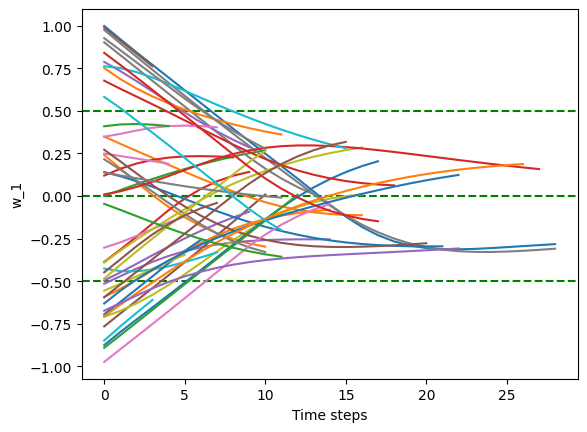

In [102]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims0[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('w_1')
plt.show()

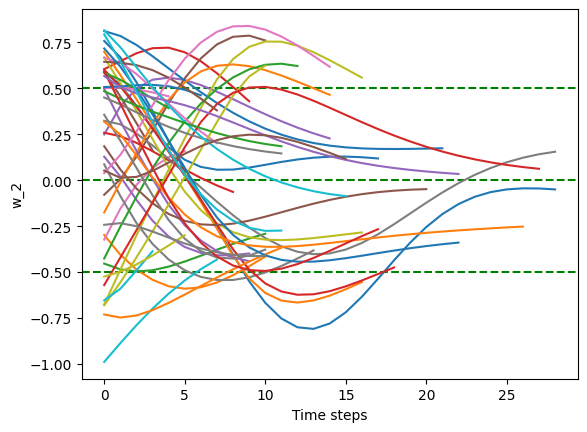

In [103]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims1[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('w_2')
plt.show()

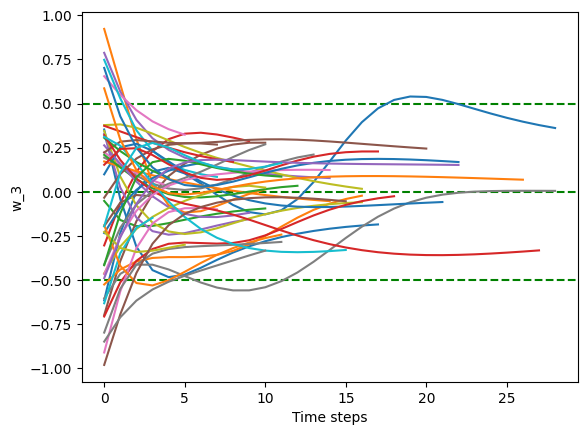

In [104]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims2[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('w_3')
plt.show()

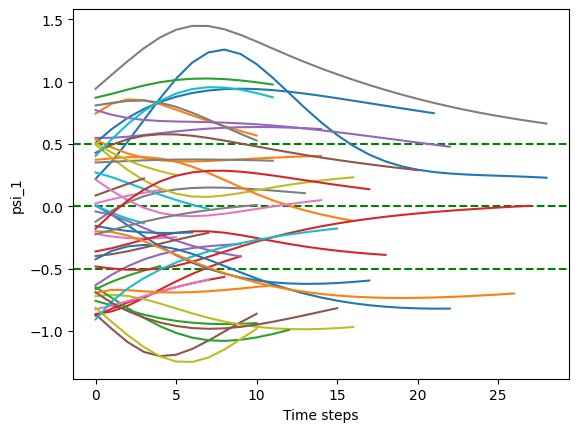

In [105]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims3[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('psi_1')
plt.show()

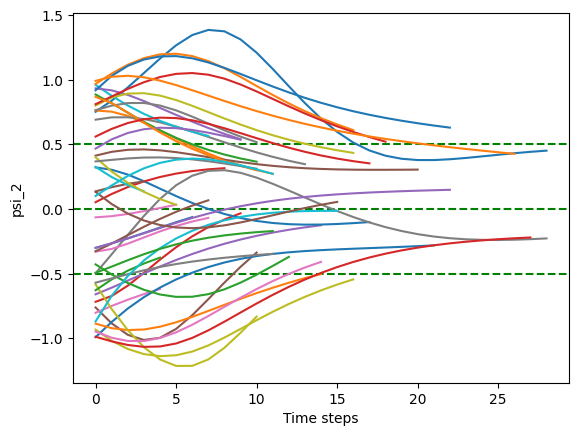

In [106]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims4[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('psi_2')
plt.show()

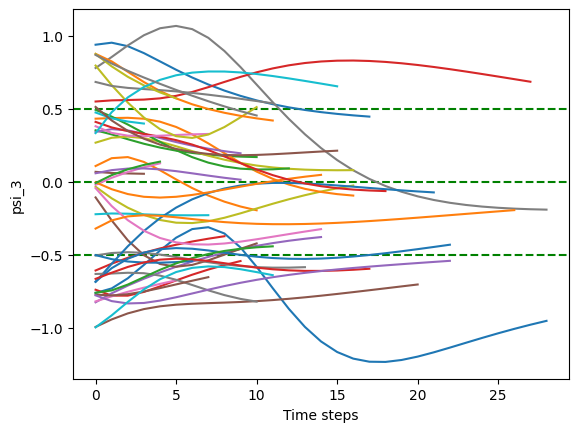

In [107]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims5[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('psi_3')
plt.show()

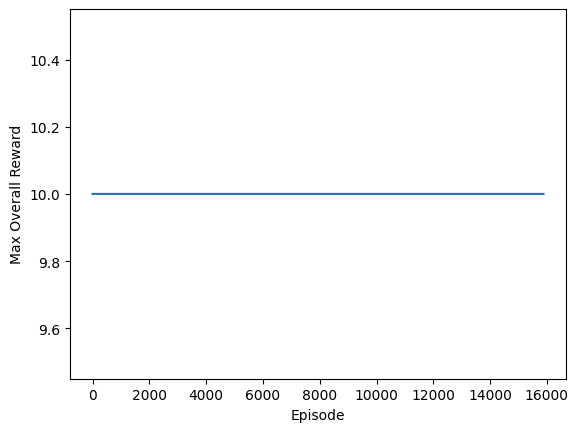

In [108]:
plt.plot(reward_history)
plt.xlabel('Episode')
plt.ylabel('Max Overall Reward')
plt.show()

In [94]:
len(reward_history)

1029